# Data Dictionary

**Case_id:** The case ID is generated when a patient first visits the hospital, and it is used throughout the patient's stay in the hospital to track their progress, update their medical records, and bill for their services. The case ID is also used to keep track of a patient's health information after they have been discharged from the hospital.

**Hospital:** Name of the Hospitals which are encoded.

**Hospital_type:** Type of the hospitals which are encoded.

  0: General hospital

  1: Specialty hospital
  
  2: Long -Term Care hospital
  
  3: Teaching hospitals

  4: Children’s hospital
  
  5: Rehabilitation hospital
  
  6: Other hospital types

**Hospital_city:** Hospitals placed in that city which are encoded.

**Hospital_region:** Region of the hospital

  0: Northern region

  1: Southern region

  2: Eastern region

**Available-Extra-Rooms-in-Hospital:** Number of extra rooms available in the hospital.

**Department:** Department overlooking the cases; “Radiotherapy”, “Anesthesia”,  ”Gynecology”, “TB & Chest disease” and “Surgery”.

**Ward_Type:** Specific type of ward in the hospital which are encoded as ['R', 'S', 'Q', 'P', 'T', 'U'].

  R: General ward

  S: Special ward

  Q: quarantine ward

  P: private ward

  T: Trauma ward

  U: Observation ward

**Ward_Facility:** Facilities of the ward type in the hospital which are encoded as  ['F', 'E', 'D','B', 'A', 'C'].

  A: General isolation ward for patients with mild COVID-19 symptoms

  B: High dependency unit for patients with moderate COVID-19 symptoms

  C: Intensive care unit for critically ill COVID-19 patients

  D: COVID-19 treatment center or facility for patients with COVID-19   requiring specialized treatment

  E: Emergency ward for COVID-19 patients with severe symptoms requiring immediate attention

  F: Fever clinic for COVID-19 screening and diagnosis

**Bed_Grade:** Condition of bed in the ward

  0: The bed is empty and available for a new patient.

  1: The bed is allocated to a patient who is not in critical condition and does not require ICU care.

  2: The bed is allocated to a patient who is in critical condition and requires ICU care.

  3: The bed is allocated to a patient who is on a ventilator.

  4: The bed is allocated to a patient who has recovered from COVID-19 and is ready for discharge.

**Patientid:** A patient ID, or patient identifier, is a unique code or number assigned to an individual patient by a hospital or healthcare facility to identify them within the facility's system.

**City_Code_Patient:** City code for the patient.

**Type of Admission:** Admission Type registered by the Hospital Admission Type registered by the Hospital. ['Emergency', 'Trauma', 'Urgent']

**Illness_Severity:** Severity of the illness recorded at the time of admission. ['Extreme', 'Moderate', 'Minor']

**Patient_Visitors:** Total number of visitors who come to  a hospital or healthcare facility to visit a patient who is receiving medical treatment or care.

**Age:** Age category. ['51-60', '71-80', '31-40', '41-50', '81-90', '61-70', '21-30','11-20', '0-10', '91-100']

**Admission_Deposit:** Payment deposited at the admission time.

**Stay_Days:** Stay Days by the patient (target) | ['0-10', '41-50','31-40', '11-20', '51-60', '21-30', '71-80', 'More than 100 Days','81-90', '61-70','91-100']

## Importing Reguired Libraries

In [3]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.model_selection import train_test_split, GridSearchCV,KFold,cross_val_score

from sklearn.linear_model import LogisticRegression
from sklearn.tree import   DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier,BaggingClassifier,GradientBoostingClassifier,RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix,classification_report,precision_score,recall_score,f1_score,roc_auc_score

from sklearn.pipeline import Pipeline
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import label_binarize

import lightgbm as ltb
from scipy  import stats
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import label_binarize
from lightgbm import LGBMClassifier
from sklearn import metrics
from sklearn.metrics import classification_report

In [5]:
plt.rc("font", size = 14)
plt.rcParams['figure.figsize']=[15,10]

sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)

# Data Preparation

## Read the data

In [4]:
plan_data=pd.read_csv('/content/drive/MyDrive/capstone project: Treatment Plan/host_train.csv')
plan_data.head()

,case_id,Hospital,Hospital_type,Hospital_city,Hospital_region,Available_Extra_Rooms_in_Hospital,Department,Ward_Type,Ward_Facility,Bed_Grade,patientid,City_Code_Patient,Type of Admission,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days
0,1,8,2,3,2,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,2,5,2,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,3,10,4,1,0,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,4,26,1,2,1,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,5,26,1,2,1,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50


### Let us see the number of observations

In [ ]:
plan_data.shape

(318438, 18)

**Interpretation:** The dataset has `318438 observations` and `18 features`.

## Checking the datatypes of the dataset

In [ ]:
plan_data.dtypes

case_id                                int64
Hospital                               int64
Hospital_type                          int64
Hospital_city                          int64
Hospital_region                        int64
Available_Extra_Rooms_in_Hospital      int64
Department                            object
Ward_Type                             object
Ward_Facility                         object
Bed_Grade                            float64
patientid                              int64
City_Code_Patient                    float64
Type of Admission                     object
Illness_Severity                      object
Patient_Visitors                       int64
Age                                   object
Admission_Deposit                    float64
Stay_Days                             object
dtype: object

**Interpretation:** As we already know there are total of 18 features. From these features `case_id` & `patientid` are unique identification datas for hospital related details. `Hospital, Hospital_type, Hospital_city, Hospital_region, City_Code_Patient,Bed_Grade` are actually `categorical datatypes` but encoded it as `numeric datatypes`. `Department, Ward_Type, Ward_Facility, Type of Admission, Illness_Severity` are categorical dataypes which we want to do feature encoding, for further analysis. `Age, Stay_Days` are range values so defined it as categorical datatype. `Available_Extra_Rooms_in_Hospital, Patient_Visitors, Admission_Deposit` are numerical datatypes.

# Removing the unnecessary features

In [6]:
plan_data.drop(['case_id','patientid'],axis=1,inplace=True)

**Interpretation:** Case_id,patientid are a unique feature that gives the information about the case and  the patient in the hospital. We are not infering anything from this features. so, we are removing these.

# Checking for duplicated values


In [7]:
plan_data[plan_data.duplicated()]

,Hospital,Hospital_type,Hospital_city,Hospital_region,Available_Extra_Rooms_in_Hospital,Department,Ward_Type,Ward_Facility,Bed_Grade,City_Code_Patient,Type of Admission,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days
576,14,0,1,0,4,gynecology,Q,E,2.0,9.0,Trauma,Moderate,4,31-40,4414.0,21-30
1179,28,1,11,0,2,gynecology,R,F,4.0,8.0,Trauma,Moderate,4,81-90,4944.0,31-40
2356,13,0,5,2,4,anesthesia,R,F,4.0,1.0,Trauma,Extreme,3,41-50,4025.0,71-80
2358,23,0,6,0,2,anesthesia,R,F,2.0,1.0,Urgent,Extreme,6,41-50,3538.0,51-60
15738,23,0,6,0,2,gynecology,R,F,3.0,8.0,Urgent,Moderate,10,51-60,4469.0,More than 100 Days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295923,4,0,4,0,2,gynecology,R,F,3.0,10.0,Emergency,Extreme,2,61-70,4151.0,21-30
298233,23,0,6,0,2,gynecology,Q,F,4.0,8.0,Trauma,Minor,8,51-60,4181.0,More than 100 Days
298234,23,0,6,0,2,gynecology,Q,F,4.0,8.0,Trauma,Minor,8,51-60,4181.0,More than 100 Days
304087,22,6,9,1,1,TB & Chest disease,S,B,1.0,6.0,Urgent,Moderate,4,31-40,5317.0,21-30


**Interpretation:** 152 patients details are got duplicated which may bias the model, so we are removing the duplicated observations.

#### Removing the duplicated entries.




In [8]:
plan_data.drop_duplicates(inplace=True)

In [ ]:
plan_data.shape # Checking the observations and the features after droping the duplicated observations.

(318286, 16)

## Splitting the dataset into numerical & categorical data for analysis

In [9]:
num_data=plan_data[['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit']]
num_data

,Available_Extra_Rooms_in_Hospital,Patient_Visitors,Admission_Deposit
0,3,2,4911.0
1,2,2,5954.0
2,2,2,4745.0
3,2,2,7272.0
4,2,2,5558.0
...,...,...,...
318433,3,3,4144.0
318434,2,4,6699.0
318435,3,3,4235.0
318436,3,5,3761.0


In [10]:
cat_data=plan_data.drop(['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit'],axis=1)
cat_data

,Hospital,Hospital_type,Hospital_city,Hospital_region,Department,Ward_Type,Ward_Facility,Bed_Grade,City_Code_Patient,Type of Admission,Illness_Severity,Age,Stay_Days
0,8,2,3,2,radiotherapy,R,F,2.0,7.0,Emergency,Extreme,51-60,0-10
1,2,2,5,2,radiotherapy,S,F,2.0,7.0,Trauma,Extreme,51-60,41-50
2,10,4,1,0,anesthesia,S,E,2.0,7.0,Trauma,Extreme,51-60,31-40
3,26,1,2,1,radiotherapy,R,D,2.0,7.0,Trauma,Extreme,51-60,41-50
4,26,1,2,1,radiotherapy,S,D,2.0,7.0,Trauma,Extreme,51-60,41-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...
318433,6,0,6,0,radiotherapy,Q,F,4.0,23.0,Emergency,Moderate,41-50,11-20
318434,24,0,1,0,anesthesia,Q,E,4.0,8.0,Urgent,Moderate,81-90,31-40
318435,7,0,4,0,gynecology,R,F,4.0,10.0,Emergency,Minor,71-80,11-20
318436,11,1,2,1,anesthesia,Q,D,3.0,8.0,Trauma,Minor,11-20,11-20


### Descriptive statistics

In [ ]:
num_data.describe()

,Available_Extra_Rooms_in_Hospital,Patient_Visitors,Admission_Deposit
count,318286.000000,318286.000000,318286.000000
mean,3.197797,3.283757,4880.782406
std,1.168239,1.763216,1086.816289
min,0.000000,0.000000,1800.000000
25%,2.000000,2.000000,4186.000000
50%,3.000000,3.000000,4741.000000
75%,4.000000,4.000000,5409.000000
max,24.000000,32.000000,11008.000000


**Interpretation:** The above output gives the summary statistics for the numerical features which are total number of `records; mean, median, min, max and quartile` values.

# Checking for missing values

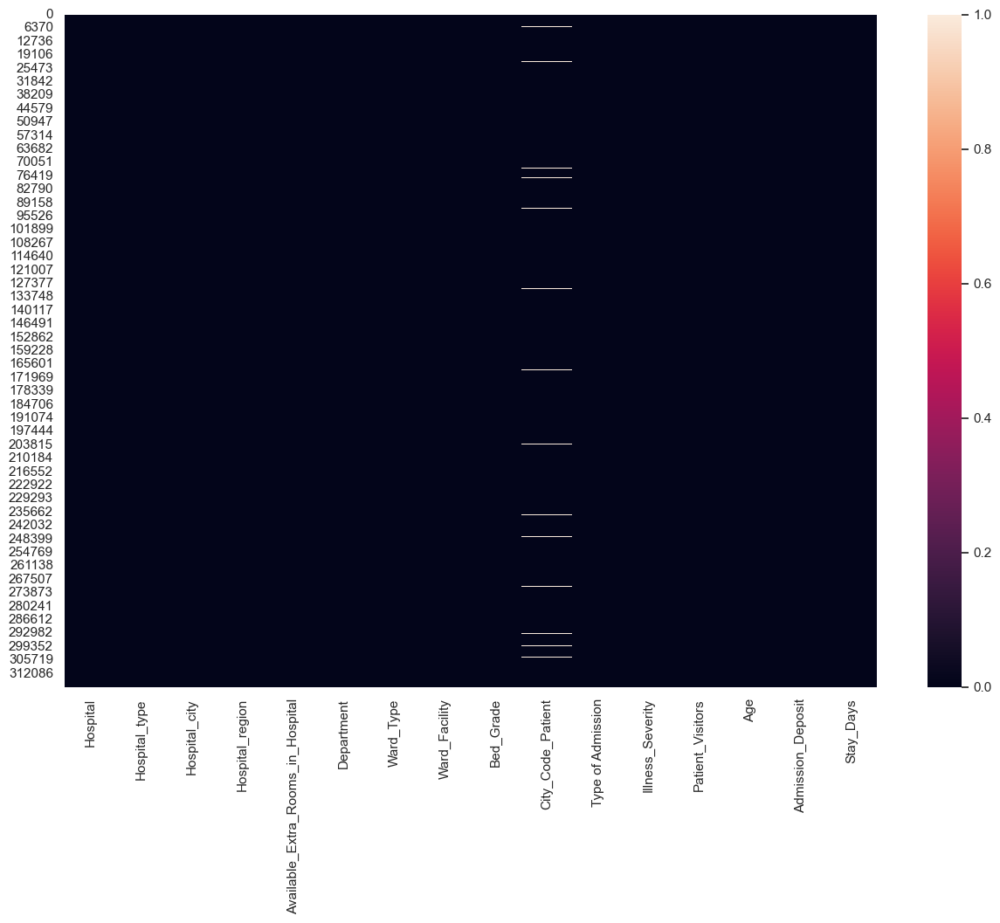

In [ ]:
sns.heatmap(plan_data.isna())
plt.show()

In [ ]:
total=plan_data.isna().sum()
per=plan_data.isna().sum()/len(plan_data)*100
missing_values=pd.DataFrame({'Total':total,'Percentage':per})
missing_values

,Total,Percentage
Hospital,0,0.000000
Hospital_type,0,0.000000
Hospital_city,0,0.000000
Hospital_region,0,0.000000
Available_Extra_Rooms_in_Hospital,0,0.000000
Department,0,0.000000
Ward_Type,0,0.000000
Ward_Facility,0,0.000000
Bed_Grade,113,0.035503
City_Code_Patient,4531,1.423562


**Interpretation:** In city_code_patient nearly 1.5% values are missing and in Bed_Grade nearly 0.04% values are missing. There is no pattern to match the missing values. Since this is a large dataset. removing these null values doesnot affect the model.

In [ ]:
plan_data.shape

(318286, 16)

In [ ]:
plan_data.dropna(inplace=True)

In [ ]:
plan_data.shape

(313642, 16)

In [ ]:
undersample=plan_data.copy()

In [ ]:
num_data=plan_data[['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit']]
cat_data=plan_data.drop(['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit'],axis=1)

# Univariate Analysis



In [ ]:
num_data.skew()

Available_Extra_Rooms_in_Hospital    0.975581
Patient_Visitors                     3.146503
Admission_Deposit                    0.930218
dtype: float64

**Interpretation:** On checking the skewness of these features. We infered that there may be a chance of outliers or noise on the observations.

**Analysis for independent features**

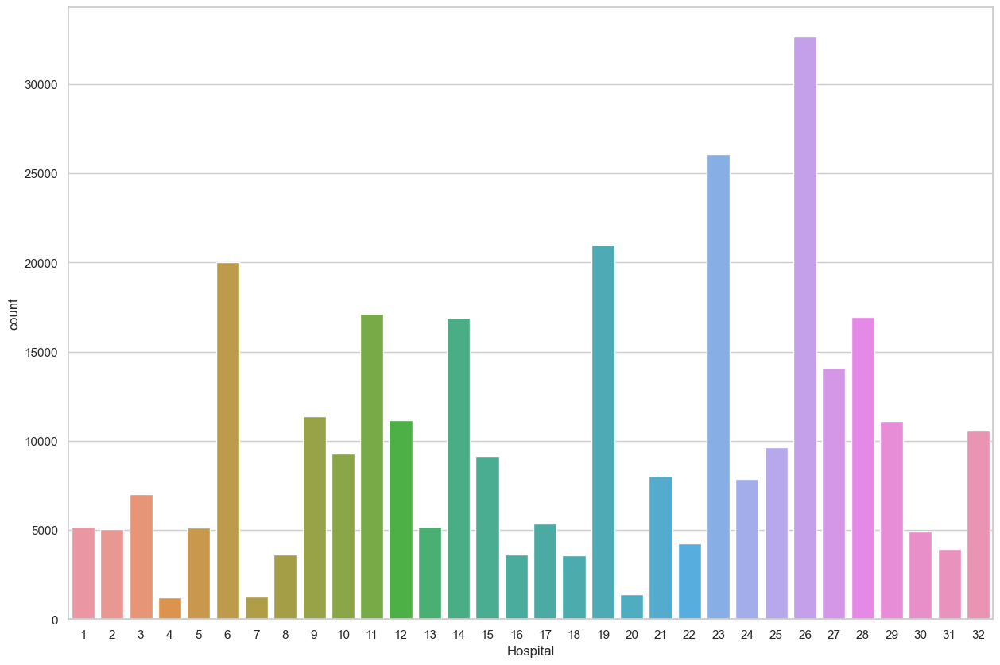

In [ ]:
sns.countplot(data=plan_data,x='Hospital')
plt.show()

**Interpretation:**
* Comparing to other hospitals, hospital 26 may have more number of patients details.
* Hospital 6,19,23 are may have patients details more than 20000 but lesser than hospital 26.
* Hospital 4,7,8,16,18,20,22,30,31 are may have patients details lesser than 5000.

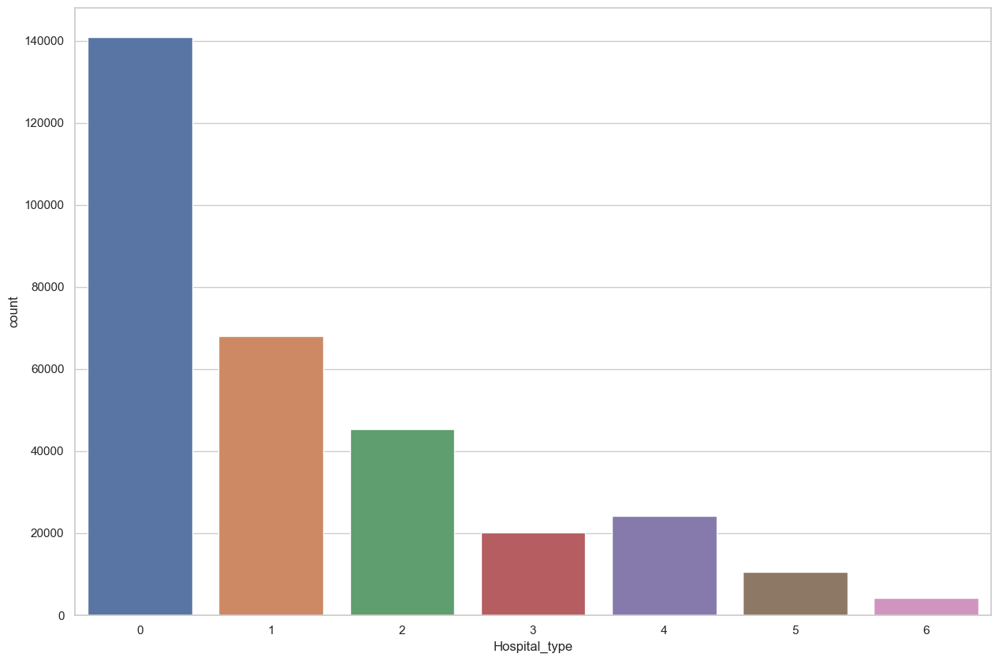

In [ ]:
sns.countplot(data=plan_data,x='Hospital_type')
plt.show()

**Interpretation:**
* More number of patients are admiting on the general hospital

In [ ]:
plan_data['Hospital_city'].unique()

array([ 3,  5,  1,  2,  6,  9, 10,  4, 11,  7, 13], dtype=int64)

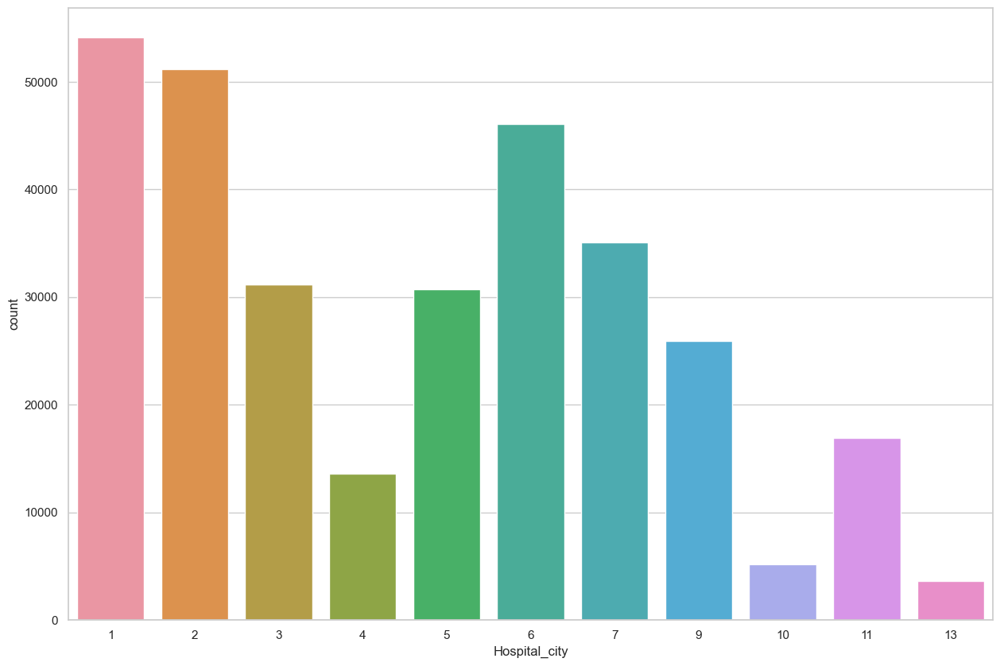

In [ ]:
sns.countplot(x=plan_data['Hospital_city'])
plt.show()

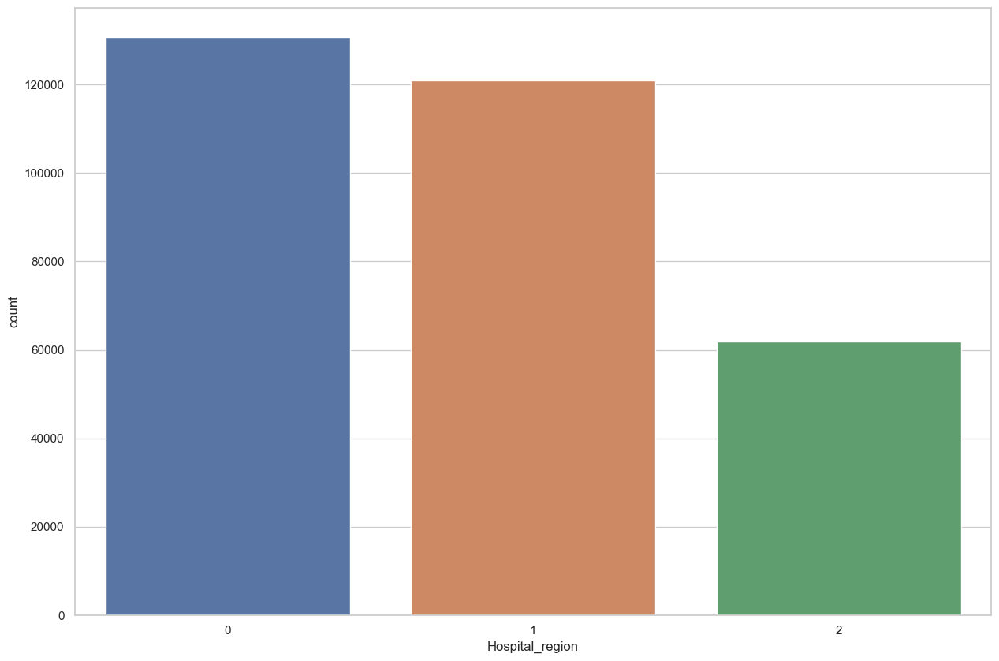

In [ ]:
sns.countplot(x=plan_data['Hospital_region'])
plt.show()

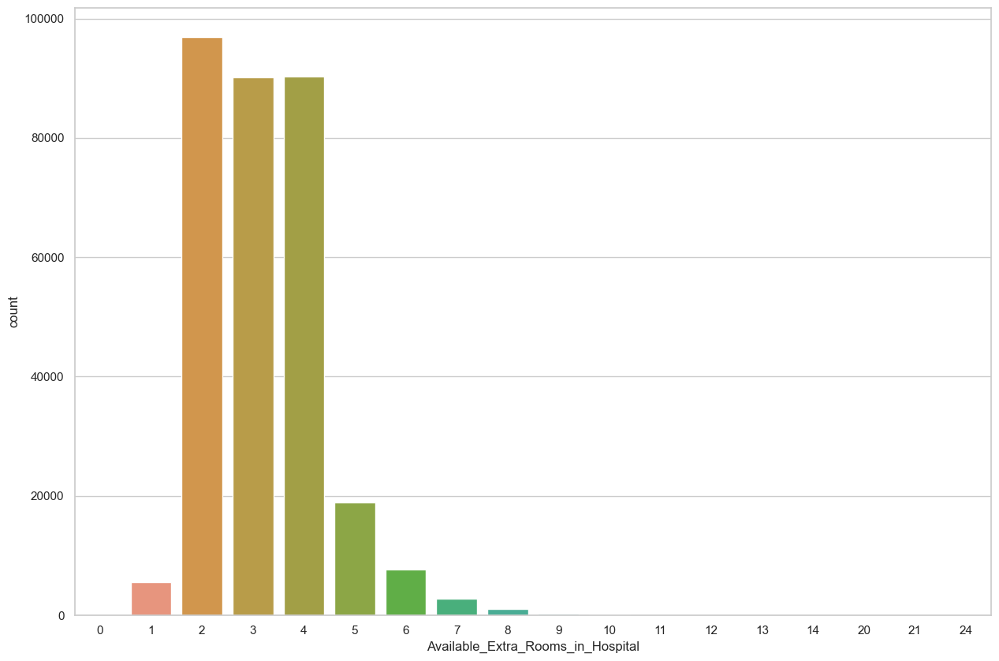

In [ ]:
sns.countplot(x=plan_data['Available_Extra_Rooms_in_Hospital'])
plt.show()

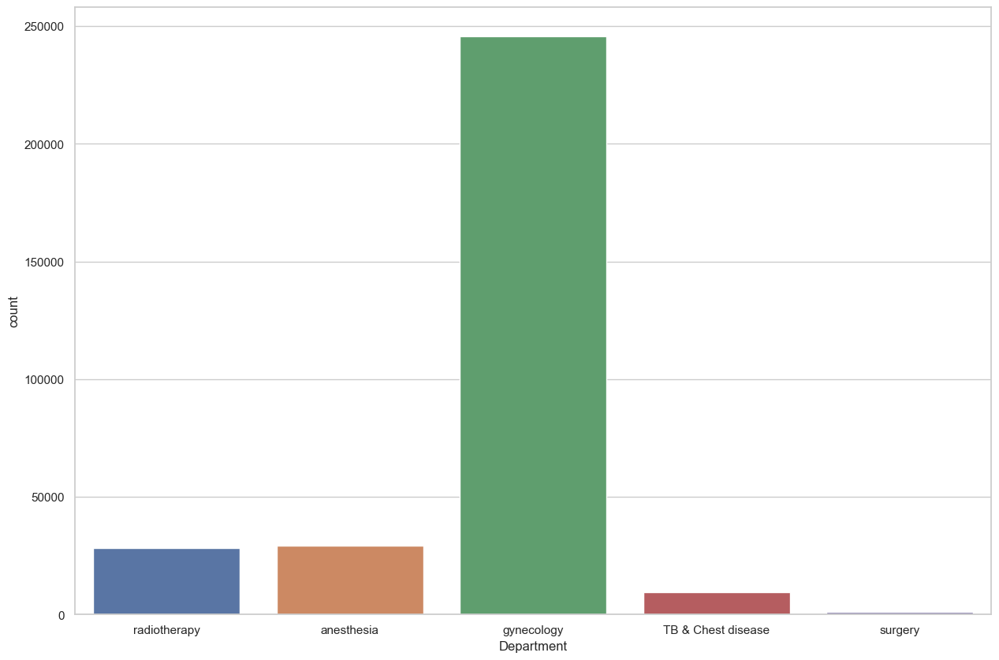

In [ ]:
sns.countplot(x=plan_data['Department'])
plt.show()

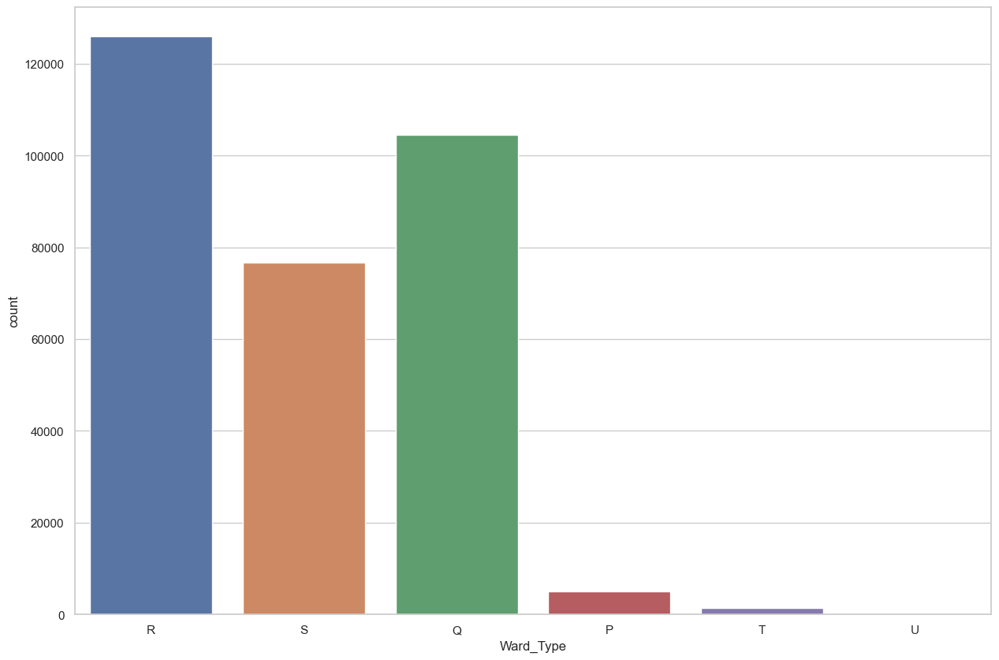

In [ ]:
sns.countplot(x=plan_data['Ward_Type'])
plt.show()

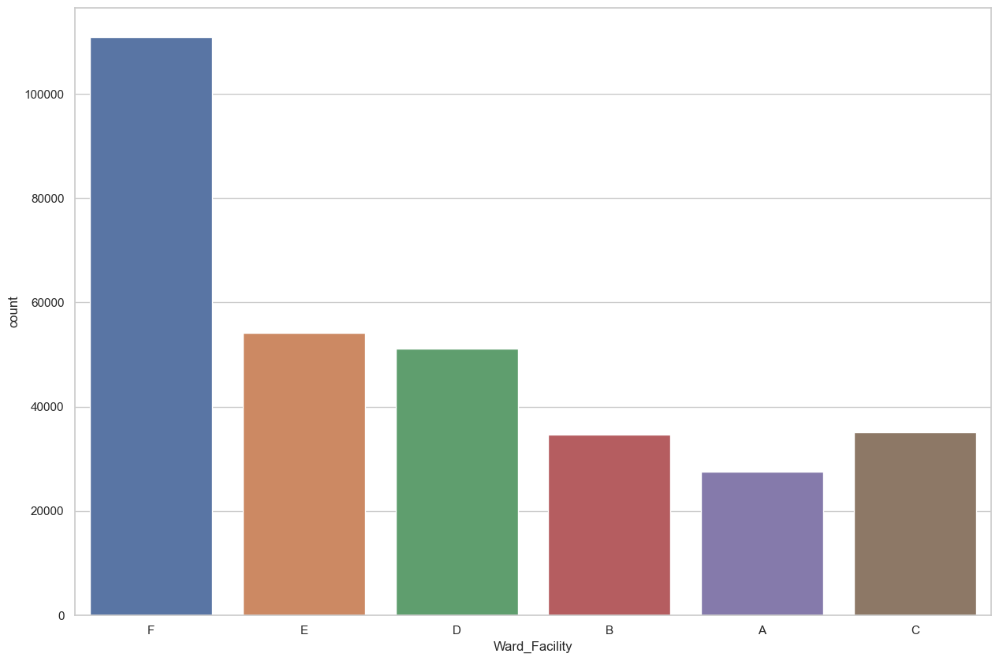

In [ ]:
sns.countplot(x=plan_data['Ward_Facility'])
plt.show()

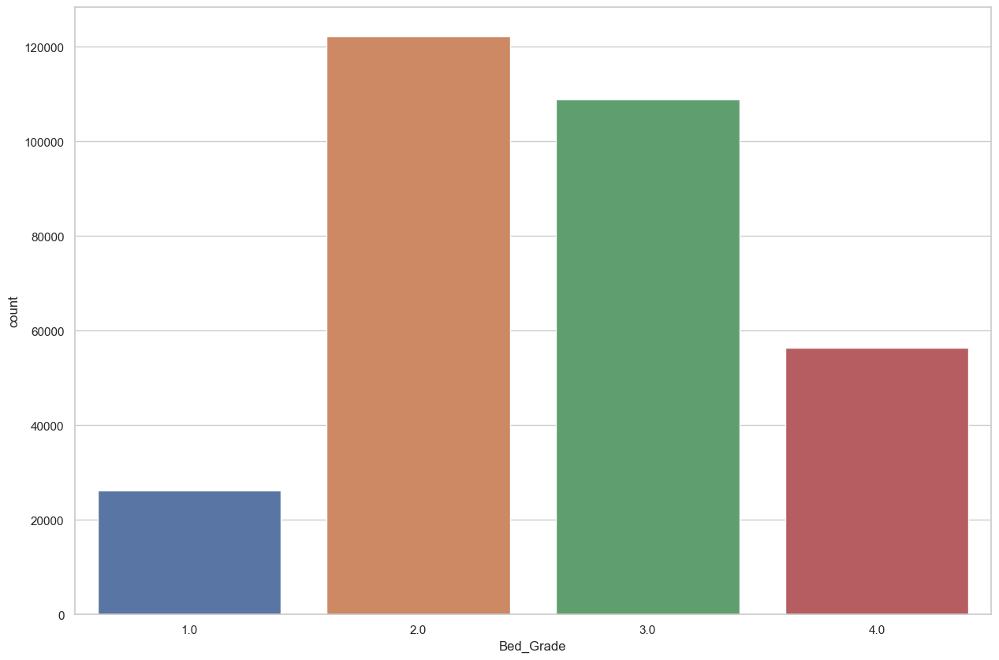

In [ ]:
sns.countplot(x=plan_data['Bed_Grade'])
plt.show()

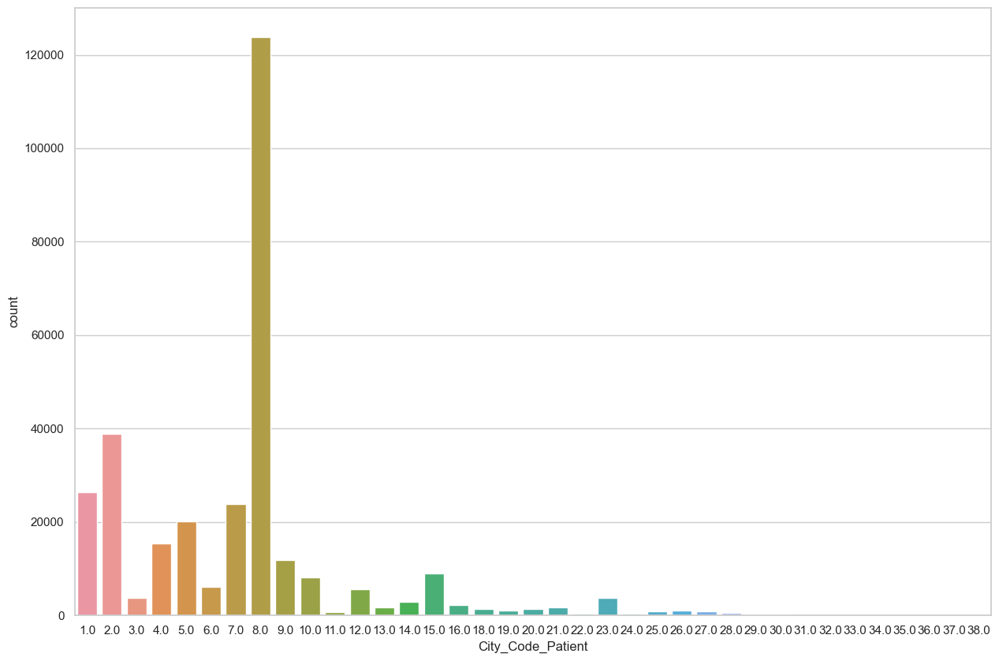

In [ ]:
sns.countplot(x=plan_data['City_Code_Patient'])
plt.show()

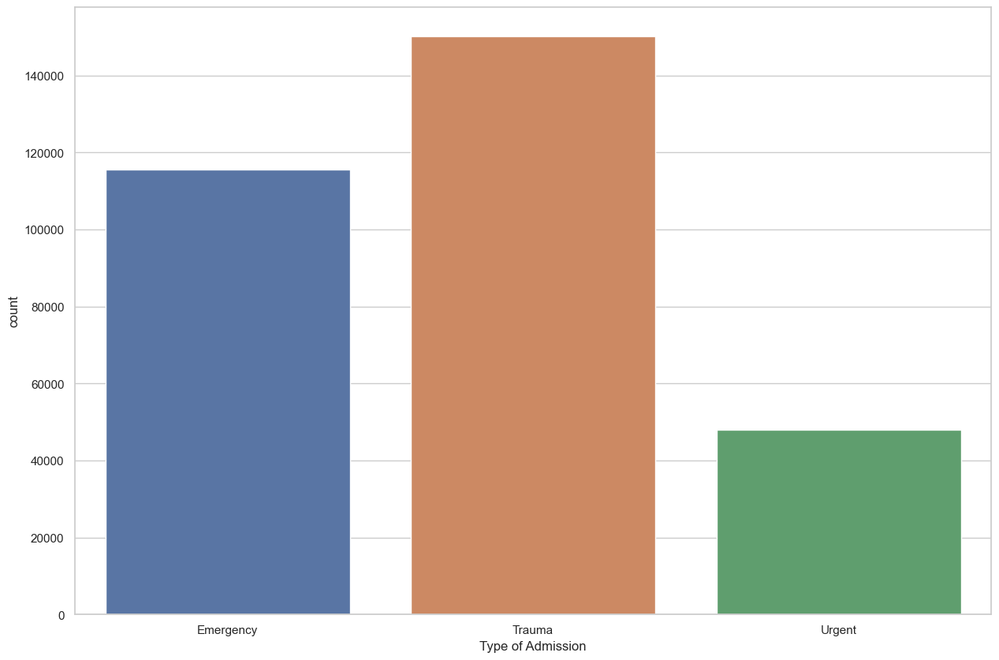

In [ ]:
sns.countplot(x=plan_data['Type of Admission'])
plt.show()

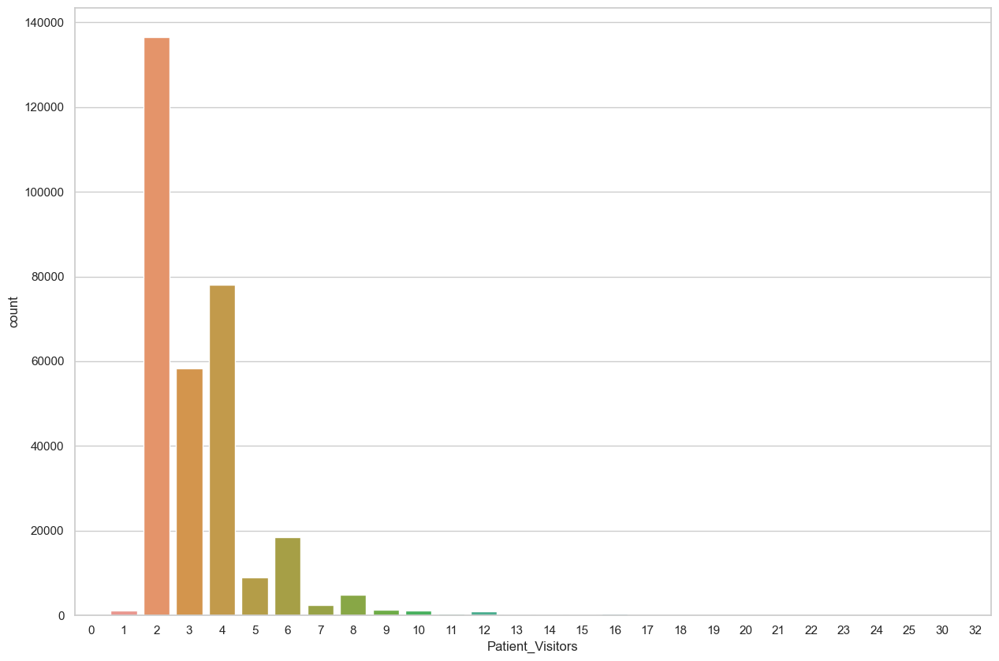

In [ ]:
sns.countplot(x=plan_data['Patient_Visitors'])
plt.show()

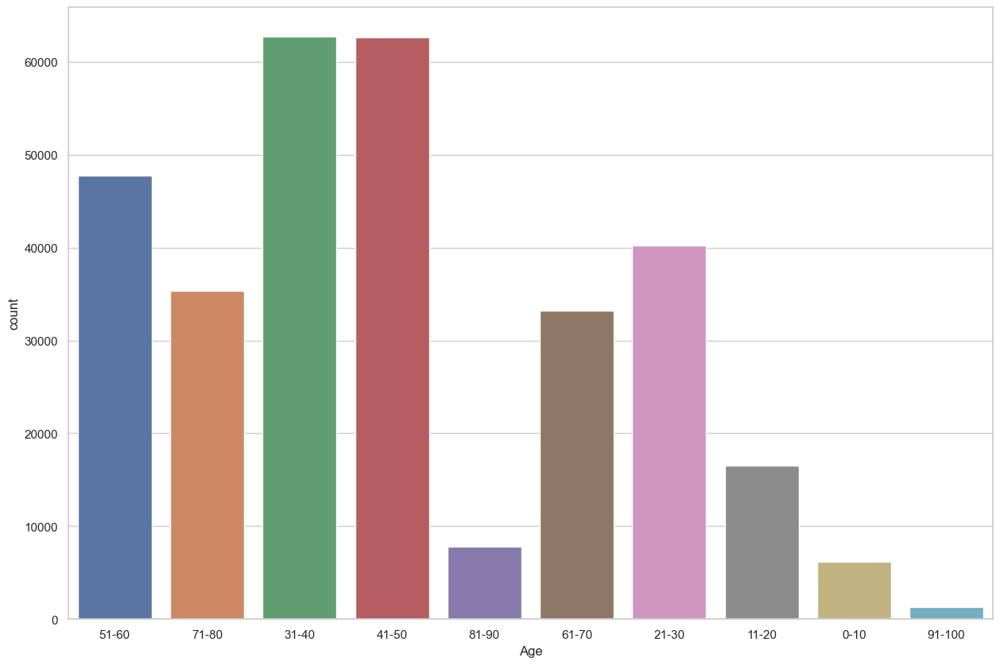

In [ ]:
sns.countplot(x=plan_data['Age'])
plt.show()

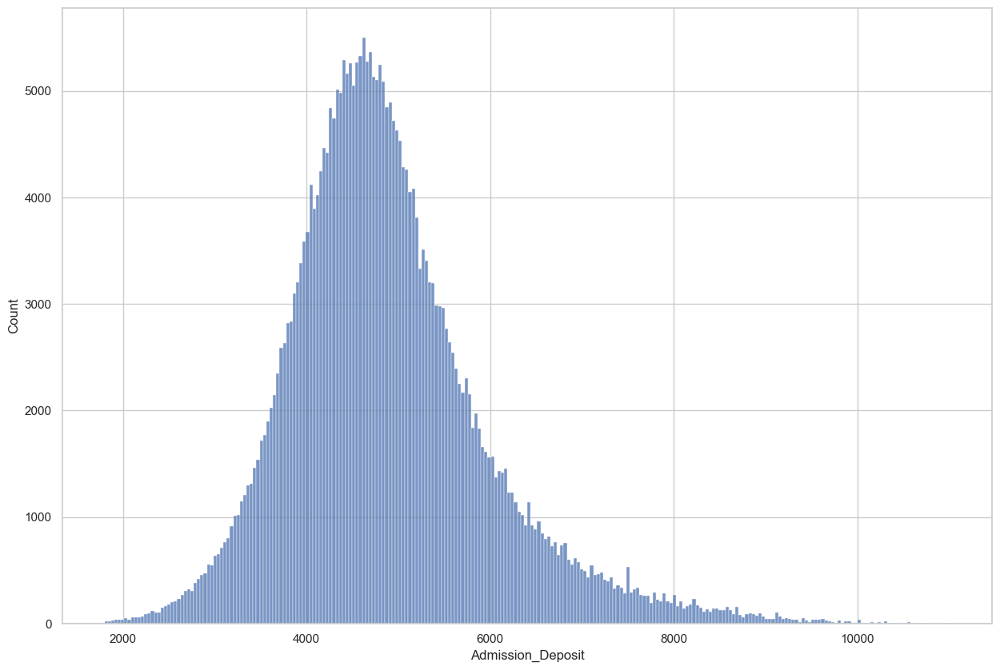

In [ ]:
sns.histplot(x=plan_data['Admission_Deposit'])
plt.show()

**Analysis for dependent feature**

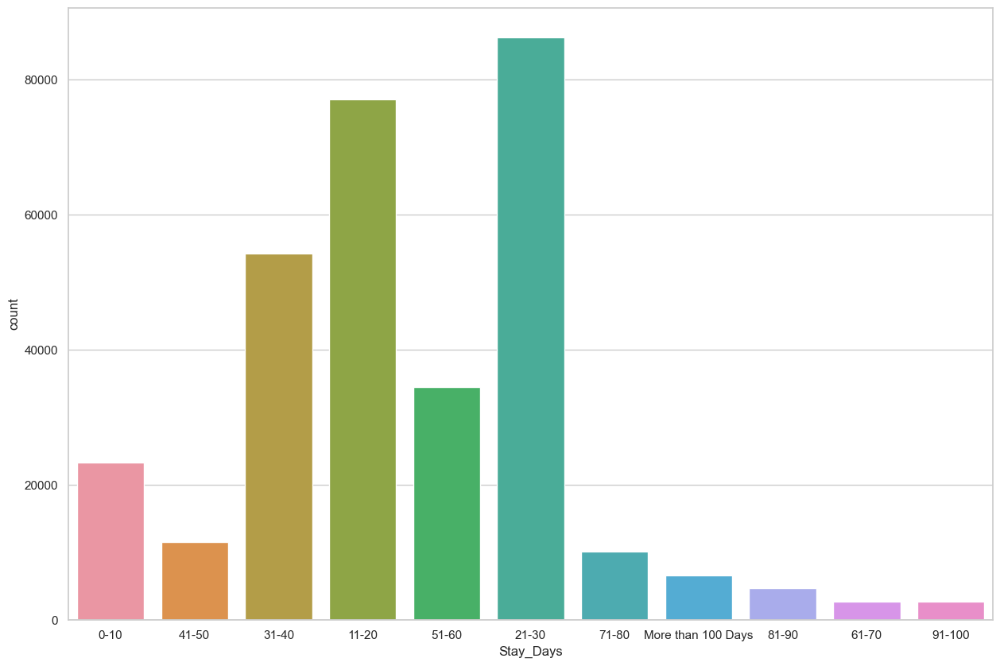

In [ ]:
plt.figure(figsize=(15,10))
sns.countplot(x=plan_data['Stay_Days'])
plt.show()

In [ ]:
plan_data.Stay_Days.replace({'0-10':0,'11-20':0,'21-30':1,'31-40':2,'41-50':2,'51-60':3,'61-70':3,'71-80':3,'81-90':3,'91-100':3,'More than 100 Days':3},inplace=True)

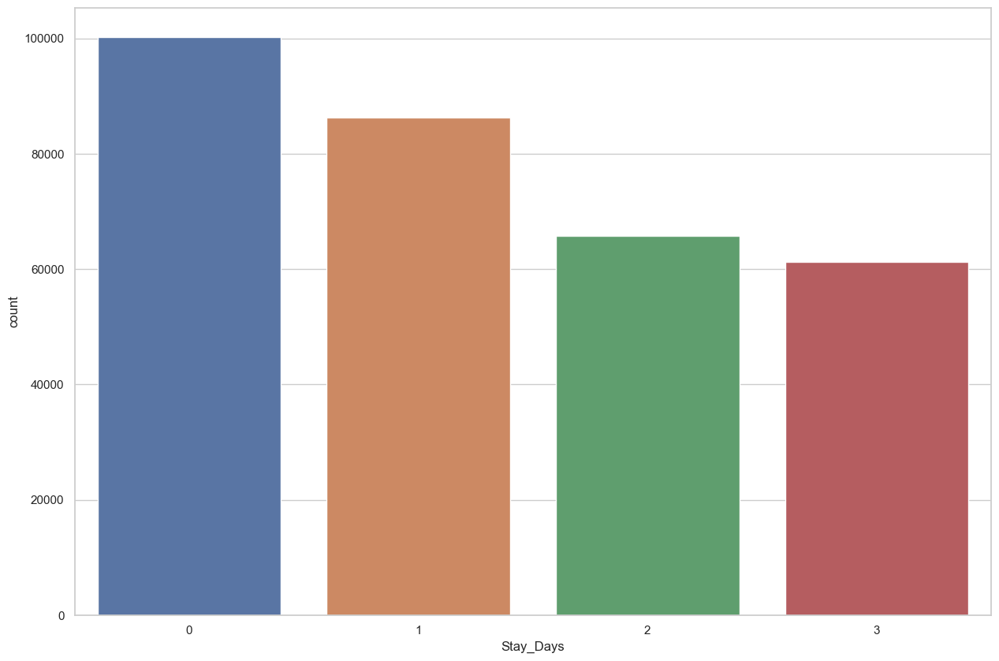

In [ ]:
plt.figure(figsize=(15,10))
sns.countplot(x=plan_data['Stay_Days'])
plt.show()

# Bivariate Analysis

**Analysis with the independent feature and dependent feature**

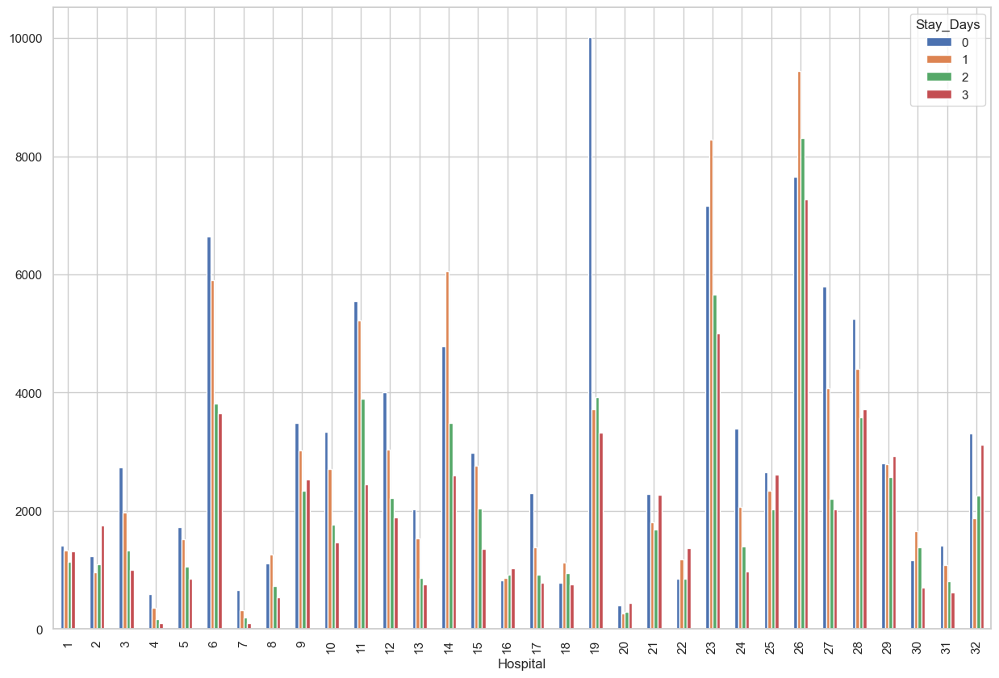

In [ ]:
pd.crosstab(plan_data['Hospital'],plan_data['Stay_Days']).plot(kind='bar')
plt.show()

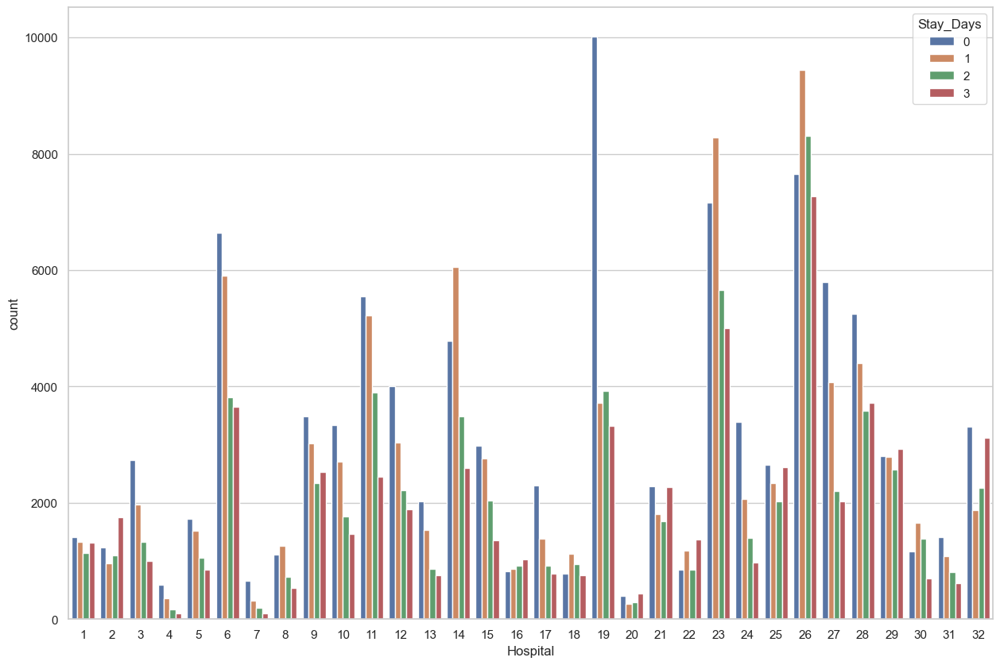

In [ ]:
sns.countplot(x=plan_data['Hospital'],hue=plan_data['Stay_Days'])
plt.show()

**Interpretation:**
* From the plot as we infer that more number of patients are staying in the hospital around 21-30 days.
* But in hospital 19 more number of patients are staying around 11-20 days
* Number of patients staying in the hospital for 0 - 10 days is least comparing to other staying days.

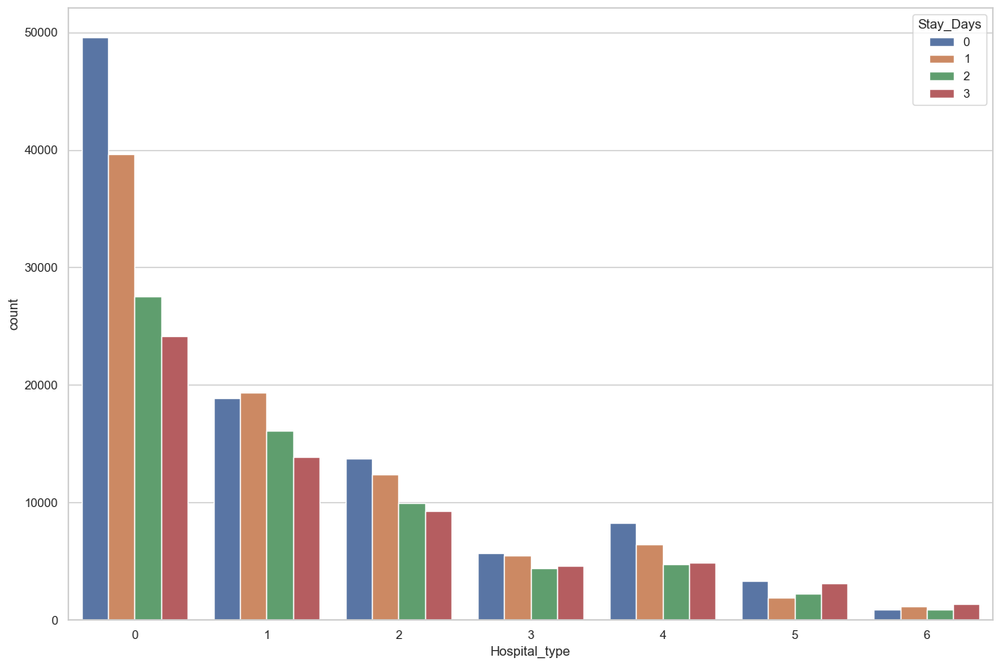

In [ ]:
sns.countplot(x=plan_data['Hospital_type'],hue=plan_data['Stay_Days'])
plt.show()

**Interpretation:**
* In the general hospital, maximum number of patient's staying days around 11 - 20 as well as 21 - 30 days.
* In the speciality hospital, maximum number of patient's staying days around 21-30 days
* In the rehabilitation hospital, minimum number of patient's staying days around 0-10 days

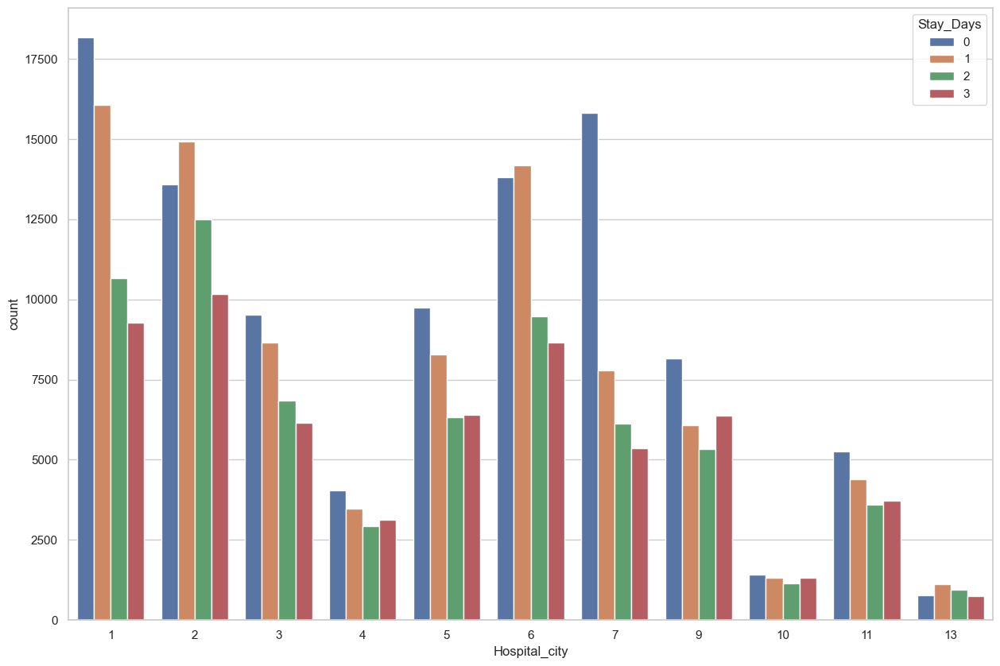

In [ ]:
sns.countplot(x=plan_data['Hospital_city'],hue=plan_data['Stay_Days'])
plt.show()

**Interpretation:** 
* From the plot we infer that Maximum number of patients staying days in all the cities around 21-30 days except city 7.
* The minimum number of patients staying days in any of the hospital city around 0 - 10 days.

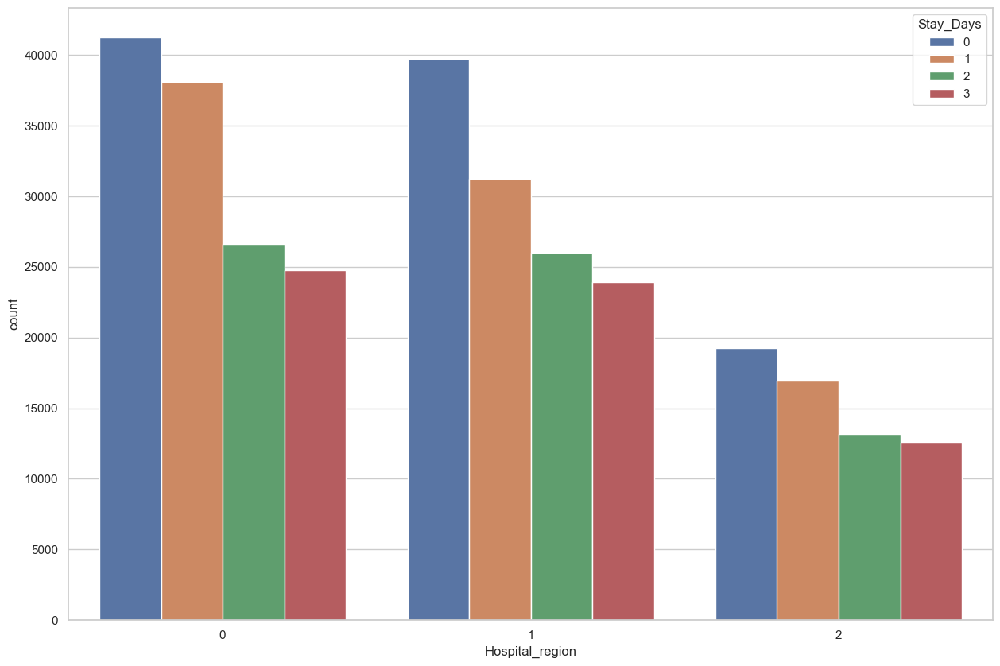

In [ ]:
sns.countplot(data=plan_data,x='Hospital_region',hue='Stay_Days')
plt.show()

**Interpretation:**
* As we infer that the patient's staying days in around 21-30 days for all the hospital region is maximum comparing to other stayind days.
* Patient staying days in around 0 - 10 is least comparing to other staying days for all the hospital region.

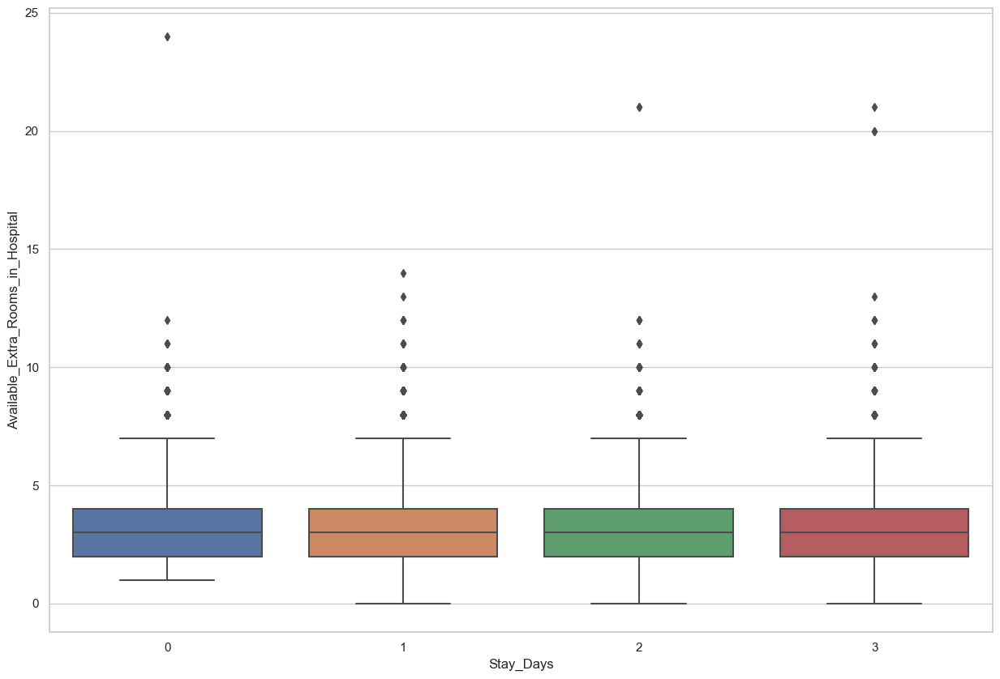

In [ ]:
sns.boxplot(data=plan_data,y='Available_Extra_Rooms_in_Hospital',x='Stay_Days')
plt.show()

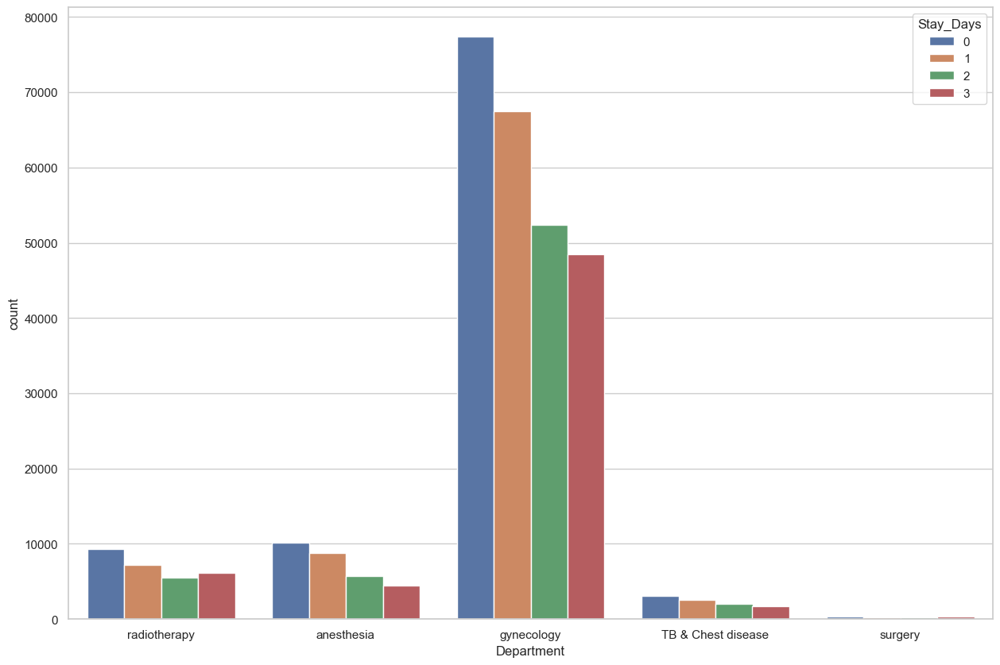

In [ ]:
sns.countplot(data=plan_data,x='Department',hue='Stay_Days')
plt.show()

**Interpretation:**
* AS we infer from the above plot the patient staying days 21-30 days is comparitively more in gynecology department.
* In surgery department patient staying days is low comparing to other departments.

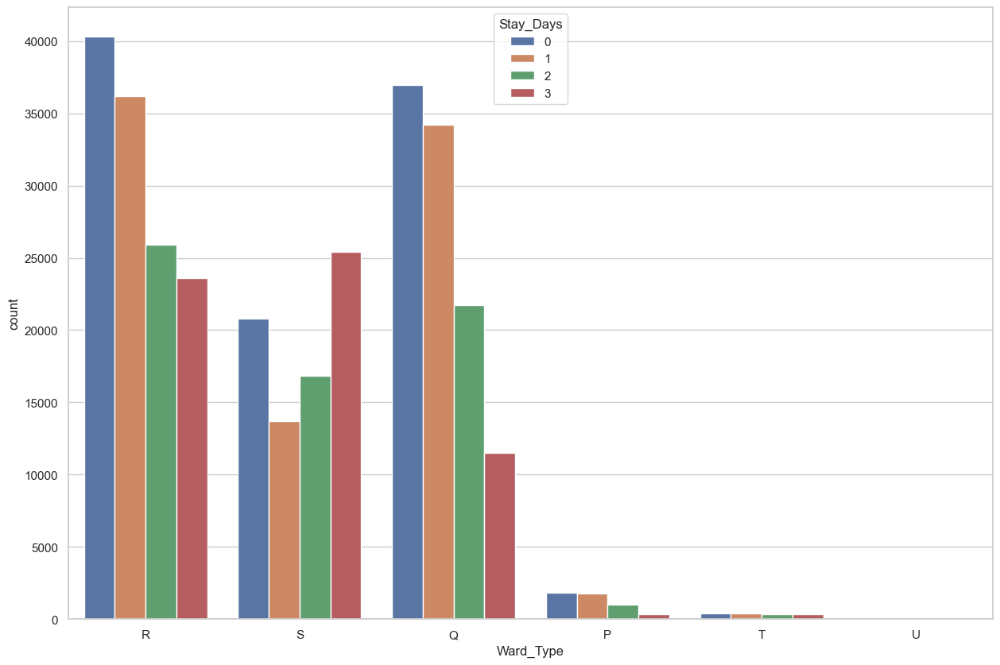

In [ ]:
sns.countplot(data=plan_data,x='Ward_Type',hue='Stay_Days')
plt.show()

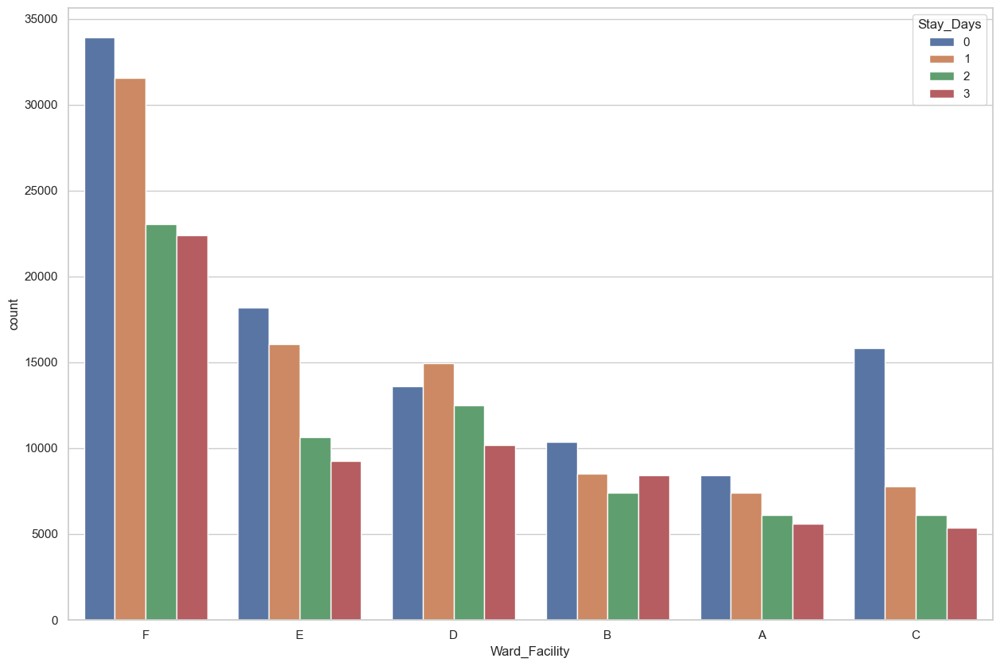

In [ ]:
sns.countplot(data=plan_data,x='Ward_Facility',hue='Stay_Days')
plt.show()

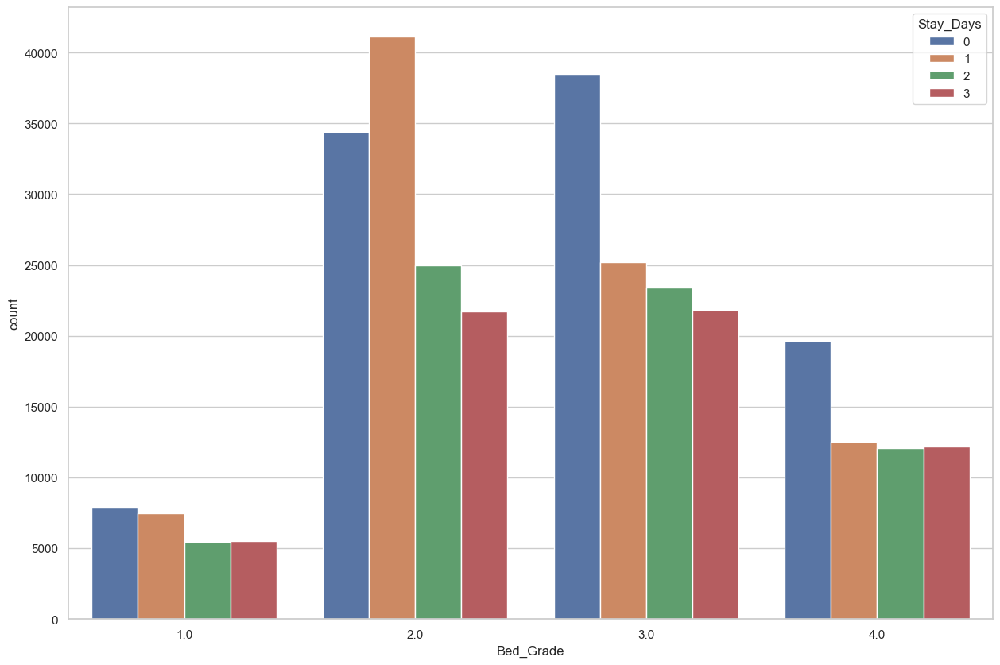

In [ ]:
sns.countplot(data=plan_data,x='Bed_Grade',hue='Stay_Days')
plt.show()

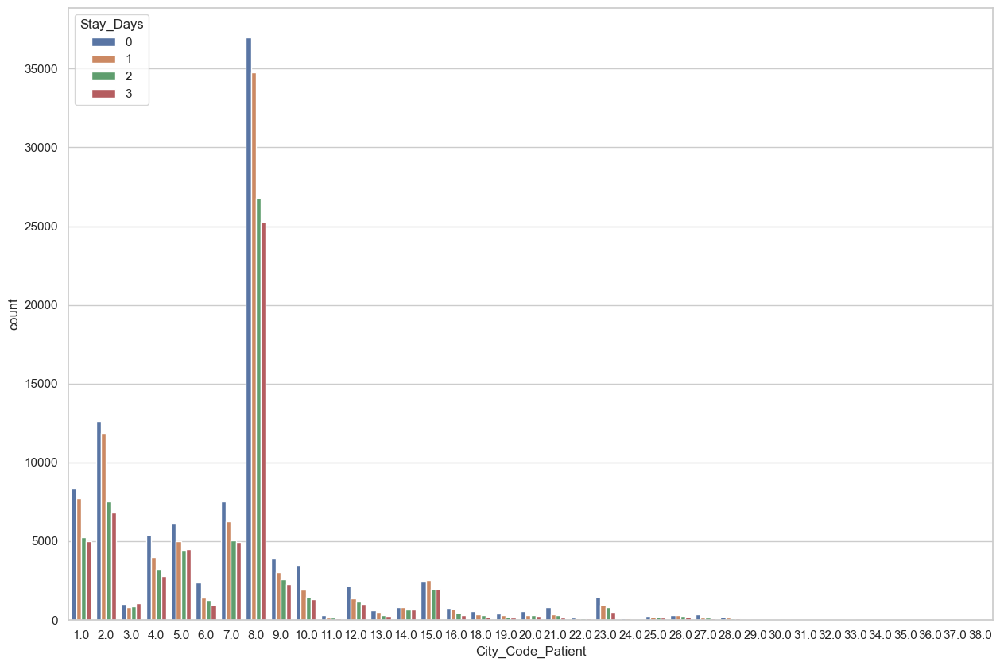

In [ ]:
sns.countplot(data=plan_data,x='City_Code_Patient',hue='Stay_Days')
plt.show()

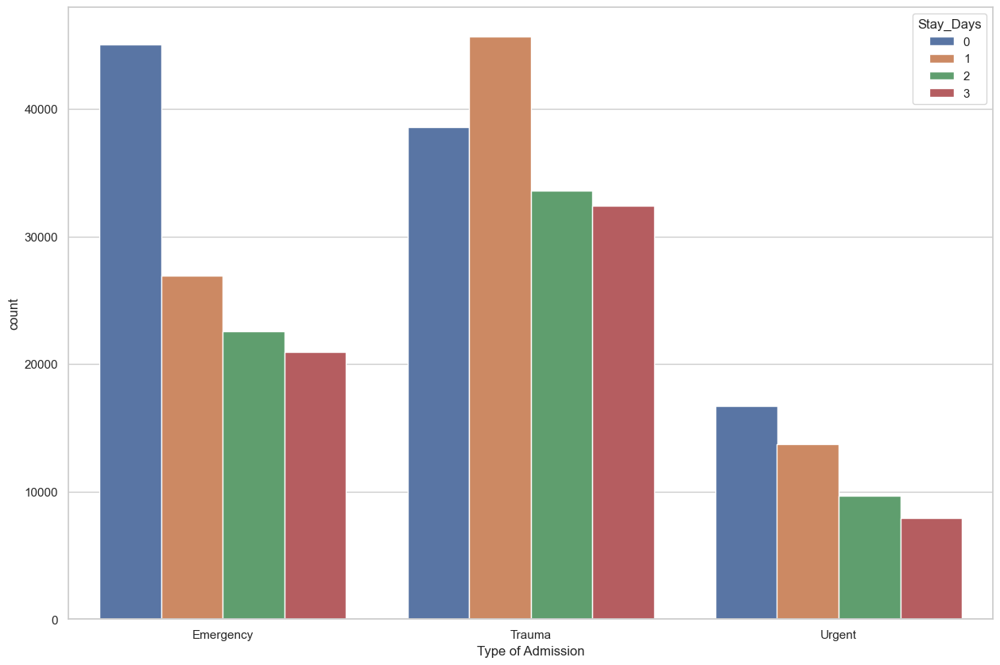

In [ ]:
sns.countplot(data=plan_data,x='Type of Admission',hue='Stay_Days')
plt.show()

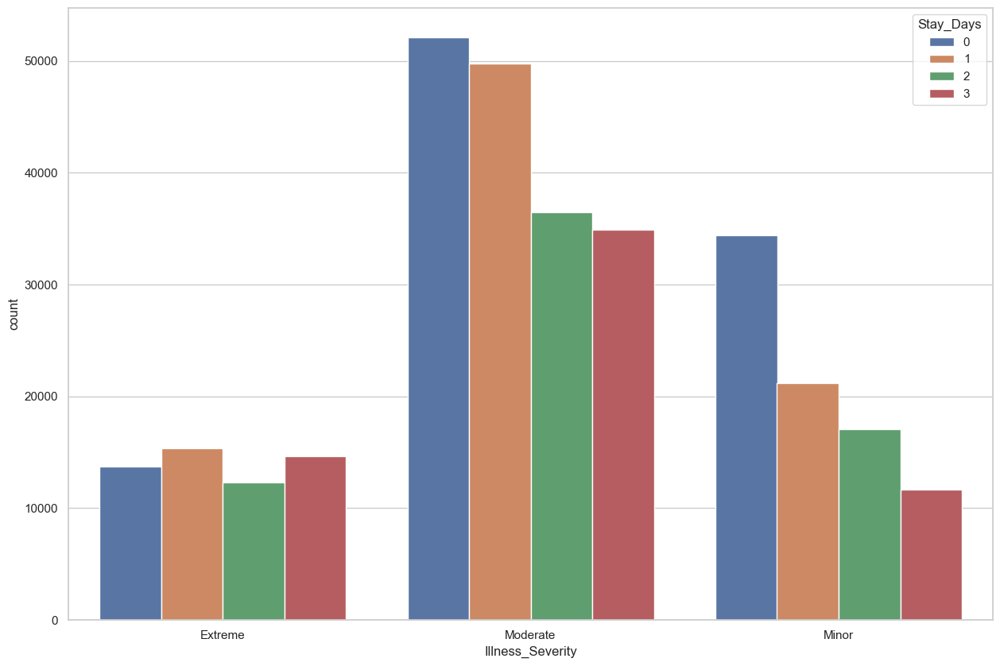

In [ ]:
sns.countplot(data=plan_data,x='Illness_Severity',hue='Stay_Days')
plt.show()

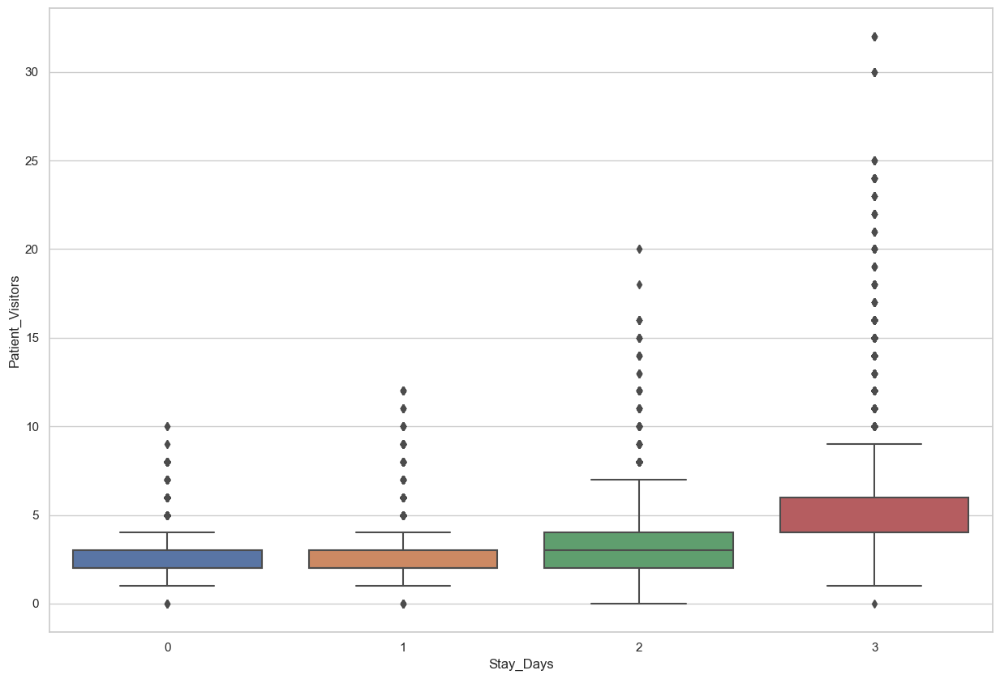

In [ ]:
sns.boxplot(data=plan_data,y='Patient_Visitors',x='Stay_Days')
plt.show()

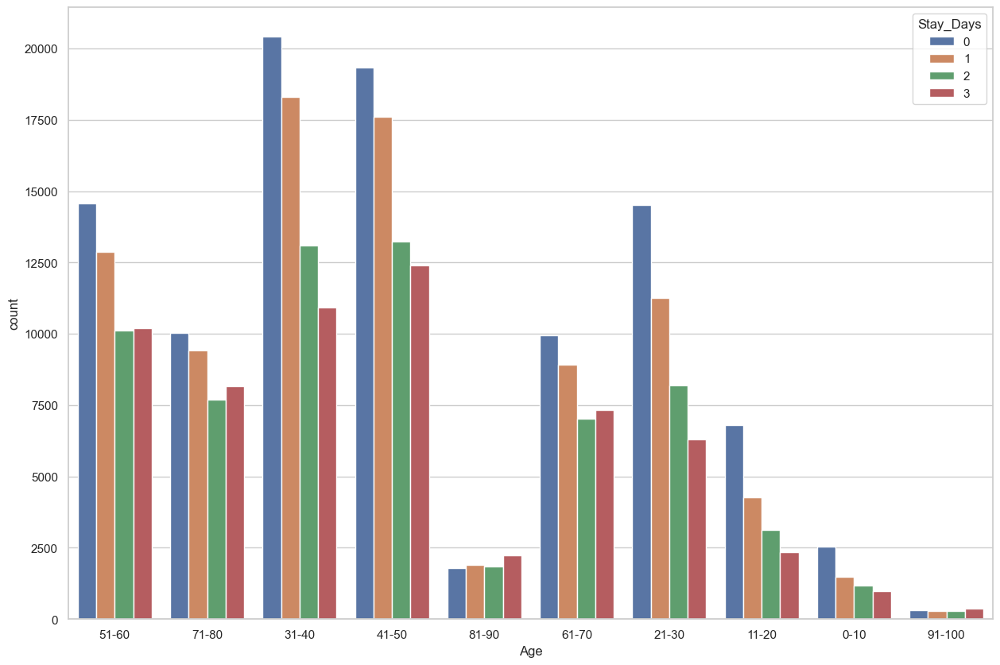

In [ ]:
sns.countplot(data=plan_data,x='Age',hue='Stay_Days')
plt.show()

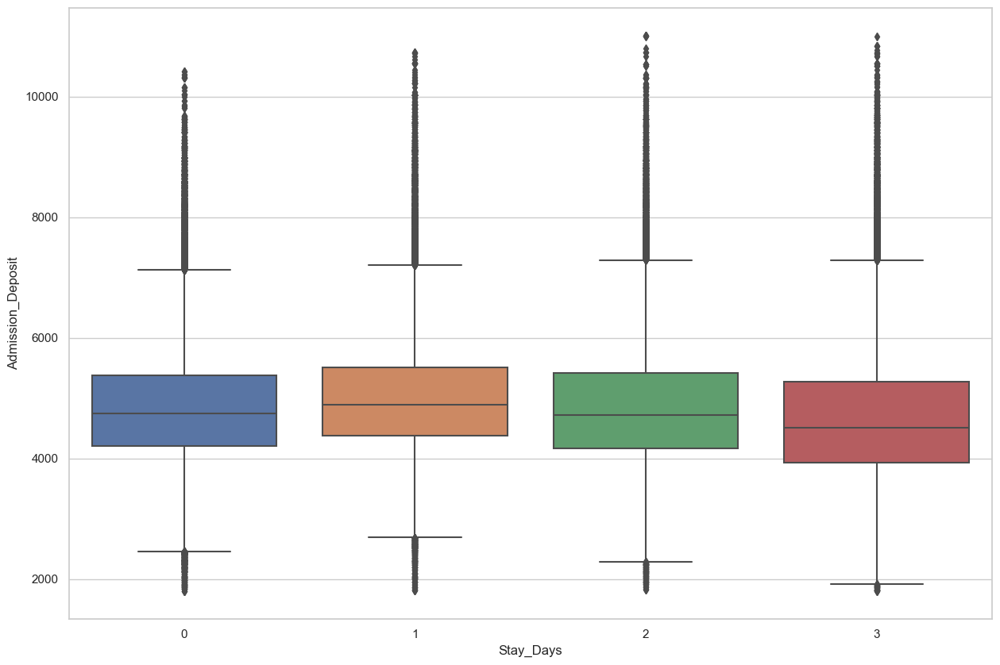

In [ ]:
sns.boxplot(data=plan_data,y='Admission_Deposit',x='Stay_Days')
plt.show()

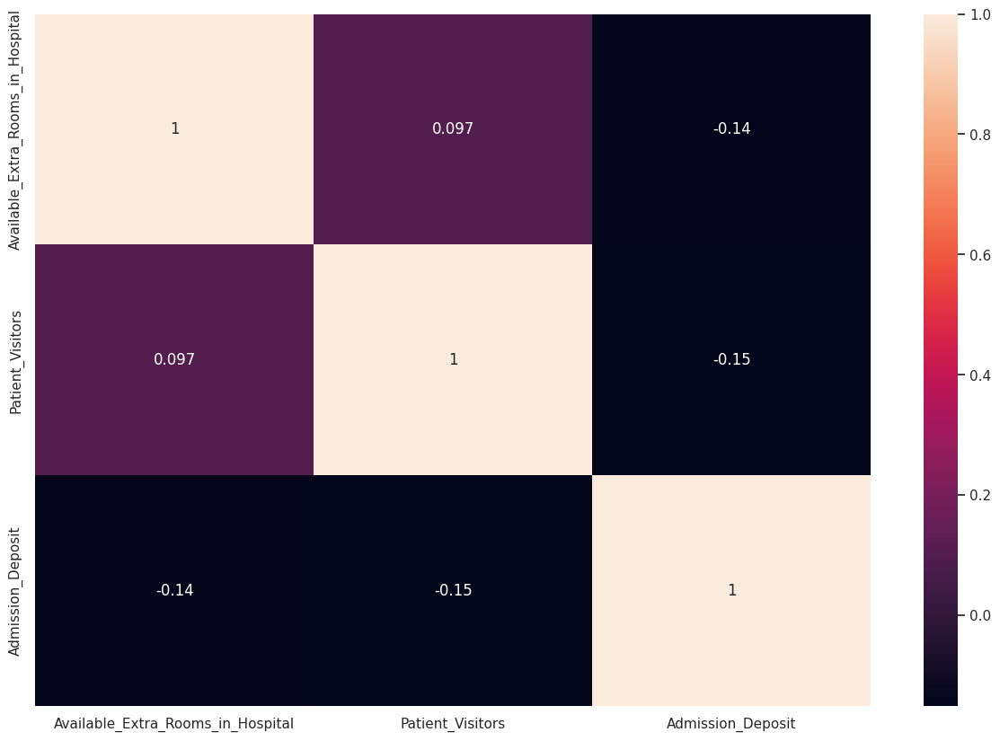

In [12]:
sns.heatmap(num_data.corr(),annot=True)
plt.show()

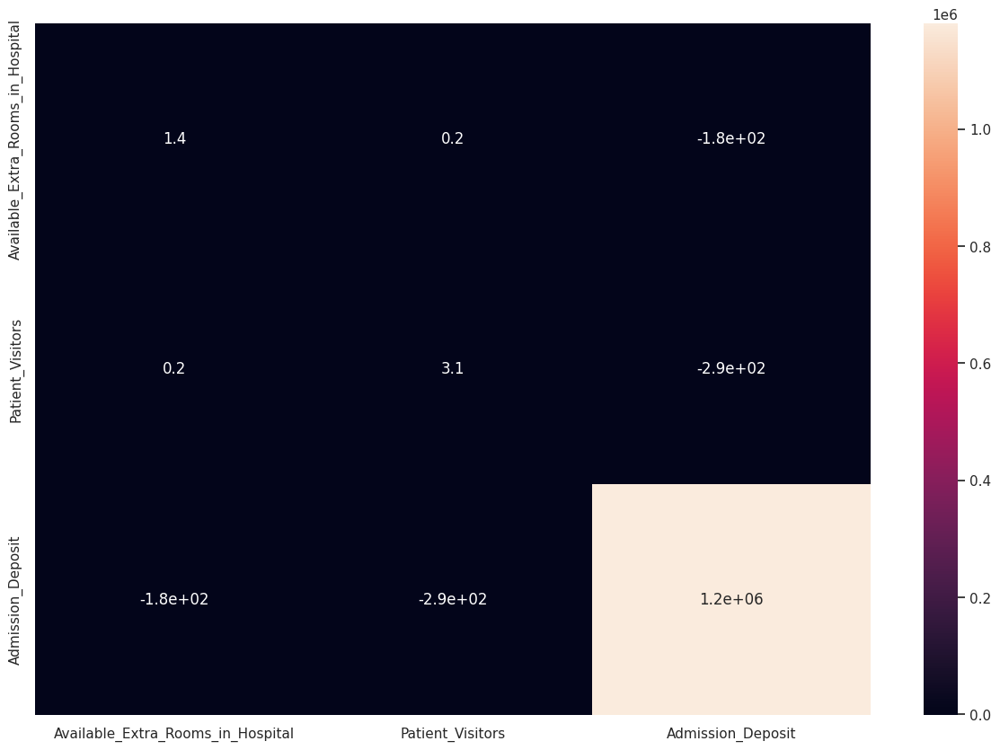

In [13]:
sns.heatmap(num_data.cov(),annot=True)
plt.show()

# Multivariate Analysis

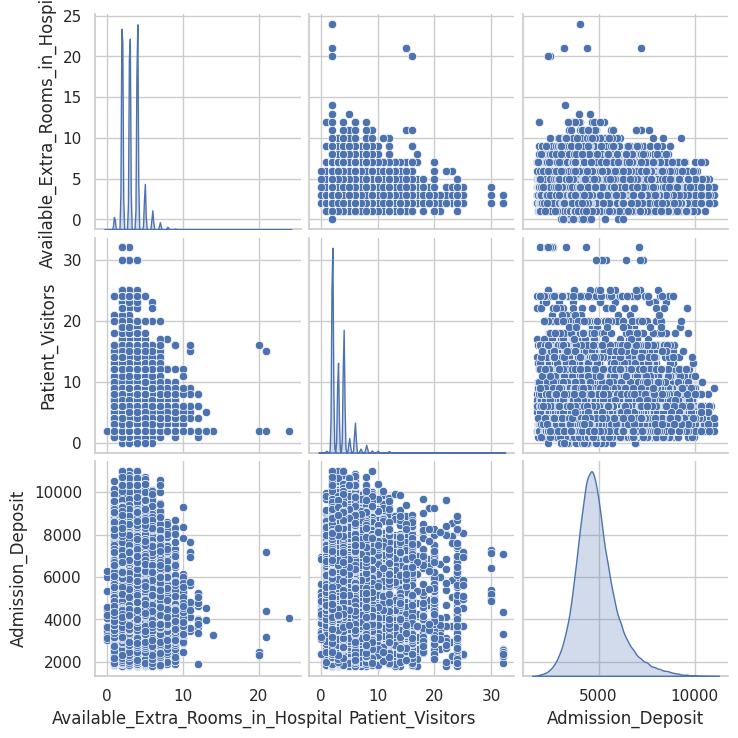

In [11]:
sns.pairplot(num_data,diag_kind='kde')
plt.show()

# Checking for outliers

In [ ]:
q1=plan_data.quantile(.25)
q3=plan_data.quantile(.75)
iqr=q3-q1
ul=(q3+(1.5*iqr))
ll=(q1-(1.5*iqr))
df=plan_data[~((plan_data>ul)|(plan_data<ll))]
df.isna().sum()

Hospital                                 0
Hospital_type                         4235
Hospital_city                            0
Hospital_region                          0
Available_Extra_Rooms_in_Hospital     1336
Department                               0
Ward_Type                                0
Ward_Facility                            0
Bed_Grade                                0
City_Code_Patient                    24764
Type of Admission                        0
Illness_Severity                         0
Patient_Visitors                      9597
Age                                      0
Admission_Deposit                    12125
Stay_Days                                0
dtype: int64

In [ ]:

df.dropna(inplace=True)

In [ ]:

df.shape

(264698, 16)

# Statistical test

In [ ]:

num_data=df[['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit']]
cat_data=df.drop(['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit','Stay_Days'],axis=1)

In [ ]:

sig_lvl=0.05
for i in num_data.columns:
    print(i,'\n.............................................')
    result=df.groupby(by='Stay_Days')[i].apply(list)
    print('Hypothesis Framing')
    print('------------------')
    print('H0: The averages of all classes are the same.')
    print('H1: Atleast one class has a different average.\n\n')

    stat,pval=stats.f_oneway(*result)
    print('Pvalue= ',pval)
    if pval<sig_lvl:
        print('Result')
        print('------')
        print('pval<sig_lvl')
        print('Rejecting the null hypothesis')
        print('Atleast one class has a different average.')
        print('______________________________________________________________________________________\n\n\n')
    else:
        print('Result')
        print('------')
        print('pval>sig_lvl')
        print('Failed to reject null hypothesis')
        print('The averages of all classes are the same.')
        print('______________________________________________________________________________________\n\n\n')

Available_Extra_Rooms_in_Hospital 
.............................................
Hypothesis Framing
------------------
H0: The averages of all classes are the same.
H1: Atleast one class has a different average.


Pvalue=  0.0
Result
------
pval<sig_lvl
Rejecting the null hypothesis
Atleast one class has a different average.
______________________________________________________________________________________



Patient_Visitors 
.............................................
Hypothesis Framing
------------------
H0: The averages of all classes are the same.
H1: Atleast one class has a different average.


Pvalue=  0.0
Result
------
pval<sig_lvl
Rejecting the null hypothesis
Atleast one class has a different average.
______________________________________________________________________________________



Admission_Deposit 
.............................................
Hypothesis Framing
------------------
H0: The averages of all classes are the same.
H1: Atleast one class has a differ

In [ ]:

for i in cat_data.columns:
    print('\n\n\n',i,'\n.................................\n\n\n')
    result = pd.crosstab(index=df['Stay_Days'],columns=df[i])
    chi2,pval,dof,exp=stats.chi2_contingency(result)
    print('Hypothesis Framing')
    print('------------------')
    print('H0: The variables are independent.')
    print('H1: The variables are not independent.\n\n')

    print('Pvalue= ',pval)
    if pval<sig_lvl:
        print('Result')
        print('------')
        print('pval<sig_lvl')
        print('Rejecting the null hypothesis')
        print('The variables are dependent.')
        print('______________________________________________________________________________________\n\n\n')
    else:
        print('Result')
        print('------')
        print('pval>sig_lvl')
        print('Failed to reject null hypothesis')
        print('The variables are independent.')
        print('______________________________________________________________________________________\n\n\n')




 Hospital 
.................................



Hypothesis Framing
------------------
H0: The variables are independent.
H1: The variables are not independent.


Pvalue=  0.0
Result
------
pval<sig_lvl
Rejecting the null hypothesis
The variables are dependent.
______________________________________________________________________________________






 Hospital_type 
.................................



Hypothesis Framing
------------------
H0: The variables are independent.
H1: The variables are not independent.


Pvalue=  0.0
Result
------
pval<sig_lvl
Rejecting the null hypothesis
The variables are dependent.
______________________________________________________________________________________






 Hospital_city 
.................................



Hypothesis Framing
------------------
H0: The variables are independent.
H1: The variables are not independent.


Pvalue=  0.0
Result
------
pval<sig_lvl
Rejecting the null hypothesis
The variables are dependent.
__________________

# Feature Encoding

In [ ]:

df['Illness_Severity'].replace({'Extreme':2,'Moderate':1,'Minor':0},inplace=True)

In [ ]:

df.Age.replace({'0-10':0,'11-20':1,'21-30':2,'31-40':3,'41-50':4,'51-60':5,'61-70':6,'71-80':7,'81-90':8,'81-90':9,'91-100':10},inplace=True)

In [ ]:
df.Stay_Days.replace({'0-10':0,'11-20':0,'21-30':1,'31-40':2,'41-50':2,'51-60':3,'61-70':3,'71-80':3,'81-90':3,'91-100':3,'More than 100 Days':3},inplace=True)

In [ ]:
pd.options.display.max_columns=None

In [ ]:

dummy_encode=pd.get_dummies(df,columns=['Hospital','Hospital_city','Hospital_region','Hospital_type','Department','Ward_Type','Ward_Facility','Bed_Grade','City_Code_Patient','Type of Admission'])

In [ ]:

dummy_encode.head()

,Available_Extra_Rooms_in_Hospital,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days,Hospital_1,Hospital_2,Hospital_3,Hospital_4,Hospital_5,Hospital_6,Hospital_7,Hospital_8,Hospital_9,Hospital_10,Hospital_11,Hospital_12,Hospital_13,Hospital_14,Hospital_15,Hospital_16,Hospital_17,Hospital_18,Hospital_19,Hospital_20,Hospital_21,Hospital_23,Hospital_24,Hospital_25,Hospital_26,Hospital_27,Hospital_28,Hospital_29,Hospital_30,Hospital_31,Hospital_32,Hospital_city_1,Hospital_city_2,Hospital_city_3,Hospital_city_4,Hospital_city_5,Hospital_city_6,Hospital_city_7,Hospital_city_9,Hospital_city_10,Hospital_city_11,Hospital_city_13,Hospital_region_0,Hospital_region_1,Hospital_region_2,Hospital_type_0.0,Hospital_type_1.0,Hospital_type_2.0,Hospital_type_3.0,Hospital_type_4.0,Hospital_type_5.0,Department_TB & Chest disease,Department_anesthesia,Department_gynecology,Department_radiotherapy,Department_surgery,Ward_Type_P,Ward_Type_Q,Ward_Type_R,Ward_Type_S,Ward_Type_T,Ward_Type_U,Ward_Facility_A,Ward_Facility_B,Ward_Facility_C,Ward_Facility_D,Ward_Facility_E,Ward_Facility_F,Bed_Grade_1.0,Bed_Grade_2.0,Bed_Grade_3.0,Bed_Grade_4.0,City_Code_Patient_1.0,City_Code_Patient_2.0,City_Code_Patient_3.0,City_Code_Patient_4.0,City_Code_Patient_5.0,City_Code_Patient_6.0,City_Code_Patient_7.0,City_Code_Patient_8.0,City_Code_Patient_9.0,City_Code_Patient_10.0,City_Code_Patient_11.0,City_Code_Patient_12.0,City_Code_Patient_13.0,City_Code_Patient_14.0,Type of Admission_Emergency,Type of Admission_Trauma,Type of Admission_Urgent
0,3.0,2,2.0,5,4911.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
1,2.0,2,2.0,5,5954.0,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,2.0,2,2.0,5,4745.0,2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
4,2.0,2,2.0,5,5558.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
5,2.0,2,2.0,5,4449.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


In [ ]:
num_data=df[['Available_Extra_Rooms_in_Hospital',	'Patient_Visitors',	'Admission_Deposit']]

In [ ]:

num_data.skew()

Available_Extra_Rooms_in_Hospital    0.647785
Patient_Visitors                     0.992579
Admission_Deposit                    0.305361
dtype: float64

# Scaling the numerical features.

In [ ]:


scaler=StandardScaler()
for i in num_data.columns:
  scaler.fit(dummy_encode[[i]])
  dummy_encode[i]=scaler.transform(dummy_encode[[i]])
dummy_encode

,Available_Extra_Rooms_in_Hospital,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days,Hospital_1,Hospital_2,Hospital_3,Hospital_4,Hospital_5,Hospital_6,Hospital_7,Hospital_8,Hospital_9,Hospital_10,Hospital_11,Hospital_12,Hospital_13,Hospital_14,Hospital_15,Hospital_16,Hospital_17,Hospital_18,Hospital_19,Hospital_20,Hospital_21,Hospital_23,Hospital_24,Hospital_25,Hospital_26,Hospital_27,Hospital_28,Hospital_29,Hospital_30,Hospital_31,Hospital_32,Hospital_city_1,Hospital_city_2,Hospital_city_3,Hospital_city_4,Hospital_city_5,Hospital_city_6,Hospital_city_7,Hospital_city_9,Hospital_city_10,Hospital_city_11,Hospital_city_13,Hospital_region_0,Hospital_region_1,Hospital_region_2,Hospital_type_0.0,Hospital_type_1.0,Hospital_type_2.0,Hospital_type_3.0,Hospital_type_4.0,Hospital_type_5.0,Department_TB & Chest disease,Department_anesthesia,Department_gynecology,Department_radiotherapy,Department_surgery,Ward_Type_P,Ward_Type_Q,Ward_Type_R,Ward_Type_S,Ward_Type_T,Ward_Type_U,Ward_Facility_A,Ward_Facility_B,Ward_Facility_C,Ward_Facility_D,Ward_Facility_E,Ward_Facility_F,Bed_Grade_1.0,Bed_Grade_2.0,Bed_Grade_3.0,Bed_Grade_4.0,City_Code_Patient_1.0,City_Code_Patient_2.0,City_Code_Patient_3.0,City_Code_Patient_4.0,City_Code_Patient_5.0,City_Code_Patient_6.0,City_Code_Patient_7.0,City_Code_Patient_8.0,City_Code_Patient_9.0,City_Code_Patient_10.0,City_Code_Patient_11.0,City_Code_Patient_12.0,City_Code_Patient_13.0,City_Code_Patient_14.0,Type of Admission_Emergency,Type of Admission_Trauma,Type of Admission_Urgent
0,-0.163781,2,-0.872133,5,0.138375,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
1,-1.059698,2,-0.872133,5,1.319284,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,-1.059698,2,-0.872133,5,-0.049575,2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
4,-1.059698,2,-0.872133,5,0.870923,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
5,-1.059698,2,-0.872133,5,-0.384713,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318431,-0.163781,2,-0.872133,7,-0.317912,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
318434,-1.059698,1,0.761441,9,2.162791,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
318435,-0.163781,0,-0.055346,7,-0.627009,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
318436,-0.163781,0,1.578228,1,-1.163683,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0


In [ ]:


num_data.skew()

Available_Extra_Rooms_in_Hospital    0.647785
Patient_Visitors                     0.992579
Admission_Deposit                    0.305361
dtype: float64

In [ ]:


pt=PowerTransformer()
for i in num_data.columns:
  dummy_encode[i]=pt.fit_transform(dummy_encode[[i]])
dummy_encode

,Available_Extra_Rooms_in_Hospital,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days,Hospital_1,Hospital_2,Hospital_3,Hospital_4,Hospital_5,Hospital_6,Hospital_7,Hospital_8,Hospital_9,Hospital_10,Hospital_11,Hospital_12,Hospital_13,Hospital_14,Hospital_15,Hospital_16,Hospital_17,Hospital_18,Hospital_19,Hospital_20,Hospital_21,Hospital_23,Hospital_24,Hospital_25,Hospital_26,Hospital_27,Hospital_28,Hospital_29,Hospital_30,Hospital_31,Hospital_32,Hospital_city_1,Hospital_city_2,Hospital_city_3,Hospital_city_4,Hospital_city_5,Hospital_city_6,Hospital_city_7,Hospital_city_9,Hospital_city_10,Hospital_city_11,Hospital_city_13,Hospital_region_0,Hospital_region_1,Hospital_region_2,Hospital_type_0.0,Hospital_type_1.0,Hospital_type_2.0,Hospital_type_3.0,Hospital_type_4.0,Hospital_type_5.0,Department_TB & Chest disease,Department_anesthesia,Department_gynecology,Department_radiotherapy,Department_surgery,Ward_Type_P,Ward_Type_Q,Ward_Type_R,Ward_Type_S,Ward_Type_T,Ward_Type_U,Ward_Facility_A,Ward_Facility_B,Ward_Facility_C,Ward_Facility_D,Ward_Facility_E,Ward_Facility_F,Bed_Grade_1.0,Bed_Grade_2.0,Bed_Grade_3.0,Bed_Grade_4.0,City_Code_Patient_1.0,City_Code_Patient_2.0,City_Code_Patient_3.0,City_Code_Patient_4.0,City_Code_Patient_5.0,City_Code_Patient_6.0,City_Code_Patient_7.0,City_Code_Patient_8.0,City_Code_Patient_9.0,City_Code_Patient_10.0,City_Code_Patient_11.0,City_Code_Patient_12.0,City_Code_Patient_13.0,City_Code_Patient_14.0,Type of Admission_Emergency,Type of Admission_Trauma,Type of Admission_Urgent
0,-0.040248,2,-0.986889,5,0.201359,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
1,-1.138495,2,-0.986889,5,1.282643,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,-1.138495,2,-0.986889,5,0.013557,2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
4,-1.138495,2,-0.986889,5,0.887728,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
5,-1.138495,2,-0.986889,5,-0.335969,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318431,-0.040248,2,-0.986889,7,-0.264933,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
318434,-1.138495,1,0.951100,9,1.990559,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
318435,-0.040248,0,0.234049,7,-0.598697,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
318436,-0.040248,0,1.431868,1,-1.205226,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0


In [ ]:


for i in num_data.columns:
  print(i,':',dummy_encode[i].skew())

Available_Extra_Rooms_in_Hospital : 0.060049572382487176
Patient_Visitors : 0.21136990525868377
Admission_Deposit : -0.020200740401253595


In [ ]:
pd.options.display.max_rows=None

# Splitting the Independent feature and Dependent feature

In [ ]:

x=dummy_encode.drop(['Stay_Days'],axis=1)
y=dummy_encode[['Stay_Days']]

# Splitting the dataset into training data & testing data

In [ ]:

xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2,stratify=y,random_state=102)

# Logistic regression model

In [ ]:
lm=LogisticRegression(multi_class='ovr',solver='sag')
lm.fit(xtrain,ytrain)

LogisticRegression(multi_class='ovr', solver='sag')

In [ ]:
lm.score(xtrain,ytrain)

0.49447482503612616

In [ ]:

print('Accuracy score: ',lm.score(xtest,ytest))

Accuracy score:  0.4950887797506611


# Defining model evaluation

In [ ]:
def metric_score(ytest,ypred,ypred_proba,model):
    print('Model Name',model)
    print('\n\n\n')
    print('Accuracy score: ', metrics.accuracy_score(ytest,ypred))
    print('\n')
    print('precision score: ',metrics.precision_score(ytest,ypred,average='weighted'))
    print('\n')
    print('recall score: ',metrics.recall_score(ytest,ypred,average='weighted'))
    print('\n')
    print('f1 score: ',metrics.f1_score(ytest,ypred,average='weighted'))
    print('\n')
    print('classification report: \n',metrics.classification_report(ytest,ypred))
    print('\n')
    print('Confusion matrix: ')
    print('\n')
    cm=metrics.confusion_matrix(ytest,ypred)
    sns.heatmap(cm,annot=True)
    plt.show()





In [ ]:

RF = OneVsRestClassifier(LogisticRegression(multi_class='ovr',solver='sag'))
RF.fit(xtrain,ytrain)
ypred=RF.predict(xtest)
ypred_proba=RF.predict_proba(xtest)

Model Name LOGISTIC REGRESSION




Accuracy score:  0.4950887797506611


precision score:  0.45225073990660014


recall score:  0.4950887797506611


f1 score:  0.4517293759786081


classification report: 
               precision    recall  f1-score   support

           0       0.50      0.68      0.58     17529
           1       0.45      0.49      0.47     15001
           2       0.27      0.05      0.08     11219
           3       0.58      0.69      0.63      9191

    accuracy                           0.50     52940
   macro avg       0.45      0.48      0.44     52940
weighted avg       0.45      0.50      0.45     52940



Confusion matrix: 




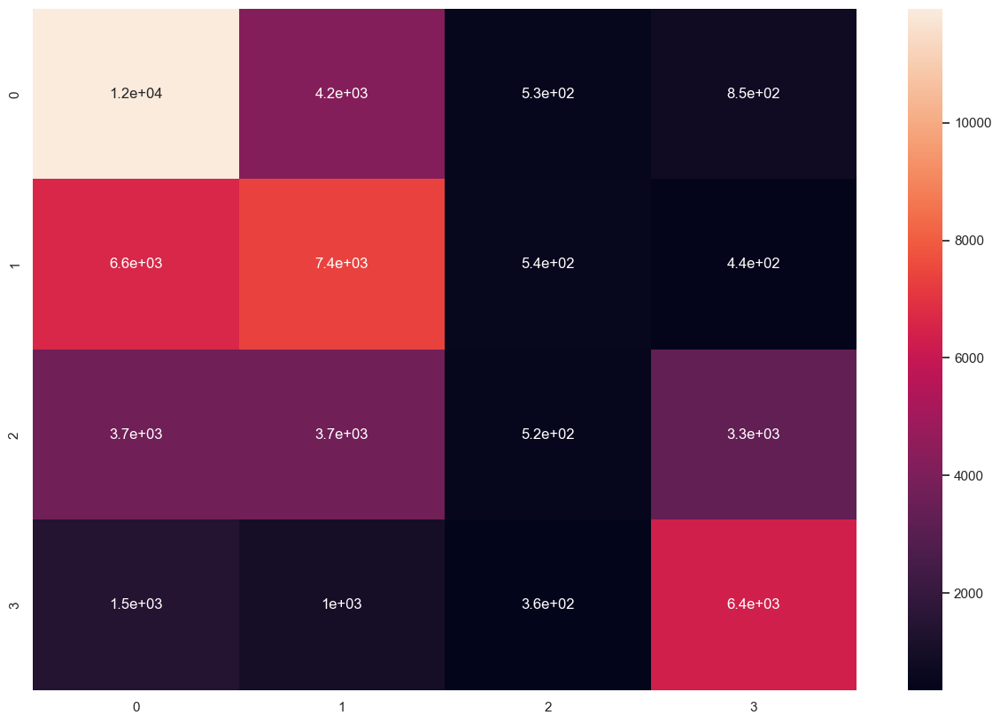

In [ ]:

ypredlm=lm.predict(xtest)
ypred_probalm=lm.predict_proba(xtest)[:,1]
metric_score(ytest,ypredlm,ypred_probalm,'LOGISTIC REGRESSION')

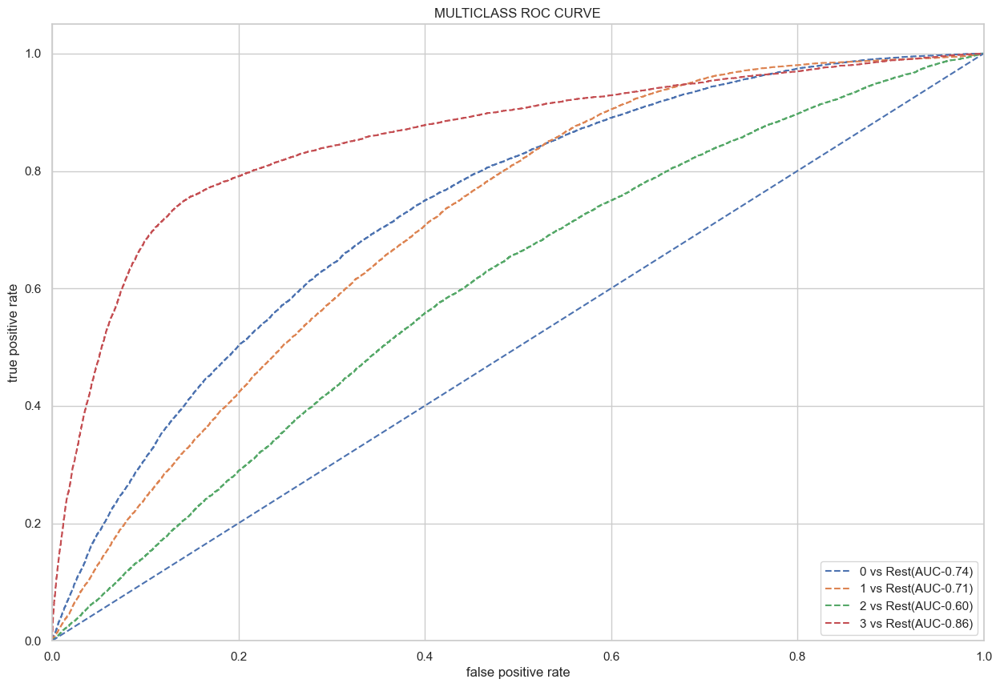

Average AUC score: 0.7266441683624384


In [ ]:

ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

In [ ]:

print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

Average AUC score: 0.7266441683624384


# Decision tree model

In [ ]:

dt=DecisionTreeClassifier().fit(xtrain,ytrain)
dt

DecisionTreeClassifier()

In [ ]:

ypred=dt.predict(xtest)
ypred_proba=dt.predict_proba(xtest)


Model Name DECISION TREE




Accuracy score:  0.4124102757839063


precision score:  0.41284908237880624


recall score:  0.4124102757839063


f1 score:  0.41262305769114294


classification report: 
               precision    recall  f1-score   support

           0       0.47      0.46      0.46     17529
           1       0.39      0.39      0.39     15001
           2       0.29      0.29      0.29     11219
           3       0.51      0.51      0.51      9191

    accuracy                           0.41     52940
   macro avg       0.41      0.41      0.41     52940
weighted avg       0.41      0.41      0.41     52940



Confusion matrix: 




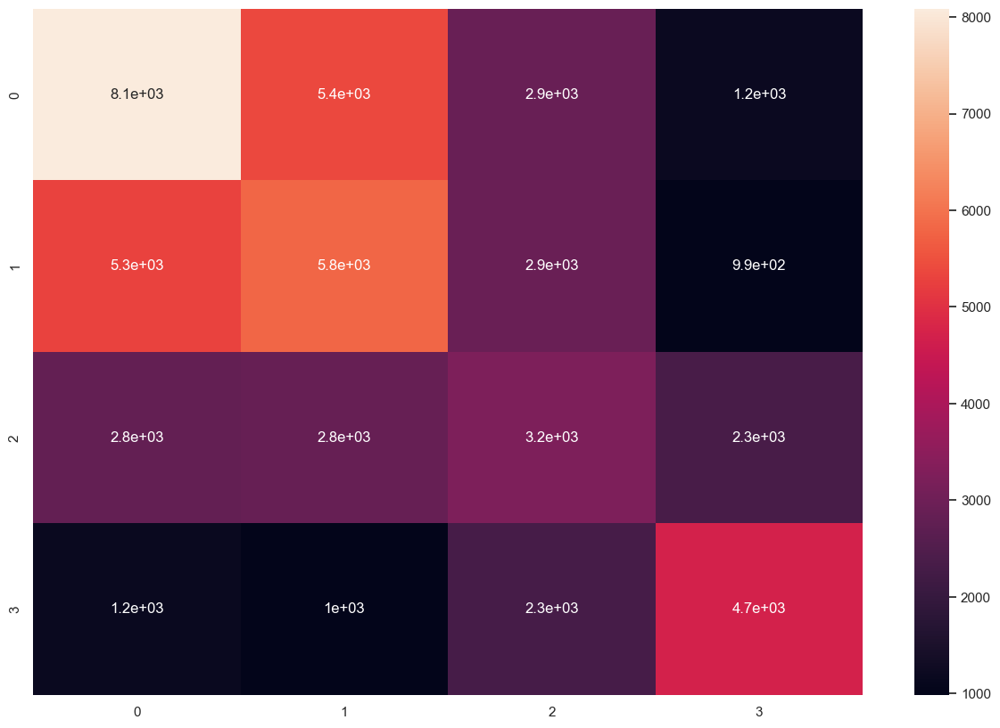

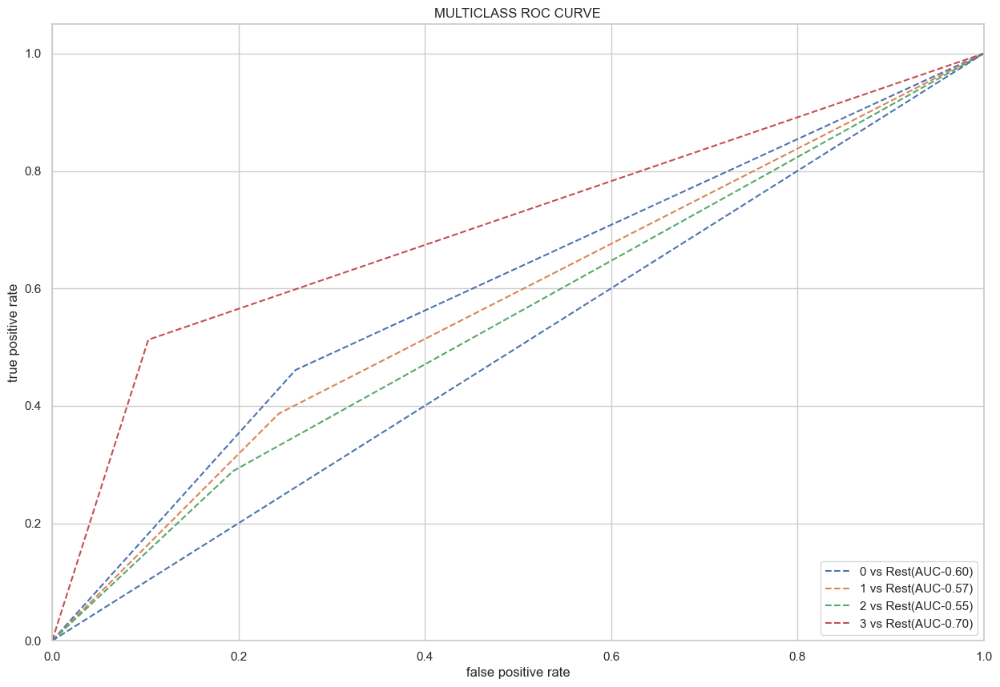

Average AUC score: 0.6058877543341374


In [ ]:

metric_score(ytest,ypred,ypred_proba,'DECISION TREE')
ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

# Random forest model

In [ ]:

rf=RandomForestClassifier().fit(xtrain,ytrain)
rf


RandomForestClassifier()

In [ ]:

ypred=rf.predict(xtest)
ypred_proba=rf.predict_proba(xtest)

Model Name RANDOM FOREST




Accuracy score:  0.4803740083112958


precision score:  0.4707326778581788


recall score:  0.4803740083112958


f1 score:  0.47222019028896073


classification report: 
               precision    recall  f1-score   support

           0       0.51      0.59      0.55     17529
           1       0.43      0.43      0.43     15001
           2       0.36      0.25      0.29     11219
           3       0.61      0.62      0.62      9191

    accuracy                           0.48     52940
   macro avg       0.48      0.47      0.47     52940
weighted avg       0.47      0.48      0.47     52940



Confusion matrix: 




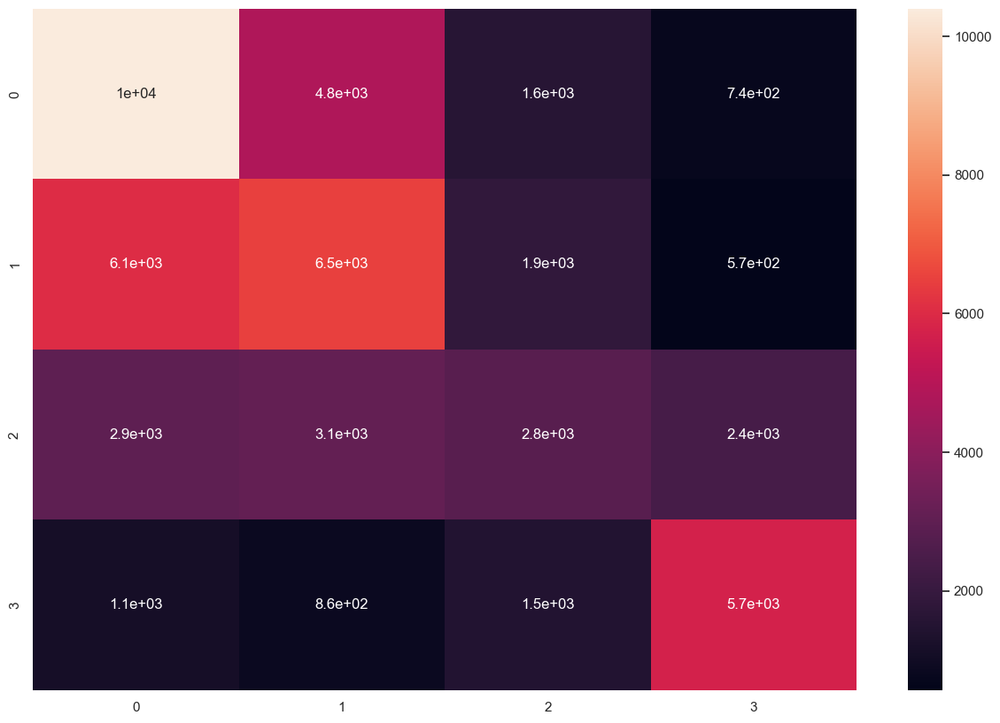

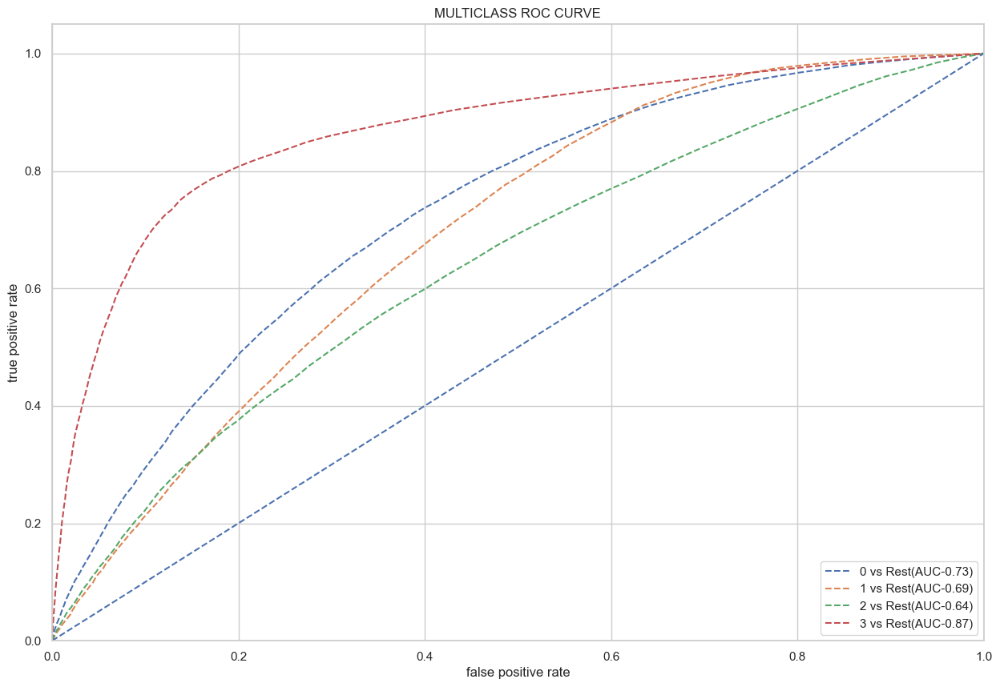

Average AUC score: 0.7317512176237067


In [ ]:

metric_score(ytest,ypred,ypred_proba,'RANDOM FOREST')
ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

# Adaboost model

Model Name ADA BOOST CLASSIFIER




Accuracy score:  0.48451076690593126


precision score:  0.46207898136339587


recall score:  0.48451076690593126


f1 score:  0.46328759498755684


classification report: 
               precision    recall  f1-score   support

           0       0.51      0.65      0.57     17529
           1       0.44      0.48      0.46     15001
           2       0.30      0.14      0.19     11219
           3       0.60      0.60      0.60      9191

    accuracy                           0.48     52940
   macro avg       0.46      0.47      0.45     52940
weighted avg       0.46      0.48      0.46     52940



Confusion matrix: 




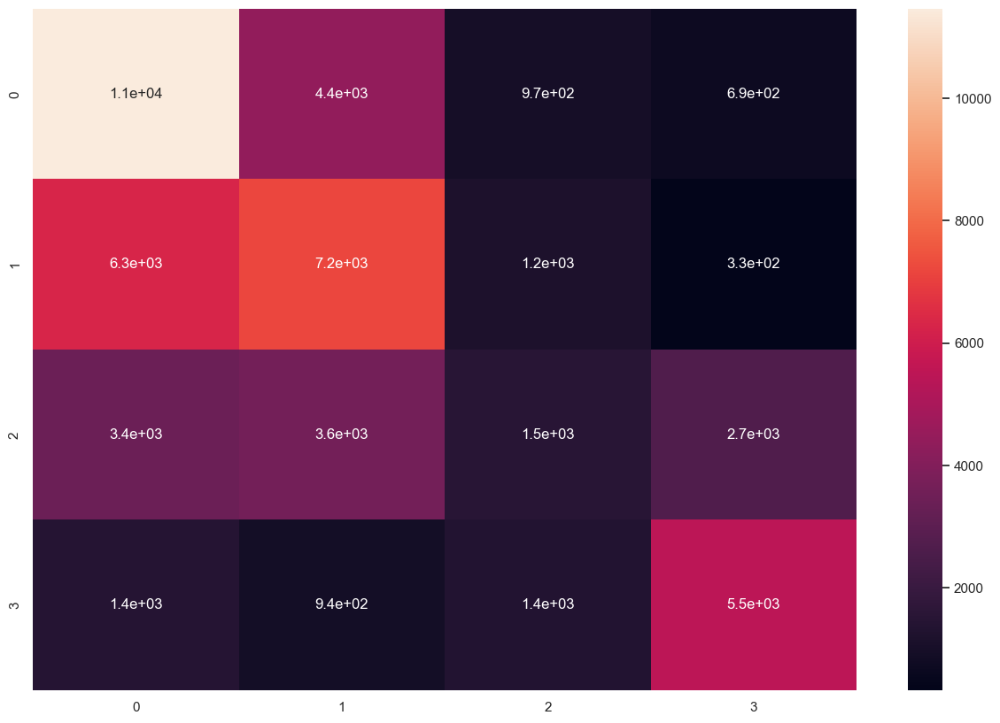

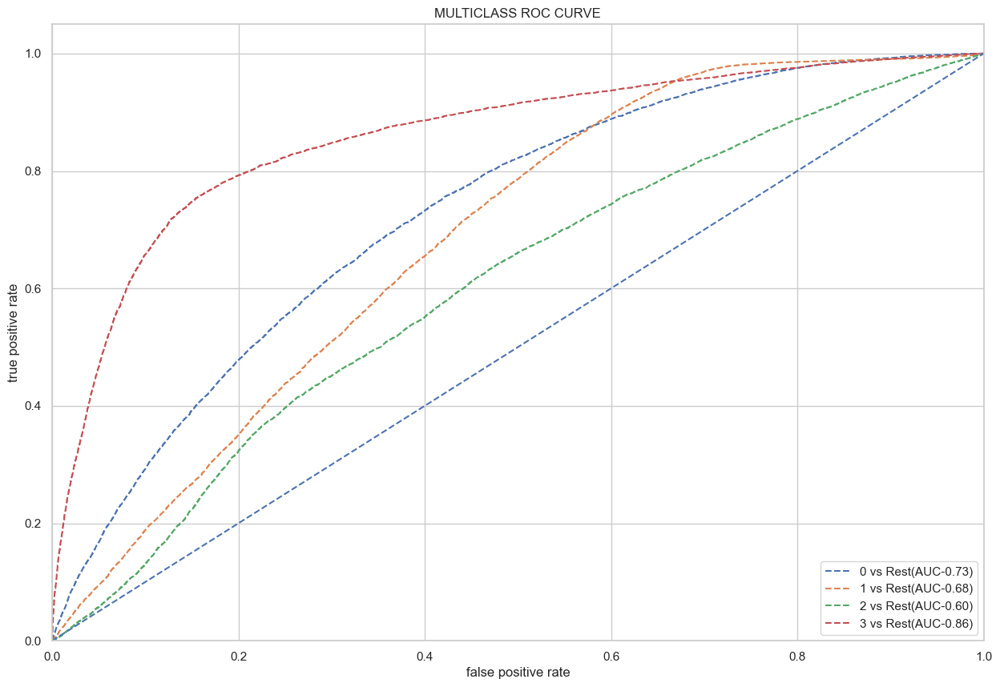

Average AUC score: 0.7183112486596795


In [ ]:


abc=AdaBoostClassifier().fit(xtrain,ytrain)
abc
ypred=abc.predict(xtest)
ypred_proba=abc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'ADA BOOST CLASSIFIER')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

# Bagging classifier

Model Name BAGGING CLASSIFIER




Accuracy score:  0.4664336985266339


precision score:  0.4612272384519671


recall score:  0.4664336985266339


f1 score:  0.46053223838781837


classification report: 
               precision    recall  f1-score   support

           0       0.49      0.60      0.54     17529
           1       0.42      0.42      0.42     15001
           2       0.34      0.26      0.30     11219
           3       0.62      0.55      0.58      9191

    accuracy                           0.47     52940
   macro avg       0.47      0.46      0.46     52940
weighted avg       0.46      0.47      0.46     52940



Confusion matrix: 




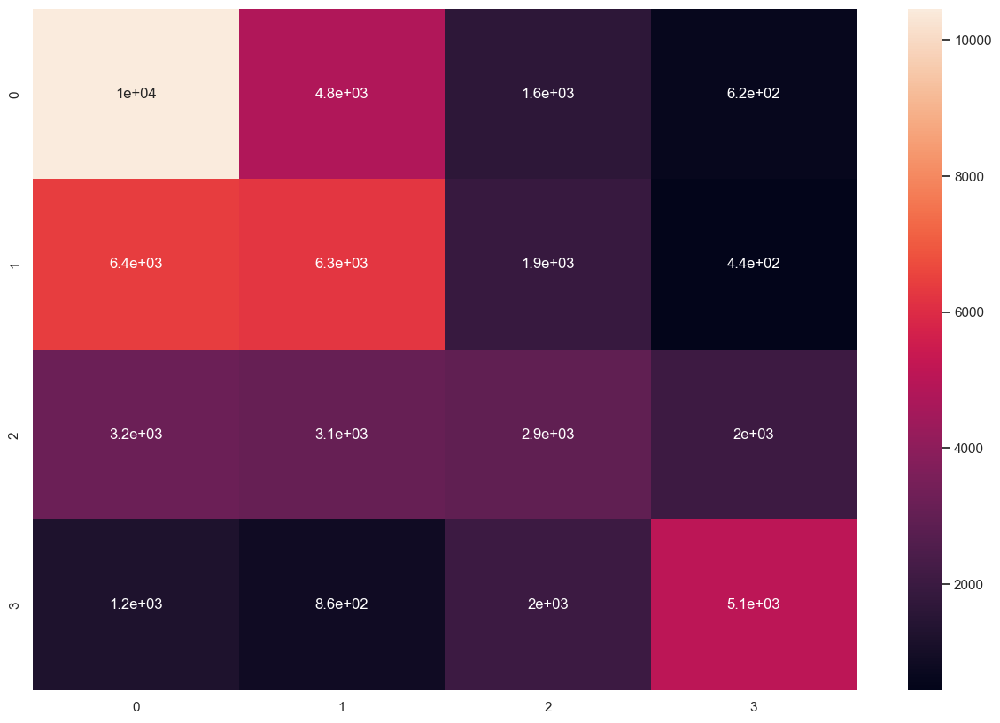

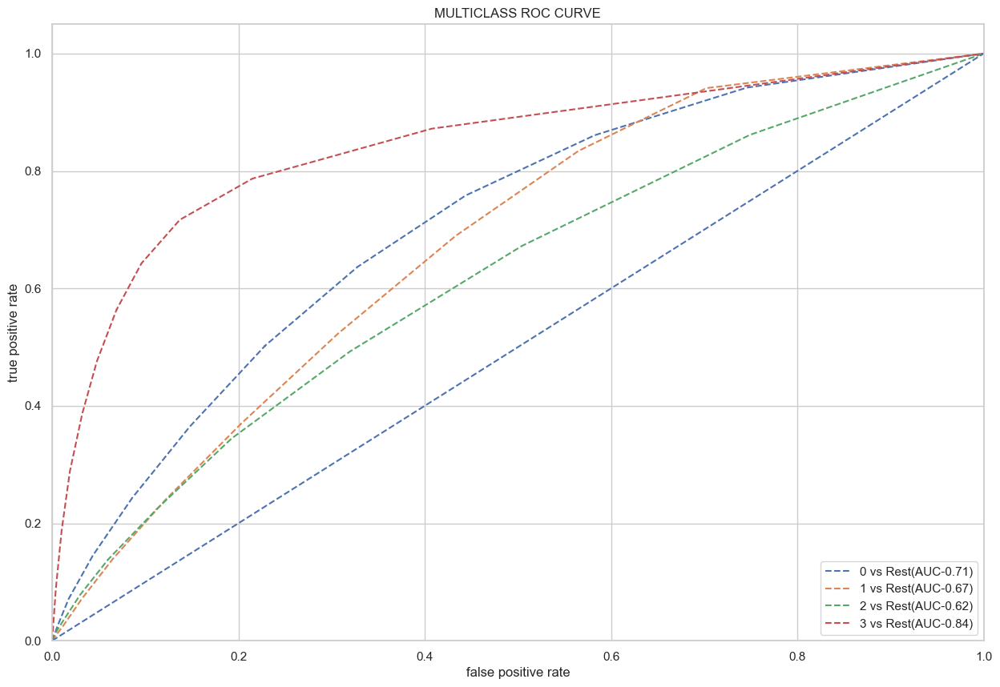

Average AUC score: 0.7111319364513307


In [ ]:


bc=BaggingClassifier().fit(xtrain,ytrain)
bc
ypred=bc.predict(xtest)
ypred_proba=bc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'BAGGING CLASSIFIER')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

# Gradient boosting classifier

Model Name GRADIENT BOOSTING CLASSIFIER




Accuracy score:  0.5149981110691348


precision score:  0.5100354292800923


recall score:  0.5149981110691348


f1 score:  0.4753728440583886


classification report: 
               precision    recall  f1-score   support

           0       0.52      0.71      0.60     17529
           1       0.46      0.51      0.48     15001
           2       0.49      0.08      0.13     11219
           3       0.61      0.69      0.65      9191

    accuracy                           0.51     52940
   macro avg       0.52      0.50      0.47     52940
weighted avg       0.51      0.51      0.48     52940



Confusion matrix: 




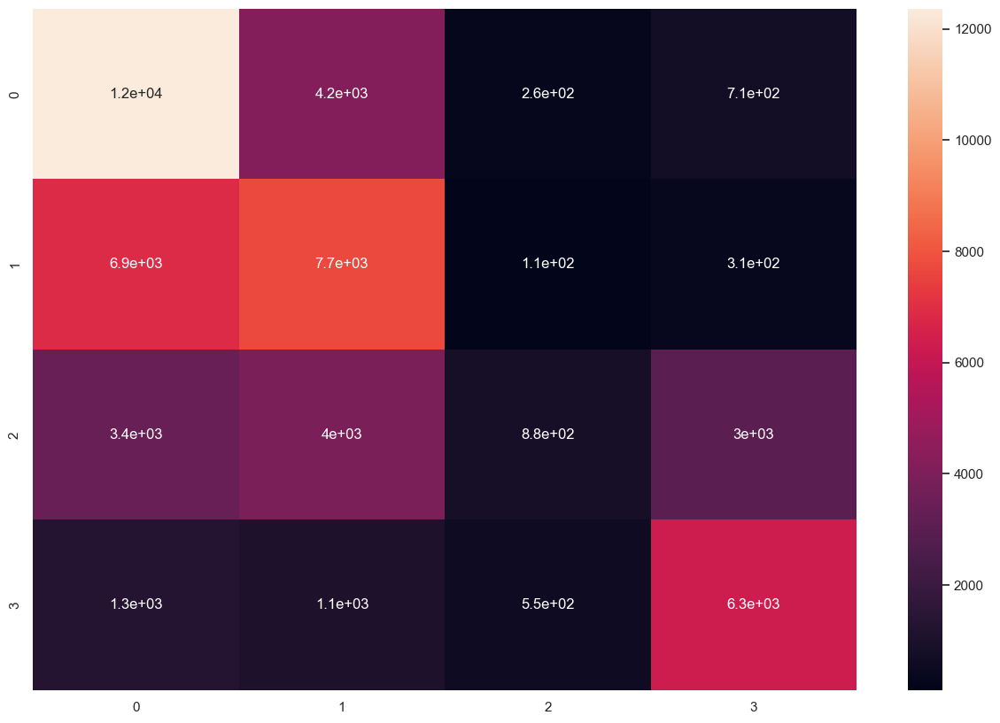

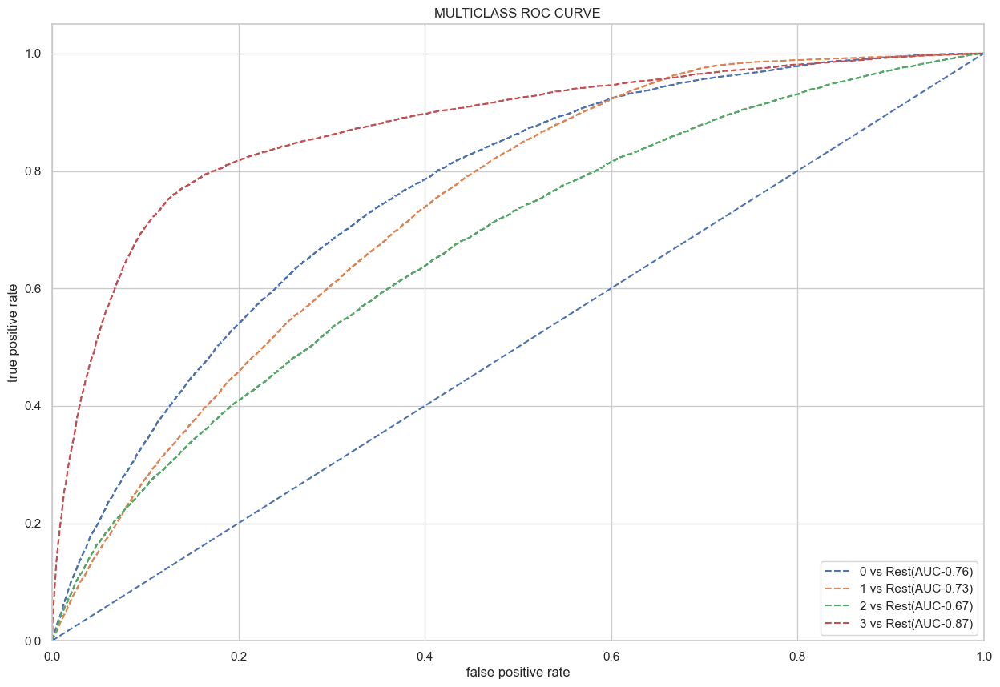

Average AUC score: 0.759515861444109


In [ ]:


gbc=GradientBoostingClassifier().fit(xtrain,ytrain)
gbc
ypred=gbc.predict(xtest)
ypred_proba=gbc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'GRADIENT BOOSTING CLASSIFIER')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

# XGBoost classifier

Model Name XGBOOST




Accuracy score:  0.523290517567057


precision score:  0.518392127451667


recall score:  0.523290517567057


f1 score:  0.5019128108438252


classification report: 
               precision    recall  f1-score   support

           0       0.53      0.68      0.60     17529
           1       0.46      0.54      0.49     15001
           2       0.47      0.17      0.25     11219
           3       0.65      0.65      0.65      9191

    accuracy                           0.52     52940
   macro avg       0.53      0.51      0.50     52940
weighted avg       0.52      0.52      0.50     52940



Confusion matrix: 




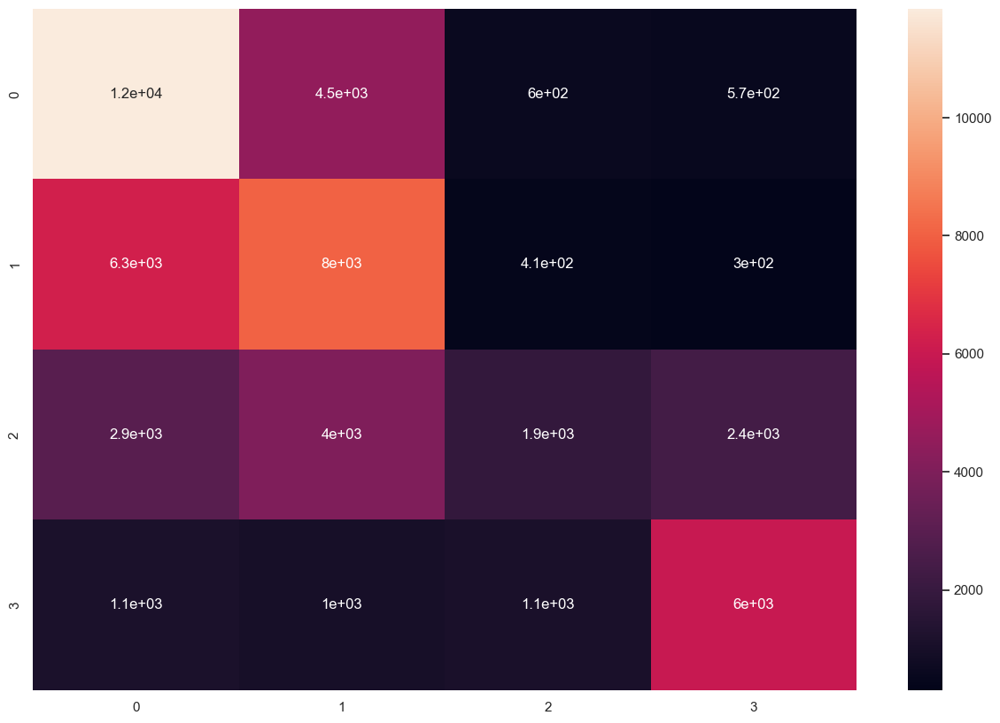

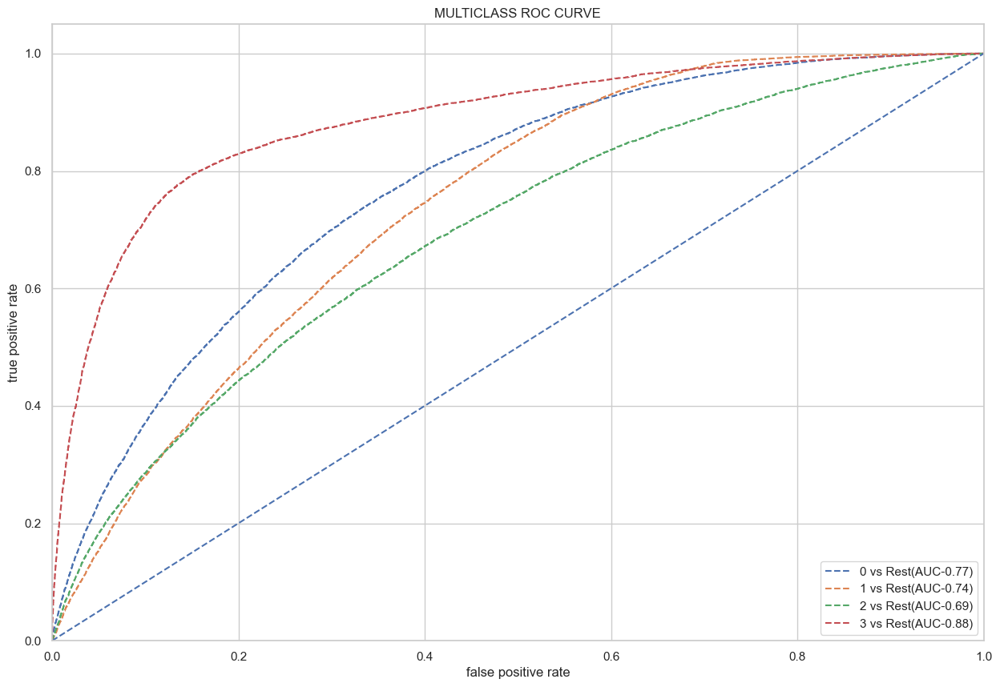

Average AUC score: 0.7716376171065521


In [ ]:


xgbc=XGBClassifier().fit(xtrain,ytrain)
xgbc
ypred=xgbc.predict(xtest)
ypred_proba=xgbc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'XGBOOST')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

# Light gbm model

In [ ]:
import lightgbm as lgb

In [ ]:
train_data=lgb.Dataset(xtrain,label=ytrain)
test_data=lgb.Dataset(xtest,label=ytest)

In [ ]:
parameters={
    'objective': 'multiclass',
    'num_class':4,
    'metric':'multi_logloss',
    'is_unbalance':'true',
    'boosting':'gbdt',
    'num_leaves':64,
    'feature_fraction':0.5,
    'bagging_fraction':0.5,
    'bagging_freq':20,
    'learning_rate':0.01,
    'verbose': -1

}

In [ ]:
model_lgbm=lgb.train(parameters,
                     train_data,
                     valid_sets=test_data,
                     num_boost_round=5000,
                     early_stopping_rounds=50)                     

[1]	valid_0's multi_logloss: 1.3522
Training until validation scores don't improve for 50 rounds
[2]	valid_0's multi_logloss: 1.34894
[3]	valid_0's multi_logloss: 1.34698
[4]	valid_0's multi_logloss: 1.34288
[5]	valid_0's multi_logloss: 1.34017
[6]	valid_0's multi_logloss: 1.33624
[7]	valid_0's multi_logloss: 1.33431
[8]	valid_0's multi_logloss: 1.33154
[9]	valid_0's multi_logloss: 1.32991
[10]	valid_0's multi_logloss: 1.32604
[11]	valid_0's multi_logloss: 1.32249
[12]	valid_0's multi_logloss: 1.32047
[13]	valid_0's multi_logloss: 1.318
[14]	valid_0's multi_logloss: 1.31388
[15]	valid_0's multi_logloss: 1.31142
[16]	valid_0's multi_logloss: 1.30972
[17]	valid_0's multi_logloss: 1.3083
[18]	valid_0's multi_logloss: 1.30621
[19]	valid_0's multi_logloss: 1.30293
[20]	valid_0's multi_logloss: 1.29973
[21]	valid_0's multi_logloss: 1.29638
[22]	valid_0's multi_logloss: 1.29338
[23]	valid_0's multi_logloss: 1.29015
[24]	valid_0's multi_logloss: 1.28809
[25]	valid_0's multi_logloss: 1.28494
[2

[214]	valid_0's multi_logloss: 1.1142
[215]	valid_0's multi_logloss: 1.11403
[216]	valid_0's multi_logloss: 1.11358
[217]	valid_0's multi_logloss: 1.11333
[218]	valid_0's multi_logloss: 1.11272
[219]	valid_0's multi_logloss: 1.11227
[220]	valid_0's multi_logloss: 1.11176
[221]	valid_0's multi_logloss: 1.11118
[222]	valid_0's multi_logloss: 1.11093
[223]	valid_0's multi_logloss: 1.11047
[224]	valid_0's multi_logloss: 1.10997
[225]	valid_0's multi_logloss: 1.10962
[226]	valid_0's multi_logloss: 1.1094
[227]	valid_0's multi_logloss: 1.1091
[228]	valid_0's multi_logloss: 1.10889
[229]	valid_0's multi_logloss: 1.10862
[230]	valid_0's multi_logloss: 1.10852
[231]	valid_0's multi_logloss: 1.10799
[232]	valid_0's multi_logloss: 1.10757
[233]	valid_0's multi_logloss: 1.10728
[234]	valid_0's multi_logloss: 1.10708
[235]	valid_0's multi_logloss: 1.10655
[236]	valid_0's multi_logloss: 1.10626
[237]	valid_0's multi_logloss: 1.10578
[238]	valid_0's multi_logloss: 1.10534
[239]	valid_0's multi_loglos

[425]	valid_0's multi_logloss: 1.07397
[426]	valid_0's multi_logloss: 1.07386
[427]	valid_0's multi_logloss: 1.07372
[428]	valid_0's multi_logloss: 1.07362
[429]	valid_0's multi_logloss: 1.07348
[430]	valid_0's multi_logloss: 1.07337
[431]	valid_0's multi_logloss: 1.07334
[432]	valid_0's multi_logloss: 1.07326
[433]	valid_0's multi_logloss: 1.07317
[434]	valid_0's multi_logloss: 1.07307
[435]	valid_0's multi_logloss: 1.07298
[436]	valid_0's multi_logloss: 1.07289
[437]	valid_0's multi_logloss: 1.07281
[438]	valid_0's multi_logloss: 1.07275
[439]	valid_0's multi_logloss: 1.07266
[440]	valid_0's multi_logloss: 1.07256
[441]	valid_0's multi_logloss: 1.07248
[442]	valid_0's multi_logloss: 1.07243
[443]	valid_0's multi_logloss: 1.07235
[444]	valid_0's multi_logloss: 1.07226
[445]	valid_0's multi_logloss: 1.07211
[446]	valid_0's multi_logloss: 1.07205
[447]	valid_0's multi_logloss: 1.07189
[448]	valid_0's multi_logloss: 1.07178
[449]	valid_0's multi_logloss: 1.07169
[450]	valid_0's multi_log

[638]	valid_0's multi_logloss: 1.06174
[639]	valid_0's multi_logloss: 1.06171
[640]	valid_0's multi_logloss: 1.06168
[641]	valid_0's multi_logloss: 1.06167
[642]	valid_0's multi_logloss: 1.06165
[643]	valid_0's multi_logloss: 1.06163
[644]	valid_0's multi_logloss: 1.06162
[645]	valid_0's multi_logloss: 1.06161
[646]	valid_0's multi_logloss: 1.06158
[647]	valid_0's multi_logloss: 1.06156
[648]	valid_0's multi_logloss: 1.06152
[649]	valid_0's multi_logloss: 1.06149
[650]	valid_0's multi_logloss: 1.06148
[651]	valid_0's multi_logloss: 1.06144
[652]	valid_0's multi_logloss: 1.06142
[653]	valid_0's multi_logloss: 1.06138
[654]	valid_0's multi_logloss: 1.06135
[655]	valid_0's multi_logloss: 1.06131
[656]	valid_0's multi_logloss: 1.06129
[657]	valid_0's multi_logloss: 1.06125
[658]	valid_0's multi_logloss: 1.06122
[659]	valid_0's multi_logloss: 1.06118
[660]	valid_0's multi_logloss: 1.06114
[661]	valid_0's multi_logloss: 1.06111
[662]	valid_0's multi_logloss: 1.06106
[663]	valid_0's multi_log

[851]	valid_0's multi_logloss: 1.05702
[852]	valid_0's multi_logloss: 1.057
[853]	valid_0's multi_logloss: 1.05699
[854]	valid_0's multi_logloss: 1.05699
[855]	valid_0's multi_logloss: 1.05697
[856]	valid_0's multi_logloss: 1.05697
[857]	valid_0's multi_logloss: 1.05696
[858]	valid_0's multi_logloss: 1.05695
[859]	valid_0's multi_logloss: 1.05694
[860]	valid_0's multi_logloss: 1.05692
[861]	valid_0's multi_logloss: 1.05691
[862]	valid_0's multi_logloss: 1.0569
[863]	valid_0's multi_logloss: 1.0569
[864]	valid_0's multi_logloss: 1.05688
[865]	valid_0's multi_logloss: 1.05686
[866]	valid_0's multi_logloss: 1.05684
[867]	valid_0's multi_logloss: 1.05683
[868]	valid_0's multi_logloss: 1.05682
[869]	valid_0's multi_logloss: 1.05681
[870]	valid_0's multi_logloss: 1.0568
[871]	valid_0's multi_logloss: 1.05679
[872]	valid_0's multi_logloss: 1.05679
[873]	valid_0's multi_logloss: 1.05677
[874]	valid_0's multi_logloss: 1.05676
[875]	valid_0's multi_logloss: 1.05676
[876]	valid_0's multi_logloss:

[1063]	valid_0's multi_logloss: 1.05497
[1064]	valid_0's multi_logloss: 1.05496
[1065]	valid_0's multi_logloss: 1.05496
[1066]	valid_0's multi_logloss: 1.05494
[1067]	valid_0's multi_logloss: 1.05494
[1068]	valid_0's multi_logloss: 1.05494
[1069]	valid_0's multi_logloss: 1.05493
[1070]	valid_0's multi_logloss: 1.05492
[1071]	valid_0's multi_logloss: 1.05492
[1072]	valid_0's multi_logloss: 1.05491
[1073]	valid_0's multi_logloss: 1.0549
[1074]	valid_0's multi_logloss: 1.05489
[1075]	valid_0's multi_logloss: 1.05488
[1076]	valid_0's multi_logloss: 1.05487
[1077]	valid_0's multi_logloss: 1.05486
[1078]	valid_0's multi_logloss: 1.05486
[1079]	valid_0's multi_logloss: 1.05485
[1080]	valid_0's multi_logloss: 1.05484
[1081]	valid_0's multi_logloss: 1.05483
[1082]	valid_0's multi_logloss: 1.05483
[1083]	valid_0's multi_logloss: 1.05482
[1084]	valid_0's multi_logloss: 1.05482
[1085]	valid_0's multi_logloss: 1.05481
[1086]	valid_0's multi_logloss: 1.0548
[1087]	valid_0's multi_logloss: 1.0548
[10

[1269]	valid_0's multi_logloss: 1.05384
[1270]	valid_0's multi_logloss: 1.05383
[1271]	valid_0's multi_logloss: 1.05382
[1272]	valid_0's multi_logloss: 1.05382
[1273]	valid_0's multi_logloss: 1.05381
[1274]	valid_0's multi_logloss: 1.05381
[1275]	valid_0's multi_logloss: 1.05381
[1276]	valid_0's multi_logloss: 1.0538
[1277]	valid_0's multi_logloss: 1.0538
[1278]	valid_0's multi_logloss: 1.0538
[1279]	valid_0's multi_logloss: 1.05379
[1280]	valid_0's multi_logloss: 1.05378
[1281]	valid_0's multi_logloss: 1.05378
[1282]	valid_0's multi_logloss: 1.05378
[1283]	valid_0's multi_logloss: 1.05377
[1284]	valid_0's multi_logloss: 1.05376
[1285]	valid_0's multi_logloss: 1.05376
[1286]	valid_0's multi_logloss: 1.05375
[1287]	valid_0's multi_logloss: 1.05375
[1288]	valid_0's multi_logloss: 1.05375
[1289]	valid_0's multi_logloss: 1.05374
[1290]	valid_0's multi_logloss: 1.05374
[1291]	valid_0's multi_logloss: 1.05373
[1292]	valid_0's multi_logloss: 1.05374
[1293]	valid_0's multi_logloss: 1.05374
[12

[1477]	valid_0's multi_logloss: 1.05312
[1478]	valid_0's multi_logloss: 1.05312
[1479]	valid_0's multi_logloss: 1.05312
[1480]	valid_0's multi_logloss: 1.05311
[1481]	valid_0's multi_logloss: 1.05312
[1482]	valid_0's multi_logloss: 1.05312
[1483]	valid_0's multi_logloss: 1.05311
[1484]	valid_0's multi_logloss: 1.05311
[1485]	valid_0's multi_logloss: 1.0531
[1486]	valid_0's multi_logloss: 1.0531
[1487]	valid_0's multi_logloss: 1.05309
[1488]	valid_0's multi_logloss: 1.0531
[1489]	valid_0's multi_logloss: 1.05309
[1490]	valid_0's multi_logloss: 1.05309
[1491]	valid_0's multi_logloss: 1.05309
[1492]	valid_0's multi_logloss: 1.05308
[1493]	valid_0's multi_logloss: 1.05308
[1494]	valid_0's multi_logloss: 1.05308
[1495]	valid_0's multi_logloss: 1.05308
[1496]	valid_0's multi_logloss: 1.05307
[1497]	valid_0's multi_logloss: 1.05307
[1498]	valid_0's multi_logloss: 1.05307
[1499]	valid_0's multi_logloss: 1.05307
[1500]	valid_0's multi_logloss: 1.05307
[1501]	valid_0's multi_logloss: 1.05307
[15

[1686]	valid_0's multi_logloss: 1.05275
[1687]	valid_0's multi_logloss: 1.05274
[1688]	valid_0's multi_logloss: 1.05274
[1689]	valid_0's multi_logloss: 1.05274
[1690]	valid_0's multi_logloss: 1.05274
[1691]	valid_0's multi_logloss: 1.05274
[1692]	valid_0's multi_logloss: 1.05274
[1693]	valid_0's multi_logloss: 1.05274
[1694]	valid_0's multi_logloss: 1.05273
[1695]	valid_0's multi_logloss: 1.05273
[1696]	valid_0's multi_logloss: 1.05273
[1697]	valid_0's multi_logloss: 1.05273
[1698]	valid_0's multi_logloss: 1.05273
[1699]	valid_0's multi_logloss: 1.05273
[1700]	valid_0's multi_logloss: 1.05272
[1701]	valid_0's multi_logloss: 1.05272
[1702]	valid_0's multi_logloss: 1.05271
[1703]	valid_0's multi_logloss: 1.05271
[1704]	valid_0's multi_logloss: 1.05271
[1705]	valid_0's multi_logloss: 1.05271
[1706]	valid_0's multi_logloss: 1.0527
[1707]	valid_0's multi_logloss: 1.05269
[1708]	valid_0's multi_logloss: 1.05269
[1709]	valid_0's multi_logloss: 1.05269
[1710]	valid_0's multi_logloss: 1.05269
[

[1894]	valid_0's multi_logloss: 1.05231
[1895]	valid_0's multi_logloss: 1.05231
[1896]	valid_0's multi_logloss: 1.0523
[1897]	valid_0's multi_logloss: 1.0523
[1898]	valid_0's multi_logloss: 1.0523
[1899]	valid_0's multi_logloss: 1.0523
[1900]	valid_0's multi_logloss: 1.0523
[1901]	valid_0's multi_logloss: 1.0523
[1902]	valid_0's multi_logloss: 1.0523
[1903]	valid_0's multi_logloss: 1.05229
[1904]	valid_0's multi_logloss: 1.05229
[1905]	valid_0's multi_logloss: 1.05229
[1906]	valid_0's multi_logloss: 1.05229
[1907]	valid_0's multi_logloss: 1.05229
[1908]	valid_0's multi_logloss: 1.05229
[1909]	valid_0's multi_logloss: 1.05229
[1910]	valid_0's multi_logloss: 1.05229
[1911]	valid_0's multi_logloss: 1.05229
[1912]	valid_0's multi_logloss: 1.05229
[1913]	valid_0's multi_logloss: 1.05229
[1914]	valid_0's multi_logloss: 1.05228
[1915]	valid_0's multi_logloss: 1.05228
[1916]	valid_0's multi_logloss: 1.05228
[1917]	valid_0's multi_logloss: 1.05228
[1918]	valid_0's multi_logloss: 1.05228
[1919]	

[2100]	valid_0's multi_logloss: 1.05216
[2101]	valid_0's multi_logloss: 1.05216
[2102]	valid_0's multi_logloss: 1.05216
[2103]	valid_0's multi_logloss: 1.05216
[2104]	valid_0's multi_logloss: 1.05216
[2105]	valid_0's multi_logloss: 1.05216
[2106]	valid_0's multi_logloss: 1.05215
[2107]	valid_0's multi_logloss: 1.05215
[2108]	valid_0's multi_logloss: 1.05215
[2109]	valid_0's multi_logloss: 1.05215
[2110]	valid_0's multi_logloss: 1.05215
[2111]	valid_0's multi_logloss: 1.05215
[2112]	valid_0's multi_logloss: 1.05215
[2113]	valid_0's multi_logloss: 1.05214
[2114]	valid_0's multi_logloss: 1.05214
[2115]	valid_0's multi_logloss: 1.05215
[2116]	valid_0's multi_logloss: 1.05215
[2117]	valid_0's multi_logloss: 1.05214
[2118]	valid_0's multi_logloss: 1.05214
[2119]	valid_0's multi_logloss: 1.05213
[2120]	valid_0's multi_logloss: 1.05213
[2121]	valid_0's multi_logloss: 1.05214
[2122]	valid_0's multi_logloss: 1.05214
[2123]	valid_0's multi_logloss: 1.05214
[2124]	valid_0's multi_logloss: 1.05214


In [ ]:
ytrain_pred=model_lgbm.predict(xtrain)
ytest_pred=model_lgbm.predict(xtest)
ytrain_pred = [list(x).index(max(x)) for x in ytrain_pred]

ytest_pred = [list(x).index(max(x)) for x in ytest_pred]

In [ ]:
ypred_proba = model_lgbm.predict(xtest, raw_score=True)


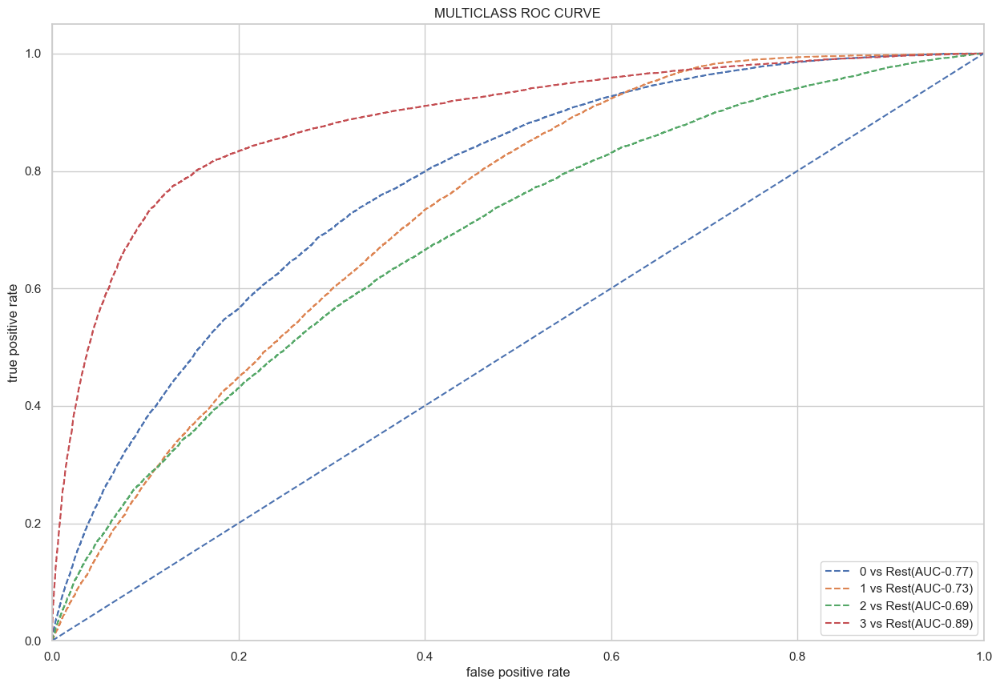

Average AUC score: 0.7693580903901556


In [ ]:

ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

In [ ]:
metrics.accuracy_score(ytest,ytest_pred)

0.5266528145069891

In [ ]:
metrics.accuracy_score(ytrain,ytrain_pred)

0.571931166709168

Model Name: LIGHT GBM




Accuracy score:  0.523290517567057


precision score:  0.518392127451667


recall score:  0.523290517567057


f1 score:  0.5019128108438252


classification report: 
               precision    recall  f1-score   support

           0       0.53      0.68      0.60     17529
           1       0.46      0.54      0.49     15001
           2       0.47      0.17      0.25     11219
           3       0.65      0.65      0.65      9191

    accuracy                           0.52     52940
   macro avg       0.53      0.51      0.50     52940
weighted avg       0.52      0.52      0.50     52940



Confusion matrix: 




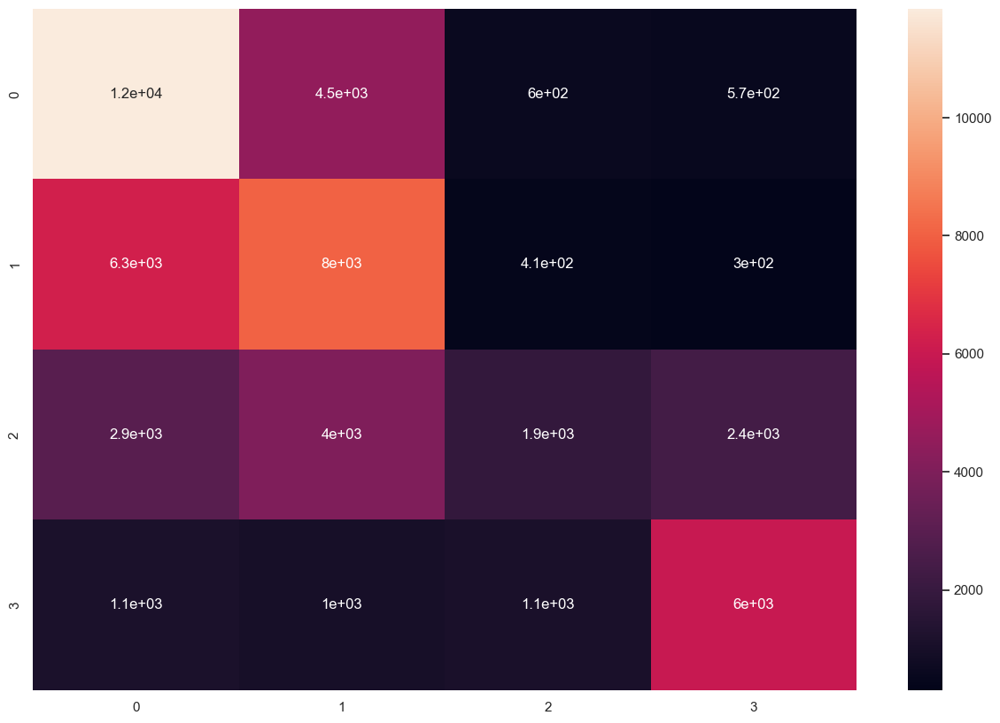

In [ ]:
print('Model Name: LIGHT GBM')
print('\n\n\n')
print('Accuracy score: ', metrics.accuracy_score(ytest,ypred))
print('\n')
print('precision score: ',metrics.precision_score(ytest,ypred,average='weighted'))
print('\n')
print('recall score: ',metrics.recall_score(ytest,ypred,average='weighted'))
print('\n')
print('f1 score: ',metrics.f1_score(ytest,ypred,average='weighted'))
print('\n')
print('classification report: \n',metrics.classification_report(ytest,ypred))
print('\n')
print('Confusion matrix: ')
print('\n')
cm=metrics.confusion_matrix(ytest,ypred)
sns.heatmap(cm,annot=True)
plt.show()

# Hyperparameter tuning

In [ ]:

params={
    'max_depth':[3,4,5],
    'learning_rate':[0.1,0.5,1.0],
    'n_estimators':[50,200,500]
}

In [ ]:
gs=GridSearchCV(estimator=xgbc, param_grid=params, cv=5, scoring='accuracy')
gs.fit(xtrain, ytrain)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=Non

In [ ]:
gs.best_estimator_

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=50, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)


Model Name XGBOOST




Accuracy score:  0.522100491122025


precision score:  0.5174344473294143


recall score:  0.522100491122025


f1 score:  0.4935763652978769


classification report: 
               precision    recall  f1-score   support

           0       0.53      0.69      0.60     17529
           1       0.46      0.53      0.49     15001
           2       0.48      0.13      0.20     11219
           3       0.63      0.66      0.65      9191

    accuracy                           0.52     52940
   macro avg       0.53      0.50      0.49     52940
weighted avg       0.52      0.52      0.49     52940



Confusion matrix: 




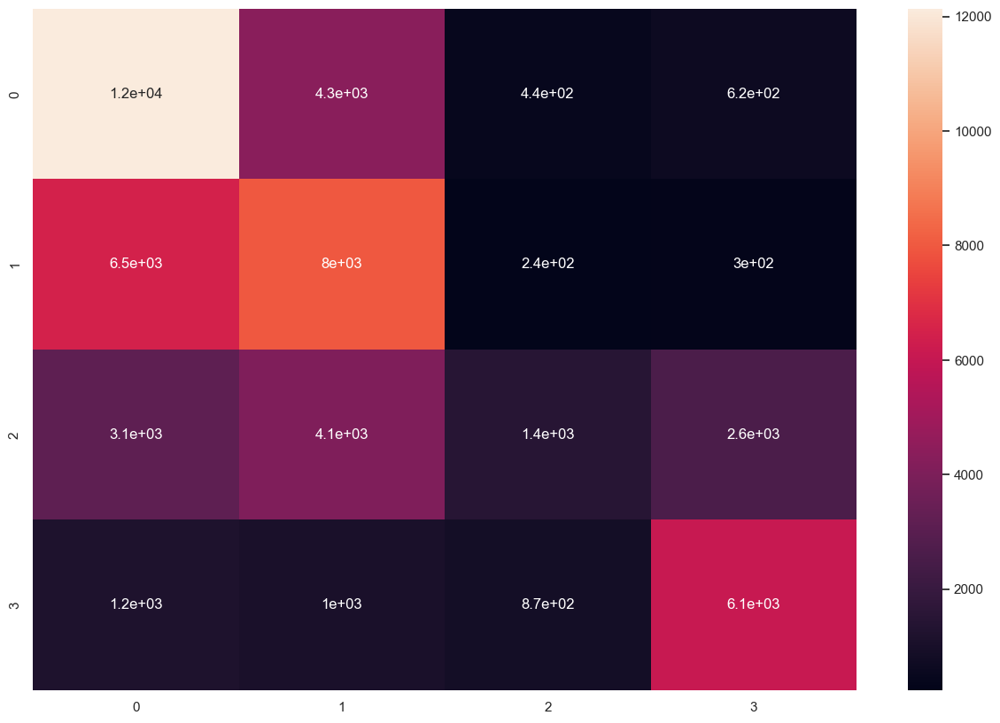

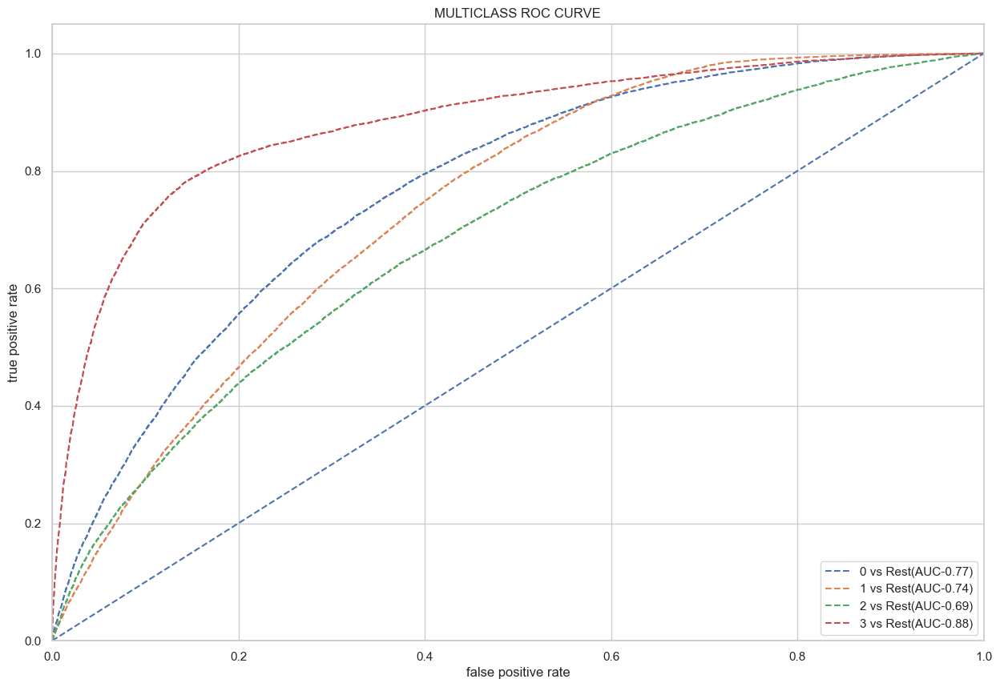

Average AUC score: 0.7686778128152348


In [ ]:

xgbc=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=np.nan, monotone_constraints=None,
              n_estimators=50, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None).fit(xtrain,ytrain)
xgbc
ypred=xgbc.predict(xtest)
ypred_proba=xgbc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'XGBOOST')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

# LGBMClassifier

In [ ]:
pipe = Pipeline((
("pt", PowerTransformer()),
("lg", LGBMClassifier(objective='multiclass',max_bin=7,num_leaves=7,max_depth=4, random_state=5,class_weight='balanced')),
))
pipe.fit(xtrain,ytrain)
print("Training Accuracy")
print(pipe.score(xtrain,ytrain))
print("Testing Accuracy")
print(pipe.score(xtest,ytest))
te_acc=pipe.score(xtest,ytest)
score=cross_val_score(estimator=pipe,X=xtrain,y=ytrain,scoring='accuracy',cv=5)
print('Cross validation score',np.mean(score))
tr_acc=np.mean(score)
pred=pipe.predict(xtest)
predx=pipe.predict(xtrain)
print(confusion_matrix(ytest,pred))
print(classification_report(ytest,pred))
print('precision',precision_score(ytest,pred,average='weighted'))
p=precision_score(ytest,pred,average='weighted')
print('recall',recall_score(ytest,pred,average='weighted'))
r=recall_score(ytest,pred,average='weighted')
print('f1_score',f1_score(ytest,pred,average='weighted'))
f=f1_score(ytest,pred,average='weighted')
print(confusion_matrix(ytrain,predx))
print(classification_report(ytrain,predx))
print('precision',precision_score(ytrain,predx,average='weighted'))
tp=precision_score(ytrain,predx,average='weighted')
print('recall',recall_score(ytrain,predx,average='weighted'))
tr=recall_score(ytrain,predx,average='weighted')
print('f1_score',f1_score(ytrain,predx,average='weighted'))
tf=f1_score(ytrain,predx,average='weighted')

add = pd.Series({'Model_Name': "LightGBM Tuned",'Train_Accuracy':tr_acc,'Test_Accuracy': te_acc,'Test_f1':f,'Test_recall':r,
                 'Test_precision':p,'Train_f1': tf,'Train_recall':tr,'Train_precision':tp})


Training Accuracy
0.508004420139971
Testing Accuracy
0.5039289761994711
Cross validation score 0.5056007395585155
[[10440  5395   835   859]
 [ 5235  8598   790   378]
 [ 2439  4301  1026  3453]
 [  893  1079   605  6614]]
              precision    recall  f1-score   support

           0       0.55      0.60      0.57     17529
           1       0.44      0.57      0.50     15001
           2       0.32      0.09      0.14     11219
           3       0.59      0.72      0.65      9191

    accuracy                           0.50     52940
   macro avg       0.47      0.49      0.46     52940
weighted avg       0.48      0.50      0.47     52940

precision 0.4759865455646146
recall 0.5039289761994711
f1_score 0.47307569847516856
[[41993 21115  3503  3506]
 [20913 34497  3028  1564]
 [10024 16944  4325 13580]
 [ 3445  4213  2349 26759]]
              precision    recall  f1-score   support

           0       0.55      0.60      0.57     70117
           1       0.45      0.57      0

# UNDERSAMPLING DATA

In [ ]:
undersample.head()

,Hospital,Hospital_type,Hospital_city,Hospital_region,Available_Extra_Rooms_in_Hospital,Department,Ward_Type,Ward_Facility,Bed_Grade,City_Code_Patient,Type of Admission,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days
0,8,2,3,2,3,radiotherapy,R,F,2.0,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,5,2,2,radiotherapy,S,F,2.0,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,10,4,1,0,2,anesthesia,S,E,2.0,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,26,1,2,1,2,radiotherapy,R,D,2.0,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,26,1,2,1,2,radiotherapy,S,D,2.0,7.0,Trauma,Extreme,2,51-60,5558.0,41-50


In [ ]:
undersample['Stay_Days'].unique()

array(['0-10', '41-50', '31-40', '11-20', '51-60', '21-30', '71-80',
       'More than 100 Days', '81-90', '61-70', '91-100'], dtype=object)

In [ ]:
undersample['Stay_Days'].value_counts()

21-30                 86282
11-20                 77057
31-40                 54294
51-60                 34442
0-10                  23237
41-50                 11541
71-80                 10088
More than 100 Days     6532
81-90                  4759
91-100                 2712
61-70                  2698
Name: Stay_Days, dtype: int64

In [ ]:
undersample.shape

(313642, 16)

# Splitting the dataset with respect to the target variables

In [ ]:
u1=undersample[undersample['Stay_Days']=='0-10']
u2=undersample[undersample['Stay_Days']=='11-20']
u3=undersample[undersample['Stay_Days']=='21-30']
u4=undersample[undersample['Stay_Days']=='31-40']
u5=undersample[undersample['Stay_Days']=='41-50']
u6=undersample[undersample['Stay_Days']=='51-60']
u7=undersample[undersample['Stay_Days']=='61-70']
u8=undersample[undersample['Stay_Days']=='71-80']
u9=undersample[undersample['Stay_Days']=='81-90']
u10=undersample[undersample['Stay_Days']=='91-100']
u11=undersample[undersample['Stay_Days']=='More than 100 Days']

# Getting samples from the individual target dataset

In [ ]:
du1=u1.sample(n=2500,random_state=102)
du2=u2.sample(n=2500,random_state=102)
du3=u3.sample(n=2500,random_state=102)
du4=u4.sample(n=2500,random_state=102)
du5=u5.sample(n=2500,random_state=102)
du6=u6.sample(n=2500,random_state=102)
du7=u7.sample(n=2500,random_state=102)
du8=u8.sample(n=2500,random_state=102)
du9=u9.sample(n=2500,random_state=102)
du10=u10.sample(n=2500,random_state=102)
du11=u11.sample(n=2500,random_state=102)


# Concatinating the sample datasets

In [ ]:
udf=pd.concat([du1,du2,du3,du4,du5,du6,du7,du8,du9,du10,du11])
udf.head()

,Hospital,Hospital_type,Hospital_city,Hospital_region,Available_Extra_Rooms_in_Hospital,Department,Ward_Type,Ward_Facility,Bed_Grade,City_Code_Patient,Type of Admission,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days
177191,15,2,5,2,2,gynecology,Q,F,3.0,8.0,Emergency,Minor,3,61-70,2746.0,0-10
247577,28,1,11,0,3,anesthesia,R,F,4.0,5.0,Emergency,Moderate,3,61-70,4078.0,0-10
74321,32,5,9,1,4,anesthesia,S,B,2.0,5.0,Emergency,Minor,2,41-50,6069.0,0-10
196406,27,0,7,1,2,gynecology,S,C,2.0,8.0,Emergency,Moderate,2,31-40,4766.0,0-10
109587,19,0,7,1,2,radiotherapy,S,C,2.0,8.0,Emergency,Extreme,2,71-80,5507.0,0-10


In [ ]:

udf.shape

(27500, 16)

In [ ]:

#Shuffling the order of the instances
udf=udf.sample(frac=1,random_state=102)



#Resetting the index
udf.reset_index(inplace=True,drop=True)

In [ ]:
udf1=udf.copy()

# Undersampling dataset

In [ ]:

udf.head()


,Hospital,Hospital_type,Hospital_city,Hospital_region,Available_Extra_Rooms_in_Hospital,Department,Ward_Type,Ward_Facility,Bed_Grade,City_Code_Patient,Type of Admission,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days
0,29,0,4,0,2,anesthesia,S,F,2.0,15.0,Trauma,Moderate,4,11-20,5121.0,51-60
1,26,1,2,1,4,gynecology,P,D,1.0,8.0,Trauma,Extreme,4,51-60,4139.0,41-50
2,9,3,5,2,2,gynecology,S,F,2.0,9.0,Emergency,Moderate,4,61-70,5030.0,51-60
3,8,2,3,2,3,gynecology,Q,F,4.0,8.0,Trauma,Minor,3,71-80,5534.0,61-70
4,12,0,9,1,3,gynecology,Q,B,3.0,7.0,Emergency,Moderate,2,51-60,3610.0,11-20


In [ ]:

udf.shape

(27500, 16)

# Checking for null values

In [ ]:

udf.isna().sum()

Hospital                             0
Hospital_type                        0
Hospital_city                        0
Hospital_region                      0
Available_Extra_Rooms_in_Hospital    0
Department                           0
Ward_Type                            0
Ward_Facility                        0
Bed_Grade                            0
City_Code_Patient                    0
Type of Admission                    0
Illness_Severity                     0
Patient_Visitors                     0
Age                                  0
Admission_Deposit                    0
Stay_Days                            0
dtype: int64

# Splitting the independent variables into numerical and categorical variables

In [ ]:

num_data=udf[['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit']]
cat_data=udf.drop(['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit','Stay_Days'],axis=1)

# Univariate analysis of numerical data

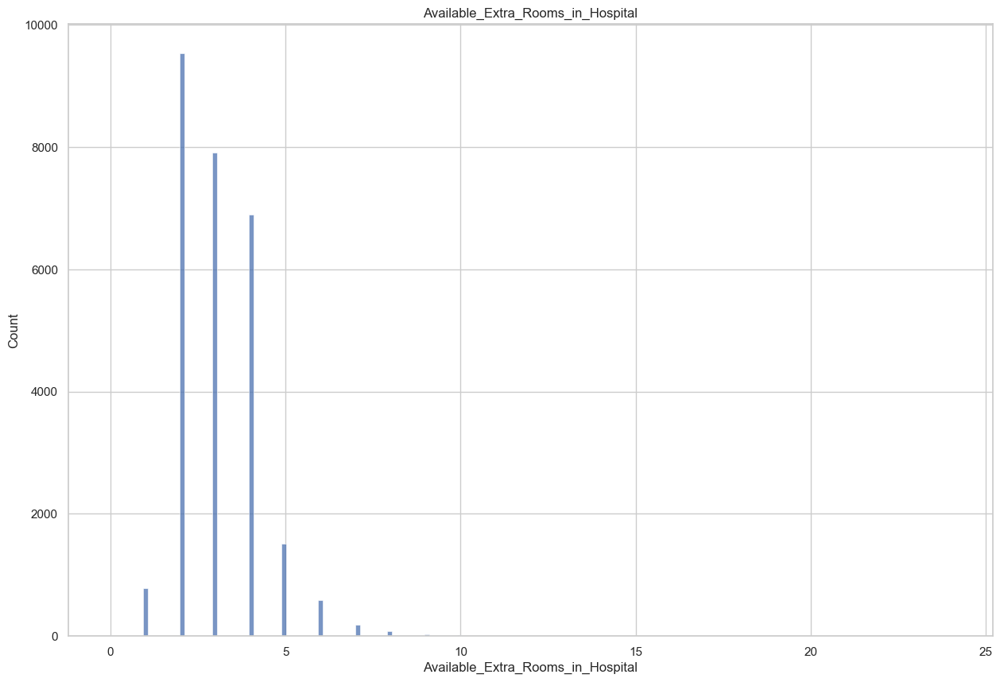

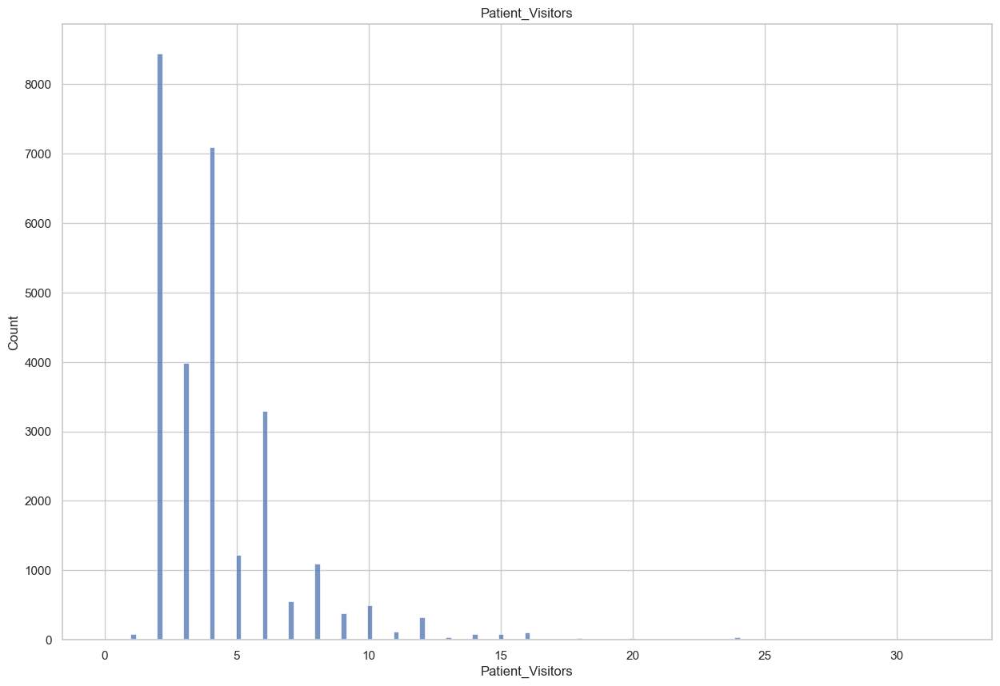

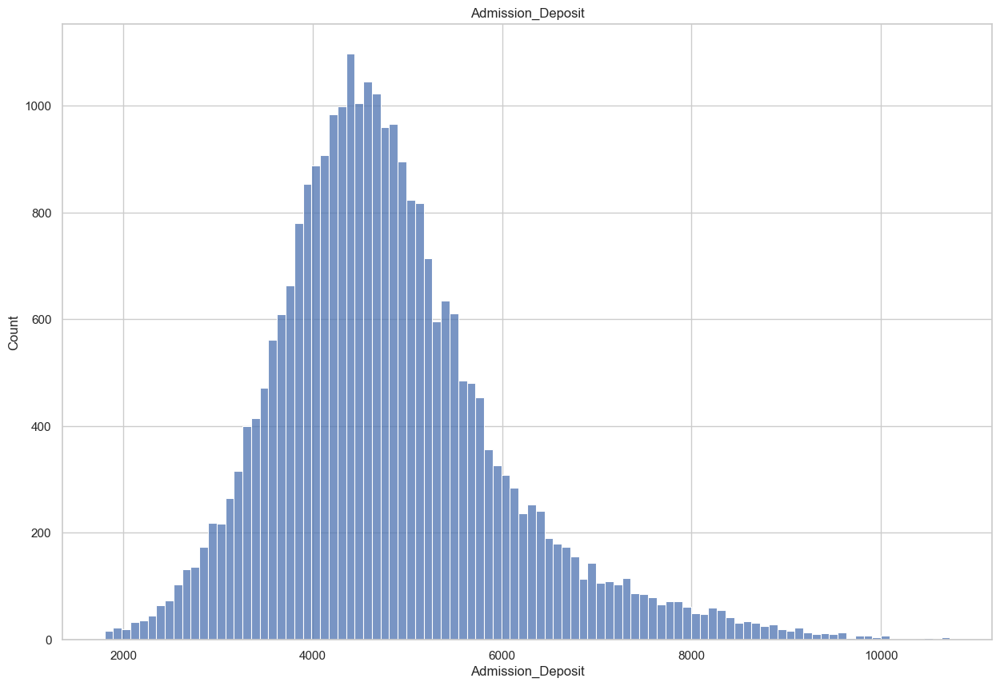

In [ ]:

for i in num_data.columns:
    sns.histplot(x=udf[i])
    plt.title(i)
    plt.show()

# Univariate analysis for categorical data

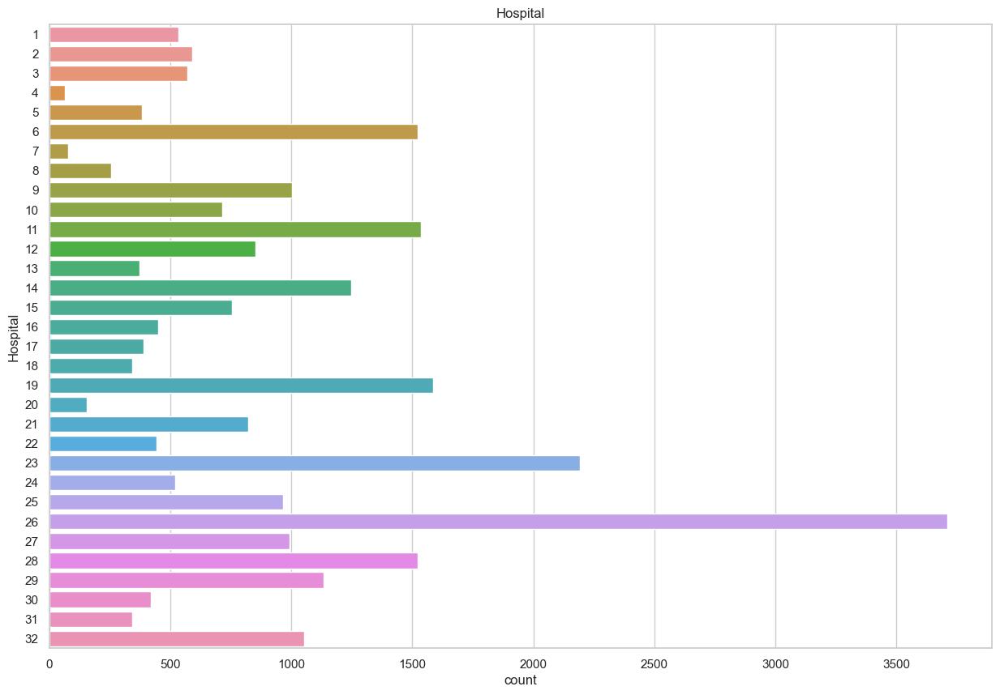

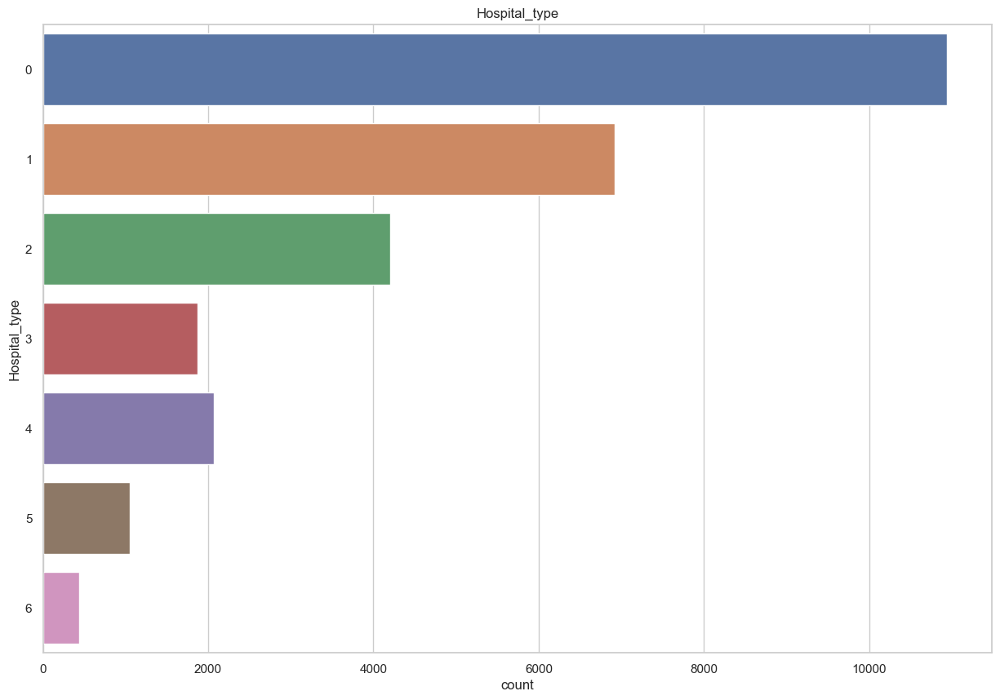

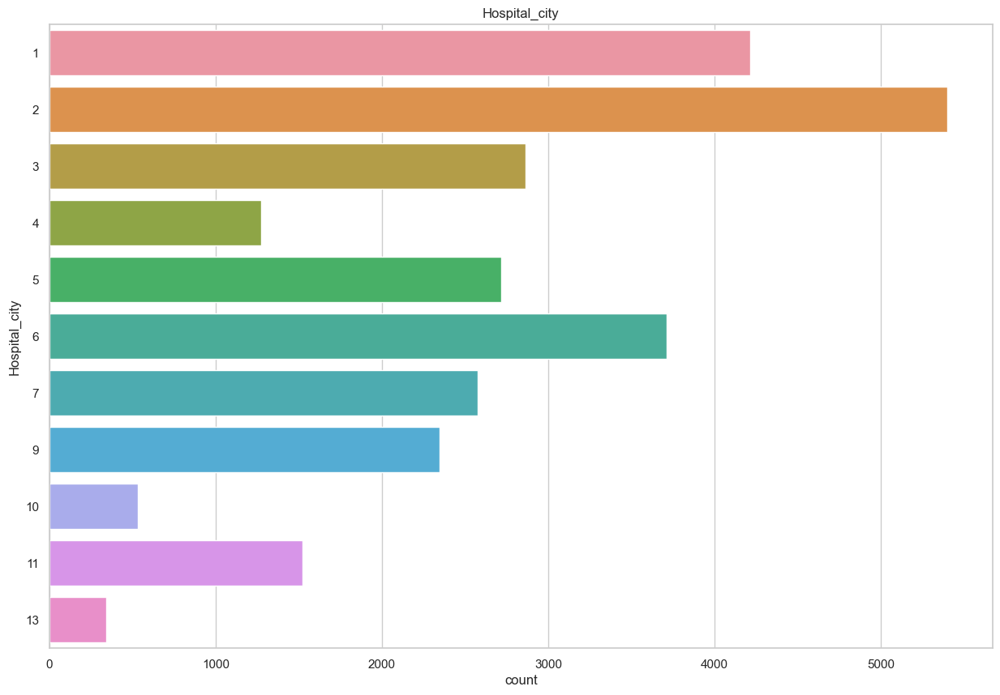

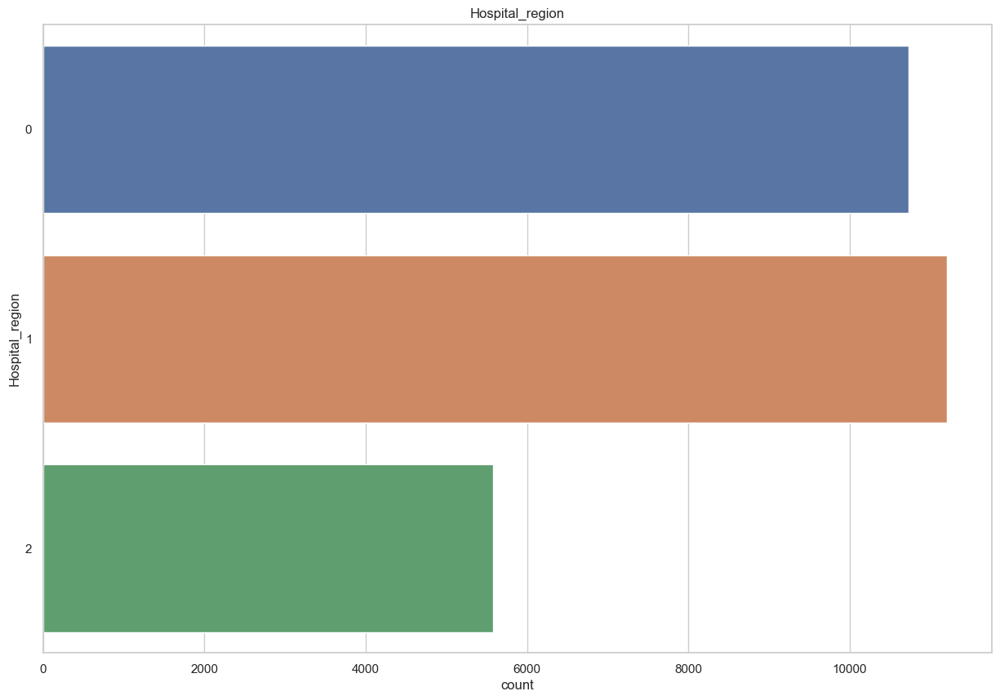

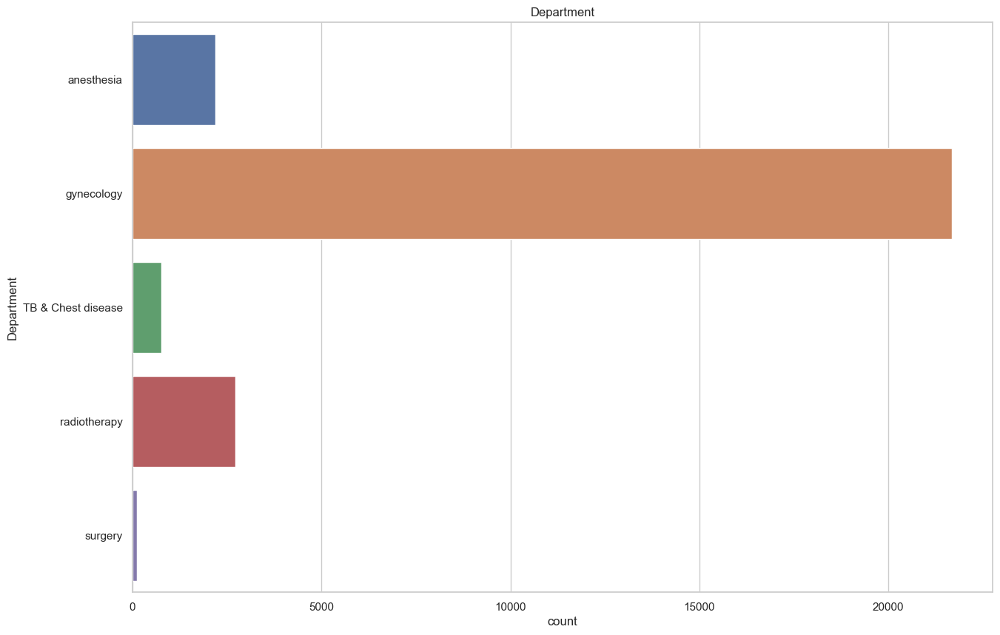

...

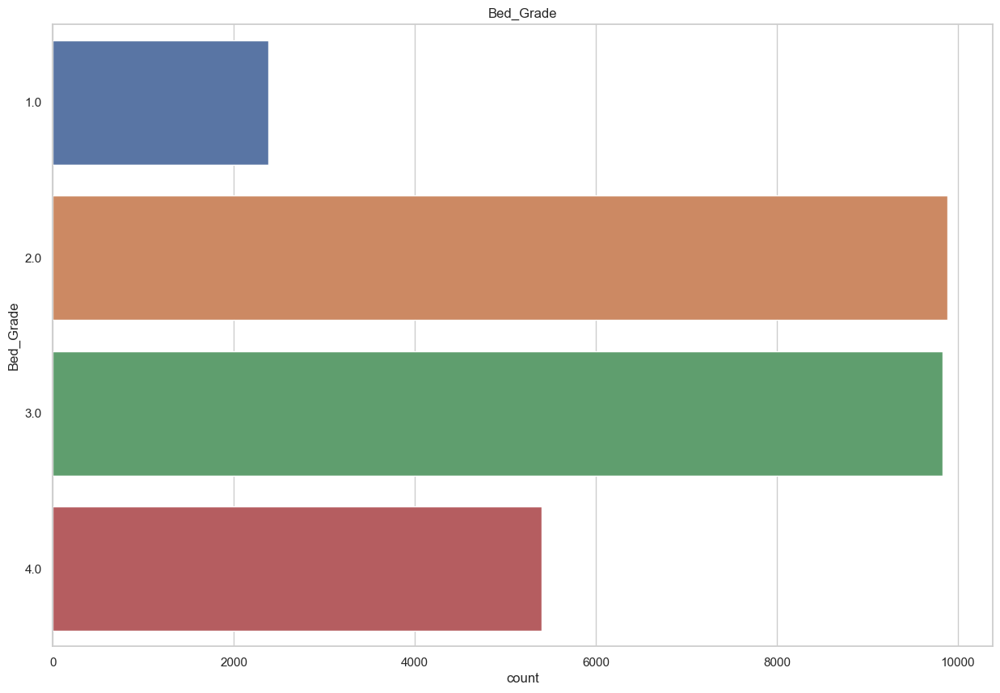

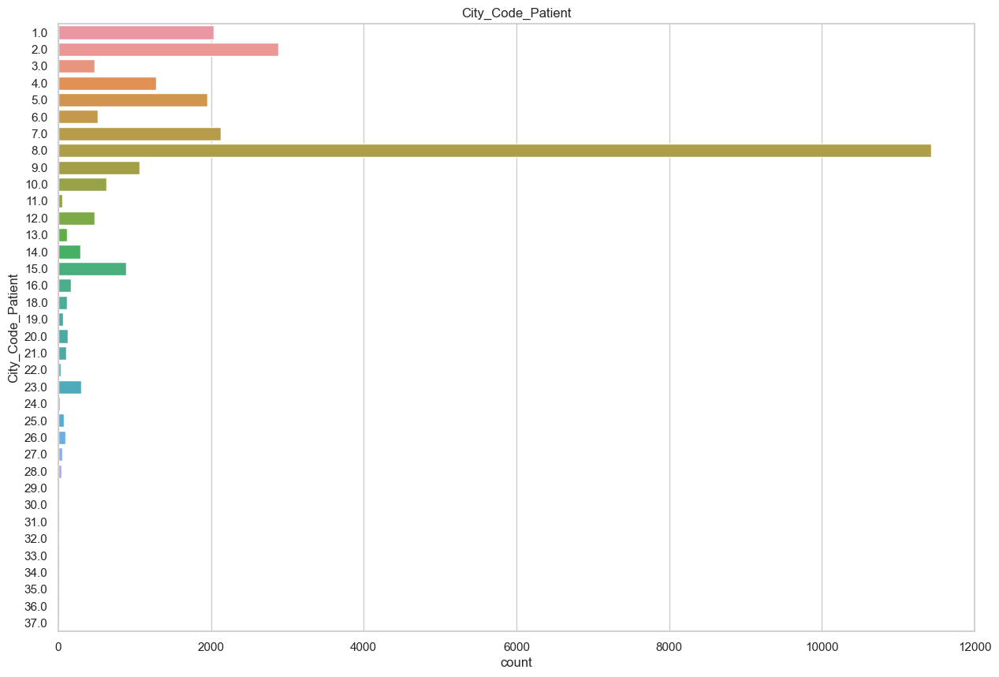

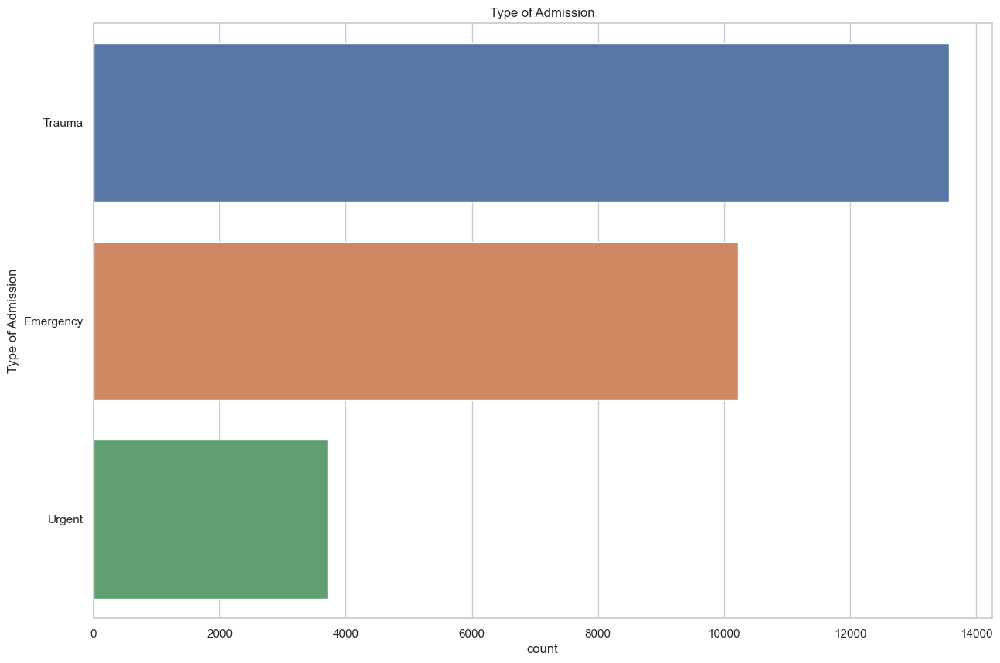

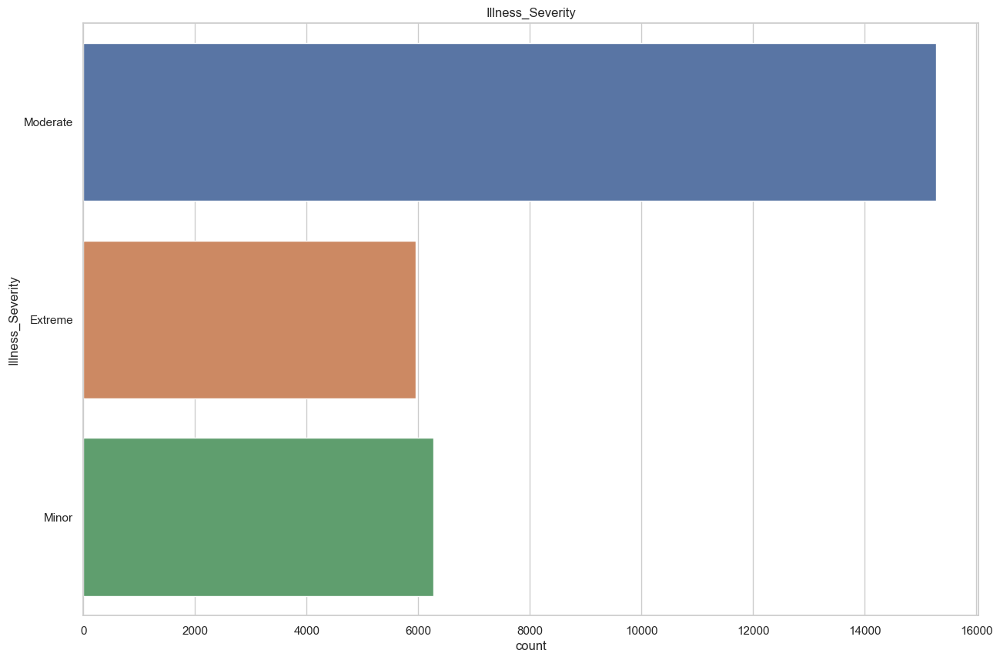

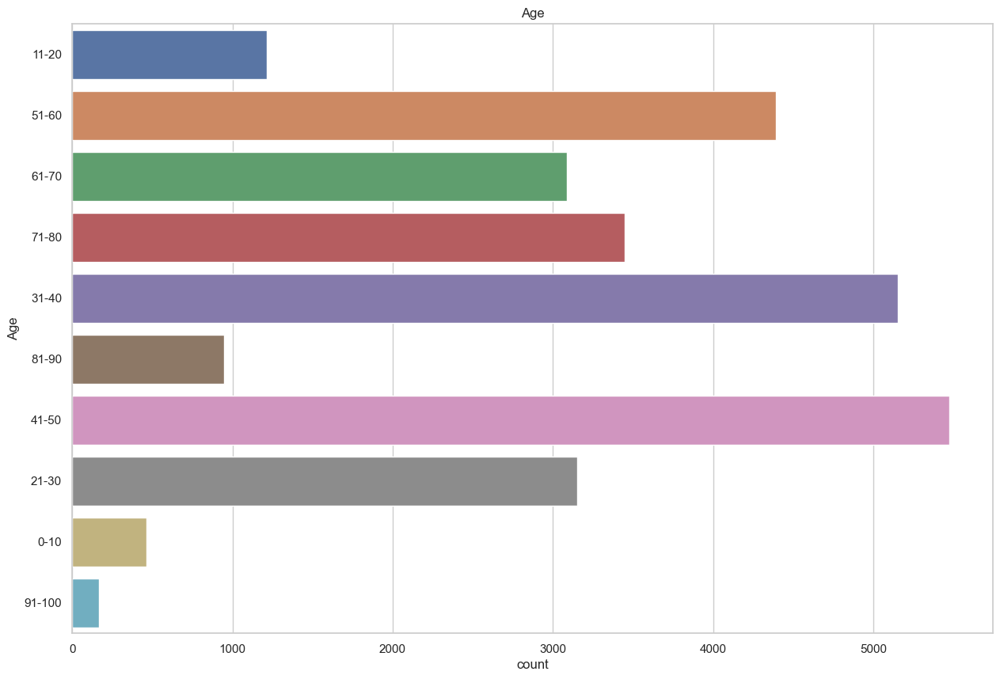

In [ ]:

for i in cat_data.columns:
    sns.countplot(y=udf[i])
    plt.title(i)
    plt.show()

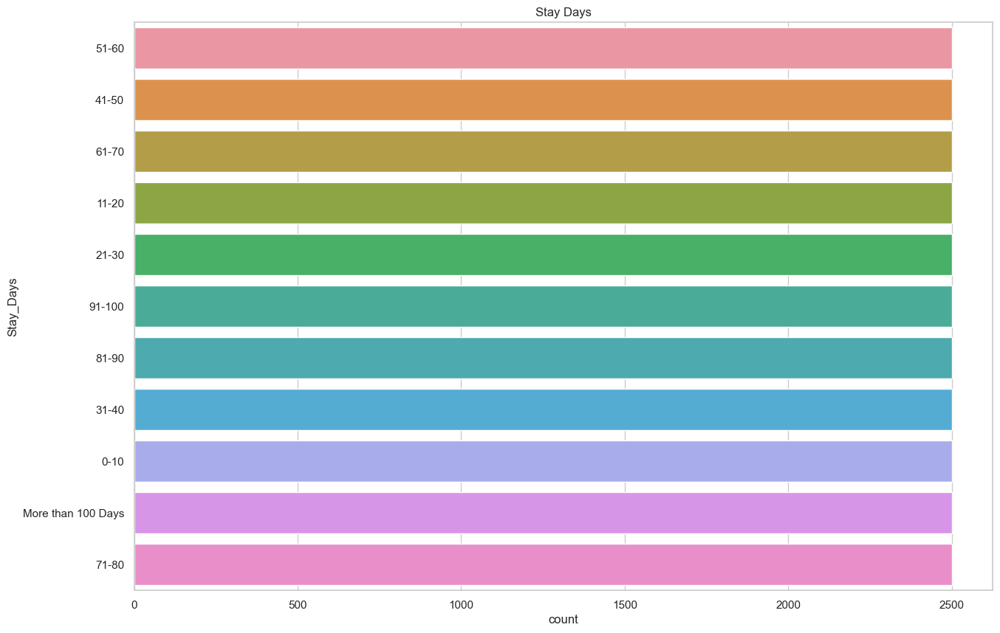

In [ ]:

sns.countplot(y=udf['Stay_Days'])
plt.title('Stay Days')
plt.show()

# Plotting target column

In [ ]:
udf['Stay_Days'].value_counts(normalize=True)

51-60                 0.090909
41-50                 0.090909
61-70                 0.090909
11-20                 0.090909
21-30                 0.090909
91-100                0.090909
81-90                 0.090909
31-40                 0.090909
0-10                  0.090909
More than 100 Days    0.090909
71-80                 0.090909
Name: Stay_Days, dtype: float64

# Bivariate analysis for numerical and targeted column

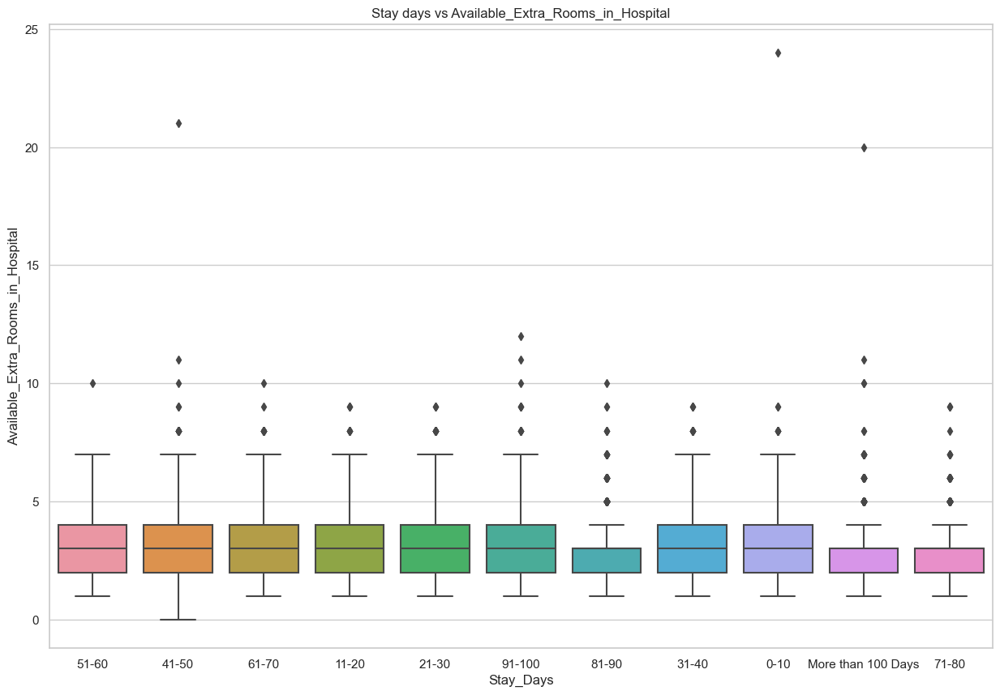

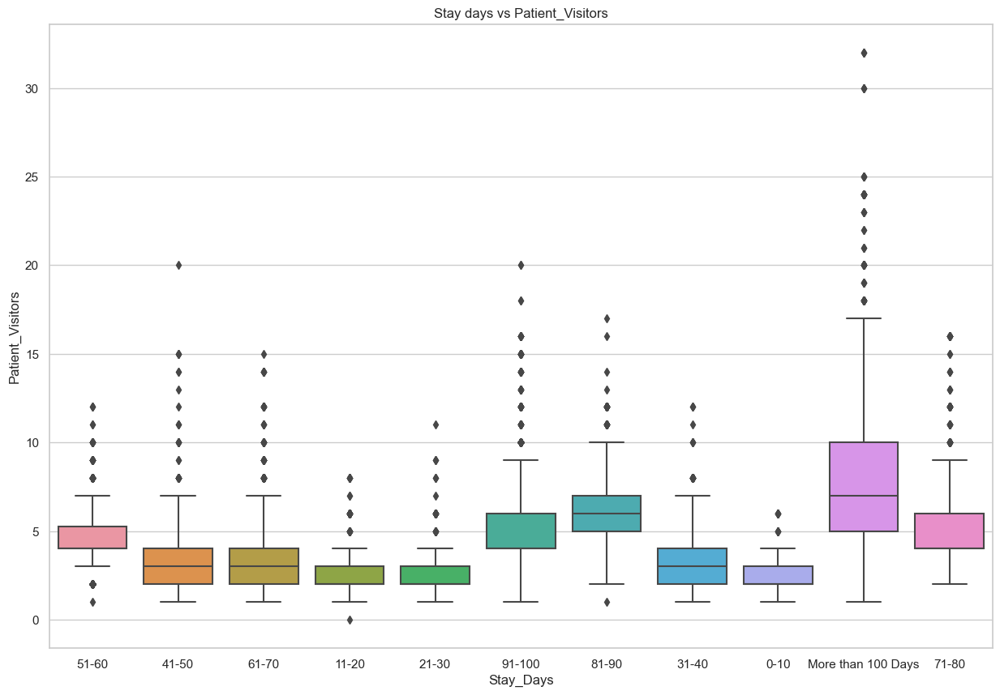

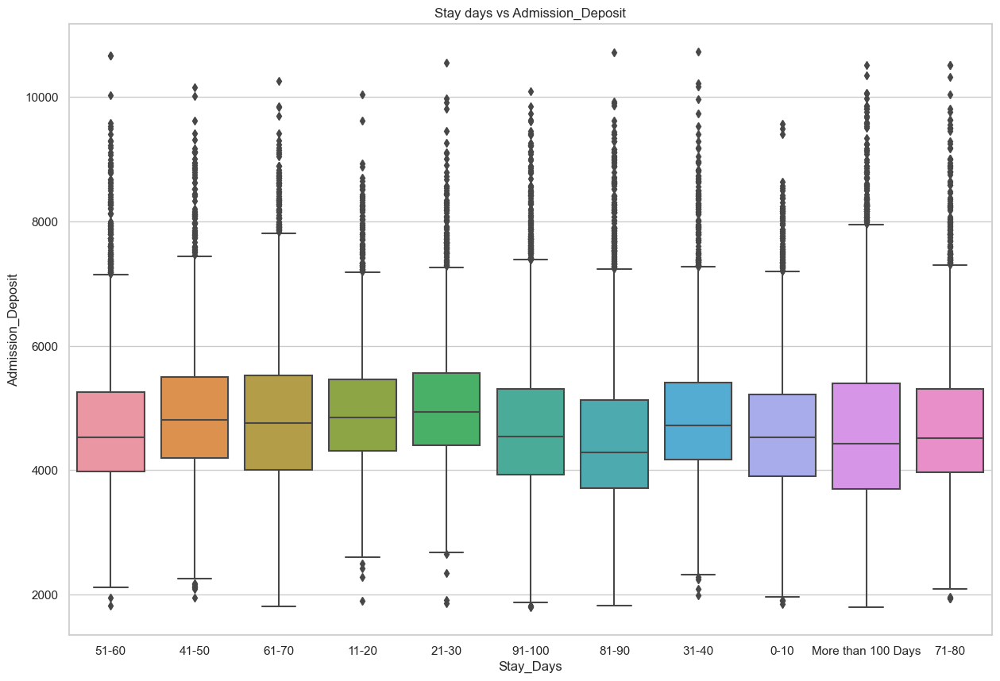

In [ ]:
for i in num_data.columns:
    sns.boxplot(x=udf['Stay_Days'],y=udf[i])
    plt.title(f'Stay days vs {i}')
    plt.show()

# Bivariate analysis for independent categorical column and target column

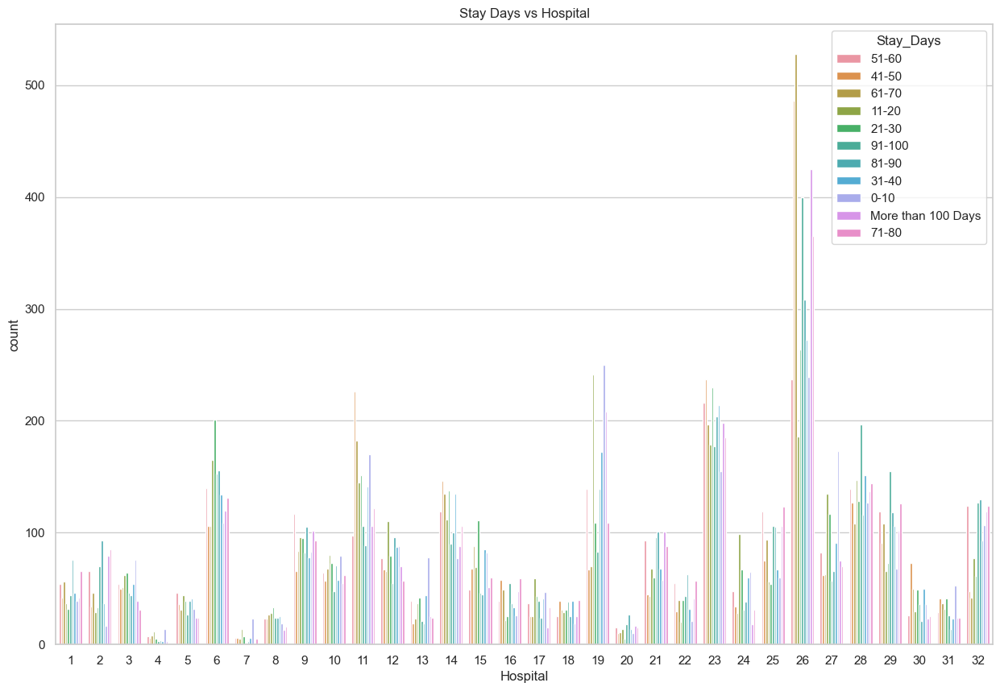

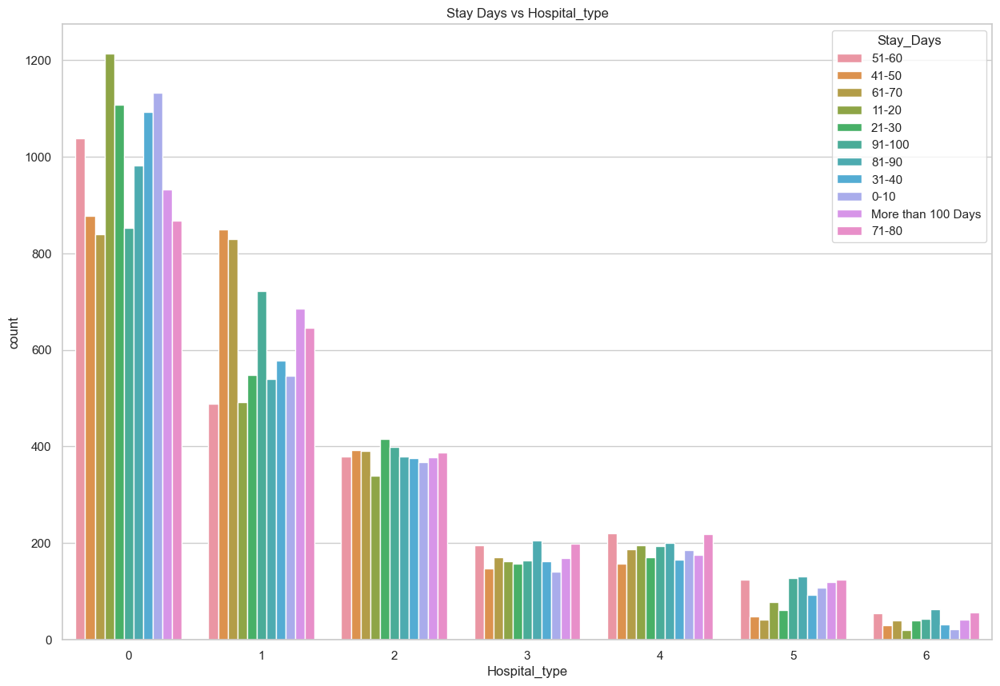

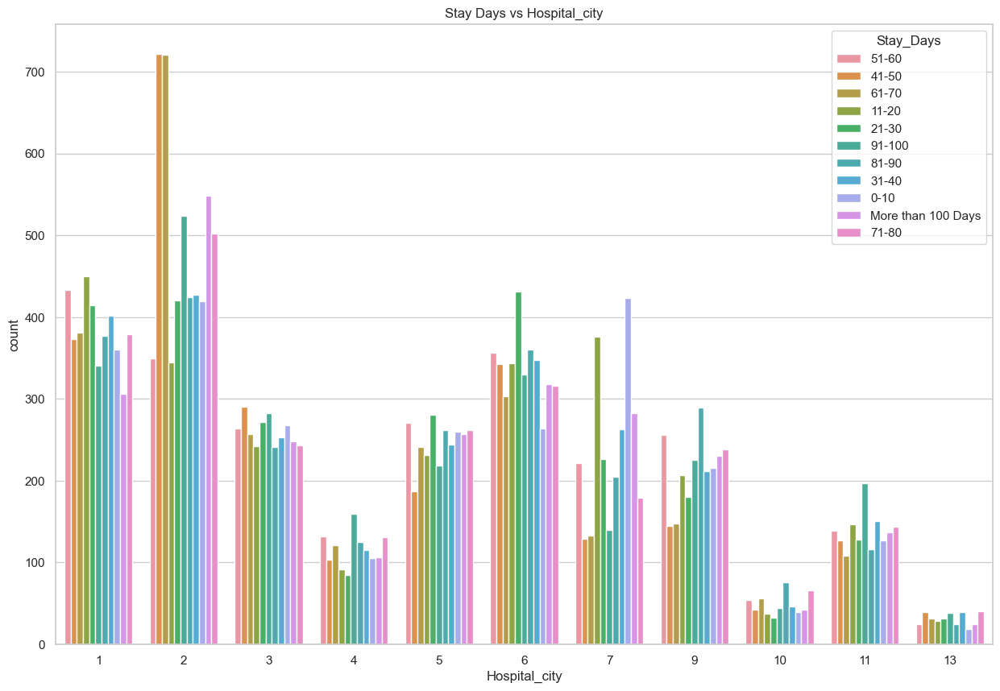

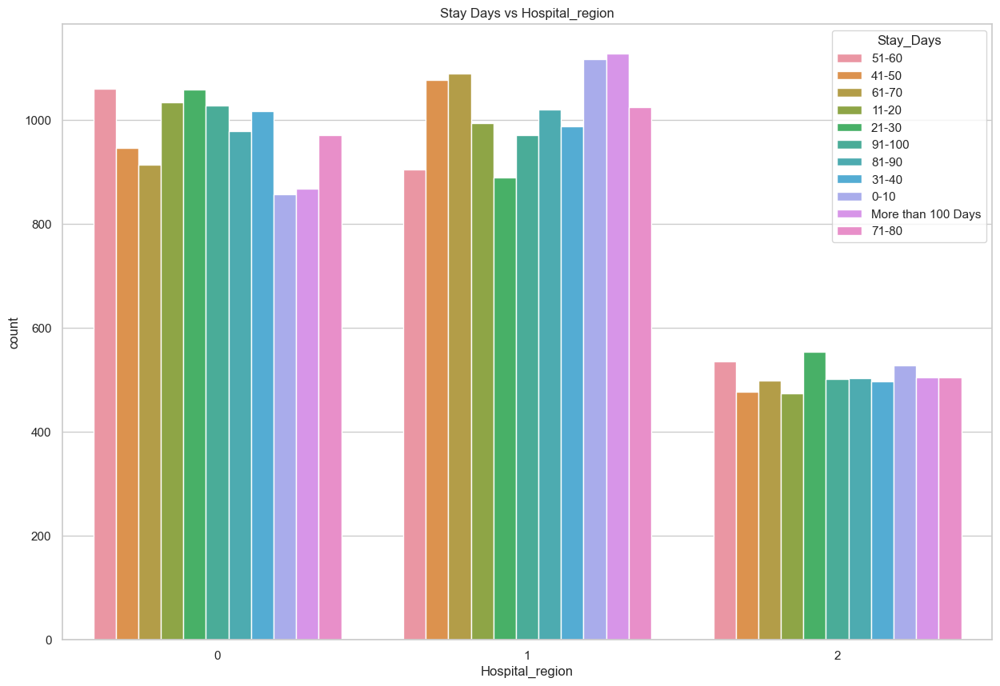

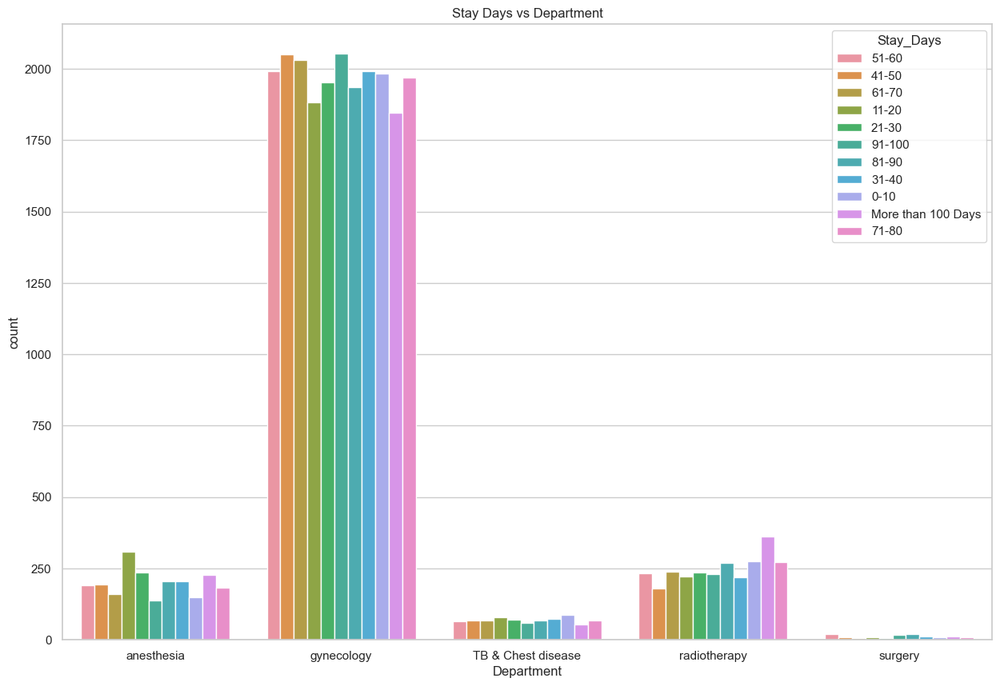

...

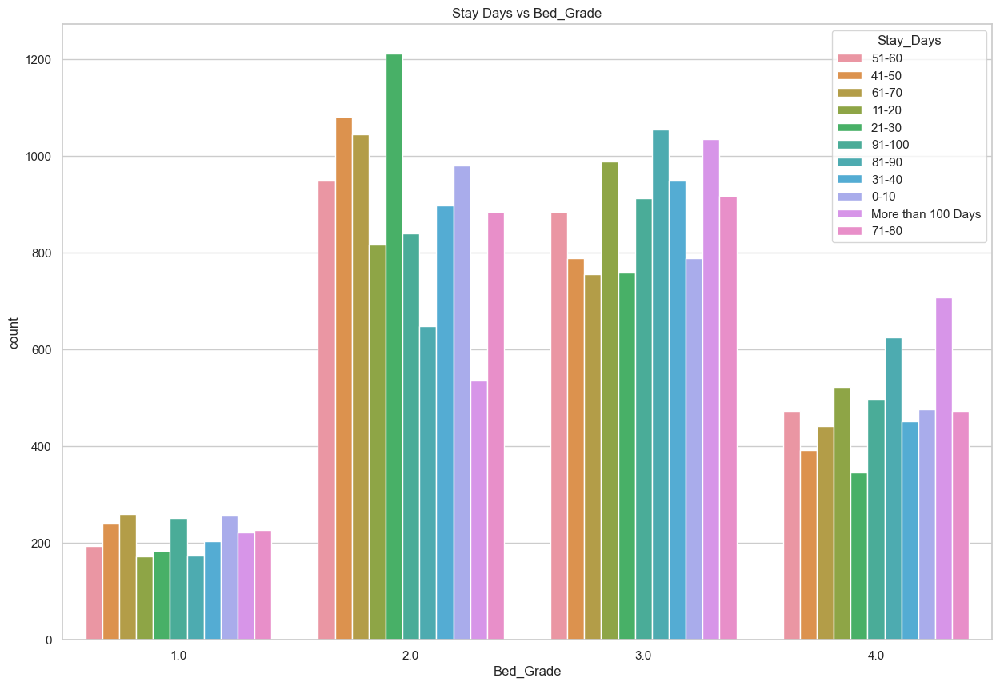

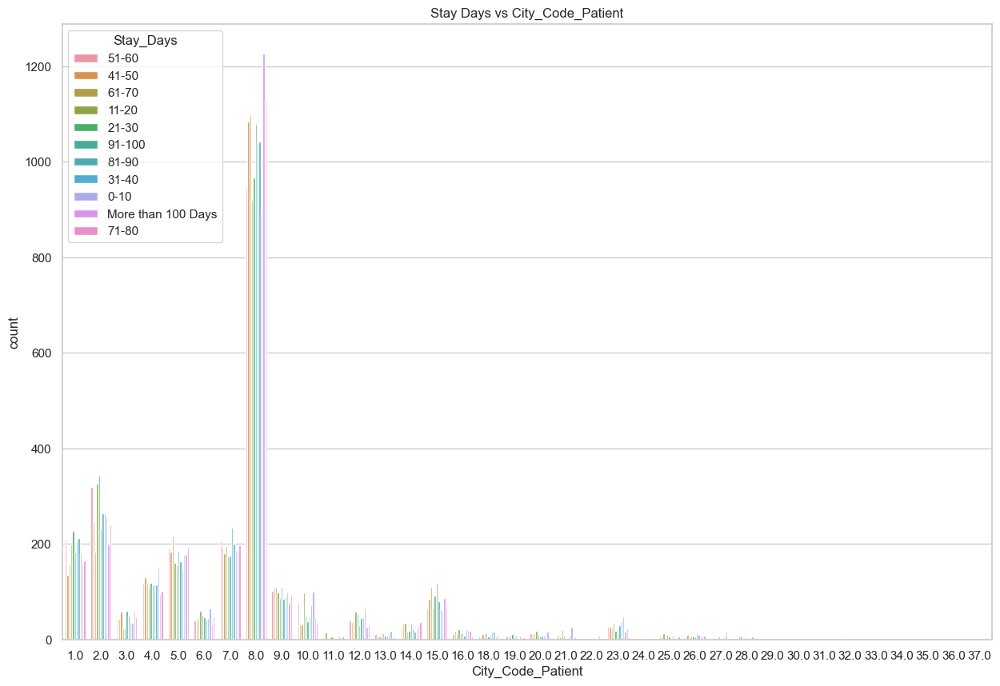

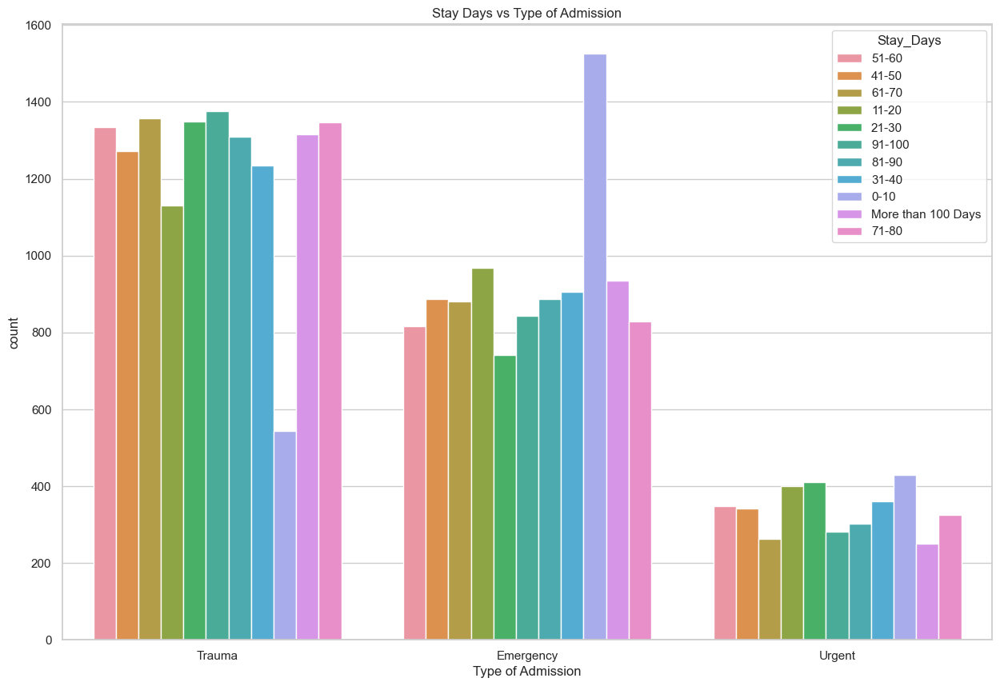

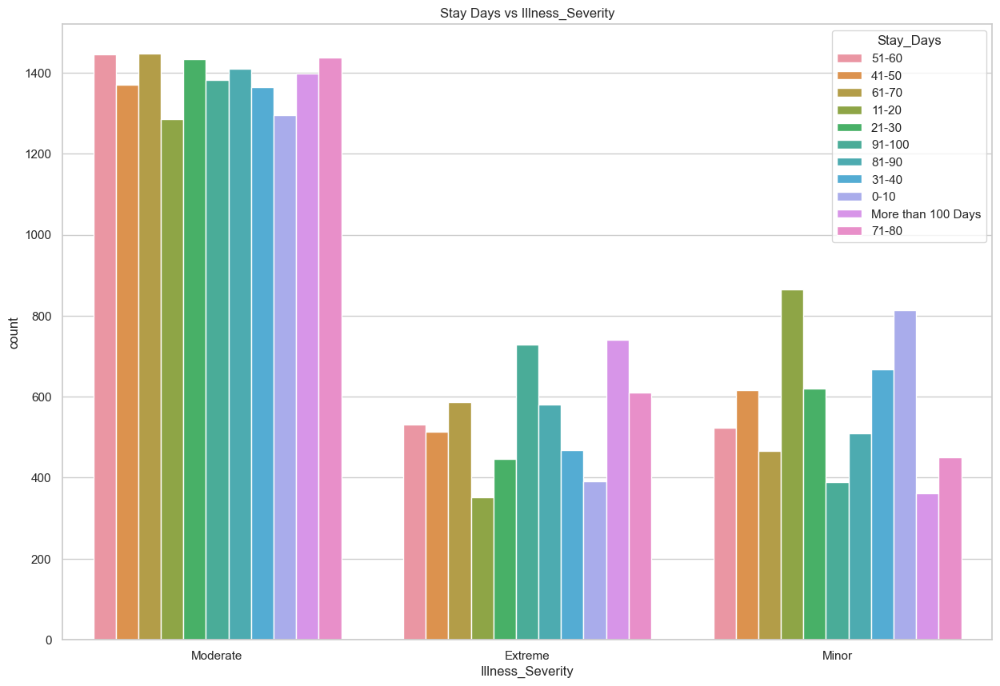

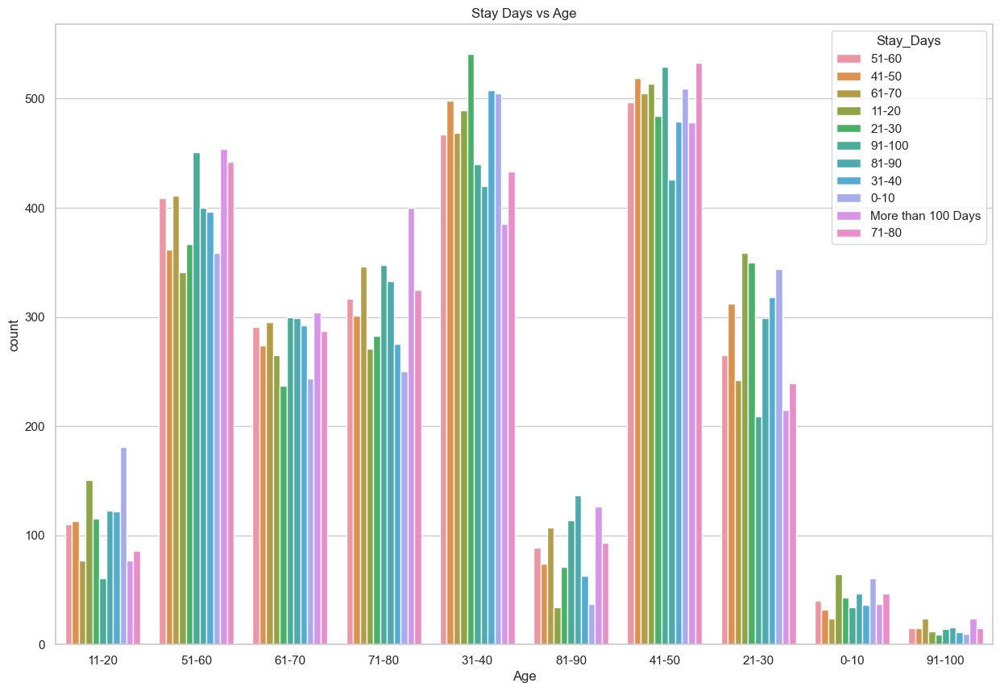

In [ ]:
for i in cat_data.columns:
    sns.countplot(x=udf[i],hue=udf['Stay_Days'])
    plt.title(f'Stay Days vs {i}')
    plt.show()

In [ ]:
num_data.skew()

Available_Extra_Rooms_in_Hospital    1.376523
Patient_Visitors                     2.561205
Admission_Deposit                    0.908020
dtype: float64

# Outlier treatment

In [ ]:
q1=udf.quantile(.25)
q3=udf.quantile(.75)
iqr=q3-q1
ul=(q3+(1.5*iqr))
ll=(q1-(1.5*iqr))
df=udf[~((udf>ul)|(udf<ll))]


In [ ]:
df.isna().sum()

Hospital                                0
Hospital_type                         442
Hospital_city                           0
Hospital_region                         0
Available_Extra_Rooms_in_Hospital     111
Department                              0
Ward_Type                               0
Ward_Facility                           0
Bed_Grade                               0
City_Code_Patient                    2566
Type of Admission                       0
Illness_Severity                        0
Patient_Visitors                     1348
Age                                     0
Admission_Deposit                    1033
Stay_Days                               0
dtype: int64

In [ ]:
df.dropna(inplace=True)


In [ ]:
df.shape

(22361, 16)

In [ ]:
df['Stay_Days'].value_counts()

11-20                 2177
0-10                  2149
31-40                 2145
51-60                 2141
21-30                 2136
41-50                 2129
61-70                 2058
71-80                 2051
81-90                 1991
91-100                1844
More than 100 Days    1540
Name: Stay_Days, dtype: int64

In [ ]:
num_data=df[['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit']]
cat_data=df.drop(['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit','Stay_Days'],axis=1)


# Statistical test

In [ ]:
sig_lvl=0.05
for i in num_data.columns:
    print(i,'\n.............................................')
    result=df.groupby(by='Stay_Days')[i].apply(list)
    print('Hypothesis Framing')
    print('------------------')
    print('H0: The averages of all classes are the same.')
    print('H1: Atleast one class has a different average.\n\n')

    stat,pval=stats.f_oneway(*result)
    print('Pvalue= ',pval)
    if pval<sig_lvl:
        print('Result')
        print('------')
        print('pval<sig_lvl')
        print('Rejecting the null hypothesis')
        print('Atleast one class has a different average.')
        print('______________________________________________________________________________________\n\n\n')
    else:
        print('Result')
        print('------')
        print('pval>sig_lvl')
        print('Failed to reject null hypothesis')
        print('The averages of all classes are the same.')
        print('______________________________________________________________________________________\n\n\n')


Available_Extra_Rooms_in_Hospital 
.............................................
Hypothesis Framing
------------------
H0: The averages of all classes are the same.
H1: Atleast one class has a different average.


Pvalue=  1.608081793649259e-191
Result
------
pval<sig_lvl
Rejecting the null hypothesis
Atleast one class has a different average.
______________________________________________________________________________________



Patient_Visitors 
.............................................
Hypothesis Framing
------------------
H0: The averages of all classes are the same.
H1: Atleast one class has a different average.


Pvalue=  0.0
Result
------
pval<sig_lvl
Rejecting the null hypothesis
Atleast one class has a different average.
______________________________________________________________________________________



Admission_Deposit 
.............................................
Hypothesis Framing
------------------
H0: The averages of all classes are the same.
H1: Atleast one

In [ ]:
for i in cat_data.columns:
    print('\n\n\n',i,'\n.................................\n\n\n')
    result = pd.crosstab(index=df['Stay_Days'],columns=df[i])
    chi2,pval,dof,exp=stats.chi2_contingency(result)
    print('Hypothesis Framing')
    print('------------------')
    print('H0: The variables are independent.')
    print('H1: The variables are not independent.\n\n')

    print('Pvalue= ',pval)
    if pval<sig_lvl:
        print('Result')
        print('------')
        print('pval<sig_lvl')
        print('Rejecting the null hypothesis')
        print('The variables are dependent.')
        print('______________________________________________________________________________________\n\n\n')
    else:
        print('Result')
        print('------')
        print('pval>sig_lvl')
        print('Failed to reject null hypothesis')
        print('The variables are independent.')
        print('______________________________________________________________________________________\n\n\n')





 Hospital 
.................................



Hypothesis Framing
------------------
H0: The variables are independent.
H1: The variables are not independent.


Pvalue=  4.476793203863637e-287
Result
------
pval<sig_lvl
Rejecting the null hypothesis
The variables are dependent.
______________________________________________________________________________________






 Hospital_type 
.................................



Hypothesis Framing
------------------
H0: The variables are independent.
H1: The variables are not independent.


Pvalue=  1.6389193682960645e-95
Result
------
pval<sig_lvl
Rejecting the null hypothesis
The variables are dependent.
______________________________________________________________________________________






 Hospital_city 
.................................



Hypothesis Framing
------------------
H0: The variables are independent.
H1: The variables are not independent.


Pvalue=  2.08662578515955e-157
Result
------
pval<sig_lvl
Rejecting the null hy

# Feature encoding

In [ ]:
df['Illness_Severity'].replace({'Extreme':2,'Moderate':1,'Minor':0},inplace=True)
df.Age.replace({'0-10':0,'11-20':1,'21-30':2,'31-40':3,'41-50':4,'51-60':5,'61-70':6,'71-80':7,'81-90':8,'81-90':9,'91-100':10},inplace=True)
df.Stay_Days.replace({'0-10':0,'11-20':1,'21-30':2,'31-40':3,'41-50':4,'51-60':5,'61-70':6,'71-80':7,'81-90':8,'91-100':9,'More than 100 Days':10},inplace=True)


In [ ]:
dummy_encode=pd.get_dummies(df,columns=['Hospital','Hospital_city','Hospital_region','Hospital_type','Department','Ward_Type','Ward_Facility','Bed_Grade','City_Code_Patient','Type of Admission'])


In [ ]:
num_data=df[['Available_Extra_Rooms_in_Hospital',	'Patient_Visitors',	'Admission_Deposit']]
num_data.skew()


Available_Extra_Rooms_in_Hospital    0.680762
Patient_Visitors                     0.927862
Admission_Deposit                    0.311324
dtype: float64

In [ ]:
dummy_encode.shape

(22361, 92)

# Scaling 

In [ ]:
scaler=StandardScaler()
for i in num_data.columns:
  scaler.fit(dummy_encode[[i]])
  dummy_encode[i]=scaler.transform(dummy_encode[[i]])
dummy_encode


,Available_Extra_Rooms_in_Hospital,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days,Hospital_1,Hospital_2,Hospital_3,Hospital_4,...,City_Code_Patient_6.0,City_Code_Patient_7.0,City_Code_Patient_8.0,City_Code_Patient_9.0,City_Code_Patient_10.0,City_Code_Patient_11.0,City_Code_Patient_12.0,Type of Admission_Emergency,Type of Admission_Trauma,Type of Admission_Urgent
1,0.851155,2,0.118718,5,-0.565927,4,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
2,-0.951438,1,0.118718,6,0.340622,5,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,-0.050141,0,-0.440510,7,0.853418,6,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
4,-0.050141,1,-0.999738,5,-1.104159,1,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
6,0.851155,1,0.118718,9,1.686711,9,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27495,0.851155,1,-0.999738,3,1.365196,5,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
27496,-0.050141,2,-0.440510,3,-0.228133,5,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
27497,-0.951438,1,-0.999738,4,-0.382786,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
27498,-0.951438,1,1.237174,6,-0.318687,8,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0


In [ ]:
num_data.skew()


Available_Extra_Rooms_in_Hospital    0.680762
Patient_Visitors                     0.927862
Admission_Deposit                    0.311324
dtype: float64

# Transforming the data

In [ ]:
pt=PowerTransformer()
for i in num_data.columns:
  dummy_encode[i]=pt.fit_transform(dummy_encode[[i]])
dummy_encode


,Available_Extra_Rooms_in_Hospital,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days,Hospital_1,Hospital_2,Hospital_3,Hospital_4,...,City_Code_Patient_6.0,City_Code_Patient_7.0,City_Code_Patient_8.0,City_Code_Patient_9.0,City_Code_Patient_10.0,City_Code_Patient_11.0,City_Code_Patient_12.0,Type of Admission_Emergency,Type of Admission_Trauma,Type of Admission_Urgent
1,0.913125,2,0.379663,5,-0.531521,4,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
2,-1.002114,1,0.379663,6,0.397810,5,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,0.093671,0,-0.292989,7,0.872268,6,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
4,0.093671,1,-1.184063,5,-1.136918,1,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
6,0.913125,1,0.379663,9,1.595416,9,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27495,0.913125,1,-1.184063,3,1.322096,5,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
27496,0.093671,2,-0.292989,3,-0.170010,5,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
27497,-1.002114,1,-1.184063,4,-0.333526,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
27498,-1.002114,1,1.236705,6,-0.265324,8,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0


In [ ]:
for i in num_data.columns:
  print(i,':',dummy_encode[i].skew())


Available_Extra_Rooms_in_Hospital : 0.05102636070438374
Patient_Visitors : 0.15639754084061058
Admission_Deposit : -0.017566855027404335


# Splitting the dependent and independent variables

In [ ]:
x=dummy_encode.drop(['Stay_Days'],axis=1)
y=dummy_encode[['Stay_Days']]


# Train test split

In [ ]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2,stratify=y,random_state=102)

In [ ]:
print(x.shape,xtrain.shape,xtest.shape,y.shape,ytrain.shape,ytest.shape)

(22361, 91) (17888, 91) (4473, 91) (22361, 1) (17888, 1) (4473, 1)


# Logistic regression model

Model Name LOGISTIC REGRESSION




Accuracy score:  0.25709814442208806


precision score:  0.24007646538434313


recall score:  0.25709814442208806


f1 score:  0.23834985840909417


classification report: 
               precision    recall  f1-score   support

           0       0.31      0.51      0.39       430
           1       0.23      0.27      0.25       436
           2       0.24      0.29      0.26       427
           3       0.11      0.03      0.05       429
           4       0.20      0.21      0.20       426
           5       0.24      0.19      0.21       428
           6       0.20      0.17      0.18       412
           7       0.26      0.16      0.20       410
           8       0.31      0.58      0.41       398
           9       0.31      0.22      0.26       369
          10       0.23      0.18      0.20       308

    accuracy                           0.26      4473
   macro avg       0.24      0.26      0.24      4473
weighted avg       0.24      0.26

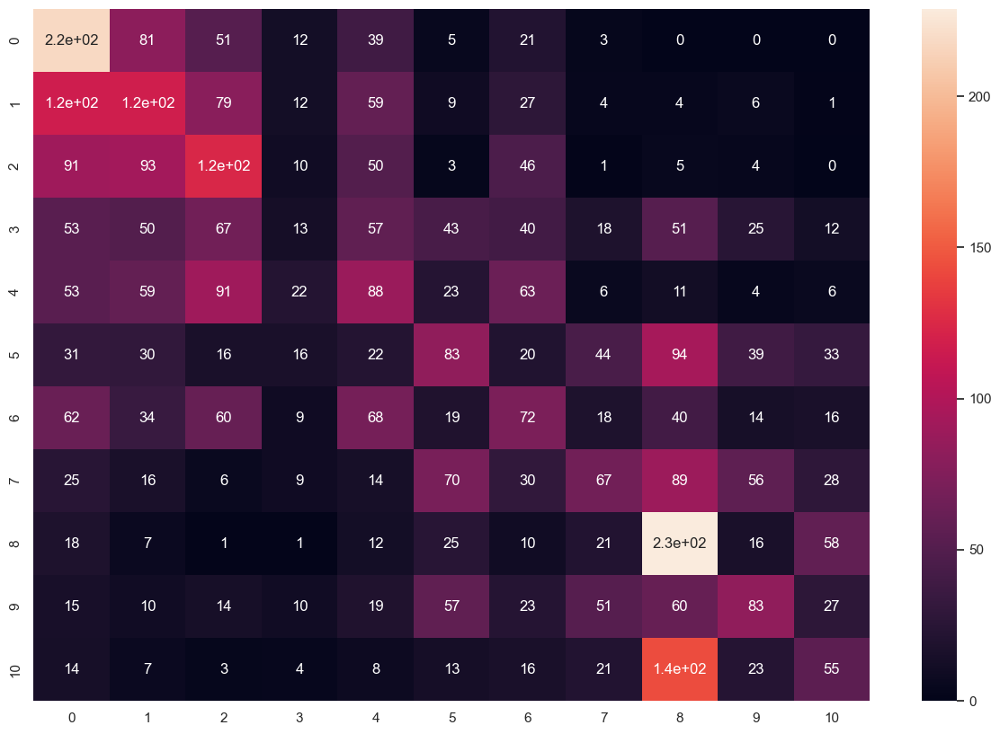

In [ ]:
lm=LogisticRegression(multi_class='ovr',solver='sag')
lm.fit(xtrain,ytrain)

ypredlm=lm.predict(xtest)
ypred_probalm=lm.predict_proba(xtest)[:,1]
metric_score(ytest,ypredlm,ypred_probalm,'LOGISTIC REGRESSION')


In [ ]:
RF = OneVsRestClassifier(LogisticRegression(multi_class='ovr',solver='sag'))
RF.fit(xtrain,ytrain)
ypred=RF.predict(xtest)
ypred_proba=RF.predict_proba(xtest)
ypred_proba.shape


(4473, 11)

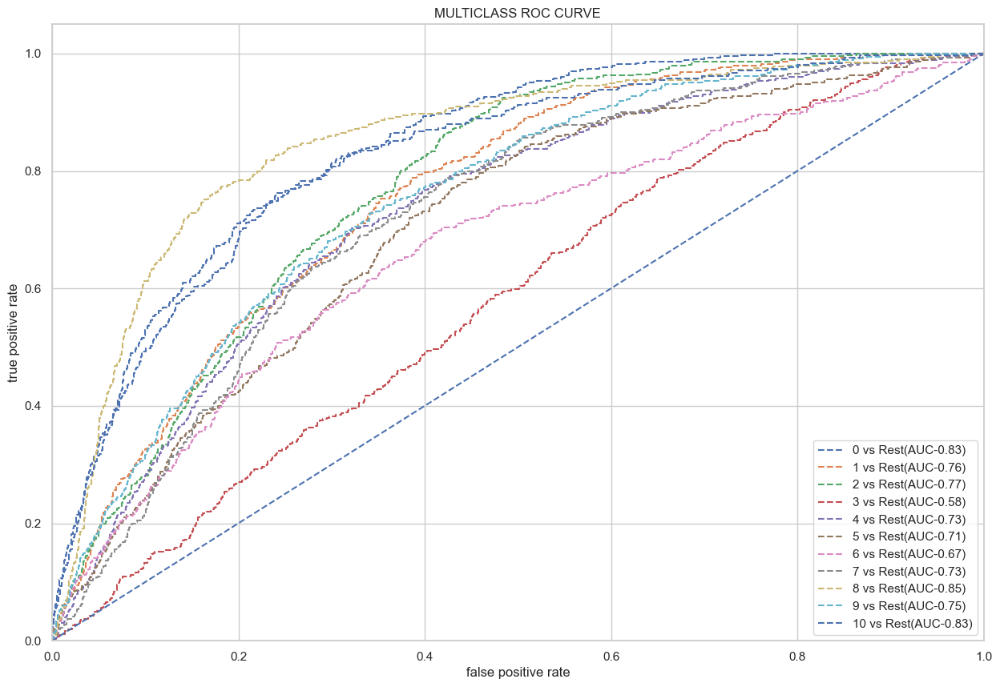

Average AUC score: 0.7467036392853941


In [ ]:
ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3,4,5,6,7,8,9,10]
n_classes = 11

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3]+roc_auc[4]+roc_auc[5]+roc_auc[6]+roc_auc[7]+roc_auc[8]+roc_auc[9]+roc_auc[10])/11)




# Decision tree classifier

Model Name DECISION TREE




Accuracy score:  0.21327967806841047


precision score:  0.2127981864513567


recall score:  0.21327967806841047


f1 score:  0.21287804375392533


classification report: 
               precision    recall  f1-score   support

           0       0.25      0.27      0.26       430
           1       0.21      0.20      0.21       436
           2       0.20      0.21      0.20       427
           3       0.13      0.13      0.13       429
           4       0.18      0.17      0.18       426
           5       0.17      0.17      0.17       428
           6       0.18      0.19      0.18       412
           7       0.17      0.16      0.17       410
           8       0.38      0.37      0.37       398
           9       0.22      0.21      0.21       369
          10       0.28      0.30      0.29       308

    accuracy                           0.21      4473
   macro avg       0.22      0.22      0.22      4473
weighted avg       0.21      0.21      0

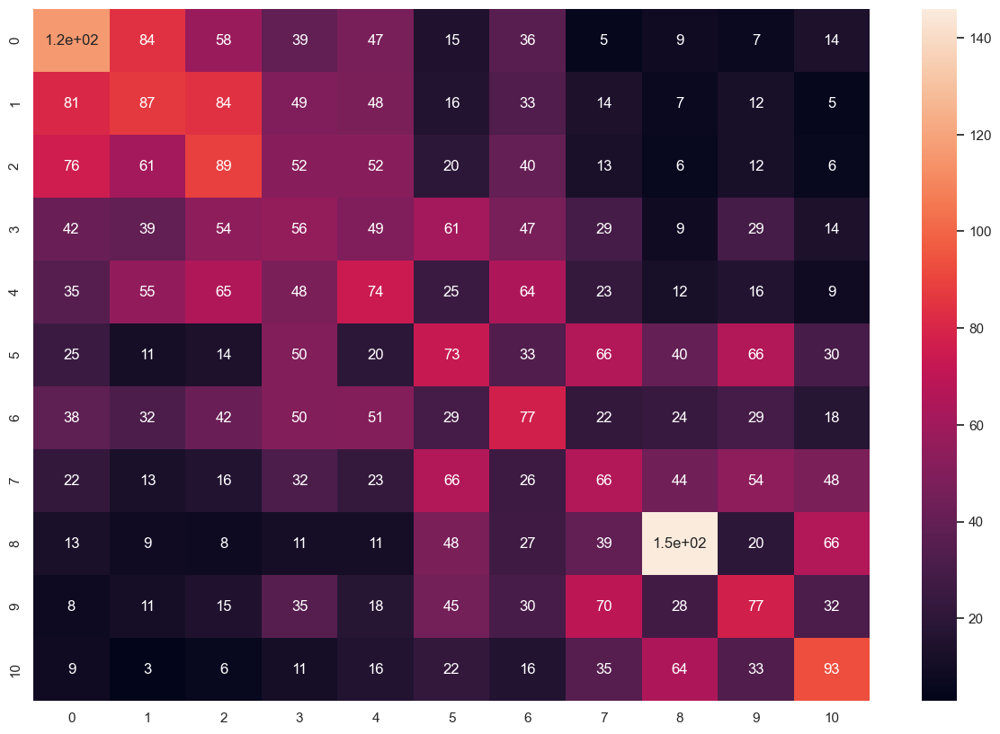

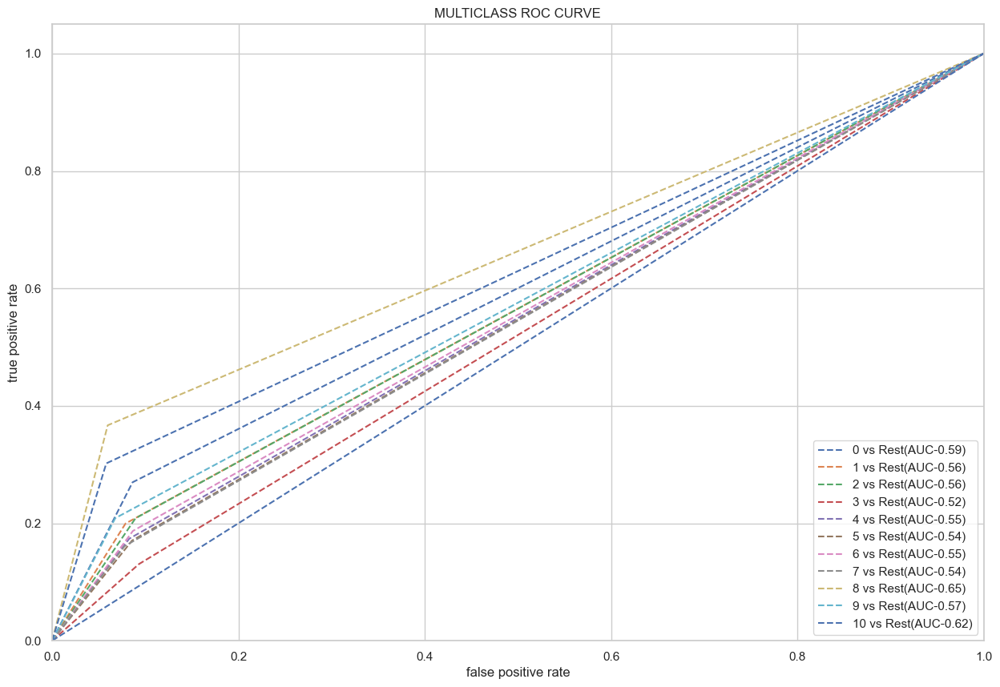

Average AUC score: 0.5687086420070151


In [ ]:
dt=DecisionTreeClassifier().fit(xtrain,ytrain)
dt
ypred=dt.predict(xtest)
ypred_proba=dt.predict_proba(xtest)

metric_score(ytest,ypred,ypred_proba,'DECISION TREE')
ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3,4,5,6,7,8,9,10]
n_classes = 11

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3]+roc_auc[4]+roc_auc[5]+roc_auc[6]+roc_auc[7]+roc_auc[8]+roc_auc[9]+roc_auc[10])/11)


# Randomforest classifier

Model Name RANDOM FOREST




Accuracy score:  0.2718533422758775


precision score:  0.26514155893370717


recall score:  0.2718533422758775


f1 score:  0.26653617167393495


classification report: 
               precision    recall  f1-score   support

           0       0.30      0.39      0.34       430
           1       0.25      0.26      0.26       436
           2       0.24      0.25      0.24       427
           3       0.16      0.12      0.14       429
           4       0.25      0.25      0.25       426
           5       0.24      0.23      0.23       428
           6       0.22      0.17      0.19       412
           7       0.24      0.22      0.23       410
           8       0.41      0.51      0.45       398
           9       0.30      0.30      0.30       369
          10       0.35      0.30      0.32       308

    accuracy                           0.27      4473
   macro avg       0.27      0.27      0.27      4473
weighted avg       0.27      0.27      0.

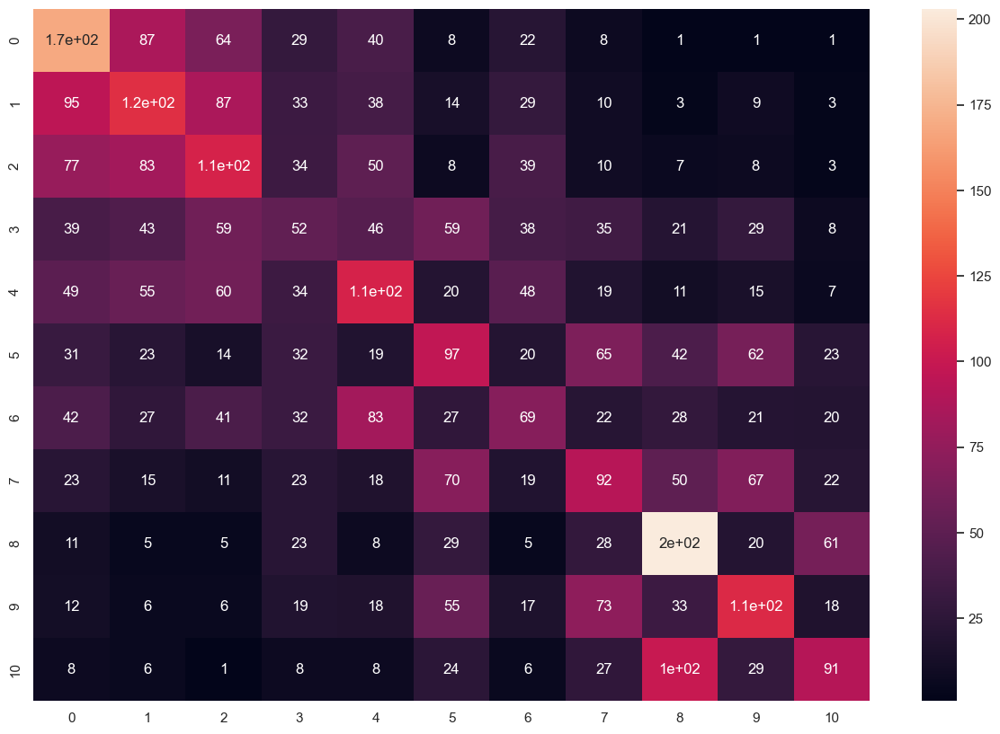

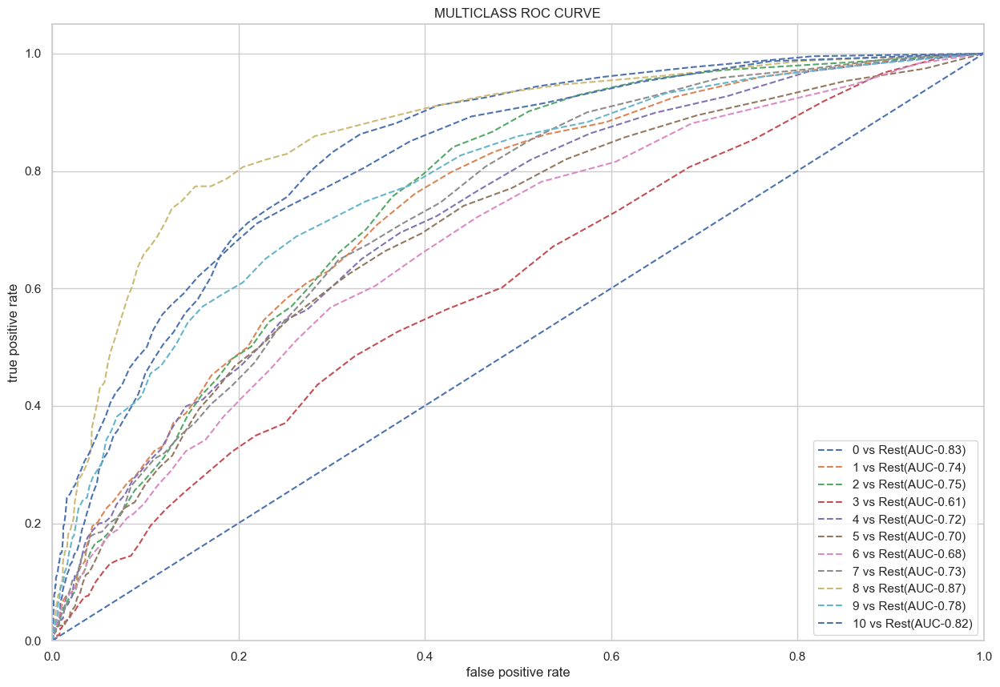

Average AUC score: 0.7468715160389207


In [ ]:

rf=RandomForestClassifier().fit(xtrain,ytrain)
rf

ypred=rf.predict(xtest)
ypred_proba=rf.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'RANDOM FOREST')
ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3,4,5,6,7,8,9,10]
n_classes = 11

for i in range(n_classes):
    fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
    roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
    plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3]+roc_auc[4]+roc_auc[5]+roc_auc[6]+roc_auc[7]+roc_auc[8]+roc_auc[9]+roc_auc[10])/11)



# Adaboost classifier

Model Name ADA BOOST CLASSIFIER




Accuracy score:  0.22334004024144868


precision score:  0.21204271554059997


recall score:  0.22334004024144868


f1 score:  0.20980662753246032


classification report: 
               precision    recall  f1-score   support

           0       0.24      0.50      0.33       430
           1       0.21      0.22      0.21       436
           2       0.22      0.19      0.20       427
           3       0.11      0.08      0.09       429
           4       0.19      0.10      0.13       426
           5       0.19      0.12      0.15       428
           6       0.17      0.14      0.15       412
           7       0.25      0.25      0.25       410
           8       0.28      0.41      0.34       398
           9       0.24      0.21      0.22       369
          10       0.25      0.27      0.26       308

    accuracy                           0.22      4473
   macro avg       0.21      0.23      0.21      4473
weighted avg       0.21      0.2

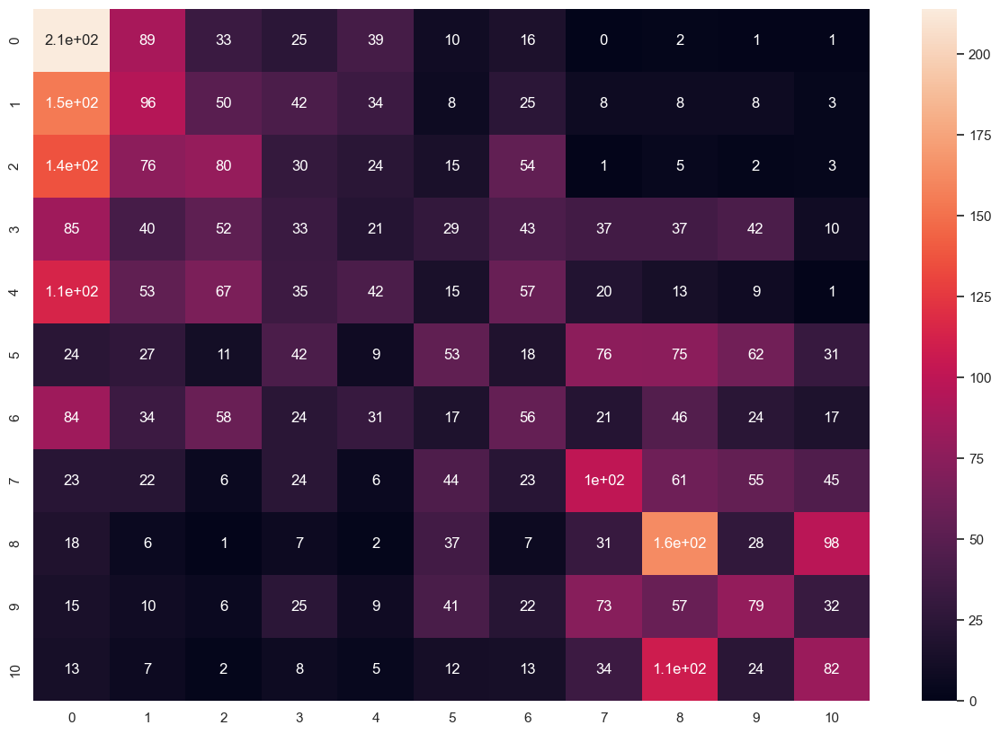

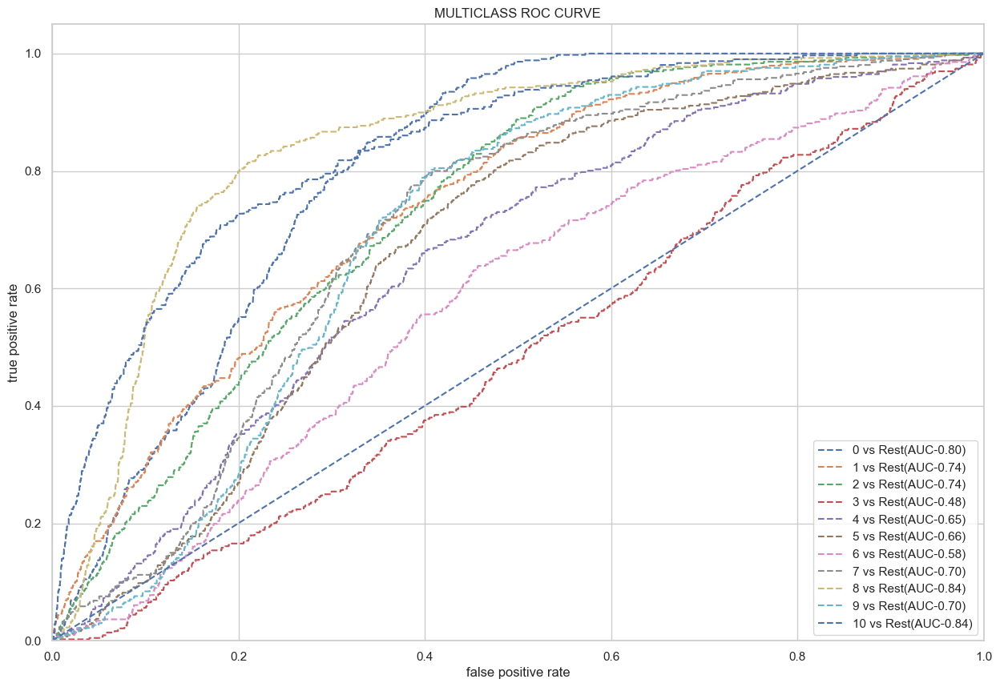

Average AUC score: 0.7033831321944951


In [ ]:

abc=AdaBoostClassifier().fit(xtrain,ytrain)
abc
ypred=abc.predict(xtest)
ypred_proba=abc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'ADA BOOST CLASSIFIER')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3,4,5,6,7,8,9,10]
n_classes = 11

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3]+roc_auc[4]+roc_auc[5]+roc_auc[6]+roc_auc[7]+roc_auc[8]+roc_auc[9]+roc_auc[10])/11)



# Bagging classifier

Model Name BAGGING CLASSIFIER




Accuracy score:  0.2622401073105298


precision score:  0.2592862784528019


recall score:  0.2622401073105298


f1 score:  0.25730953965552483


classification report: 
               precision    recall  f1-score   support

           0       0.31      0.46      0.37       430
           1       0.20      0.24      0.22       436
           2       0.22      0.23      0.23       427
           3       0.17      0.15      0.16       429
           4       0.22      0.20      0.21       426
           5       0.24      0.25      0.24       428
           6       0.20      0.14      0.16       412
           7       0.19      0.17      0.18       410
           8       0.47      0.52      0.49       398
           9       0.30      0.24      0.26       369
          10       0.39      0.28      0.33       308

    accuracy                           0.26      4473
   macro avg       0.26      0.26      0.26      4473
weighted avg       0.26      0.26    

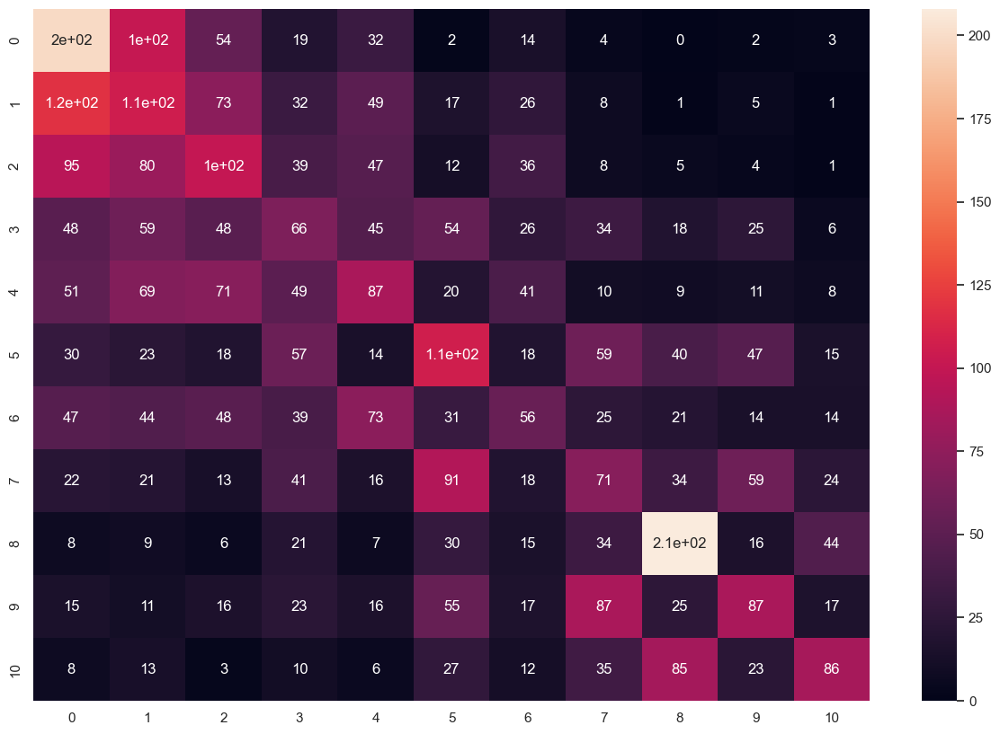

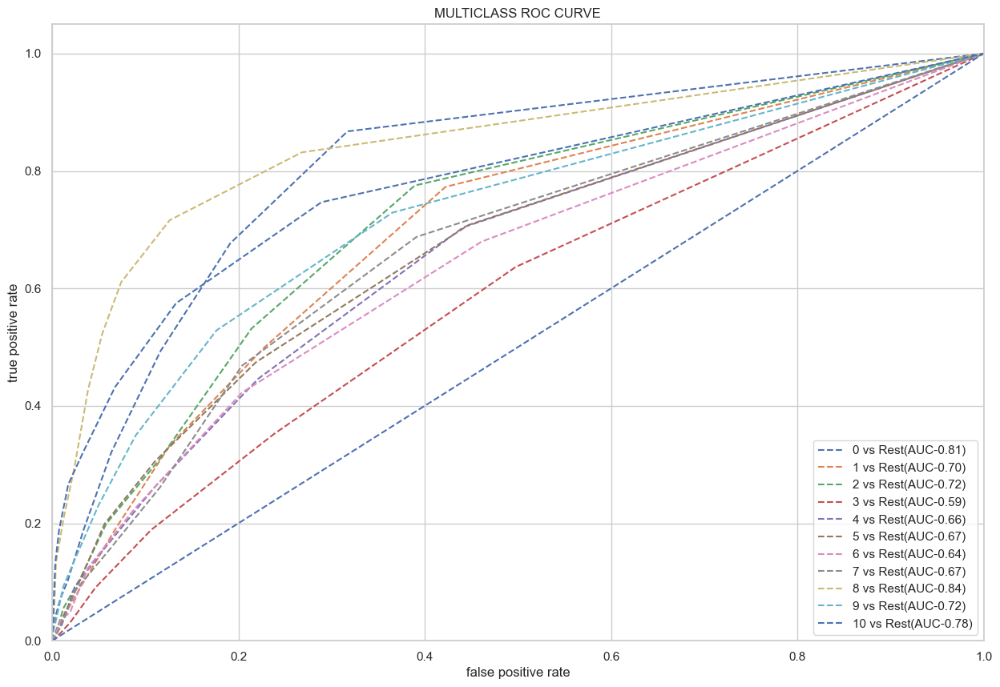

Average AUC score: 0.7091043817439661


In [ ]:


bc=BaggingClassifier().fit(xtrain,ytrain)
bc
ypred=bc.predict(xtest)
ypred_proba=bc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'BAGGING CLASSIFIER')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()


classes=[0,1,2,3,4,5,6,7,8,9,10]
n_classes = 11


for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3]+roc_auc[4]+roc_auc[5]+roc_auc[6]+roc_auc[7]+roc_auc[8]+roc_auc[9]+roc_auc[10])/11)


# Gradient Boosting classifier

Model Name GRADIENT BOOSTING CLASSIFIER




Accuracy score:  0.2937625754527163


precision score:  0.28480151599540554


recall score:  0.2937625754527163


f1 score:  0.2778561232971455


classification report: 
               precision    recall  f1-score   support

           0       0.35      0.50      0.41       430
           1       0.26      0.31      0.28       436
           2       0.24      0.35      0.28       427
           3       0.17      0.04      0.07       429
           4       0.24      0.25      0.25       426
           5       0.24      0.23      0.24       428
           6       0.24      0.15      0.19       412
           7       0.23      0.24      0.23       410
           8       0.42      0.63      0.51       398
           9       0.31      0.26      0.28       369
          10       0.50      0.28      0.35       308

    accuracy                           0.29      4473
   macro avg       0.29      0.29      0.28      4473
weighted avg       0.28    

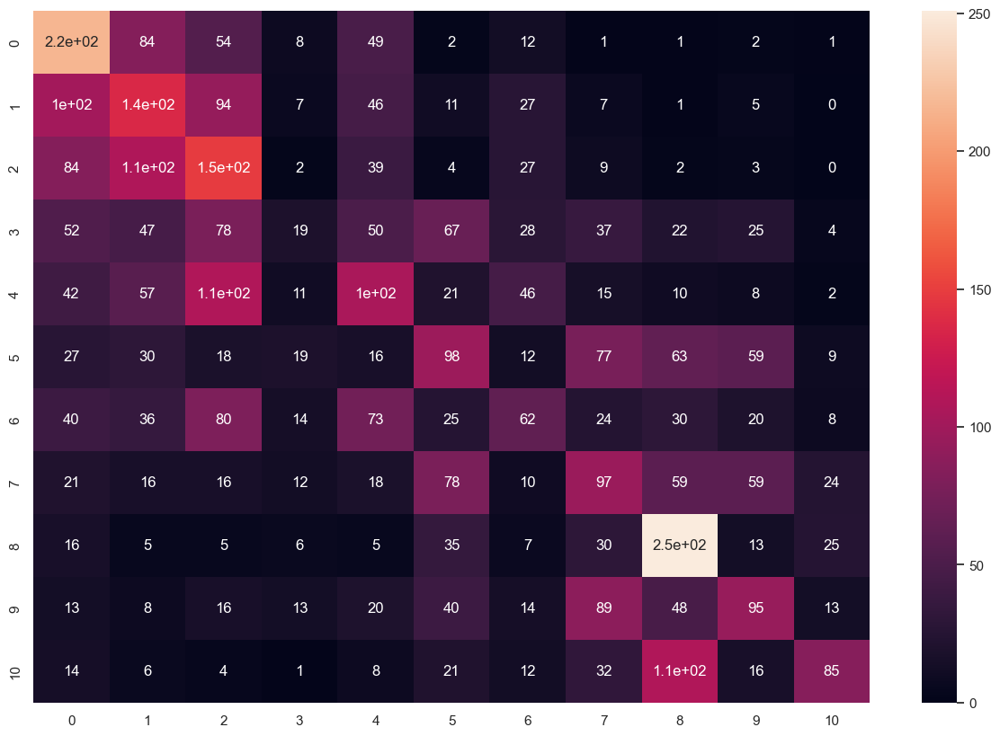

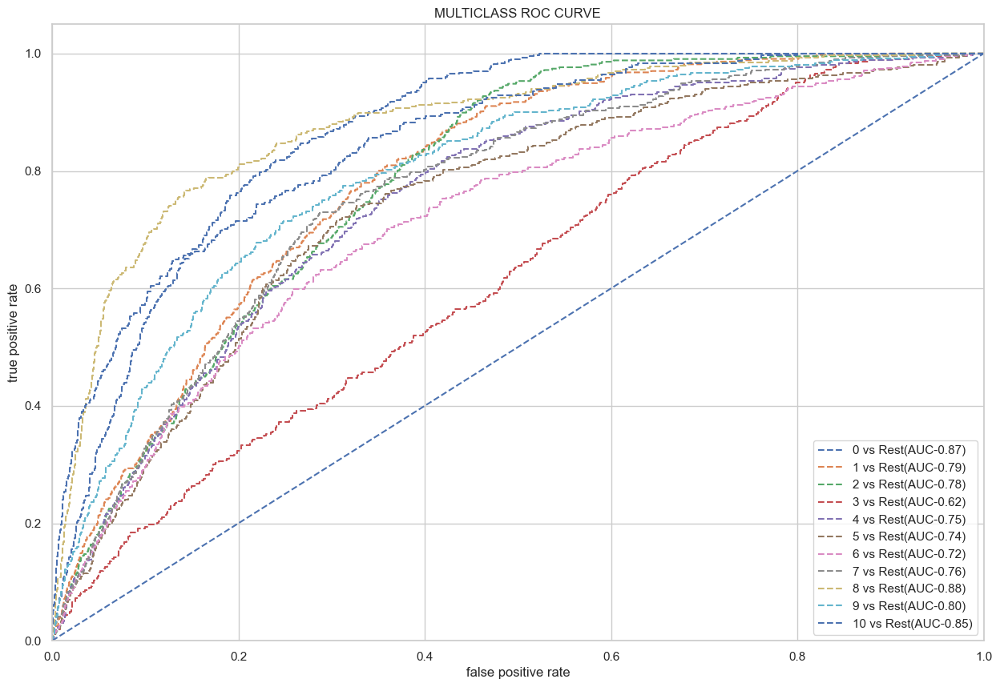

Average AUC score: 0.7777240922852667


In [ ]:


gbc=GradientBoostingClassifier().fit(xtrain,ytrain)
gbc
ypred=gbc.predict(xtest)
ypred_proba=gbc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'GRADIENT BOOSTING CLASSIFIER')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()


classes=[0,1,2,3,4,5,6,7,8,9,10]
n_classes = 11


for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3]+roc_auc[4]+roc_auc[5]+roc_auc[6]+roc_auc[7]+roc_auc[8]+roc_auc[9]+roc_auc[10])/11)



# XGB classifier

Model Name XGBOOST




Accuracy score:  0.2933154482450257


precision score:  0.28458327705389314


recall score:  0.2933154482450257


f1 score:  0.2851574088829797


classification report: 
               precision    recall  f1-score   support

           0       0.34      0.47      0.40       430
           1       0.25      0.28      0.26       436
           2       0.24      0.30      0.27       427
           3       0.17      0.09      0.11       429
           4       0.26      0.26      0.26       426
           5       0.24      0.24      0.24       428
           6       0.25      0.18      0.21       412
           7       0.25      0.24      0.25       410
           8       0.46      0.55      0.50       398
           9       0.33      0.33      0.33       369
          10       0.38      0.31      0.34       308

    accuracy                           0.29      4473
   macro avg       0.29      0.30      0.29      4473
weighted avg       0.28      0.29      0.29     

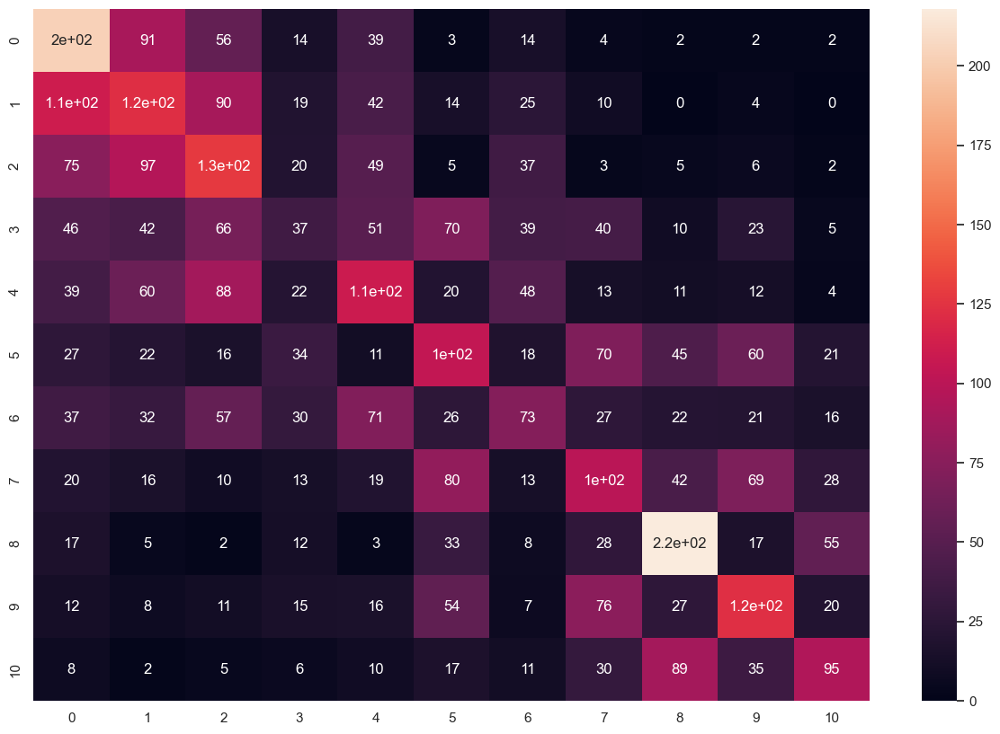

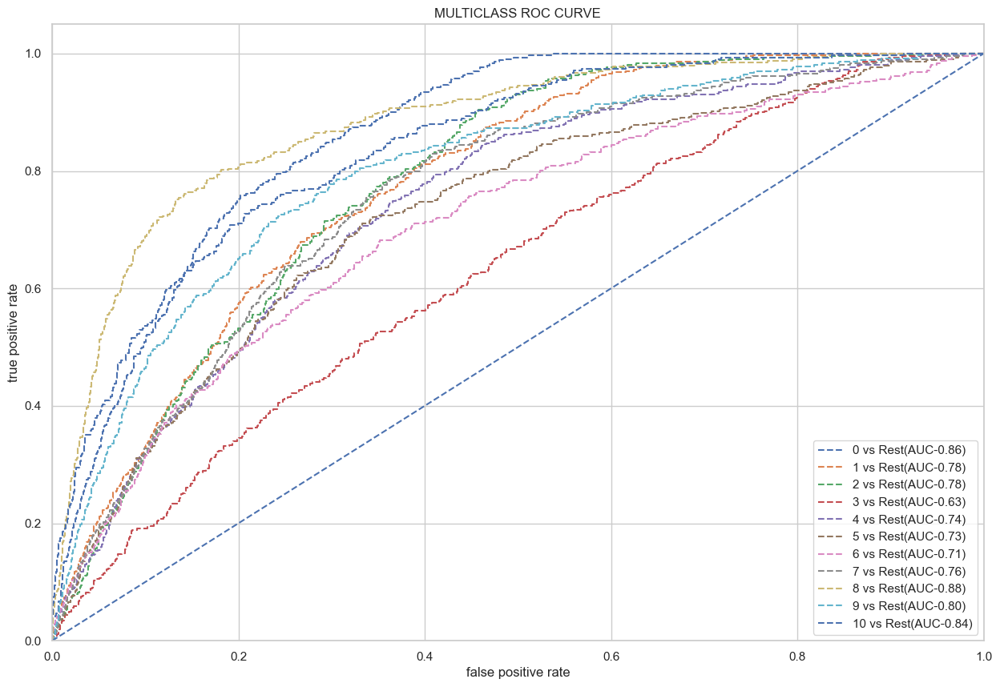

Average AUC score: 0.7726331365120136


In [ ]:


xgbc=XGBClassifier().fit(xtrain,ytrain)
xgbc
ypred=xgbc.predict(xtest)
ypred_proba=xgbc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'XGBOOST')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3,4,5,6,7,8,9,10]
n_classes = 11

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3]+roc_auc[4]+roc_auc[5]+roc_auc[6]+roc_auc[7]+roc_auc[8]+roc_auc[9]+roc_auc[10])/11)


# Light gbm model

In [ ]:
train_data=lgb.Dataset(xtrain,label=ytrain)
test_data=lgb.Dataset(xtest,label=ytest)


In [ ]:

parameters={
    'objective': 'multiclass',
    'num_class':11,
    'metric':'multi_logloss',
    'is_unbalance':'true',
    'boosting':'gbdt',
    'num_leaves':64,
    'feature_fraction':0.5,
    'bagging_fraction':0.5,
    'bagging_freq':20,
    'learning_rate':0.01,
    'verbose': -1

}


In [ ]:

model_lgbm=lgb.train(parameters,
                     train_data,
                     valid_sets=test_data,
                     num_boost_round=5000,
                     early_stopping_rounds=50)          


[1]	valid_0's multi_logloss: 2.38659
Training until validation scores don't improve for 50 rounds
[2]	valid_0's multi_logloss: 2.37768
[3]	valid_0's multi_logloss: 2.37389
[4]	valid_0's multi_logloss: 2.36845
[5]	valid_0's multi_logloss: 2.36362
[6]	valid_0's multi_logloss: 2.35749
[7]	valid_0's multi_logloss: 2.35041
[8]	valid_0's multi_logloss: 2.34559
[9]	valid_0's multi_logloss: 2.33936
[10]	valid_0's multi_logloss: 2.33237
[11]	valid_0's multi_logloss: 2.32777
[12]	valid_0's multi_logloss: 2.32451
[13]	valid_0's multi_logloss: 2.31982
[14]	valid_0's multi_logloss: 2.31545
[15]	valid_0's multi_logloss: 2.30835
[16]	valid_0's multi_logloss: 2.30495
[17]	valid_0's multi_logloss: 2.2991
[18]	valid_0's multi_logloss: 2.29434
[19]	valid_0's multi_logloss: 2.28834
[20]	valid_0's multi_logloss: 2.2853
[21]	valid_0's multi_logloss: 2.28097
[22]	valid_0's multi_logloss: 2.27583
[23]	valid_0's multi_logloss: 2.27136
[24]	valid_0's multi_logloss: 2.26691
[25]	valid_0's multi_logloss: 2.2623
[

[217]	valid_0's multi_logloss: 1.96916
[218]	valid_0's multi_logloss: 1.96873
[219]	valid_0's multi_logloss: 1.96836
[220]	valid_0's multi_logloss: 1.96801
[221]	valid_0's multi_logloss: 1.9674
[222]	valid_0's multi_logloss: 1.96705
[223]	valid_0's multi_logloss: 1.96661
[224]	valid_0's multi_logloss: 1.96617
[225]	valid_0's multi_logloss: 1.96553
[226]	valid_0's multi_logloss: 1.96489
[227]	valid_0's multi_logloss: 1.96432
[228]	valid_0's multi_logloss: 1.96388
[229]	valid_0's multi_logloss: 1.96313
[230]	valid_0's multi_logloss: 1.96238
[231]	valid_0's multi_logloss: 1.96193
[232]	valid_0's multi_logloss: 1.96153
[233]	valid_0's multi_logloss: 1.96107
[234]	valid_0's multi_logloss: 1.96071
[235]	valid_0's multi_logloss: 1.9603
[236]	valid_0's multi_logloss: 1.96
[237]	valid_0's multi_logloss: 1.9596
[238]	valid_0's multi_logloss: 1.95933
[239]	valid_0's multi_logloss: 1.95859
[240]	valid_0's multi_logloss: 1.95808
[241]	valid_0's multi_logloss: 1.95749
[242]	valid_0's multi_logloss: 

[429]	valid_0's multi_logloss: 1.91846
[430]	valid_0's multi_logloss: 1.91834
[431]	valid_0's multi_logloss: 1.9184
[432]	valid_0's multi_logloss: 1.91858
[433]	valid_0's multi_logloss: 1.91834
[434]	valid_0's multi_logloss: 1.91841
[435]	valid_0's multi_logloss: 1.91842
[436]	valid_0's multi_logloss: 1.91834
[437]	valid_0's multi_logloss: 1.91836
[438]	valid_0's multi_logloss: 1.91824
[439]	valid_0's multi_logloss: 1.91814
[440]	valid_0's multi_logloss: 1.91809
[441]	valid_0's multi_logloss: 1.91791
[442]	valid_0's multi_logloss: 1.9178
[443]	valid_0's multi_logloss: 1.91773
[444]	valid_0's multi_logloss: 1.9176
[445]	valid_0's multi_logloss: 1.91743
[446]	valid_0's multi_logloss: 1.91735
[447]	valid_0's multi_logloss: 1.91713
[448]	valid_0's multi_logloss: 1.91698
[449]	valid_0's multi_logloss: 1.91698
[450]	valid_0's multi_logloss: 1.91685
[451]	valid_0's multi_logloss: 1.9168
[452]	valid_0's multi_logloss: 1.91675
[453]	valid_0's multi_logloss: 1.91668
[454]	valid_0's multi_logloss

In [ ]:

ytrain_pred=model_lgbm.predict(xtrain)
ytest_pred=model_lgbm.predict(xtest)
ytrain_pred = [list(x).index(max(x)) for x in ytrain_pred]

ytest_pred = [list(x).index(max(x)) for x in ytest_pred]

print('Accuracy for training data: ',metrics.accuracy_score(ytrain,ytrain_pred))


Accuracy for training data:  0.622093023255814


Model Name: LIGHT GBM




Accuracy score:  0.2933154482450257


precision score:  0.28458327705389314


recall score:  0.2933154482450257


f1 score:  0.2851574088829797


classification report: 
               precision    recall  f1-score   support

           0       0.34      0.47      0.40       430
           1       0.25      0.28      0.26       436
           2       0.24      0.30      0.27       427
           3       0.17      0.09      0.11       429
           4       0.26      0.26      0.26       426
           5       0.24      0.24      0.24       428
           6       0.25      0.18      0.21       412
           7       0.25      0.24      0.25       410
           8       0.46      0.55      0.50       398
           9       0.33      0.33      0.33       369
          10       0.38      0.31      0.34       308

    accuracy                           0.29      4473
   macro avg       0.29      0.30      0.29      4473
weighted avg       0.28      0.29      0.29  

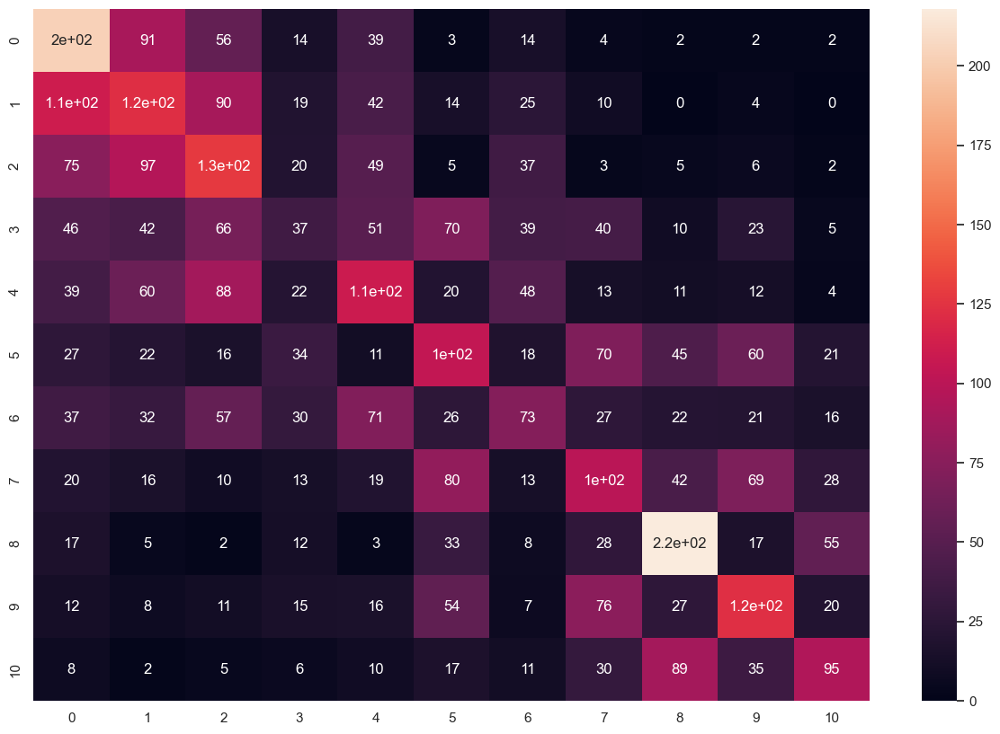

In [ ]:

print('Model Name: LIGHT GBM')
print('\n\n\n')
print('Accuracy score: ', metrics.accuracy_score(ytest,ypred))
print('\n')
print('precision score: ',metrics.precision_score(ytest,ypred,average='weighted'))
print('\n')
print('recall score: ',metrics.recall_score(ytest,ypred,average='weighted'))
print('\n')
print('f1 score: ',metrics.f1_score(ytest,ypred,average='weighted'))
print('\n')
print('classification report: \n',metrics.classification_report(ytest,ypred))
print('\n')
print('Confusion matrix: ')
print('\n')
cm=metrics.confusion_matrix(ytest,ypred)
sns.heatmap(cm,annot=True)
plt.show()

# UNDERSAMPLING DATA WITH TARGET COLUMN BINNED

In [ ]:
udf1.shape


(27500, 16)

# checking the null values

In [ ]:
udf1.isna().sum()


Hospital                             0
Hospital_type                        0
Hospital_city                        0
Hospital_region                      0
Available_Extra_Rooms_in_Hospital    0
Department                           0
Ward_Type                            0
Ward_Facility                        0
Bed_Grade                            0
City_Code_Patient                    0
Type of Admission                    0
Illness_Severity                     0
Patient_Visitors                     0
Age                                  0
Admission_Deposit                    0
Stay_Days                            0
dtype: int64

# Binning the undersampled targeted column

In [ ]:

udf1.Stay_Days.replace({'0-10':0,'11-20':0,'21-30':1,'31-40':1,'41-50':2,'51-60':2,'61-70':3,'71-80':3,'81-90':4,'91-100':4,'More than 100 Days':4},inplace=True)



In [ ]:
udf1

,Hospital,Hospital_type,Hospital_city,Hospital_region,Available_Extra_Rooms_in_Hospital,Department,Ward_Type,Ward_Facility,Bed_Grade,City_Code_Patient,Type of Admission,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days
0,29,0,4,0,2,anesthesia,S,F,2.0,15.0,Trauma,Moderate,4,11-20,5121.0,2
1,26,1,2,1,4,gynecology,P,D,1.0,8.0,Trauma,Extreme,4,51-60,4139.0,2
2,9,3,5,2,2,gynecology,S,F,2.0,9.0,Emergency,Moderate,4,61-70,5030.0,2
3,8,2,3,2,3,gynecology,Q,F,4.0,8.0,Trauma,Minor,3,71-80,5534.0,3
4,12,0,9,1,3,gynecology,Q,B,3.0,7.0,Emergency,Moderate,2,51-60,3610.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27495,26,1,2,1,4,gynecology,R,D,2.0,8.0,Trauma,Moderate,2,31-40,6037.0,2
27496,9,3,5,2,3,gynecology,R,F,2.0,8.0,Emergency,Extreme,3,31-40,4471.0,2
27497,19,0,7,1,2,radiotherapy,S,C,2.0,8.0,Emergency,Moderate,2,41-50,4319.0,0
27498,9,3,5,2,2,gynecology,S,F,2.0,8.0,Trauma,Moderate,6,61-70,4382.0,4


# Splitting the independent variables into numerical and categorical variables

In [ ]:


num_data=udf1[['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit']]
cat_data=udf1.drop(['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit','Stay_Days'],axis=1)


# Univariate analysis

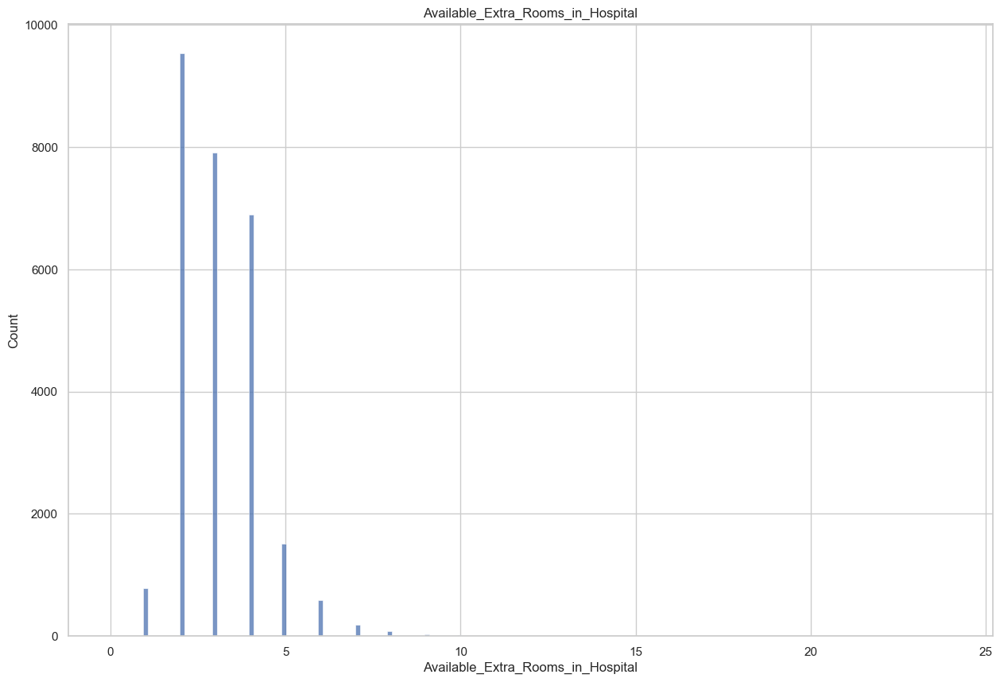

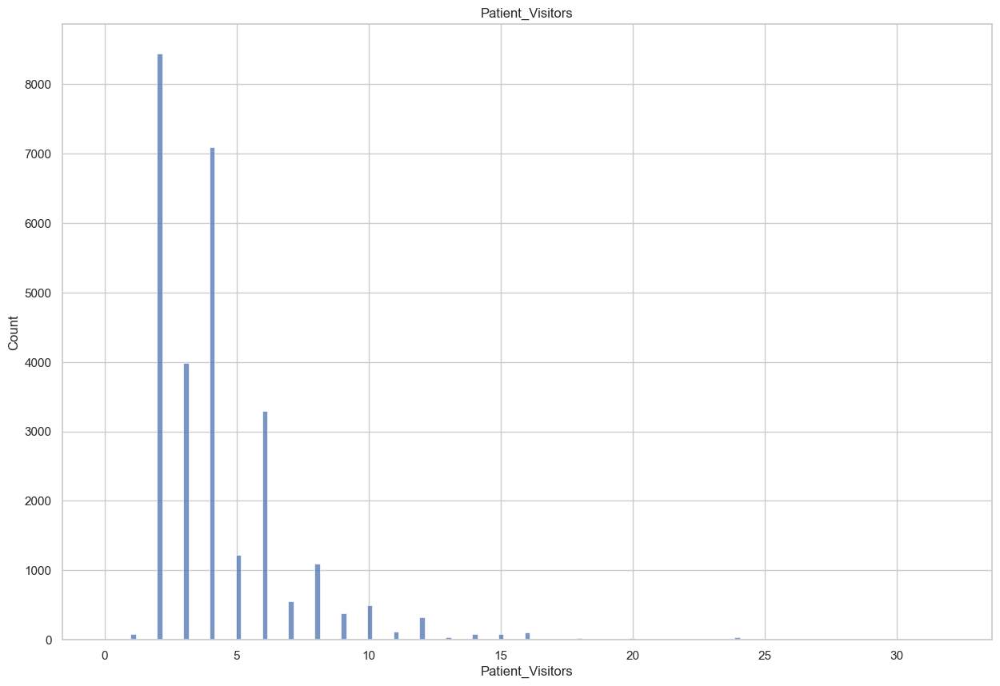

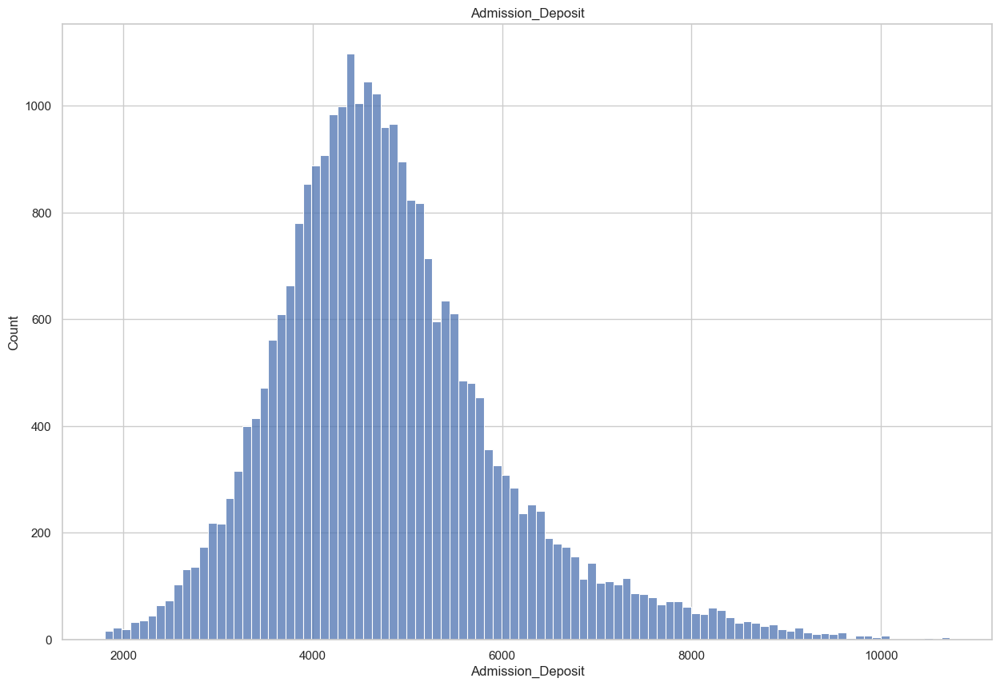

In [ ]:
for i in num_data.columns:
    sns.histplot(x=udf1[i])
    plt.title(i)
    plt.show()


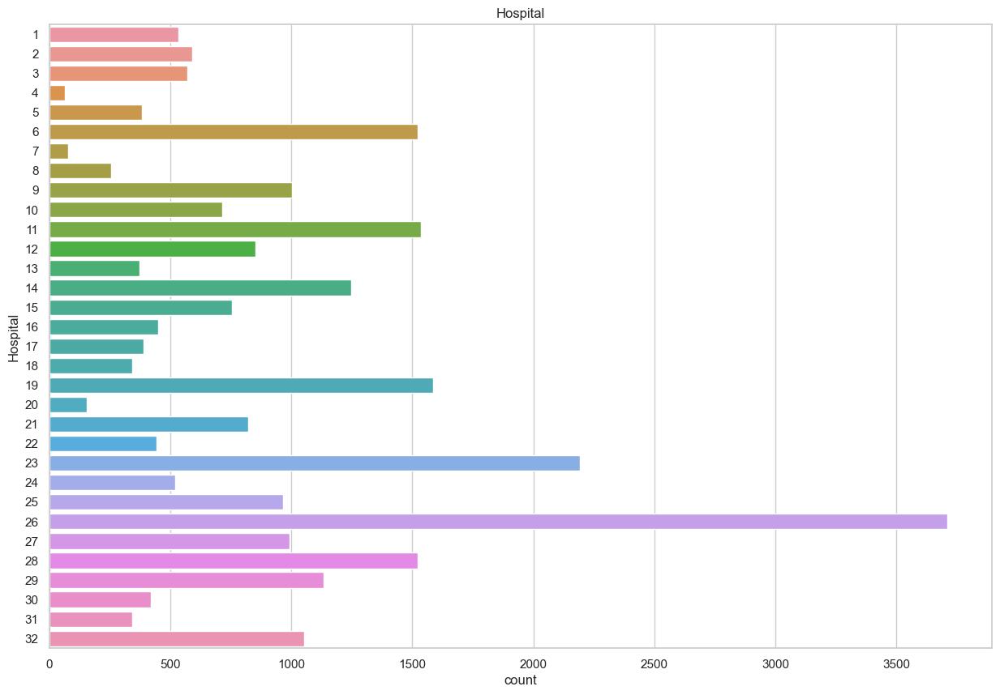

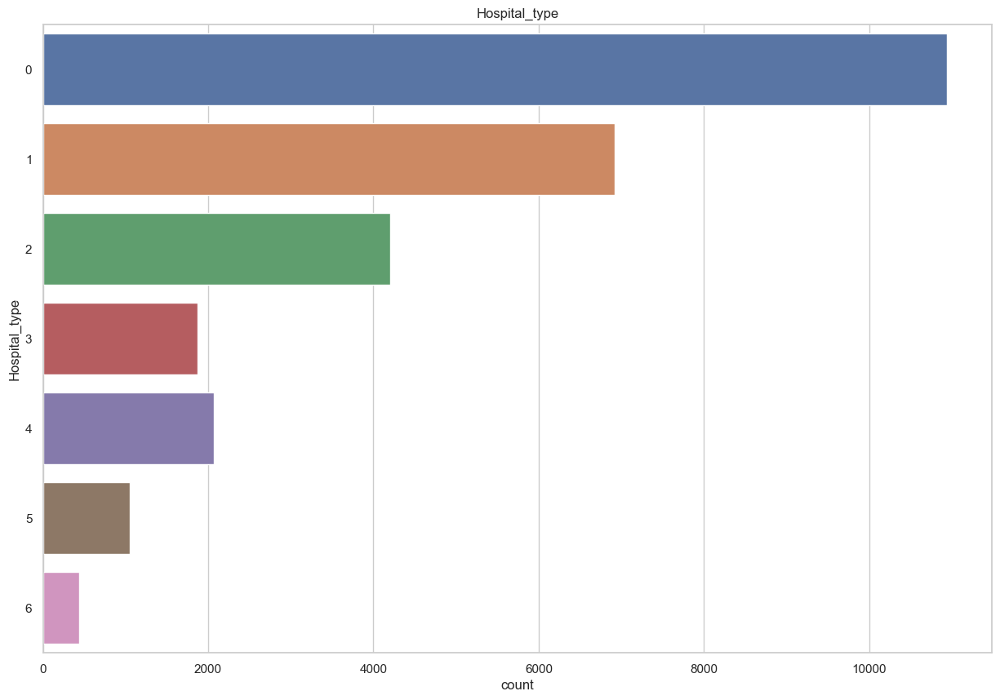

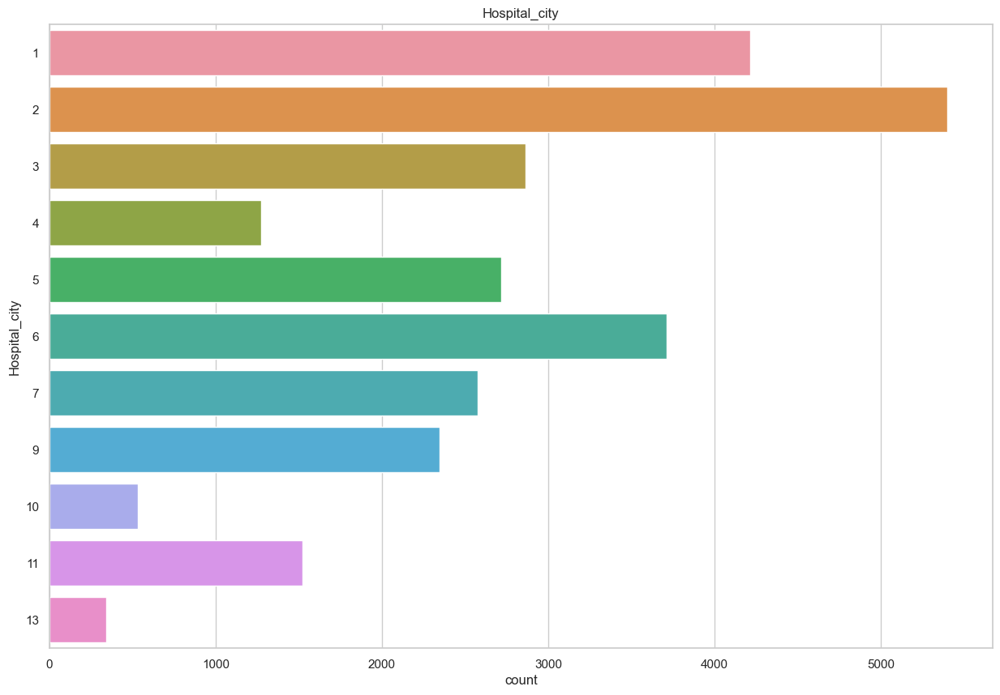

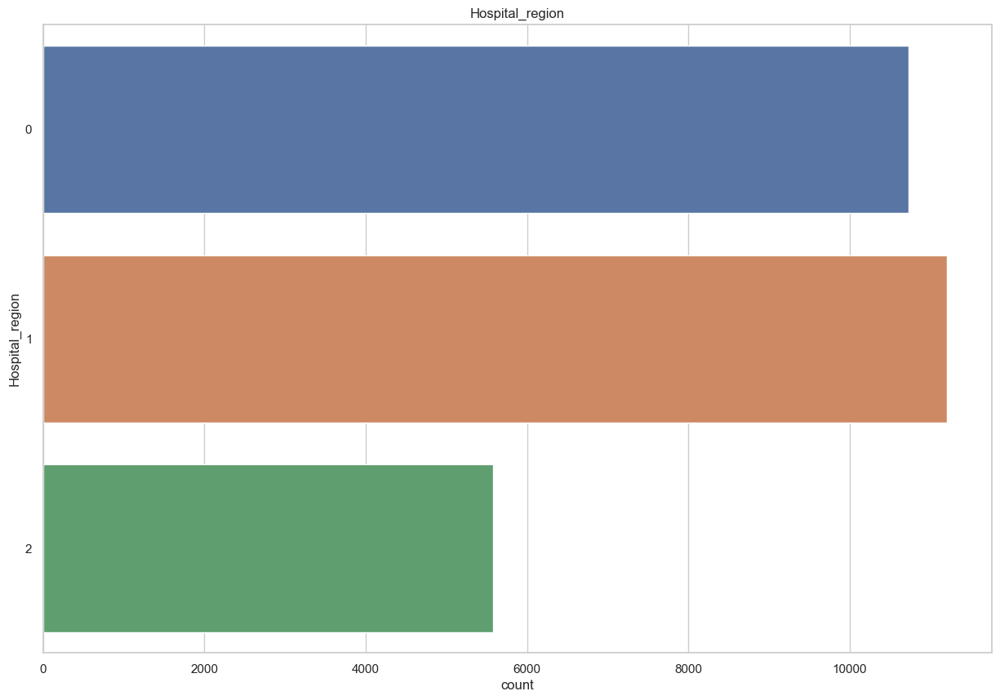

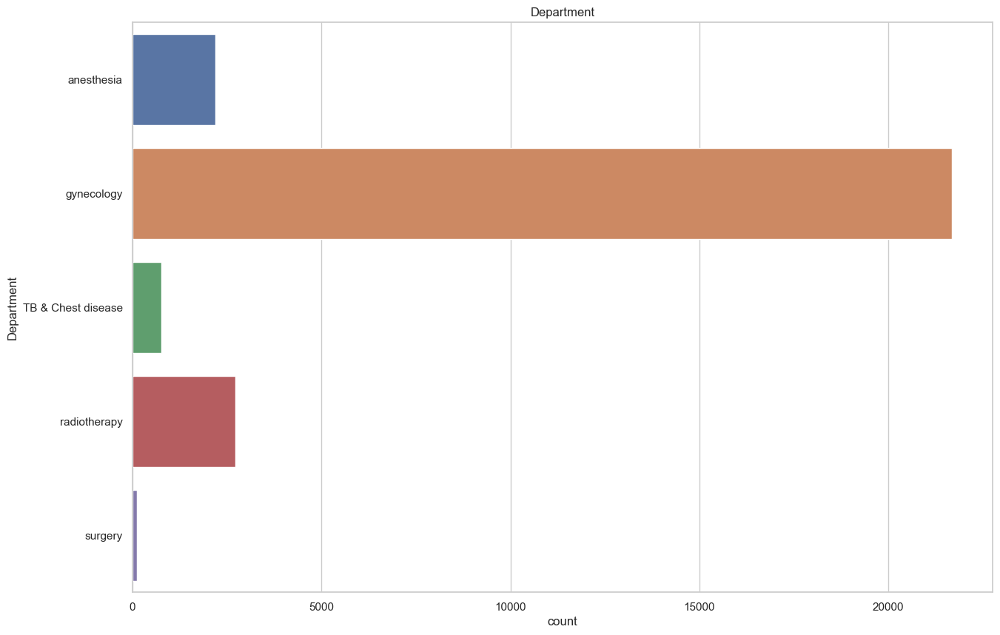

...

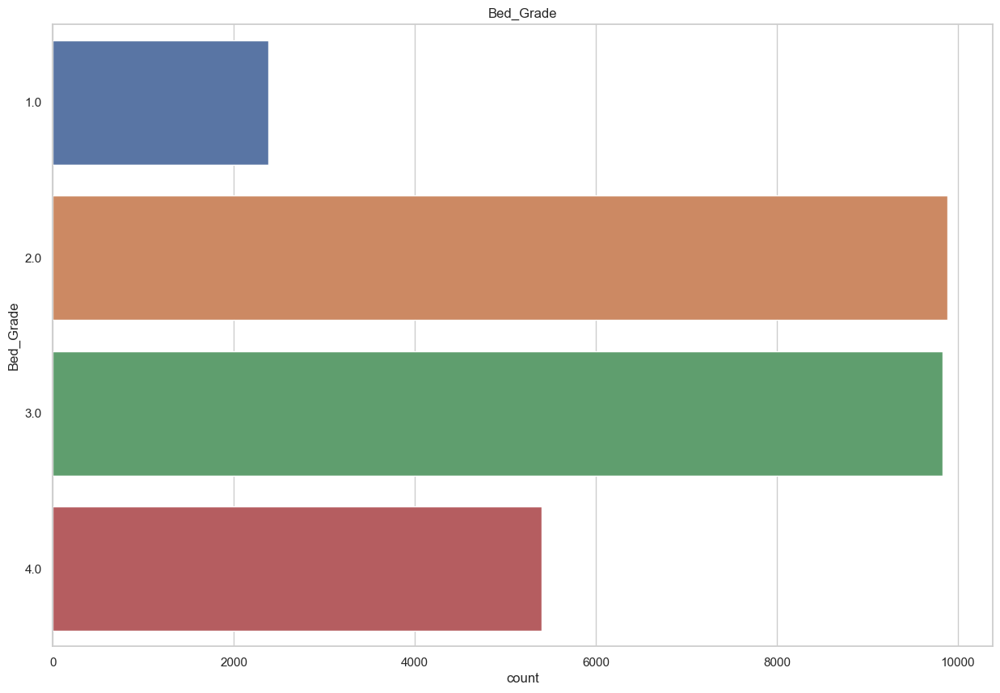

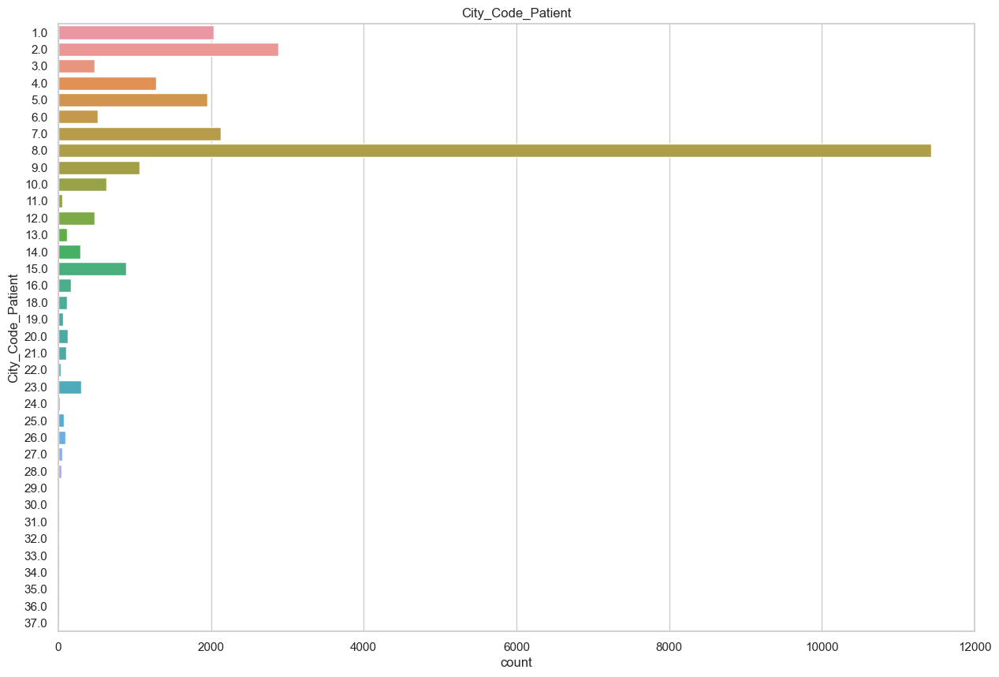

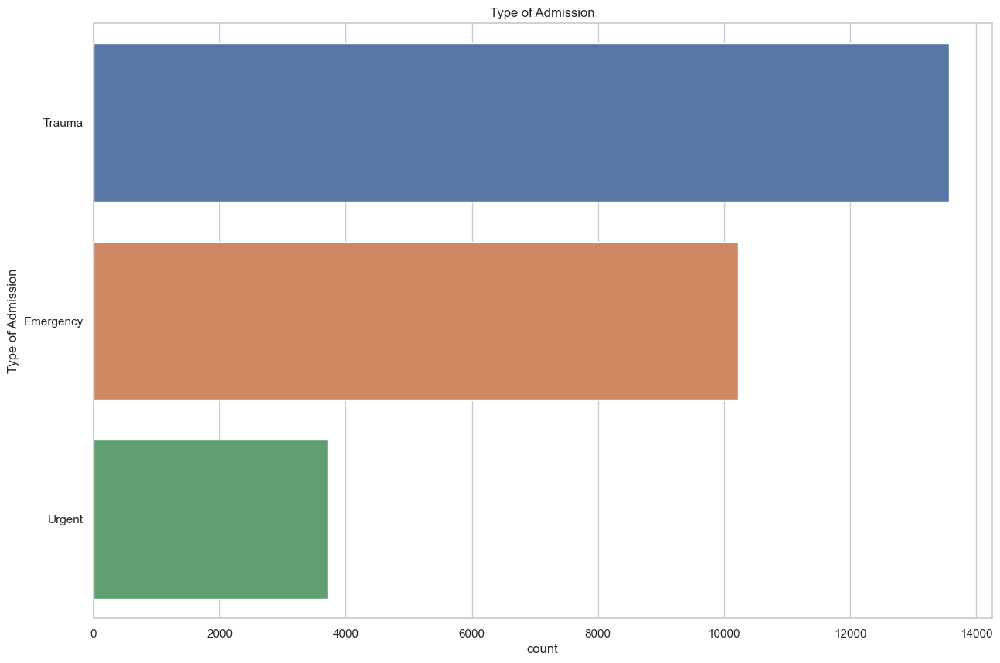

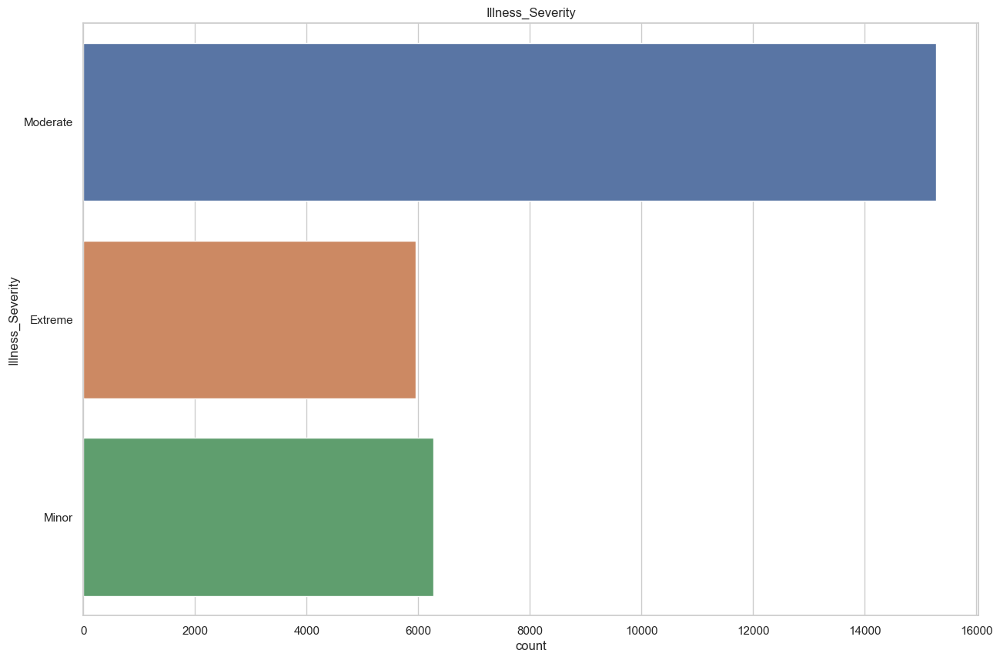

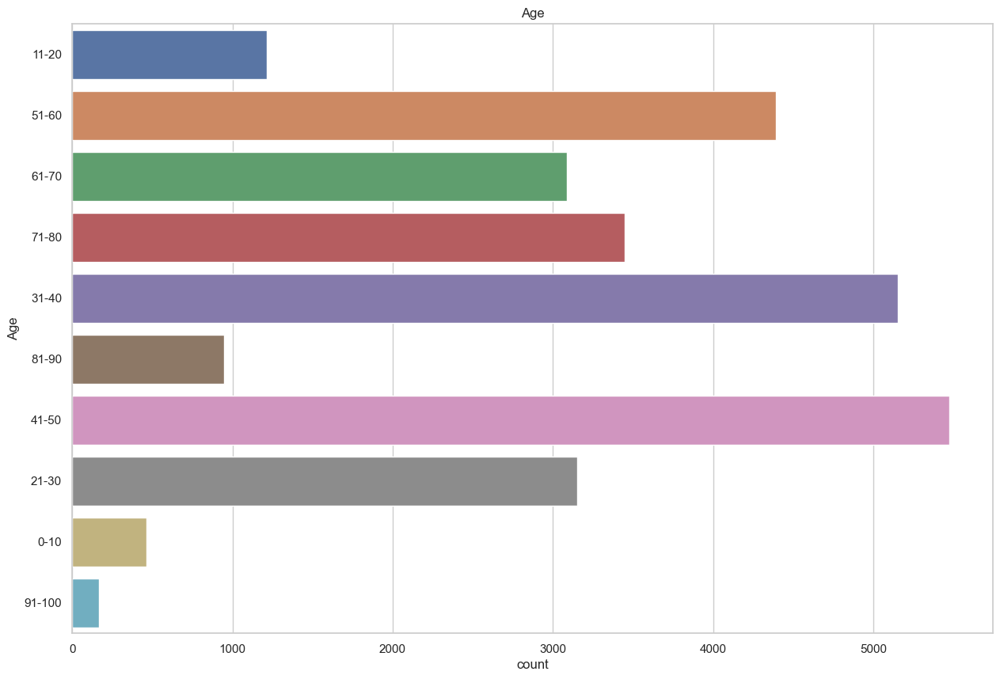

In [ ]:
for i in cat_data.columns:
    sns.countplot(y=udf1[i])
    plt.title(i)
    plt.show()


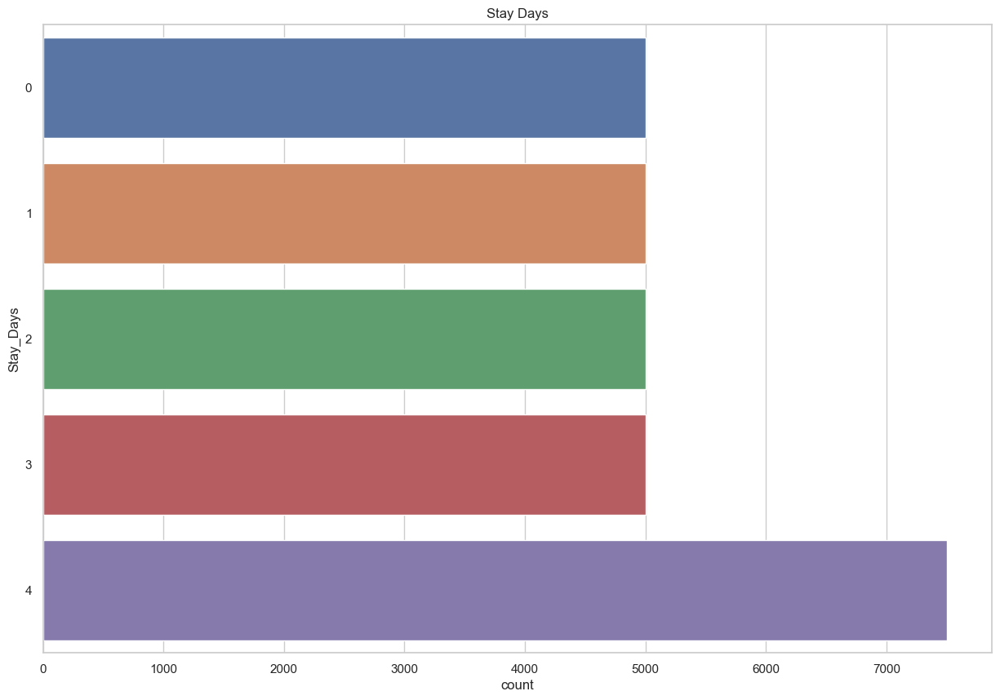

In [ ]:
sns.countplot(y=udf1['Stay_Days'])
plt.title('Stay Days')
plt.show()


# Bivariate analysis

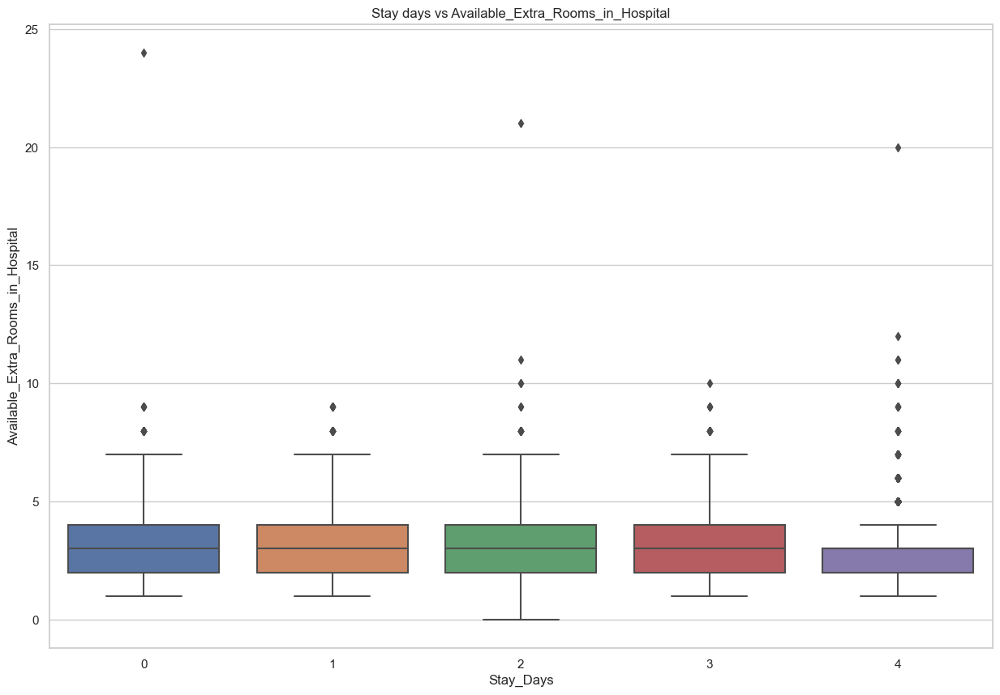

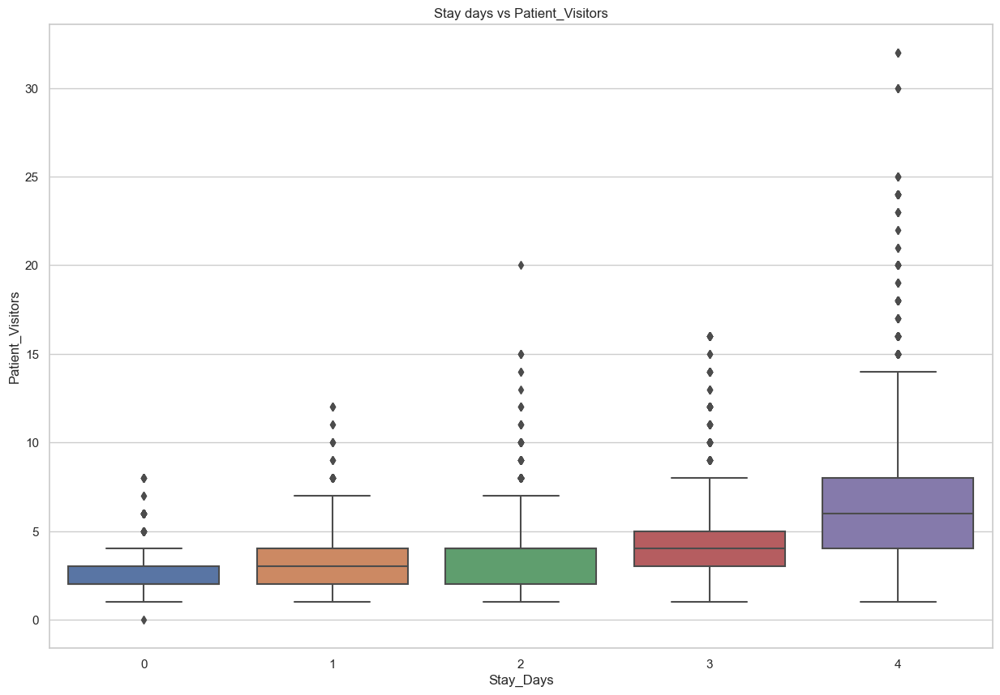

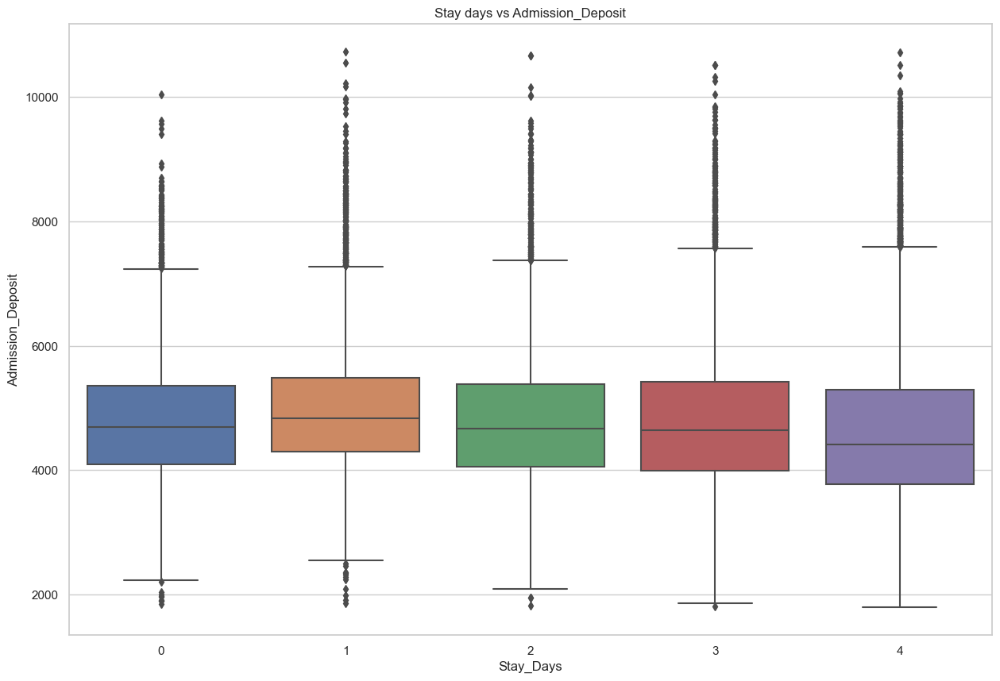

In [ ]:
for i in num_data.columns:
    sns.boxplot(x=udf1['Stay_Days'],y=udf1[i])
    plt.title(f'Stay days vs {i}')
    plt.show()


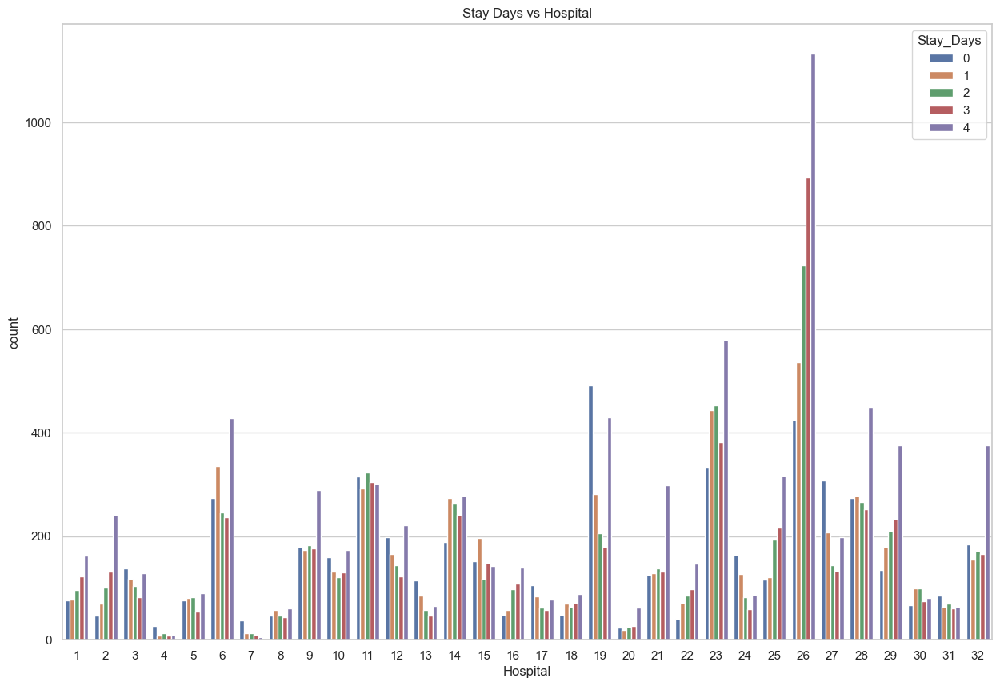

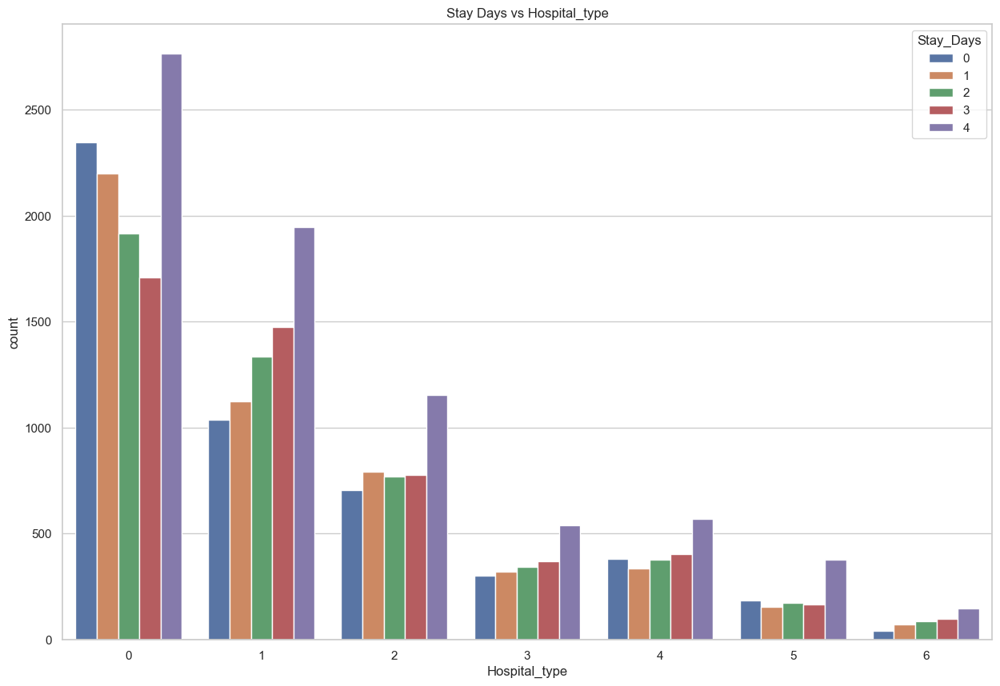

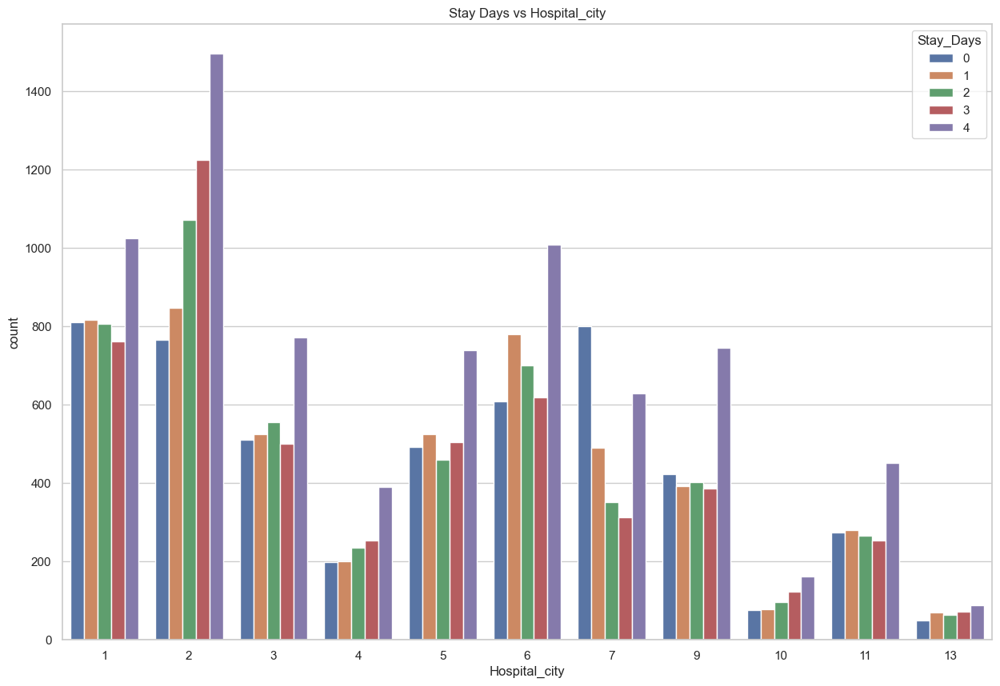

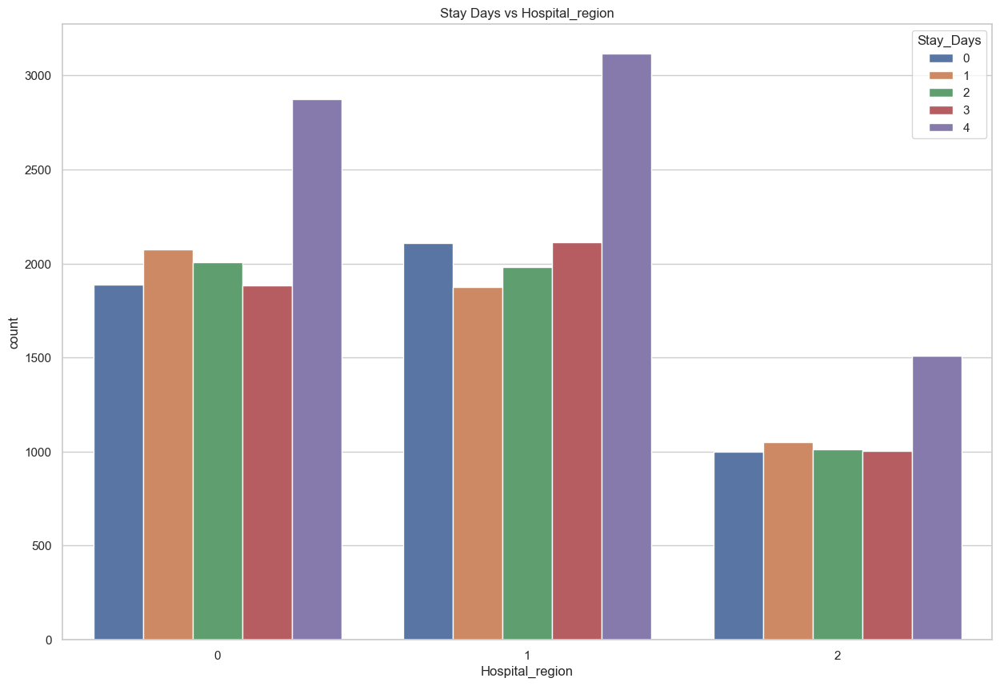

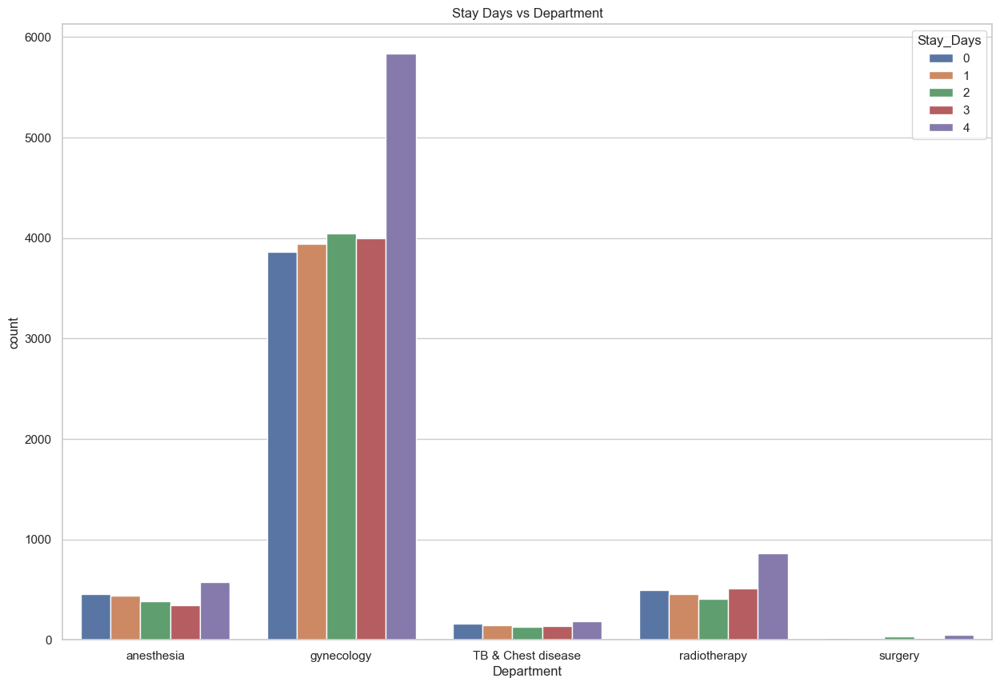

...

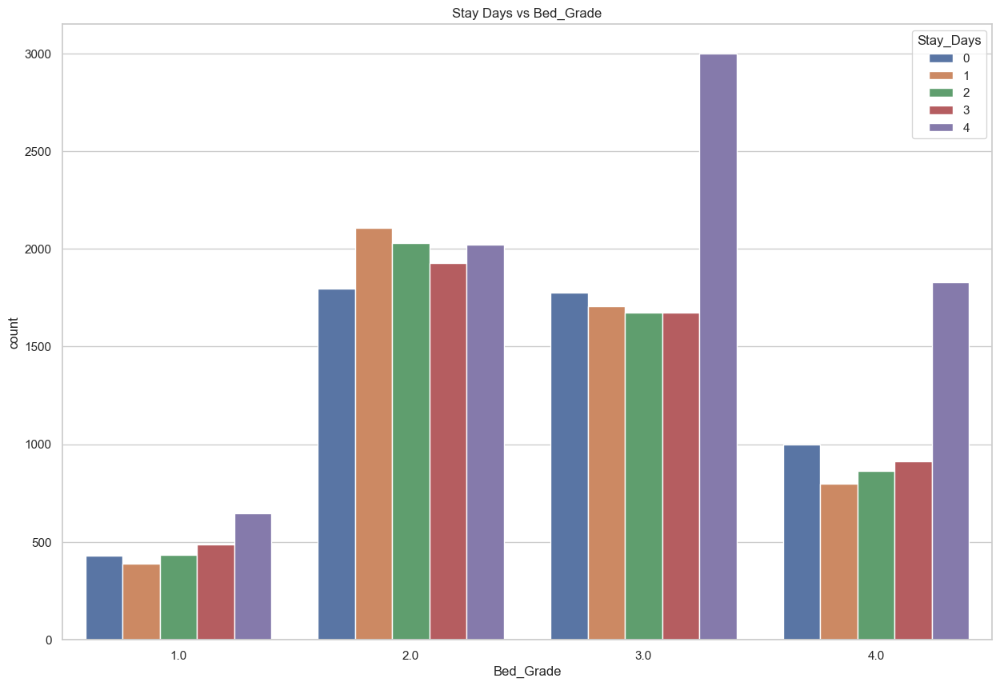

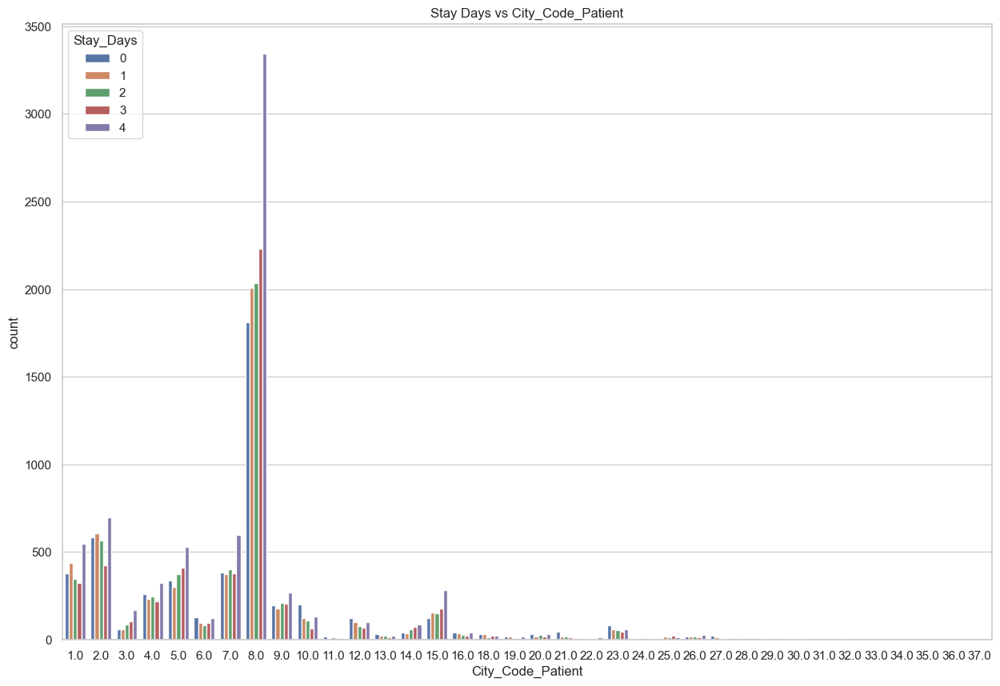

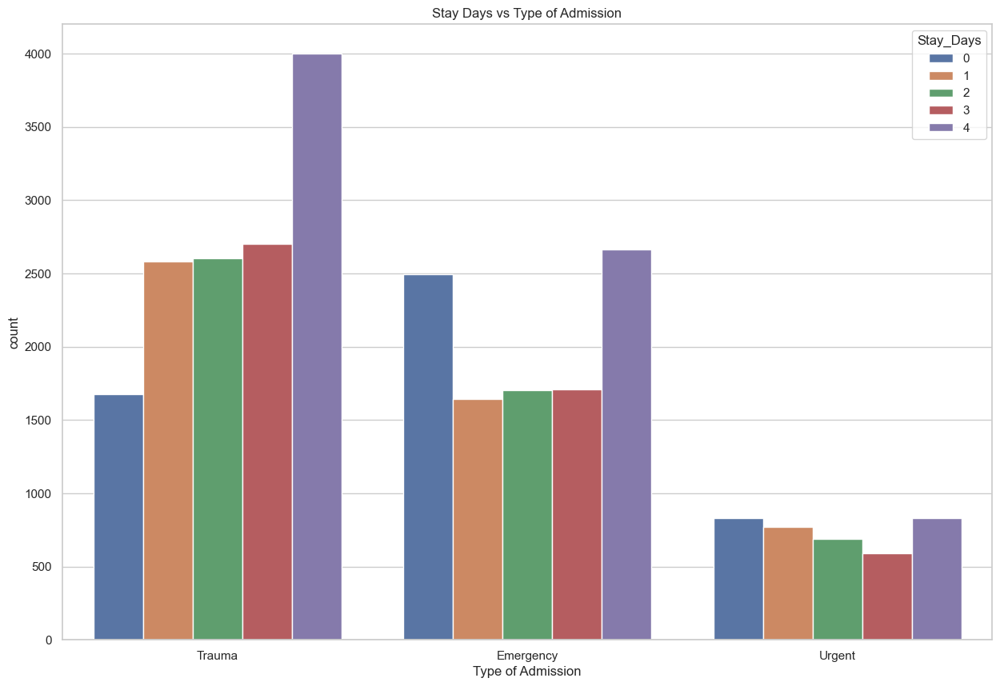

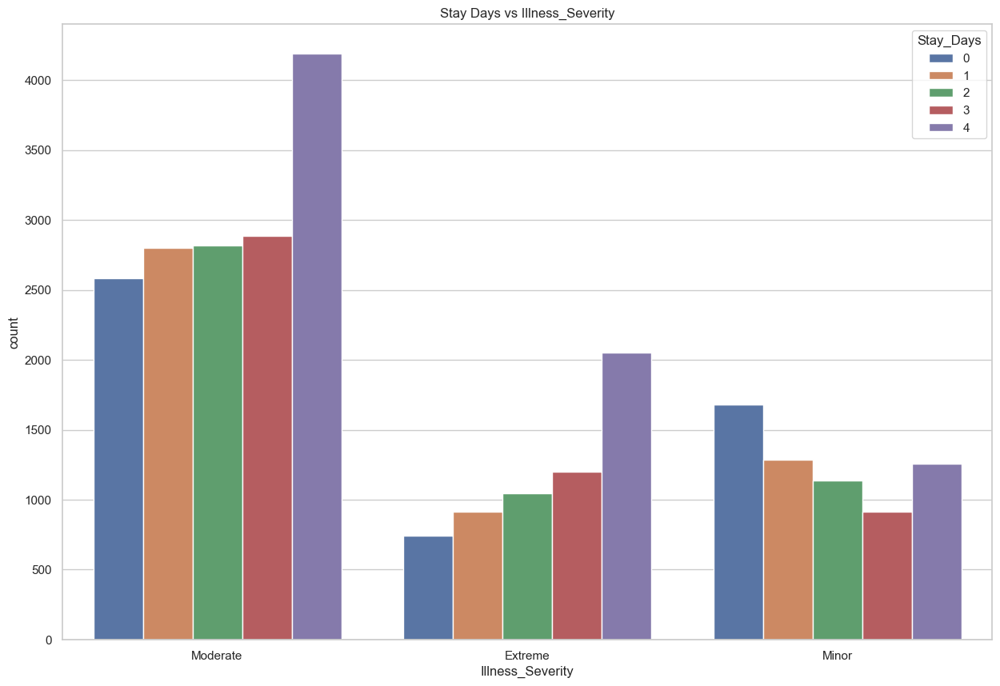

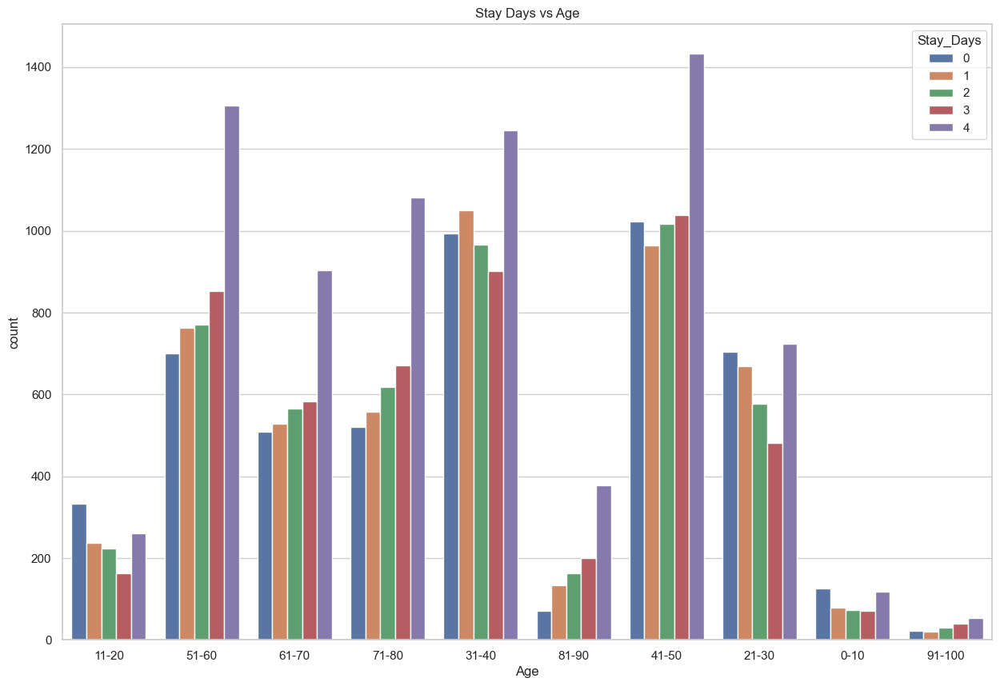

In [ ]:
for i in cat_data.columns:
    sns.countplot(x=udf1[i],hue=udf1['Stay_Days'])
    plt.title(f'Stay Days vs {i}')
    plt.show()

# Outlier treatment

In [ ]:
q1=udf1.quantile(.25)
q3=udf1.quantile(.75)
iqr=q3-q1
ul=(q3+(1.5*iqr))
ll=(q1-(1.5*iqr))
df=udf1[~((udf1>ul)|(udf1<ll))]
df.isna().sum()


Hospital                                0
Hospital_type                         442
Hospital_city                           0
Hospital_region                         0
Available_Extra_Rooms_in_Hospital     111
Department                              0
Ward_Type                               0
Ward_Facility                           0
Bed_Grade                               0
City_Code_Patient                    2566
Type of Admission                       0
Illness_Severity                        0
Patient_Visitors                     1348
Age                                     0
Admission_Deposit                    1033
Stay_Days                               0
dtype: int64

In [ ]:
df.dropna(inplace=True)


In [ ]:
df.shape


(22361, 16)

In [ ]:
num_data=df[['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit']]
cat_data=df.drop(['Available_Extra_Rooms_in_Hospital','Patient_Visitors','Admission_Deposit','Stay_Days'],axis=1)


# Statistical test

In [ ]:
sig_lvl=0.05
for i in num_data.columns:
    print(i,'\n.............................................')
    result=df.groupby(by='Stay_Days')[i].apply(list)
    print('Hypothesis Framing')
    print('------------------')
    print('H0: The averages of all classes are the same.')
    print('H1: Atleast one class has a different average.\n\n')

    stat,pval=stats.f_oneway(*result)
    print('Pvalue= ',pval)
    if pval<sig_lvl:
        print('Result')
        print('------')
        print('pval<sig_lvl')
        print('Rejecting the null hypothesis')
        print('Atleast one class has a different average.')
        print('______________________________________________________________________________________\n\n\n')
    else:
        print('Result')
        print('------')
        print('pval>sig_lvl')
        print('Failed to reject null hypothesis')
        print('The averages of all classes are the same.')
        print('______________________________________________________________________________________\n\n\n')


Available_Extra_Rooms_in_Hospital 
.............................................
Hypothesis Framing
------------------
H0: The averages of all classes are the same.
H1: Atleast one class has a different average.


Pvalue=  1.876085334853371e-133
Result
------
pval<sig_lvl
Rejecting the null hypothesis
Atleast one class has a different average.
______________________________________________________________________________________



Patient_Visitors 
.............................................
Hypothesis Framing
------------------
H0: The averages of all classes are the same.
H1: Atleast one class has a different average.


Pvalue=  0.0
Result
------
pval<sig_lvl
Rejecting the null hypothesis
Atleast one class has a different average.
______________________________________________________________________________________



Admission_Deposit 
.............................................
Hypothesis Framing
------------------
H0: The averages of all classes are the same.
H1: Atleast one

In [ ]:

for i in cat_data.columns:
    print('\n\n\n',i,'\n.................................\n\n\n')
    result = pd.crosstab(index=df['Stay_Days'],columns=df[i])
    chi2,pval,dof,exp=stats.chi2_contingency(result)
    print('Hypothesis Framing')
    print('------------------')
    print('H0: The variables are independent.')
    print('H1: The variables are not independent.\n\n')

    print('Pvalue= ',pval)
    if pval<sig_lvl:
        print('Result')
        print('------')
        print('pval<sig_lvl')
        print('Rejecting the null hypothesis')
        print('The variables are dependent.')
        print('______________________________________________________________________________________\n\n\n')
    else:
        print('Result')
        print('------')
        print('pval>sig_lvl')
        print('Failed to reject null hypothesis')
        print('The variables are independent.')
        print('______________________________________________________________________________________\n\n\n')





 Hospital 
.................................



Hypothesis Framing
------------------
H0: The variables are independent.
H1: The variables are not independent.


Pvalue=  6.237581812188351e-212
Result
------
pval<sig_lvl
Rejecting the null hypothesis
The variables are dependent.
______________________________________________________________________________________






 Hospital_type 
.................................



Hypothesis Framing
------------------
H0: The variables are independent.
H1: The variables are not independent.


Pvalue=  7.70108112205219e-60
Result
------
pval<sig_lvl
Rejecting the null hypothesis
The variables are dependent.
______________________________________________________________________________________






 Hospital_city 
.................................



Hypothesis Framing
------------------
H0: The variables are independent.
H1: The variables are not independent.


Pvalue=  3.4971065040661505e-103
Result
------
pval<sig_lvl
Rejecting the null hy

# Feature encoding

In [ ]:
df['Illness_Severity'].replace({'Extreme':2,'Moderate':1,'Minor':0},inplace=True)
df.Age.replace({'0-10':0,'11-20':1,'21-30':2,'31-40':3,'41-50':4,'51-60':5,'61-70':6,'71-80':7,'81-90':8,'81-90':9,'91-100':10},inplace=True)
dummy_encode=pd.get_dummies(df,columns=['Hospital','Hospital_city','Hospital_region','Hospital_type','Department','Ward_Type','Ward_Facility','Bed_Grade','City_Code_Patient','Type of Admission'])
dummy_encode.head()


,Available_Extra_Rooms_in_Hospital,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days,Hospital_1,Hospital_2,Hospital_3,Hospital_4,...,City_Code_Patient_6.0,City_Code_Patient_7.0,City_Code_Patient_8.0,City_Code_Patient_9.0,City_Code_Patient_10.0,City_Code_Patient_11.0,City_Code_Patient_12.0,Type of Admission_Emergency,Type of Admission_Trauma,Type of Admission_Urgent
1,4.0,2,4.0,5,4139.0,2,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
2,2.0,1,4.0,6,5030.0,2,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,3.0,0,3.0,7,5534.0,3,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
4,3.0,1,2.0,5,3610.0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
6,4.0,1,4.0,9,6353.0,4,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [ ]:
num_data=df[['Available_Extra_Rooms_in_Hospital',	'Patient_Visitors',	'Admission_Deposit']]
num_data.skew()


Available_Extra_Rooms_in_Hospital    0.680762
Patient_Visitors                     0.927862
Admission_Deposit                    0.311324
dtype: float64

# Scaling

In [ ]:

scaler=StandardScaler()
for i in num_data.columns:
  scaler.fit(dummy_encode[[i]])
  dummy_encode[i]=scaler.transform(dummy_encode[[i]])
dummy_encode.head()


,Available_Extra_Rooms_in_Hospital,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days,Hospital_1,Hospital_2,Hospital_3,Hospital_4,...,City_Code_Patient_6.0,City_Code_Patient_7.0,City_Code_Patient_8.0,City_Code_Patient_9.0,City_Code_Patient_10.0,City_Code_Patient_11.0,City_Code_Patient_12.0,Type of Admission_Emergency,Type of Admission_Trauma,Type of Admission_Urgent
1,0.851155,2,0.118718,5,-0.565927,2,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
2,-0.951438,1,0.118718,6,0.340622,2,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,-0.050141,0,-0.440510,7,0.853418,3,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
4,-0.050141,1,-0.999738,5,-1.104159,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
6,0.851155,1,0.118718,9,1.686711,4,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [ ]:

num_data.skew()


Available_Extra_Rooms_in_Hospital    0.680762
Patient_Visitors                     0.927862
Admission_Deposit                    0.311324
dtype: float64

# Power transforming

In [ ]:

pt=PowerTransformer()
for i in num_data.columns:
  dummy_encode[i]=pt.fit_transform(dummy_encode[[i]])
dummy_encode


,Available_Extra_Rooms_in_Hospital,Illness_Severity,Patient_Visitors,Age,Admission_Deposit,Stay_Days,Hospital_1,Hospital_2,Hospital_3,Hospital_4,...,City_Code_Patient_6.0,City_Code_Patient_7.0,City_Code_Patient_8.0,City_Code_Patient_9.0,City_Code_Patient_10.0,City_Code_Patient_11.0,City_Code_Patient_12.0,Type of Admission_Emergency,Type of Admission_Trauma,Type of Admission_Urgent
1,0.913125,2,0.379663,5,-0.531521,2,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
2,-1.002114,1,0.379663,6,0.397810,2,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,0.093671,0,-0.292989,7,0.872268,3,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
4,0.093671,1,-1.184063,5,-1.136918,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
6,0.913125,1,0.379663,9,1.595416,4,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27495,0.913125,1,-1.184063,3,1.322096,2,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
27496,0.093671,2,-0.292989,3,-0.170010,2,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
27497,-1.002114,1,-1.184063,4,-0.333526,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
27498,-1.002114,1,1.236705,6,-0.265324,4,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0


In [ ]:

for i in num_data.columns:
  print(i,':',dummy_encode[i].skew())


Available_Extra_Rooms_in_Hospital : 0.05102636070438374
Patient_Visitors : 0.15639754084061058
Admission_Deposit : -0.017566855027404335


# Splitting the independent and dependent variable

In [ ]:

x=dummy_encode.drop(['Stay_Days'],axis=1)
y=dummy_encode[['Stay_Days']]


# Train test split

In [ ]:

xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2,stratify=y,random_state=102)

# Logistic regression model

In [ ]:
lm=LogisticRegression(multi_class='ovr',solver='sag')
lm.fit(xtrain,ytrain)


LogisticRegression(multi_class='ovr', solver='sag')

Model Name LOGISTIC REGRESSION




Accuracy score:  0.4162754303599374


precision score:  0.3646818626729688


recall score:  0.4162754303599374


f1 score:  0.36493565166650194


classification report: 
               precision    recall  f1-score   support

           0       0.45      0.64      0.53       866
           1       0.34      0.31      0.32       856
           2       0.26      0.09      0.14       854
           3       0.25      0.11      0.16       822
           4       0.49      0.81      0.61      1075

    accuracy                           0.42      4473
   macro avg       0.36      0.39      0.35      4473
weighted avg       0.36      0.42      0.36      4473



Confusion matrix: 




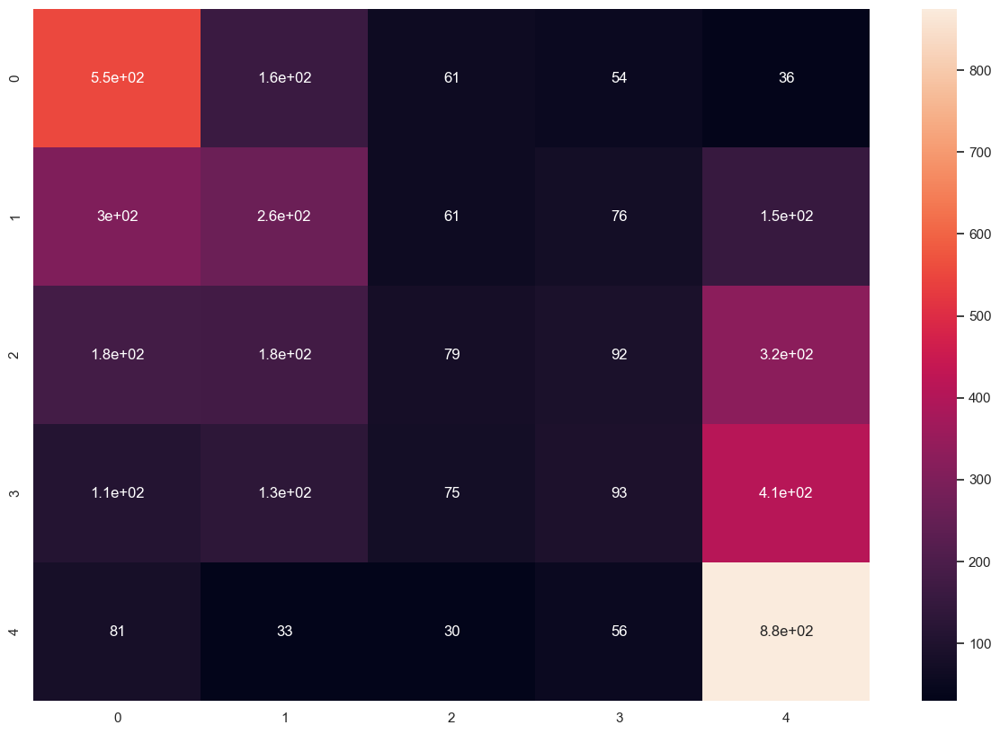

In [ ]:
ypredlm=lm.predict(xtest)
ypred_probalm=lm.predict_proba(xtest)[:,1]
metric_score(ytest,ypredlm,ypred_probalm,'LOGISTIC REGRESSION')


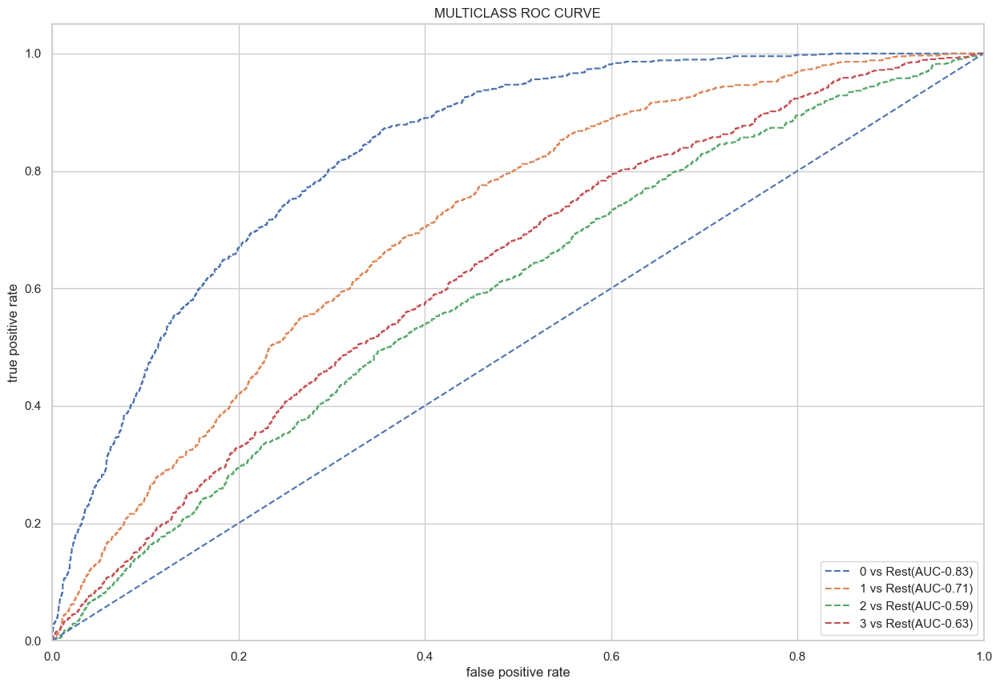

Average AUC score: 0.689737486247761


In [ ]:
RF = OneVsRestClassifier(LogisticRegression(multi_class='ovr',solver='sag'))
RF.fit(xtrain,ytrain)
ypred=RF.predict(xtest)
ypred_proba=RF.predict_proba(xtest)
ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)


# Decision tree classifier

Model Name DECISION TREE




Accuracy score:  0.3456293315448245


precision score:  0.34347184982864615


recall score:  0.3456293315448245


f1 score:  0.34449225286689117


classification report: 
               precision    recall  f1-score   support

           0       0.42      0.42      0.42       866
           1       0.28      0.28      0.28       856
           2       0.23      0.22      0.22       854
           3       0.24      0.24      0.24       822
           4       0.50      0.52      0.51      1075

    accuracy                           0.35      4473
   macro avg       0.33      0.34      0.33      4473
weighted avg       0.34      0.35      0.34      4473



Confusion matrix: 




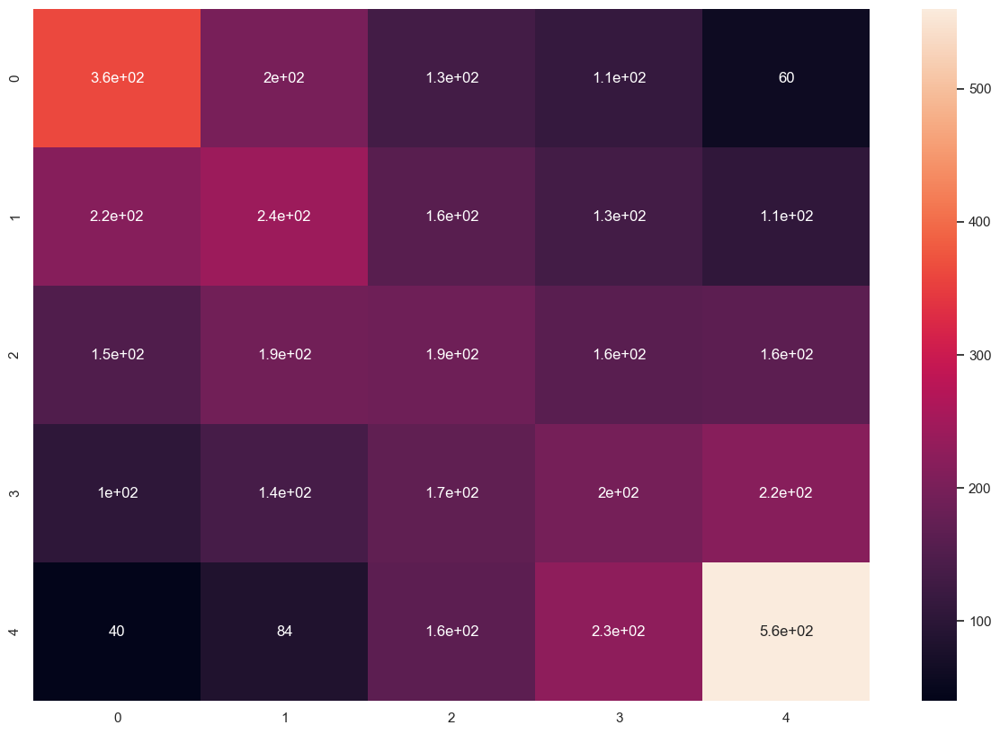

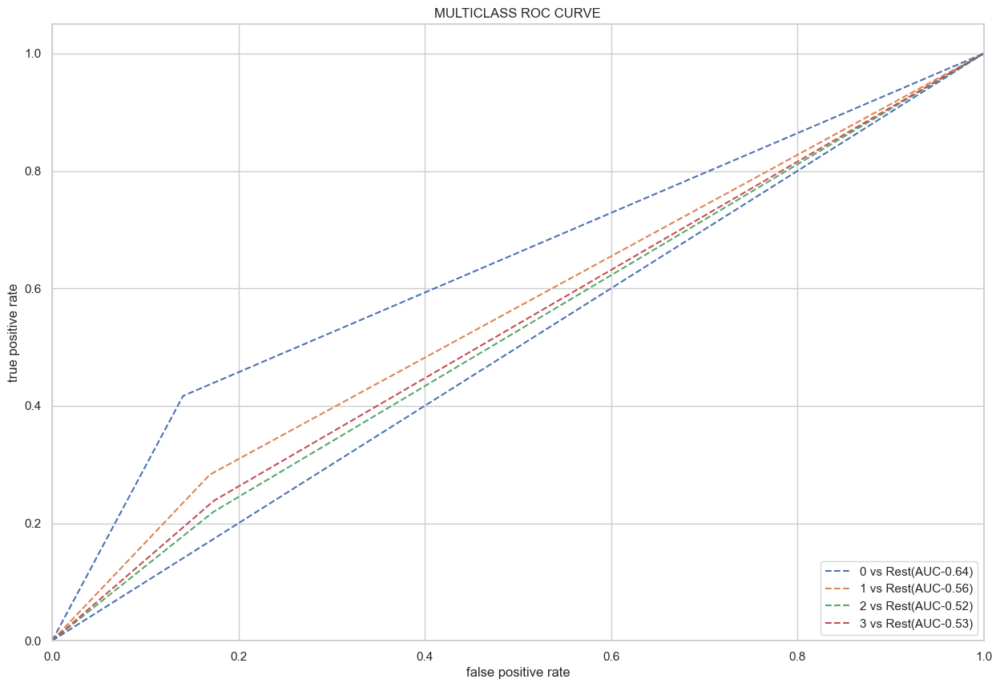

Average AUC score: 0.5626087584282258


In [ ]:
dt=DecisionTreeClassifier().fit(xtrain,ytrain)
dt
ypred=dt.predict(xtest)
ypred_proba=dt.predict_proba(xtest)

metric_score(ytest,ypred,ypred_proba,'DECISION TREE')
ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)


# Random forest classifier

Model Name RANDOM FOREST




Accuracy score:  0.4164989939637827


precision score:  0.3902076578502611


recall score:  0.4164989939637827


f1 score:  0.39681112293705384


classification report: 
               precision    recall  f1-score   support

           0       0.47      0.56      0.51       866
           1       0.34      0.32      0.33       856
           2       0.29      0.21      0.24       854
           3       0.28      0.20      0.23       822
           4       0.53      0.71      0.61      1075

    accuracy                           0.42      4473
   macro avg       0.38      0.40      0.38      4473
weighted avg       0.39      0.42      0.40      4473



Confusion matrix: 




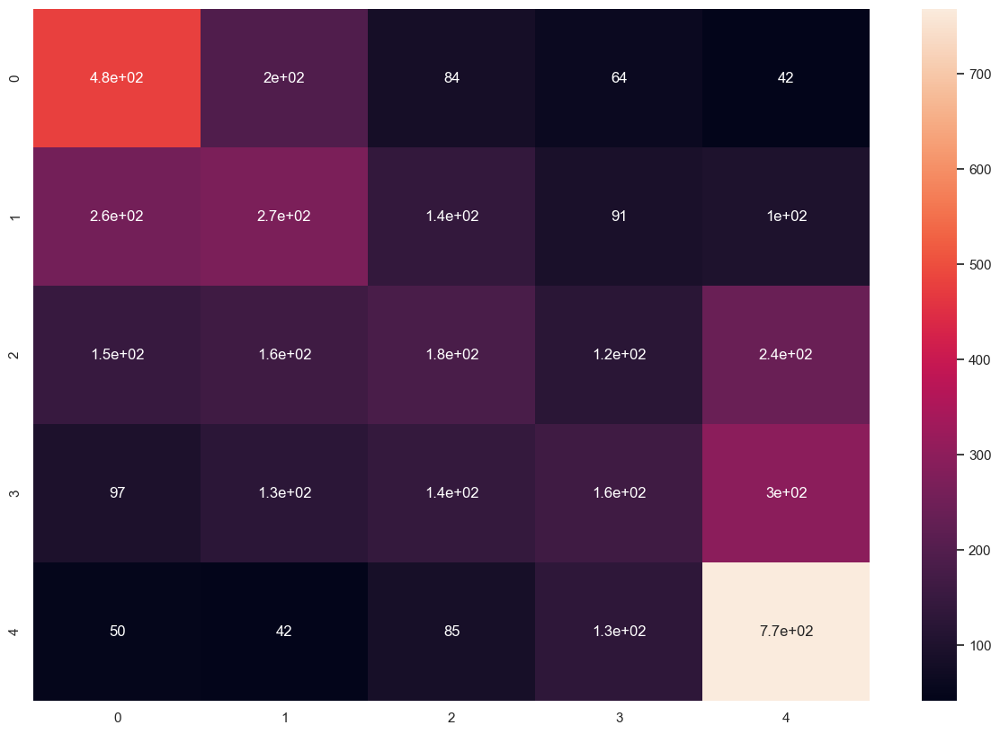

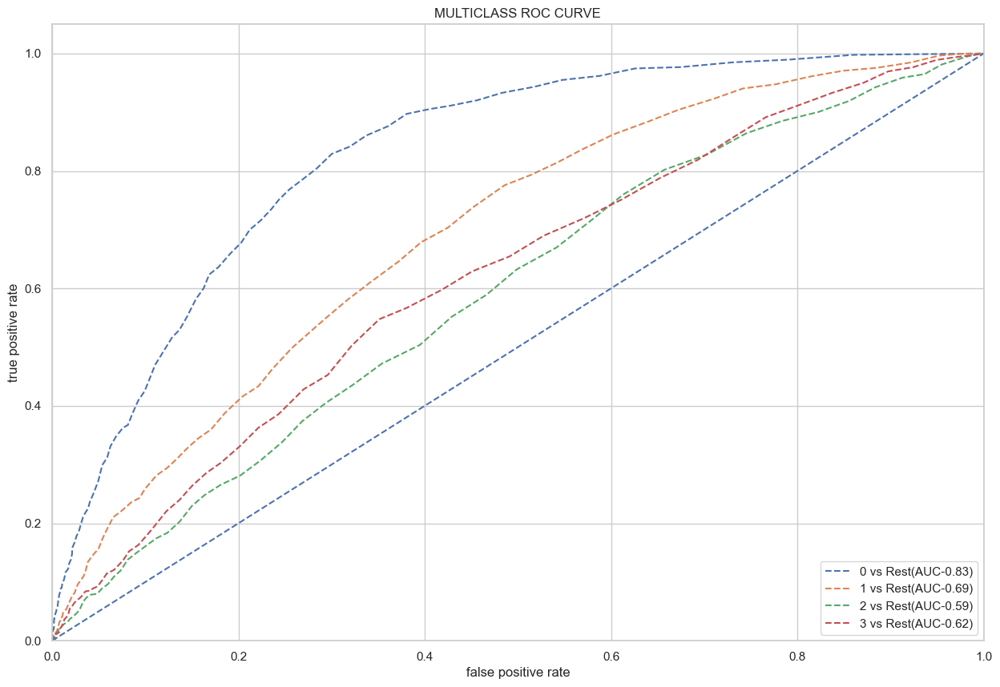

Average AUC score: 0.6835333887181676


In [ ]:
rf=RandomForestClassifier().fit(xtrain,ytrain)
rf

ypred=rf.predict(xtest)
ypred_proba=rf.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'RANDOM FOREST')
ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)


# Adaboost classifier

Model Name ADA BOOST CLASSIFIER




Accuracy score:  0.41582830315224684


precision score:  0.3779752223198147


recall score:  0.41582830315224684


f1 score:  0.3832284373151116


classification report: 
               precision    recall  f1-score   support

           0       0.44      0.63      0.52       866
           1       0.35      0.32      0.33       856
           2       0.25      0.12      0.16       854
           3       0.29      0.19      0.23       822
           4       0.52      0.73      0.61      1075

    accuracy                           0.42      4473
   macro avg       0.37      0.40      0.37      4473
weighted avg       0.38      0.42      0.38      4473



Confusion matrix: 




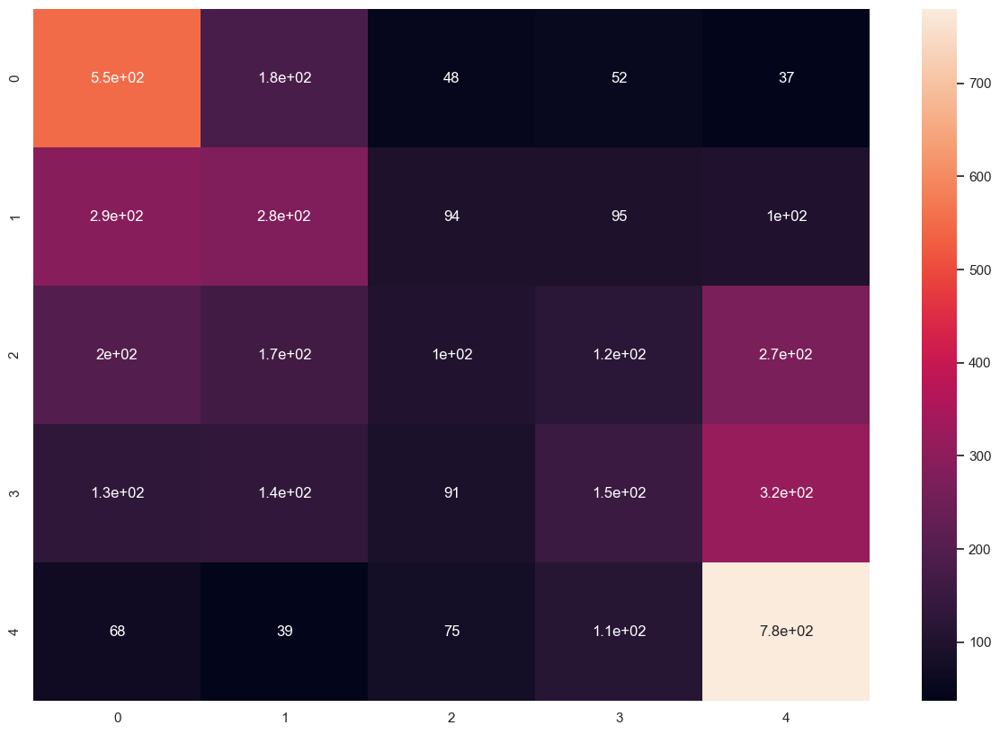

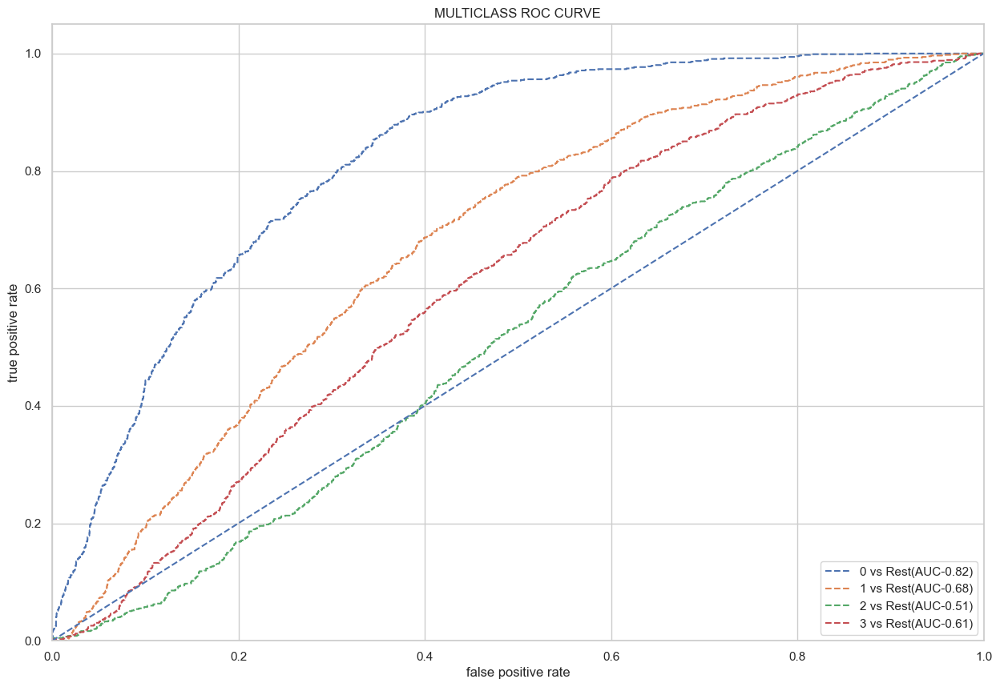

Average AUC score: 0.655541633771729


In [ ]:
abc=AdaBoostClassifier().fit(xtrain,ytrain)
abc
ypred=abc.predict(xtest)
ypred_proba=abc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'ADA BOOST CLASSIFIER')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)


# Bagging classifier

Model Name BAGGING CLASSIFIER




Accuracy score:  0.39145987033310975


precision score:  0.37962123103726425


recall score:  0.39145987033310975


f1 score:  0.3832818716862465


classification report: 
               precision    recall  f1-score   support

           0       0.44      0.57      0.50       866
           1       0.31      0.31      0.31       856
           2       0.25      0.22      0.23       854
           3       0.27      0.22      0.24       822
           4       0.57      0.58      0.57      1075

    accuracy                           0.39      4473
   macro avg       0.37      0.38      0.37      4473
weighted avg       0.38      0.39      0.38      4473



Confusion matrix: 




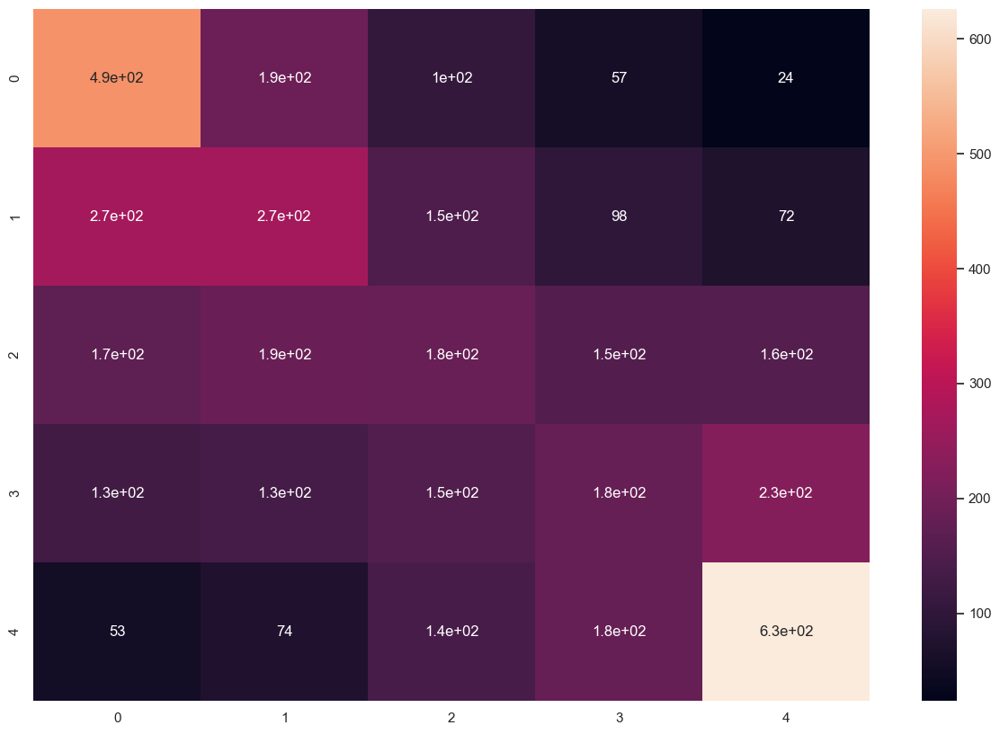

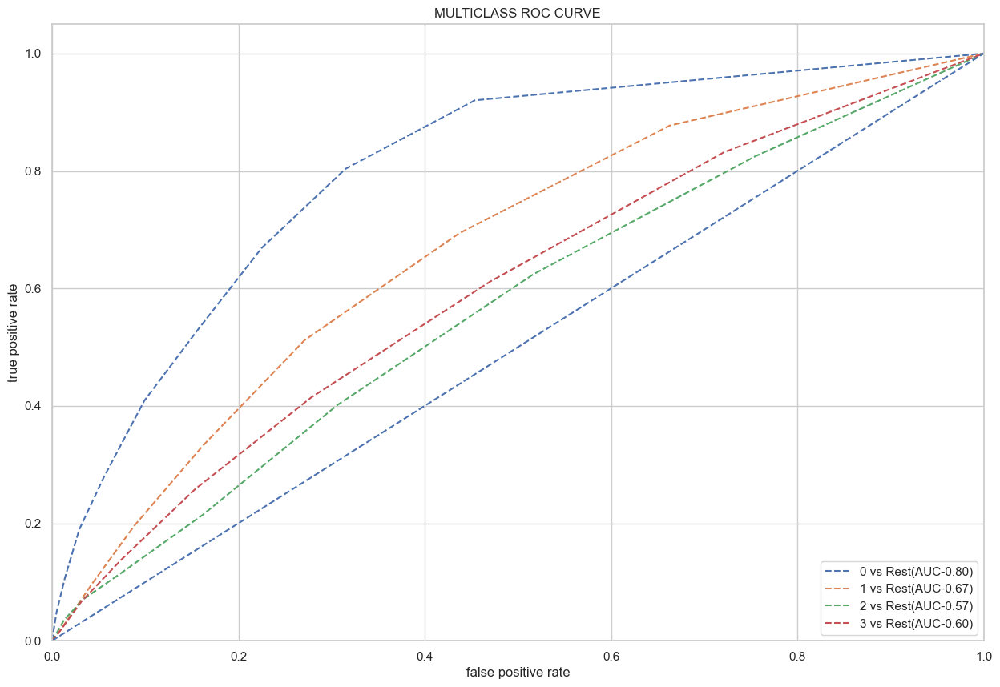

Average AUC score: 0.6592457457273582


In [ ]:

bc=BaggingClassifier().fit(xtrain,ytrain)
bc
ypred=bc.predict(xtest)
ypred_proba=bc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'BAGGING CLASSIFIER')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)



# Gradient boosting classifier

Model Name GRADIENT BOOSTING CLASSIFIER




Accuracy score:  0.43639615470601384


precision score:  0.3946753023024612


recall score:  0.43639615470601384


f1 score:  0.39612543827940316


classification report: 
               precision    recall  f1-score   support

           0       0.47      0.70      0.56       866
           1       0.36      0.38      0.37       856
           2       0.28      0.12      0.16       854
           3       0.30      0.15      0.20       822
           4       0.53      0.74      0.62      1075

    accuracy                           0.44      4473
   macro avg       0.39      0.42      0.38      4473
weighted avg       0.39      0.44      0.40      4473



Confusion matrix: 




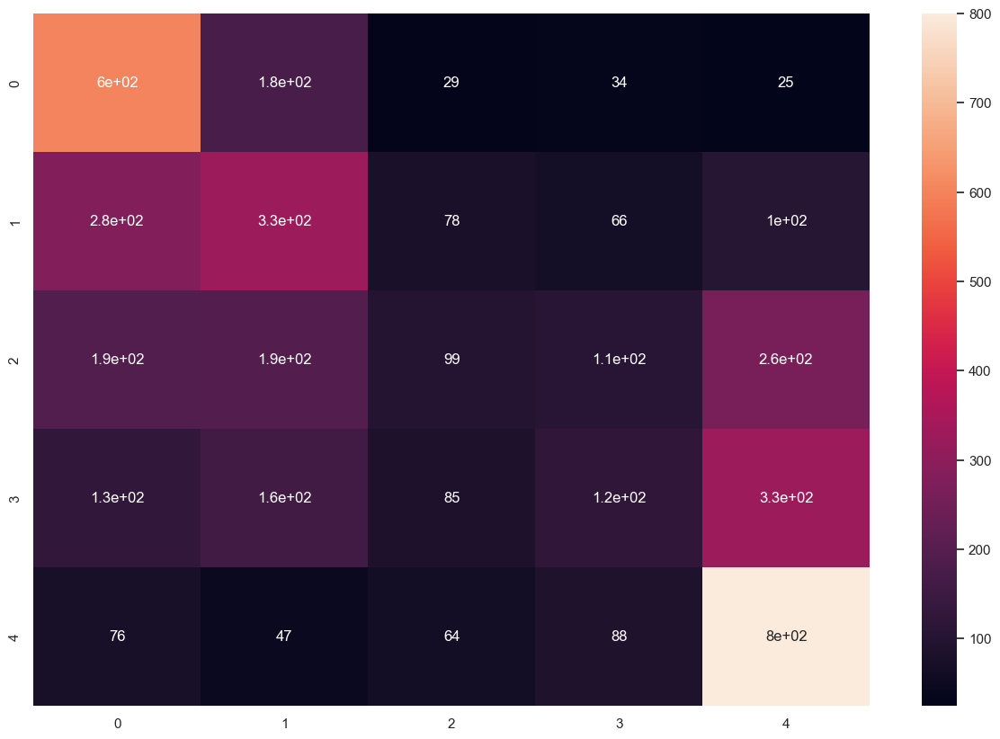

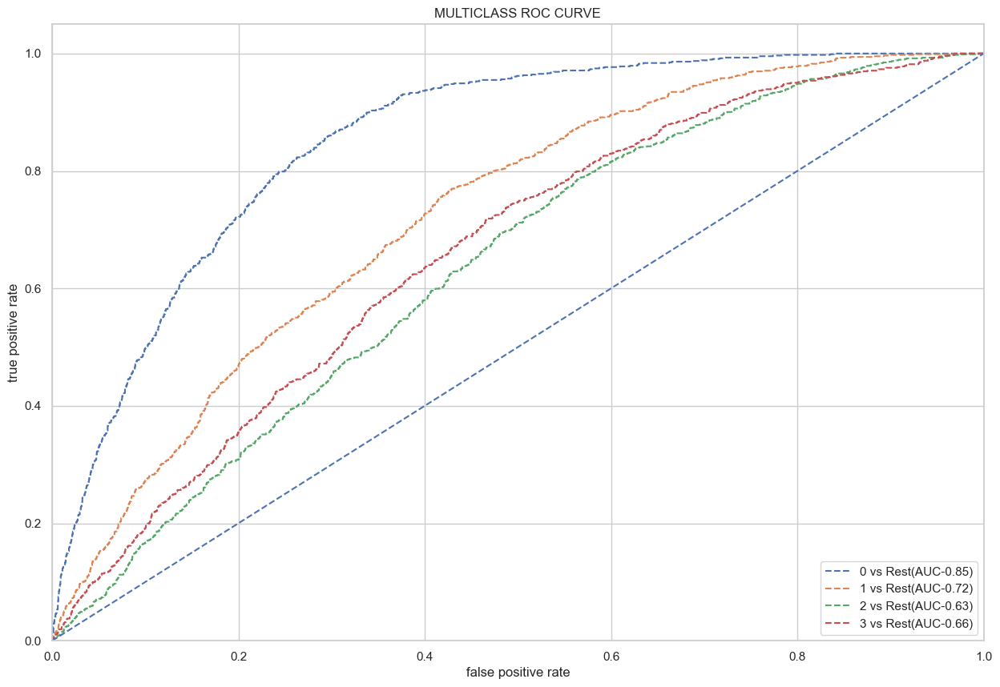

Average AUC score: 0.7170545239560852


In [ ]:

gbc=GradientBoostingClassifier().fit(xtrain,ytrain)
gbc
ypred=gbc.predict(xtest)
ypred_proba=gbc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'GRADIENT BOOSTING CLASSIFIER')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)


# XGBoost classifier

Model Name XGBOOST




Accuracy score:  0.42946568298680976


precision score:  0.4006995754356713


recall score:  0.42946568298680976


f1 score:  0.4077902224733937


classification report: 
               precision    recall  f1-score   support

           0       0.50      0.64      0.56       866
           1       0.34      0.36      0.35       856
           2       0.28      0.17      0.21       854
           3       0.29      0.20      0.24       822
           4       0.55      0.69      0.62      1075

    accuracy                           0.43      4473
   macro avg       0.39      0.41      0.40      4473
weighted avg       0.40      0.43      0.41      4473



Confusion matrix: 




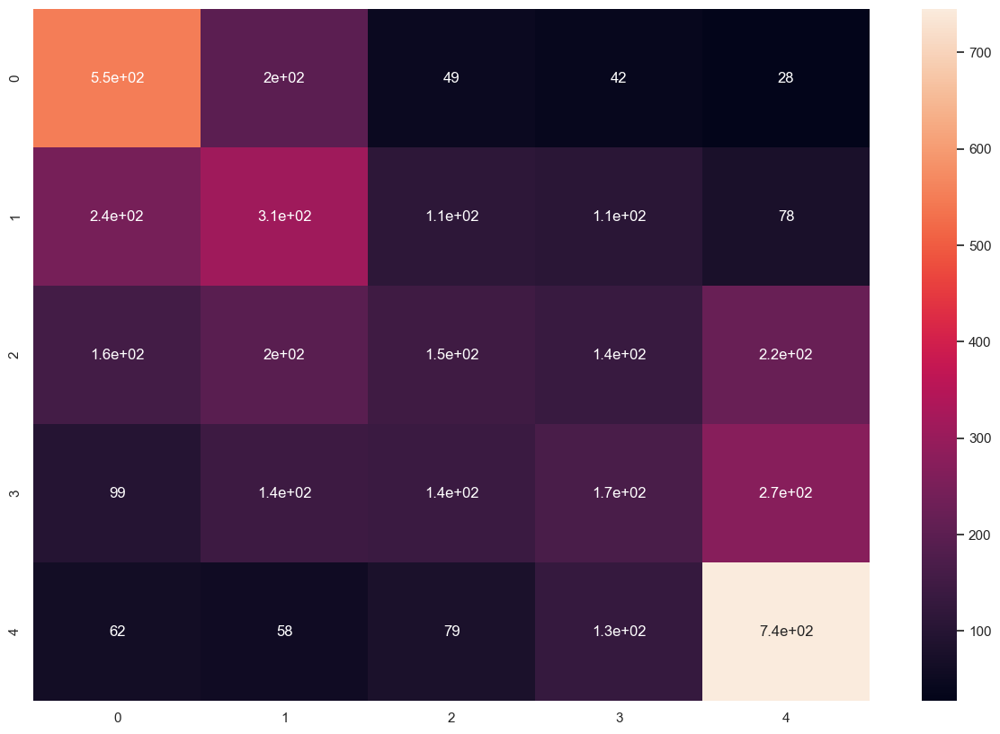

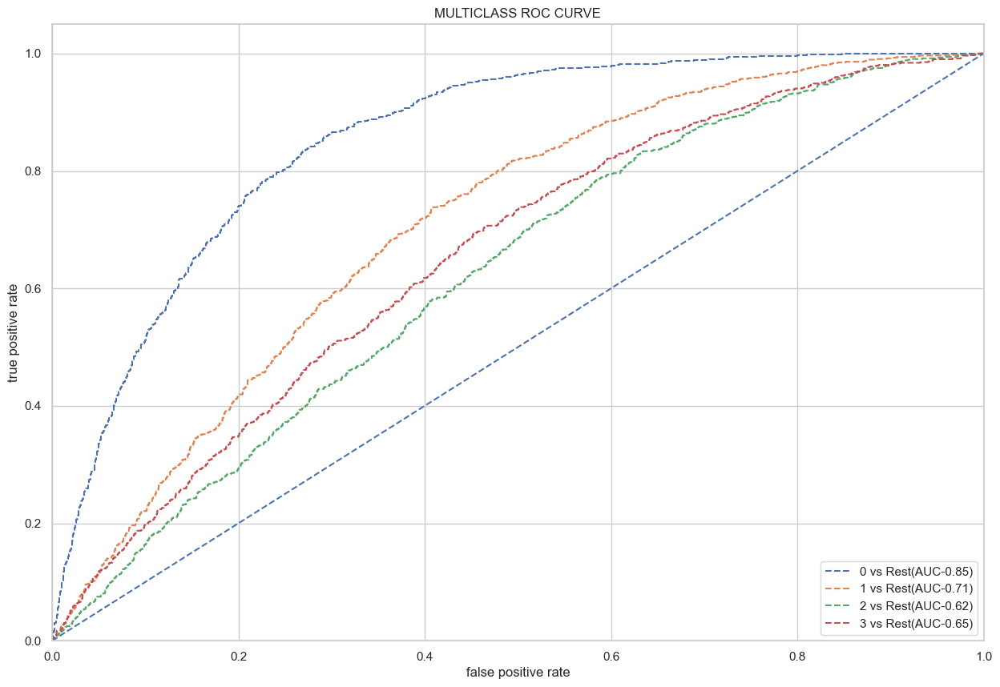

Average AUC score: 0.7094837207446313


In [ ]:

xgbc=XGBClassifier().fit(xtrain,ytrain)
xgbc
ypred=xgbc.predict(xtest)
ypred_proba=xgbc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'XGBOOST')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

# Light gbm model


In [ ]:
train_data=lgb.Dataset(xtrain,label=ytrain)
test_data=lgb.Dataset(xtest,label=ytest)

In [ ]:
parameters={
    'objective': 'multiclass',
    'num_class':5,
    'metric':'multi_logloss',
    'is_unbalance':'true',
    'boosting':'gbdt',
    'num_leaves':64,
    'feature_fraction':0.5,
    'bagging_fraction':0.5,
    'bagging_freq':20,
    'learning_rate':0.01,
    'verbose': -1

}

In [ ]:
model_lgbm=lgb.train(parameters,
                     train_data,
                     valid_sets=test_data,
                     num_boost_round=5000,
                     early_stopping_rounds=50)          

[1]	valid_0's multi_logloss: 1.59957
Training until validation scores don't improve for 50 rounds
[2]	valid_0's multi_logloss: 1.59632
[3]	valid_0's multi_logloss: 1.59426
[4]	valid_0's multi_logloss: 1.58936
[5]	valid_0's multi_logloss: 1.58481
[6]	valid_0's multi_logloss: 1.58261
[7]	valid_0's multi_logloss: 1.57937
[8]	valid_0's multi_logloss: 1.57686
[9]	valid_0's multi_logloss: 1.57259
[10]	valid_0's multi_logloss: 1.56839
[11]	valid_0's multi_logloss: 1.5661
[12]	valid_0's multi_logloss: 1.56326
[13]	valid_0's multi_logloss: 1.55992
[14]	valid_0's multi_logloss: 1.55705
[15]	valid_0's multi_logloss: 1.55297
[16]	valid_0's multi_logloss: 1.55131
[17]	valid_0's multi_logloss: 1.54884
[18]	valid_0's multi_logloss: 1.54564
[19]	valid_0's multi_logloss: 1.54171
[20]	valid_0's multi_logloss: 1.54013
[21]	valid_0's multi_logloss: 1.53756
[22]	valid_0's multi_logloss: 1.53383
[23]	valid_0's multi_logloss: 1.53104
[24]	valid_0's multi_logloss: 1.52844
[25]	valid_0's multi_logloss: 1.52645

[219]	valid_0's multi_logloss: 1.33026
[220]	valid_0's multi_logloss: 1.3298
[221]	valid_0's multi_logloss: 1.32975
[222]	valid_0's multi_logloss: 1.32934
[223]	valid_0's multi_logloss: 1.32879
[224]	valid_0's multi_logloss: 1.32826
[225]	valid_0's multi_logloss: 1.32807
[226]	valid_0's multi_logloss: 1.32776
[227]	valid_0's multi_logloss: 1.32759
[228]	valid_0's multi_logloss: 1.32723
[229]	valid_0's multi_logloss: 1.32672
[230]	valid_0's multi_logloss: 1.32647
[231]	valid_0's multi_logloss: 1.32635
[232]	valid_0's multi_logloss: 1.32604
[233]	valid_0's multi_logloss: 1.3256
[234]	valid_0's multi_logloss: 1.32542
[235]	valid_0's multi_logloss: 1.32513
[236]	valid_0's multi_logloss: 1.32465
[237]	valid_0's multi_logloss: 1.32416
[238]	valid_0's multi_logloss: 1.32381
[239]	valid_0's multi_logloss: 1.32329
[240]	valid_0's multi_logloss: 1.32314
[241]	valid_0's multi_logloss: 1.32287
[242]	valid_0's multi_logloss: 1.32255
[243]	valid_0's multi_logloss: 1.32226
[244]	valid_0's multi_loglo

[442]	valid_0's multi_logloss: 1.29304
[443]	valid_0's multi_logloss: 1.29303
[444]	valid_0's multi_logloss: 1.29293
[445]	valid_0's multi_logloss: 1.29295
[446]	valid_0's multi_logloss: 1.29294
[447]	valid_0's multi_logloss: 1.29289
[448]	valid_0's multi_logloss: 1.2928
[449]	valid_0's multi_logloss: 1.29267
[450]	valid_0's multi_logloss: 1.29263
[451]	valid_0's multi_logloss: 1.29256
[452]	valid_0's multi_logloss: 1.29245
[453]	valid_0's multi_logloss: 1.29237
[454]	valid_0's multi_logloss: 1.29223
[455]	valid_0's multi_logloss: 1.29222
[456]	valid_0's multi_logloss: 1.29219
[457]	valid_0's multi_logloss: 1.2921
[458]	valid_0's multi_logloss: 1.29192
[459]	valid_0's multi_logloss: 1.29189
[460]	valid_0's multi_logloss: 1.29192
[461]	valid_0's multi_logloss: 1.29178
[462]	valid_0's multi_logloss: 1.29174
[463]	valid_0's multi_logloss: 1.29167
[464]	valid_0's multi_logloss: 1.29161
[465]	valid_0's multi_logloss: 1.2915
[466]	valid_0's multi_logloss: 1.29137
[467]	valid_0's multi_loglos

[654]	valid_0's multi_logloss: 1.28648
[655]	valid_0's multi_logloss: 1.28649
[656]	valid_0's multi_logloss: 1.28651
[657]	valid_0's multi_logloss: 1.2865
[658]	valid_0's multi_logloss: 1.28653
[659]	valid_0's multi_logloss: 1.28647
[660]	valid_0's multi_logloss: 1.28647
[661]	valid_0's multi_logloss: 1.28656
[662]	valid_0's multi_logloss: 1.28655
[663]	valid_0's multi_logloss: 1.28651
[664]	valid_0's multi_logloss: 1.2865
[665]	valid_0's multi_logloss: 1.28655
[666]	valid_0's multi_logloss: 1.28656
[667]	valid_0's multi_logloss: 1.28652
[668]	valid_0's multi_logloss: 1.28647
[669]	valid_0's multi_logloss: 1.28646
[670]	valid_0's multi_logloss: 1.28642
[671]	valid_0's multi_logloss: 1.28643
[672]	valid_0's multi_logloss: 1.28646
[673]	valid_0's multi_logloss: 1.28644
[674]	valid_0's multi_logloss: 1.28645
[675]	valid_0's multi_logloss: 1.28644
[676]	valid_0's multi_logloss: 1.28646
[677]	valid_0's multi_logloss: 1.28648
[678]	valid_0's multi_logloss: 1.28651
[679]	valid_0's multi_loglo

In [ ]:
ytrain_pred=model_lgbm.predict(xtrain)
ytest_pred=model_lgbm.predict(xtest)
ytrain_pred = [list(x).index(max(x)) for x in ytrain_pred]

ytest_pred = [list(x).index(max(x)) for x in ytest_pred]

In [ ]:
metrics.accuracy_score(ytrain,ytrain_pred)

0.649932915921288

In [ ]:
metrics.accuracy_score(ytest,ytest_pred)

0.4379610999329309

Model Name: LIGHT GBM




Accuracy score:  0.42946568298680976


precision score:  0.4006995754356713


recall score:  0.42946568298680976


f1 score:  0.4077902224733937


classification report: 
               precision    recall  f1-score   support

           0       0.50      0.64      0.56       866
           1       0.34      0.36      0.35       856
           2       0.28      0.17      0.21       854
           3       0.29      0.20      0.24       822
           4       0.55      0.69      0.62      1075

    accuracy                           0.43      4473
   macro avg       0.39      0.41      0.40      4473
weighted avg       0.40      0.43      0.41      4473



Confusion matrix: 




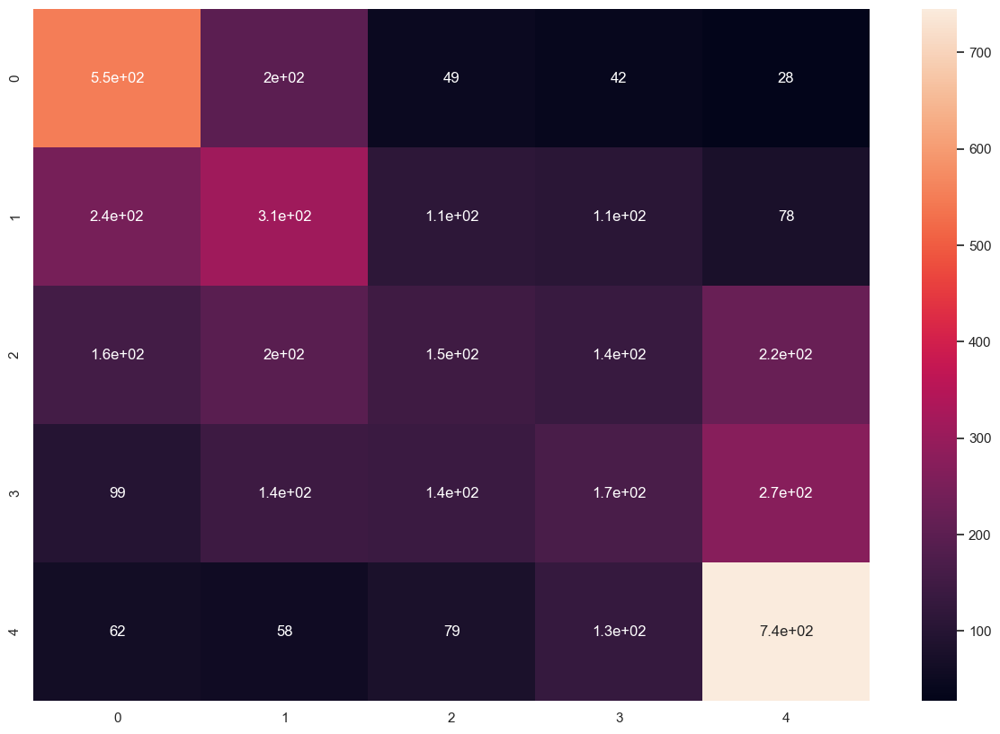

In [ ]:
print('Model Name: LIGHT GBM')
print('\n\n\n')
print('Accuracy score: ', metrics.accuracy_score(ytest,ypred))
print('\n')
print('precision score: ',metrics.precision_score(ytest,ypred,average='weighted'))
print('\n')
print('recall score: ',metrics.recall_score(ytest,ypred,average='weighted'))
print('\n')
print('f1 score: ',metrics.f1_score(ytest,ypred,average='weighted'))
print('\n')
print('classification report: \n',metrics.classification_report(ytest,ypred))
print('\n')
print('Confusion matrix: ')
print('\n')
cm=metrics.confusion_matrix(ytest,ypred)
sns.heatmap(cm,annot=True)
plt.show()

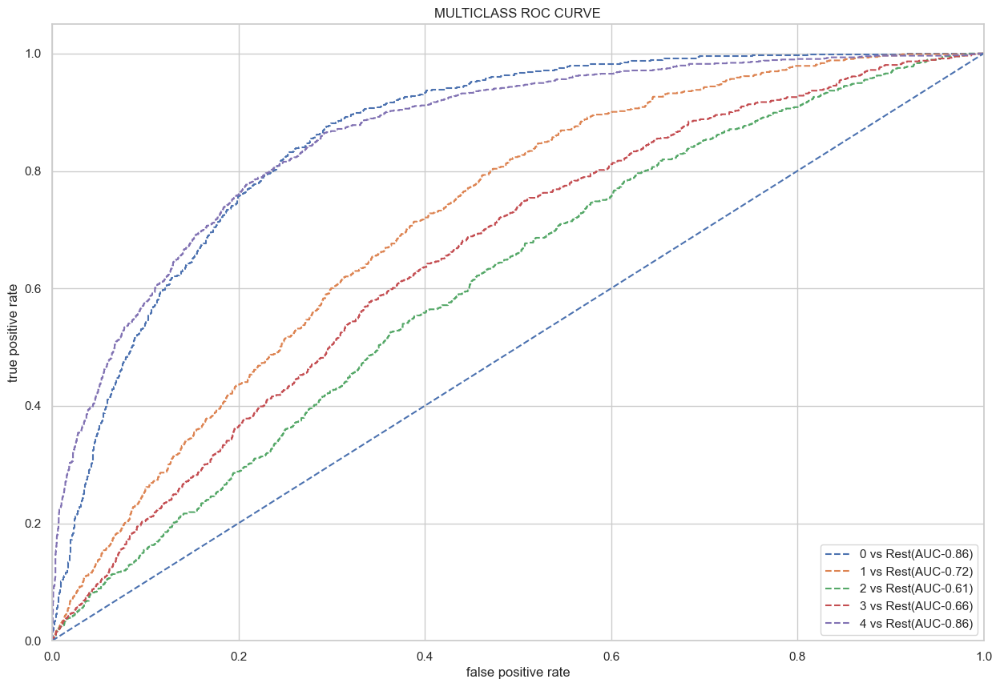

Average AUC score: 0.7411396381133313


In [ ]:
ypred_proba = model_lgbm.predict(xtest, raw_score=True)

ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3,4]
n_classes = 5

for i in range(n_classes):
    fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
    roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
    plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3]+roc_auc[4])/5)

# Hyperparameter tuning for undersampling data

**RandomForest**

In [ ]:

params={
    'n_estimators':[100,200,300],
    'criterion':['gini','entropy'],
    'max_features':['auto','sqrt','log2']
}

In [ ]:
gs=GridSearchCV(estimator=rf, param_grid=params, cv=5)
gs.fit(xtrain, ytrain)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 200, 300]})

In [ ]:
gs.best_params_

{'criterion': 'gini', 'max_features': 'auto', 'n_estimators': 300}

In [ ]:
gs.best_estimator_

RandomForestClassifier(n_estimators=300)

Model Name RANDOM FOREST




Accuracy score:  0.4214173932483792


precision score:  0.39295573011521834


recall score:  0.4214173932483792


f1 score:  0.3996945393042779


classification report: 
               precision    recall  f1-score   support

           0       0.47      0.57      0.52       866
           1       0.35      0.33      0.34       856
           2       0.28      0.20      0.24       854
           3       0.29      0.19      0.23       822
           4       0.53      0.73      0.61      1075

    accuracy                           0.42      4473
   macro avg       0.38      0.40      0.39      4473
weighted avg       0.39      0.42      0.40      4473



Confusion matrix: 




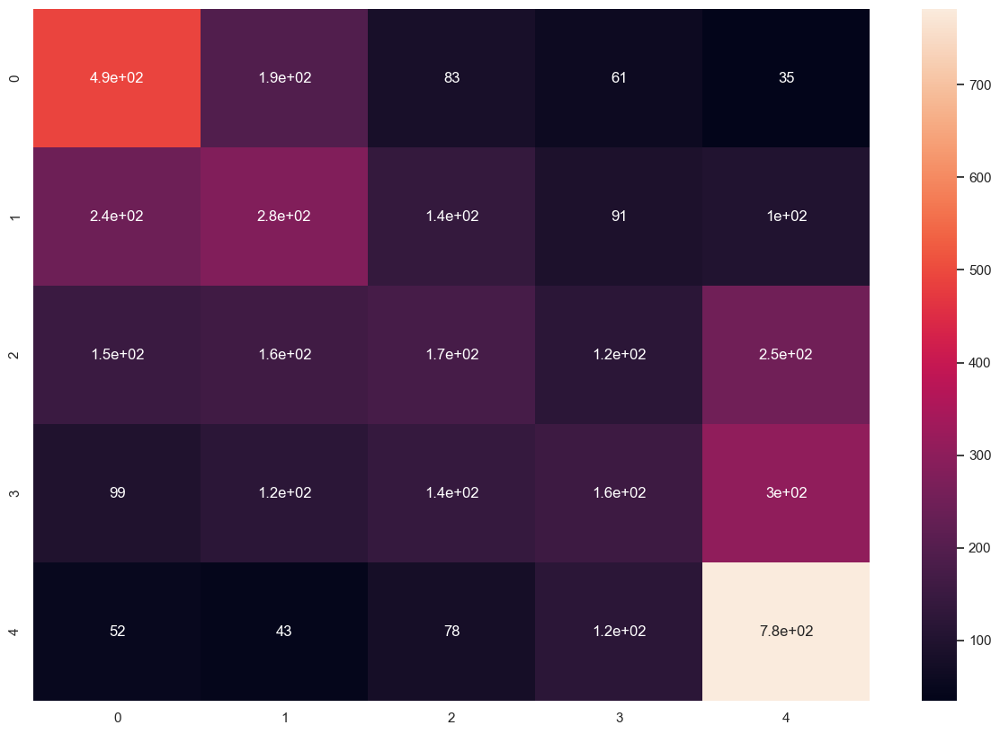

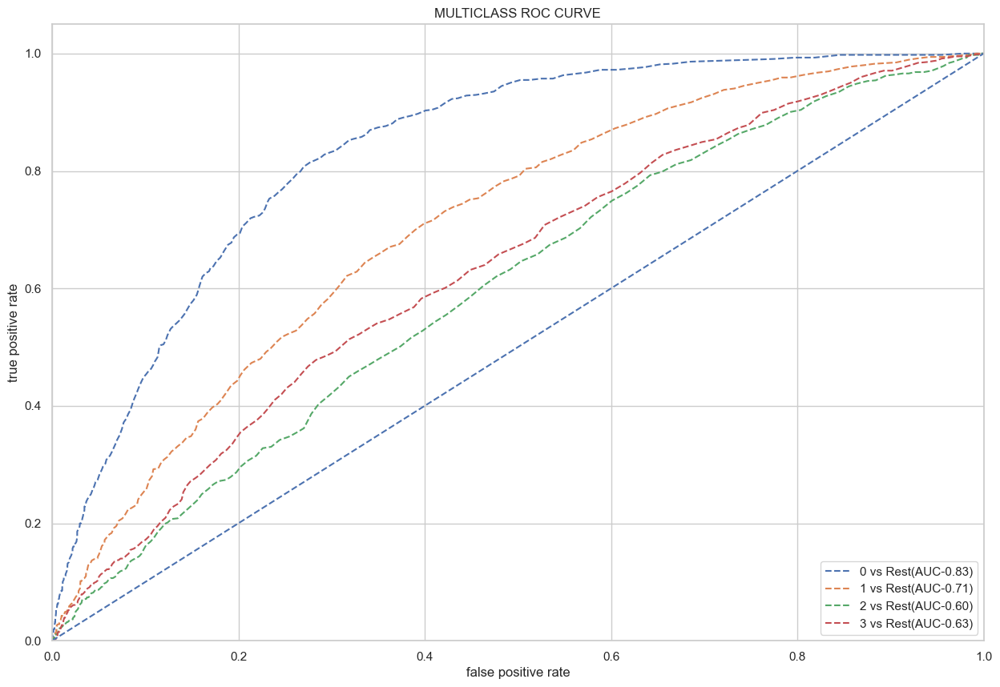

Average AUC score: 0.6930132521682637


In [ ]:
rf=RandomForestClassifier(criterion='gini',max_features='auto',n_estimators=300).fit(xtrain,ytrain)
rf

ypred=rf.predict(xtest)
ypred_proba=rf.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'RANDOM FOREST')
ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)


**XGBoost classifier**

In [ ]:

params={
    'max_depth':[3,4,5],
    'learning_rate':[0.1,0.5,1.0],
    'n_estimators':[50,200,500]
}

In [ ]:
gs=GridSearchCV(estimator=xgbc, param_grid=params, cv=5, scoring='accuracy')
gs.fit(xtrain, ytrain)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=Non

In [ ]:
print(gs.best_estimator_)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=50, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)


Model Name XGBOOST




Accuracy score:  0.43930248155600266


precision score:  0.41002296196736937


recall score:  0.43930248155600266


f1 score:  0.41210904194094367


classification report: 
               precision    recall  f1-score   support

           0       0.48      0.66      0.56       866
           1       0.36      0.37      0.37       856
           2       0.33      0.17      0.23       854
           3       0.31      0.19      0.24       822
           4       0.54      0.71      0.61      1075

    accuracy                           0.44      4473
   macro avg       0.40      0.42      0.40      4473
weighted avg       0.41      0.44      0.41      4473



Confusion matrix: 




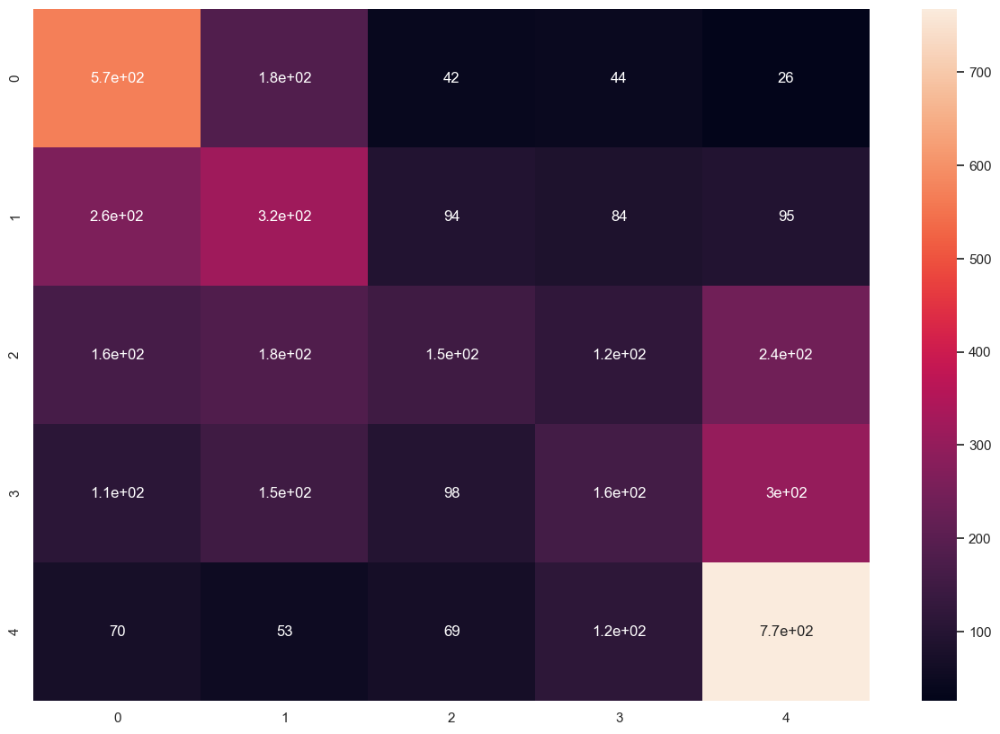

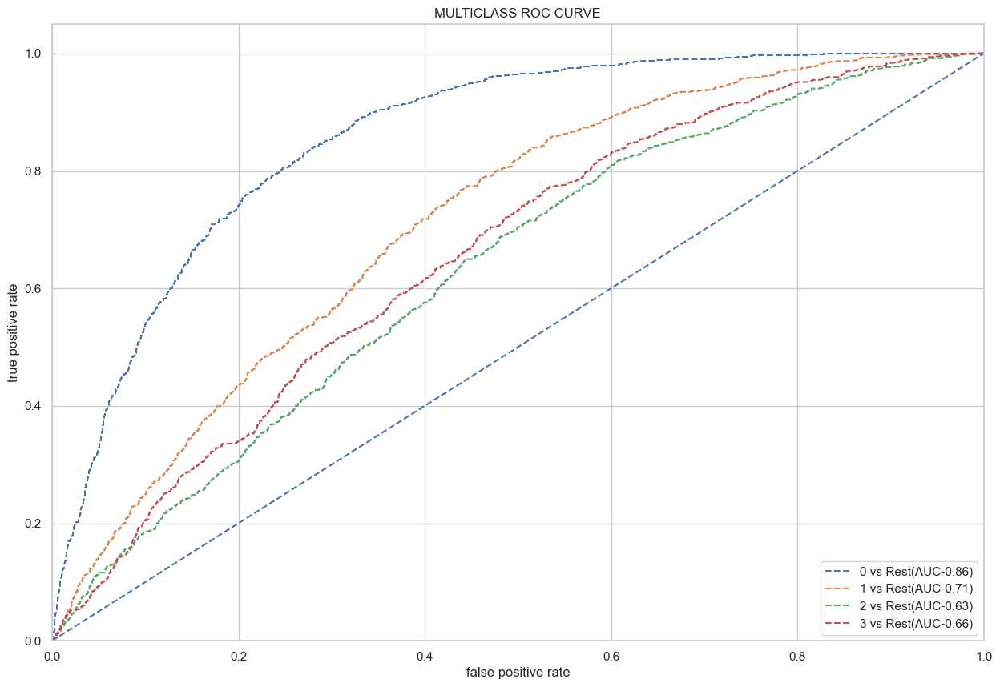

Average AUC score: 0.7148335513897628


In [ ]:

xgbc=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=np.nan, monotone_constraints=None,
              n_estimators=50, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None).fit(xtrain,ytrain)
xgbc
ypred=xgbc.predict(xtest)
ypred_proba=xgbc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'XGBOOST')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)

### After analysing the undersampling models and overall dataset model. The performance of overall dataset model was better than the undersampling models.From the overall dataset model, XGBoost classifier gets the better performance. 

# Final model

Model Name XGBOOST




Accuracy score:  0.522100491122025


precision score:  0.5174344473294143


recall score:  0.522100491122025


f1 score:  0.4935763652978769


classification report: 
               precision    recall  f1-score   support

           0       0.53      0.69      0.60     17529
           1       0.46      0.53      0.49     15001
           2       0.48      0.13      0.20     11219
           3       0.63      0.66      0.65      9191

    accuracy                           0.52     52940
   macro avg       0.53      0.50      0.49     52940
weighted avg       0.52      0.52      0.49     52940



Confusion matrix: 




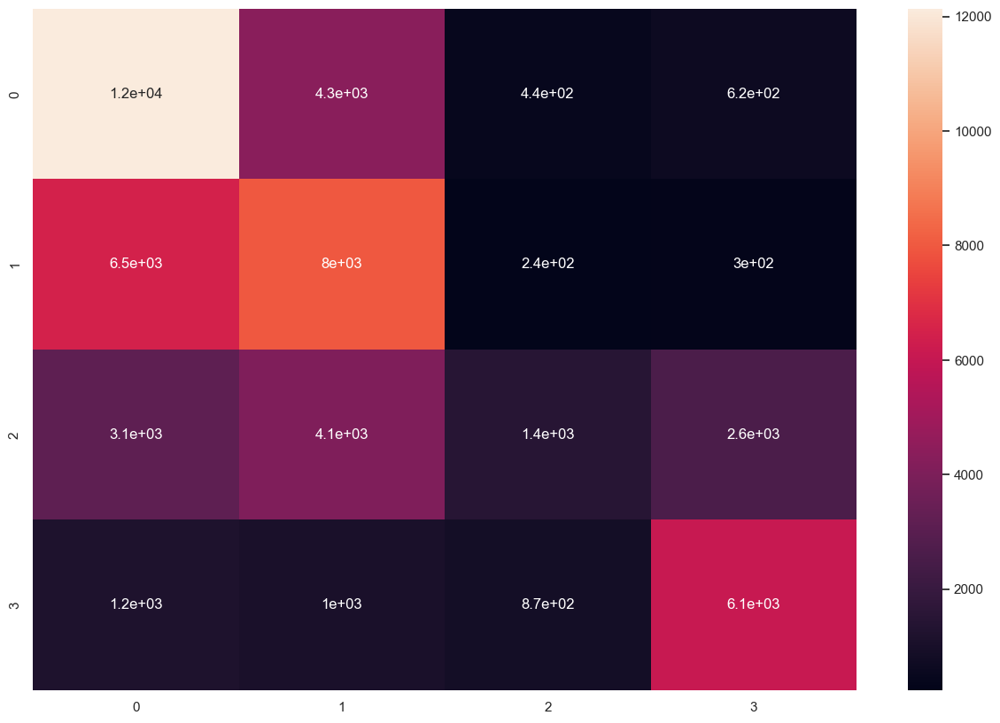

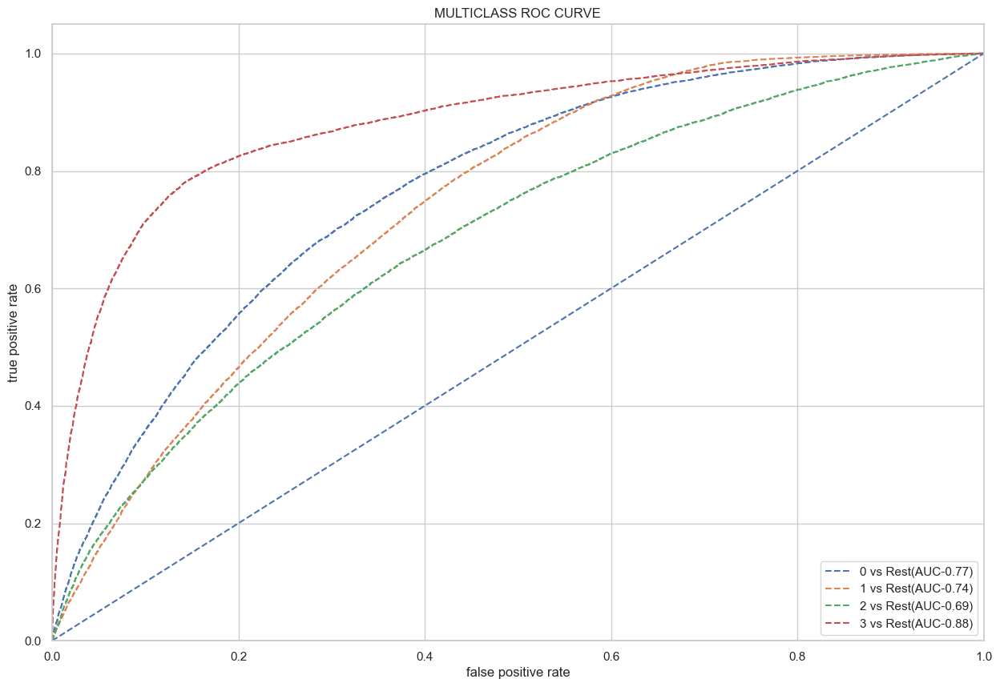

Average AUC score: 0.7686778128152348


In [ ]:

xgbc=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=np.nan, monotone_constraints=None,
              n_estimators=50, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None).fit(xtrain,ytrain)
xgbc
ypred=xgbc.predict(xtest)
ypred_proba=xgbc.predict_proba(xtest)
metric_score(ytest,ypred,ypred_proba,'XGBOOST')


ytest_binarized= label_binarize(ytest,classes=np.unique(ytest))

# roc curve for classes

fpr={}
tpr={}
thresh={}
roc_auc=dict()

classes=[0,1,2,3]
n_classes = 4

for i in range(n_classes):
  fpr[i],tpr[i],thresh[i] = metrics.roc_curve(ytest_binarized[:,i],ypred_proba[:,i])
  roc_auc[i] = metrics.auc(fpr[i],tpr[i])

  # plotting
  plt.plot(fpr[i],tpr[i], linestyle='--',
           label='%s vs Rest(AUC-%0.2f)'%(classes[i],roc_auc[i]))
  
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('MULTICLASS ROC CURVE')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='lower right')
plt.show()
print('Average AUC score:',(roc_auc[0]+roc_auc[1]+roc_auc[2]+roc_auc[3])/4)